In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install scipy
!pip install pandas
!pip install scikit-learn
!pip install seaborn

In [ ]:
# @title Librerie
import matplotlib.pyplot as plt
import scipy.io
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
import matplotlib as mpl
import scipy.io as sio
import matplotlib.pyplot as plt
import os
from scipy.io import loadmat
import csv
import scipy.signal as signal
import tensorflow as tf
from scipy.signal import butter, filtfilt
import tensorflow.compat.v1 as tf
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Masking
from tensorflow.keras.preprocessing.sequence import pad_sequences
# Parameters

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [ ]:
folder_path = '/content/drive/MyDrive/CORSO PROGETTO/DB2'

In [ ]:
!git clone https://github.com/SuperBruceJia/EEG-DL.git
%cd EEG-DL
from Models.DatasetAPI.DataLoader import DatasetLoader
from Models.Network.GRU import GRU
from Models.Loss_Function.Loss import loss
from Models.Evaluation_Metrics.Metrics import evaluation

Cloning into 'EEG-DL'...
remote: Enumerating objects: 428, done.
remote: Counting objects: 100% (243/243), done.
remote: Compressing objects: 100% (138/138), done.
remote: Total 428 (delta 150), reused 193 (delta 104), pack-reused 185 (from 1)
Receiving objects: 100% (428/428), 660.23 KiB | 9.71 MiB/s, done.
Resolving deltas: 100% (238/238), done.
/content/EEG-DL


In [ ]:
%cd '/content/drive/MyDrive/CORSO PROGETTO/DB2'

/content/drive/MyDrive/CORSO PROGETTO/DB2


# Dataset Cut


In [ ]:
def print_movement_categories(mat_file):
    """
    Prints the categories in the movement variable (e.g., stimulus) from a MATLAB file.

    Parameters:
    - mat_file: str, path to the .mat file containing the EMG data.
    """
    # Load the data
    data = loadmat(mat_file)

    # Extract the stimulus or movement variable
    if 'stimulus' in data:
        movement_variable = data['stimulus'].flatten()
    elif 'movement' in data:
        movement_variable = data['movement'].flatten()
    else:
        print("No valid movement variable (stimulus or movement) found in the .mat file.")
        return

    # Get unique movement categories and their counts
    unique_movements, counts = np.unique(movement_variable, return_counts=True)

    # Print the categories and their counts
    print("Movement Categories and Counts:")
    for movement, count in zip(unique_movements, counts):
        print(f"Movement {int(movement)}: {count} occurrences")

# Example usage
print_movement_categories('/content/drive/MyDrive/CORSO PROGETTO/DB2/s2/S2_E1_A1.mat')

#1-17
#18-40
#41-49

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/CORSO PROGETTO/DB2/s2/S2_E1_A1.mat'

In [ ]:

def filter_matlab_variables_in_place(mat_file):

    # Load the .mat file
    data = sio.loadmat(mat_file)

    # Specify the variables to keep
    variables_to_keep = ['emg', 'exercise', 'repetition', 'rerepetition', 'stimulus', 'restimulus', 'subject']

    # Filter the variables
    filtered_data = {var: data[var] for var in variables_to_keep if var in data}

    # Save the filtered data back to the same file
    sio.savemat(mat_file, filtered_data)
    print(f"File '{mat_file}' has been updated with only the specified variables.")

def filter_matlab_files_in_folder(folder_path):

    # Iterate through all files in the specified folder
    for filename in os.listdir(folder_path):
        # Check if the file is a .mat file
        if filename.endswith('.mat'):
            file_path = os.path.join(folder_path, filename)
            print(f"Processing file: {file_path}")
            # Apply the filtering function
            filter_matlab_variables_in_place(file_path)

# Example usage
filter_matlab_files_in_folder('/content/drive/MyDrive/CORSO PROGETTO/DB2')


controllo di avere ora le giuste variabili

In [ ]:

def check_matlab_file_variables(mat_file, variables_to_keep):
    data = sio.loadmat(mat_file)
    file_variables = [var for var in data.keys() if not var.startswith('__')]
    unexpected_or_missing = [var for var in file_variables if var not in variables_to_keep]

    missing_variables = [var for var in variables_to_keep if var not in file_variables]

    issues = unexpected_or_missing + missing_variables

    if not issues:
        return True, []
    else:
        return False, issues

def check_all_files_in_folder(folder_path, variables_to_keep):
    """
    Iterates through all MATLAB files in a specified folder and checks if each file
    contains only the specified variables.

    Parameters:
    - folder_path: str, path to the folder containing the .mat files.
    - variables_to_keep: list, list of variable names that should be present in the files.
    """
    all_files_valid = True
    for filename in os.listdir(folder_path):
        if filename.endswith('.mat'):
            file_path = os.path.join(folder_path, filename)
            print(f"Checking file: {file_path}")
            valid, issues = check_matlab_file_variables(file_path, variables_to_keep)
            if not valid:
                all_files_valid = False
                print(f"Issues found in '{file_path}': {issues}")
            else:
                print(f"File '{file_path}' is valid.")
    if all_files_valid:
        print("All files in the folder contain only the specified variables.")
    else:
        print("Some files contain variables that are either unexpected or missing.")

variables_to_keep = ['emg', 'exercise', 'repetition', 'rerepetition', 'stimulus', 'restimulus', 'subject']

check_all_files_in_folder('/content/drive/MyDrive/CORSO PROGETTO/DB2', variables_to_keep)


In [ ]:

def process_mat_file(mat_file):
    """
    Processes a MATLAB file to find the first occurrence of '9' in 'stimulus', and removes
    all rows from that index onward (including that row) for all specified variables.

    Parameters:
    - mat_file: str, path to the .mat file to be processed.
    """
    data = sio.loadmat(mat_file)
    stimulus = data['stimulus'].flatten()
    repetition = data['repetition'].flatten()
    rerepetition = data['rerepetition'].flatten()
    restimulus = data['restimulus'].flatten()
    emg = data['emg']

    index_to_remove_from = None
    for i in range(len(stimulus)):
        if stimulus[i] == 9:
            index_to_remove_from = i
            break

    # If no '9' is found, exit the function
    if index_to_remove_from is None:
        print(f"No '9' found in stimulus for file '{mat_file}'. No changes made.")
        return

    # Slice all variables up to the index where '9' first appears
    data['stimulus'] = stimulus[:index_to_remove_from]
    data['repetition'] = repetition[:index_to_remove_from]
    data['rerepetition'] = rerepetition[:index_to_remove_from]
    data['restimulus'] = restimulus[:index_to_remove_from]
    data['emg'] = emg[:index_to_remove_from, :]

    # Save the modified data back to the same file
    sio.savemat(mat_file, data)
    print(f"File '{mat_file}' has been updated to remove rows after the first occurrence of '9' in stimulus.")

def process_all_files_in_folder(folder_path):
    """
    Iterates through all MATLAB files in a specified folder and processes each file
    to remove rows based on the first occurrence of '9' in the stimulus variable.

    Parameters:
    - folder_path: str, path to the folder containing the .mat files.
    """
    # Iterate through all files in the specified folder
    for filename in os.listdir(folder_path):
        # Check if the file is a .mat file
        if filename.endswith('.mat'):
            file_path = os.path.join(folder_path, filename)
            print(f"Processing file: {file_path}")
            process_mat_file(file_path)


process_all_files_in_folder('/content/drive/MyDrive/CORSO PROGETTO/DB2')


In [ ]:

def check_mat_file_info(mat_file):
    """
    Checks the number of rows in each relevant variable and displays the unique classes
    in the 'stimulus' variable for a given MATLAB file.

    Parameters:
    - mat_file: str, path to the .mat file to check.
    """
    # Load the .mat file
    data = sio.loadmat(mat_file)

    # Extract relevant variables
    variables = ['stimulus', 'repetition', 'rerepetition', 'restimulus', 'emg']

    # Check if all required variables are present in the file
    if not all(var in data for var in variables):
        print(f"One or more required variables are missing in file '{mat_file}'.")
        return

    stimulus = data['stimulus'].flatten()
    repetition = data['repetition'].flatten()
    rerepetition = data['rerepetition'].flatten()
    restimulus = data['restimulus'].flatten()
    emg = data['emg']

    # Print the number of rows in each variable
    print(f"\nFile: {mat_file}")
    print(f"Number of rows in 'stimulus': {len(stimulus)}")
    print(f"Number of rows in 'repetition': {len(repetition)}")
    print(f"Number of rows in 'rerepetition': {len(rerepetition)}")
    print(f"Number of rows in 'restimulus': {len(restimulus)}")
    print(f"Number of rows in 'emg': {emg.shape[0]}")

    # Print the unique classes in 'stimulus'
    unique_classes = np.unique(stimulus)
    print(f"Unique classes in 'stimulus': {unique_classes}")

def check_all_files_in_folder(folder_path):
    """
    Iterates through all MATLAB files in a specified folder and checks the number of rows in each variable,
    and displays the unique classes in the 'stimulus' variable for each file.

    Parameters:
    - folder_path: str, path to the folder containing the .mat files.
    """
    # Iterate through all files in the specified folder
    for filename in os.listdir(folder_path):
        # Check if the file is a .mat file
        if filename.endswith('.mat'):
            file_path = os.path.join(folder_path, filename)
            check_mat_file_info(file_path)

check_all_files_in_folder('/content/drive/MyDrive/CORSO PROGETTO/DB2')


In [ ]:

def plot_emg_by_exercise(mat_file):
    data = sio.loadmat(mat_file)
    stimulus = data['restimulus'].flatten()
    rerepetition = data['rerepetition'].flatten()
    emg = data['emg'][:, :8]  # Extract only the first 8 EMG channels
    unique_exercises = np.unique(stimulus[stimulus > 0])  # Exclude 0 (rest state)

    for exercise in unique_exercises:
        indices = np.where(stimulus == exercise)[0]
        if len(indices) == 0:
            continue
        emg_exercise = emg[indices, :]
        rerepetition_exercise = rerepetition[indices]
        plt.figure(figsize=(45, 6))
        for channel in range(8):
            plt.plot(emg_exercise[:, channel], label=f'Channel {channel + 1}', alpha=0.8)

        repetition_changes = np.where(np.diff(rerepetition_exercise) != 0)[0] + 1
        for rep_index in repetition_changes:
            plt.axvline(x=rep_index, color='red', linestyle='--', linewidth=0.8)

        plt.title(f'EMG Signal for Exercise {int(exercise)}')
        plt.xlabel('Sample Index (with repetitions marked)')
        plt.ylabel('EMG Signal Amplitude')
        plt.legend()
        plt.grid(True)
        plt.show()

# Example usage
plot_emg_by_exercise('/content/drive/MyDrive/CORSO PROGETTO/DB3/S2_E1_A1.mat')


In [ ]:

def find_min_max_sequence_lengths(folder_path, sampling_rate=2000):
    # Iterate through each file in the folder
    for filename in os.listdir(folder_path):
        if filename.endswith(".mat"):
            file_path = os.path.join(folder_path, filename)
            data = sio.loadmat(file_path)
            stimulus = data['stimulus'].flatten()
            rerepetition = data['rerepetition'].flatten()
            unique_exercises = np.unique(stimulus[stimulus > 0])

            print(f"\nFile: {filename}")

            # Dictionary to hold min and max samples per exercise
            exercise_stats = {int(exercise): {'min': float('inf'), 'max': float('-inf')} for exercise in unique_exercises}

            # Iterate through the stimulus array to find segments
            start_idx = None
            for i in range(1, len(stimulus)):
                if stimulus[i-1] == 0 and stimulus[i] > 0:
                    # Start of a new segment
                    start_idx = i
                    current_exercise = stimulus[i]
                elif stimulus[i-1] > 0 and stimulus[i] == 0 and start_idx is not None:
                    # End of the current segment
                    end_idx = i
                    num_samples = end_idx - start_idx

                    # Get the repetition number from rerepetition
                    repetition_number = rerepetition[start_idx]

                    # Update min and max for the current exercise
                    if num_samples < exercise_stats[int(current_exercise)]['min']:
                        exercise_stats[int(current_exercise)]['min'] = num_samples
                    if num_samples > exercise_stats[int(current_exercise)]['max']:
                        exercise_stats[int(current_exercise)]['max'] = num_samples

                    # Reset start_idx to find the next segment
                    start_idx = None

            # Print the min and max lengths for each exercise
            for exercise, stats in exercise_stats.items():
                if stats['min'] == float('inf') or stats['max'] == float('-inf'):
                    print(f"  Exercise {exercise}: No valid repetitions found.")
                else:
                    print(f"  Exercise {exercise}: Min samples = {stats['min']}, Max samples = {stats['max']}")

# Example usage
folder_path = '/content/drive/MyDrive/CORSO PROGETTO/DB2'  # Update this to the path where your .mat files are located
find_min_max_sequence_lengths(folder_path)


In [ ]:

def calculate_repetition_lengths(folder_path, sampling_rate=2000):
    # List to store the results
    repetition_lengths = []

    # Get and sort the list of .mat files in the folder
    mat_files = sorted([f for f in os.listdir(folder_path) if f.endswith(".mat")])

    # Iterate through each sorted file
    for filename in mat_files:
        file_path = os.path.join(folder_path, filename)
        data = sio.loadmat(file_path)

        # Extract relevant data
        restimulus = data['restimulus'].flatten()
        rerepetition = data['rerepetition'].flatten()

        # Extract the subject, exercise, and attempt numbers from the filename
        parts = filename.replace('.mat', '').split('_')
        subject_id = int(parts[0][1:])  # Extract the number after 'S'
        exercise_id = int(parts[1][1:])  # Extract the number after 'E'

        # Get unique movements
        unique_movements = np.unique(restimulus[restimulus > 0])

        # Iterate through each movement
        for movement in unique_movements:
            indices = np.where(restimulus == movement)[0]
            if len(indices) == 0:
                continue

            # Get the repetitions for the current movement
            rerepetition_movement = rerepetition[indices]
            unique_repetitions = np.unique(rerepetition_movement)

            # Iterate through each repetition
            for repetition in unique_repetitions:
                # Get the indices of the current repetition
                repetition_indices = np.where((restimulus == movement) & (rerepetition == repetition))[0]

                # Calculate the length of the movement segment
                num_samples_movement = len(repetition_indices)

                # Find the start of the next repetition (if it exists) to calculate the pause
                if repetition < max(unique_repetitions):
                    next_repetition_indices = np.where((restimulus == movement) & (rerepetition == repetition + 1))[0]
                    if len(next_repetition_indices) > 0:
                        pause_start_index = repetition_indices[-1] + 1
                        pause_end_index = next_repetition_indices[0]
                        if pause_end_index > pause_start_index:
                            pause_samples_count = pause_end_index - pause_start_index
                            num_samples_total = num_samples_movement + pause_samples_count
                        else:
                            # If indices are not valid, use movement samples only
                            num_samples_total = num_samples_movement
                    else:
                        num_samples_total = num_samples_movement
                else:
                    # If it's the last repetition, add the standard pause duration (3 seconds)
                    pause_samples = 3 * sampling_rate
                    num_samples_total = num_samples_movement + pause_samples

                # Append the information to the list
                repetition_lengths.append({
                    'subject': subject_id,
                    'exercise': exercise_id,
                    'movement': int(movement),
                    'repetition': int(repetition),
                    'length': num_samples_total
                })

    return repetition_lengths

repetition_lengths = calculate_repetition_lengths(folder_path)

# Print the results
for entry in repetition_lengths:
    print(f"Subject {entry['subject']}, Exercise {entry['exercise']}, "
          f"Movement {entry['movement']}, Repetition {entry['repetition']}: {entry['length']} samples")


In [ ]:

def plot_short_emg_segments(folder_path, repetition_lengths, threshold=15000):
    # Filter segments shorter than the threshold
    short_segments = [entry for entry in repetition_lengths if entry['length'] < threshold]

    # Iterate through each short segment to visualize it
    for segment in short_segments:
        subject = segment['subject']
        exercise = segment['exercise']
        movement = segment['movement']
        repetition = segment['repetition']

        # Construct the file path based on the subject and exercise info
        filename = f"S{subject}_E{exercise}_A1.mat"  # Update if necessary based on your file naming convention
        file_path = os.path.join(folder_path, filename)

        # Load the data
        data = sio.loadmat(file_path)
        emg = data['emg'][:, :8]  # Extract the first 8 channels of the EMG data
        restimulus = data['restimulus'].flatten()
        rerepetition = data['rerepetition'].flatten()

        # Find the indices of the specific segment
        repetition_indices = np.where((restimulus == movement) & (rerepetition == repetition))[0]
        emg_segment = emg[repetition_indices, :]
        rerepetition_segment = rerepetition[repetition_indices]

        # Plot the segment for all 8 channels
        plt.figure(figsize=(15, 6))
        for channel in range(8):
            plt.plot(emg_segment[:, channel], label=f'Channel {channel + 1}', alpha=0.8)

        # Mark where repetitions change with vertical lines
        repetition_changes = np.where(np.diff(rerepetition_segment) != 0)[0] + 1
        for rep_index in repetition_changes:
            plt.axvline(x=rep_index, color='red', linestyle='--', linewidth=0.8)

        plt.title(f'Subject {subject}, Exercise {exercise}, Movement {movement}, Repetition {repetition}')
        plt.xlabel('Sample Index (with repetitions marked)')
        plt.ylabel('EMG Signal Amplitude')
        plt.legend(loc='upper right')
        plt.grid(True)
        plt.show()

plot_short_emg_segments(folder_path, repetition_lengths)

In [ ]:
def find_short_segments(repetition_lengths, threshold=15000):
    # List to store segments shorter than the threshold
    short_segments = []

    # Iterate through the repetition_lengths list
    for entry in repetition_lengths:
        if entry['length'] < threshold:
            short_segments.append(entry)

    # Print the short segments
    for segment in short_segments:
        print(f"Subject {segment['subject']}, Exercise {segment['exercise']}, "
              f"Movement {segment['movement']}, Repetition {segment['repetition']}: "
              f"{segment['length']} samples (below {threshold} samples)")

    return short_segments

# Example usage
short_segments = find_short_segments(repetition_lengths)

# If you want to see how many short segments there are
print(f"\nTotal number of segments below 15000 samples: {len(short_segments)}")


In [ ]:
min_rep = min([d['length'] for d in repetition_lengths])
print(min_rep)
max_rep = max([d['length'] for d in repetition_lengths])
print(max_rep)

# Frequency analisys

Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S1_E1_A1.mat


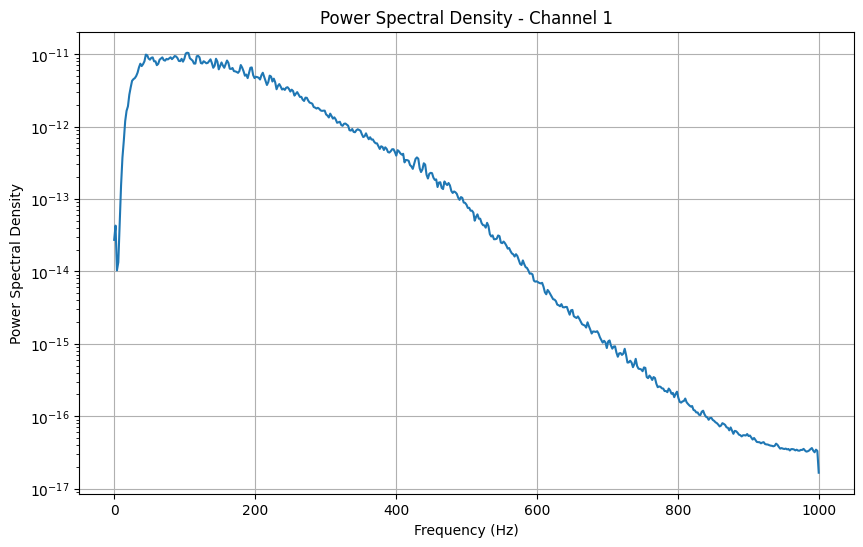

Channel 1: Maximum significant frequency = 492.19 Hz


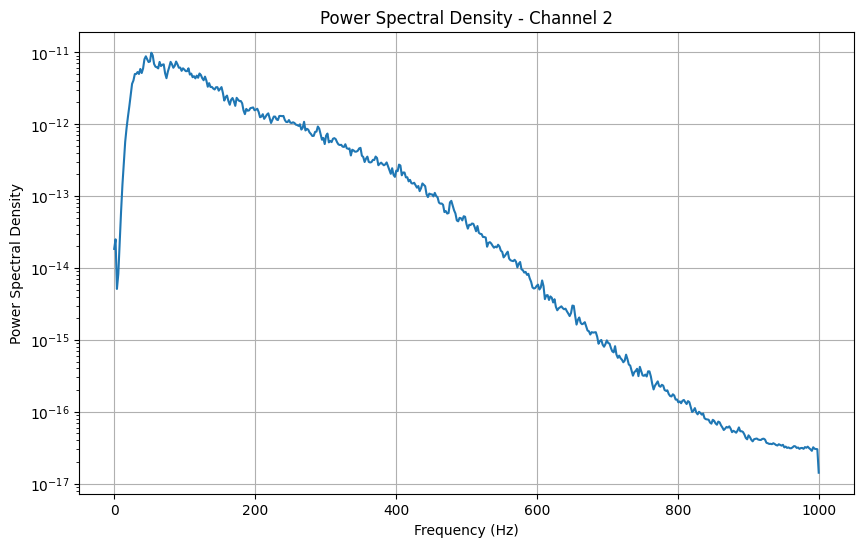

Channel 2: Maximum significant frequency = 457.03 Hz


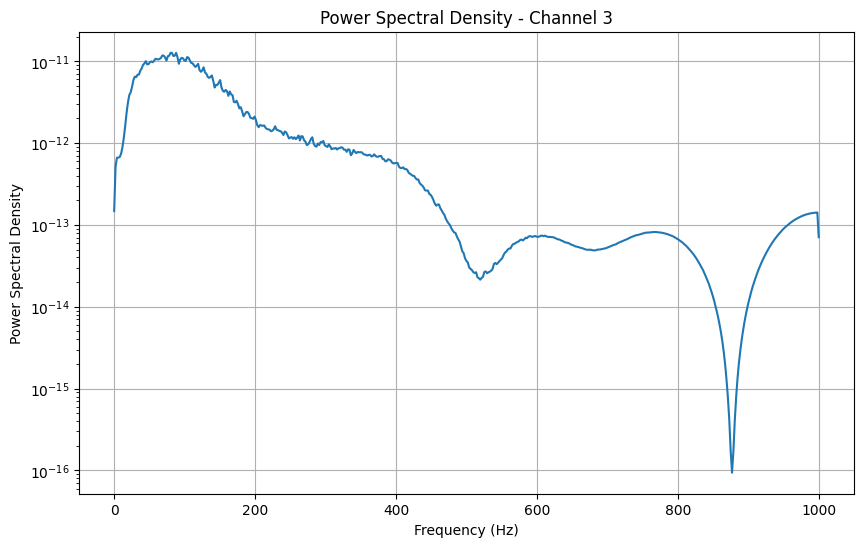

Channel 3: Maximum significant frequency = 998.05 Hz


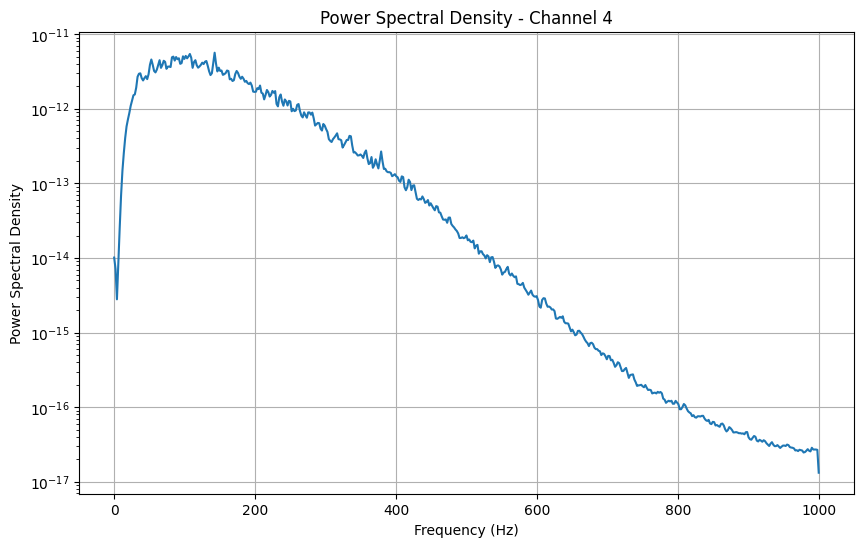

Channel 4: Maximum significant frequency = 445.31 Hz


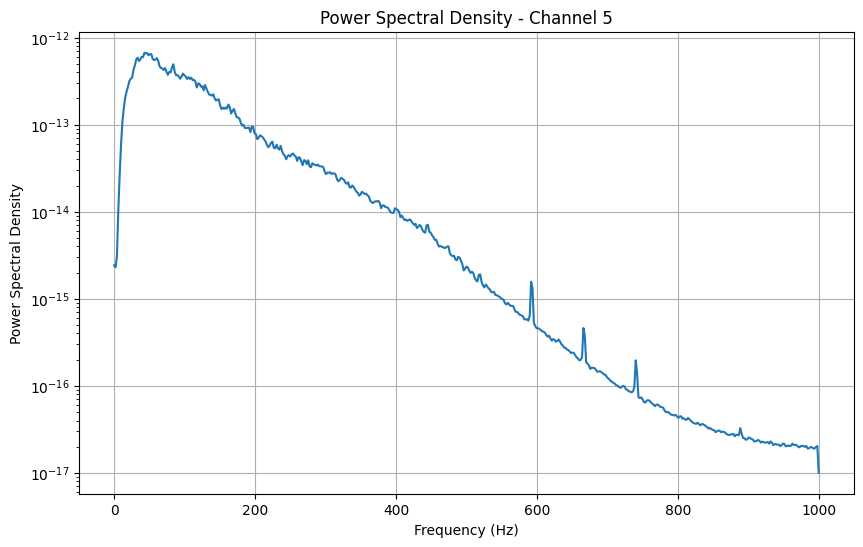

Channel 5: Maximum significant frequency = 445.31 Hz


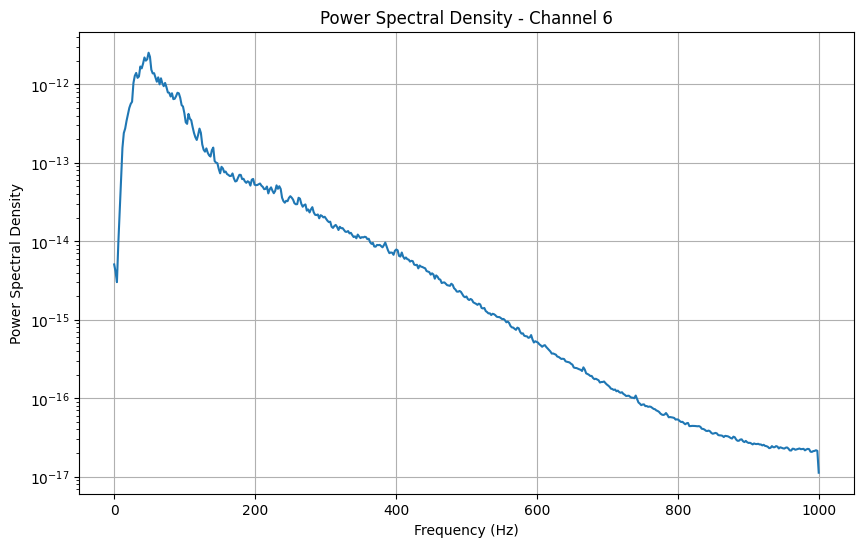

Channel 6: Maximum significant frequency = 281.25 Hz


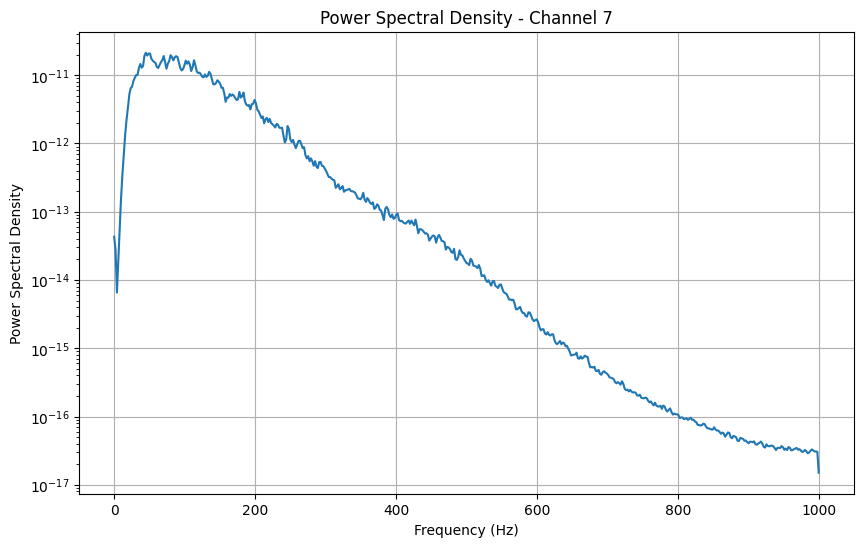

Channel 7: Maximum significant frequency = 333.98 Hz


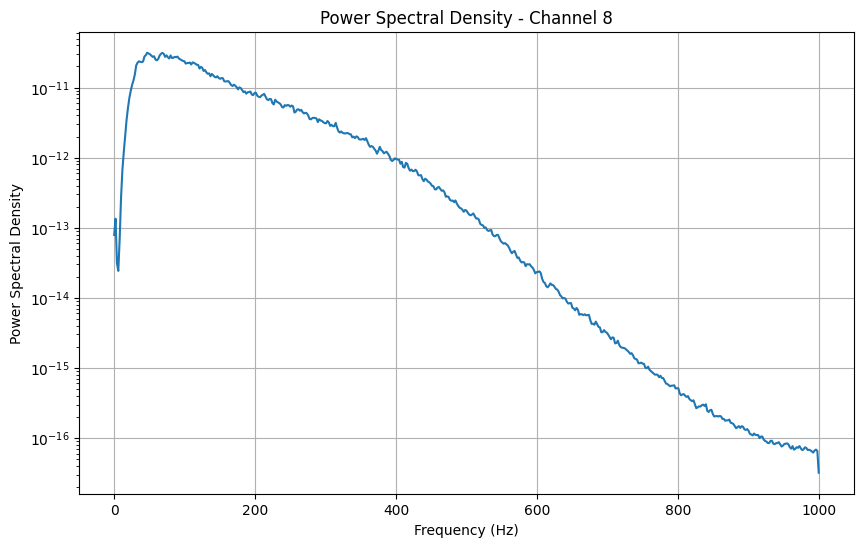

Channel 8: Maximum significant frequency = 468.75 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S3_E1_A1.mat


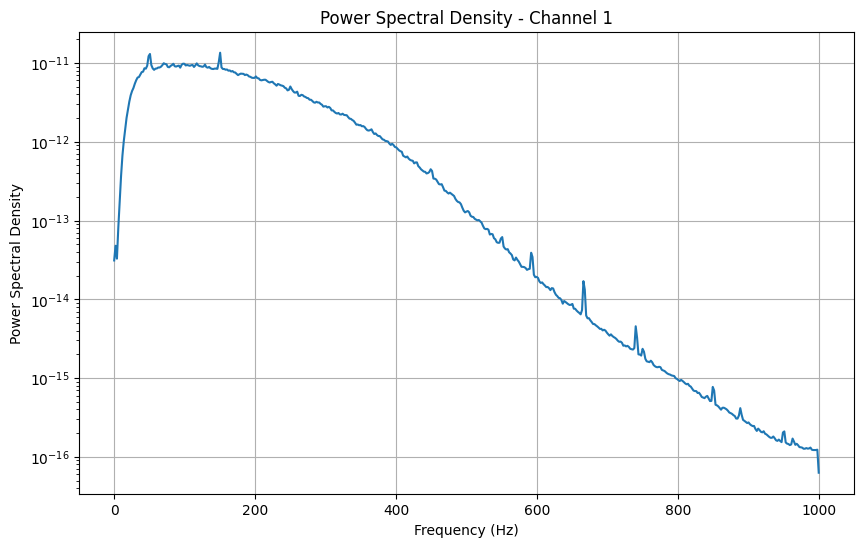

Channel 1: Maximum significant frequency = 494.14 Hz


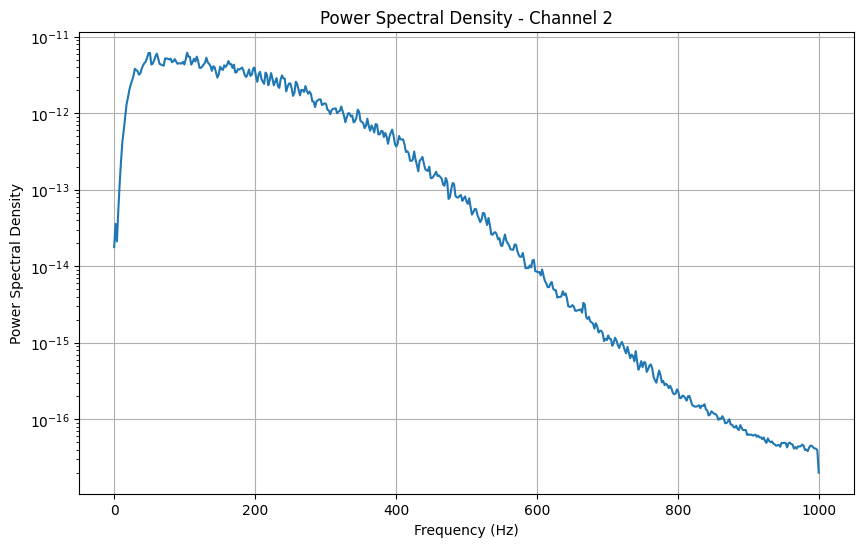

Channel 2: Maximum significant frequency = 503.91 Hz


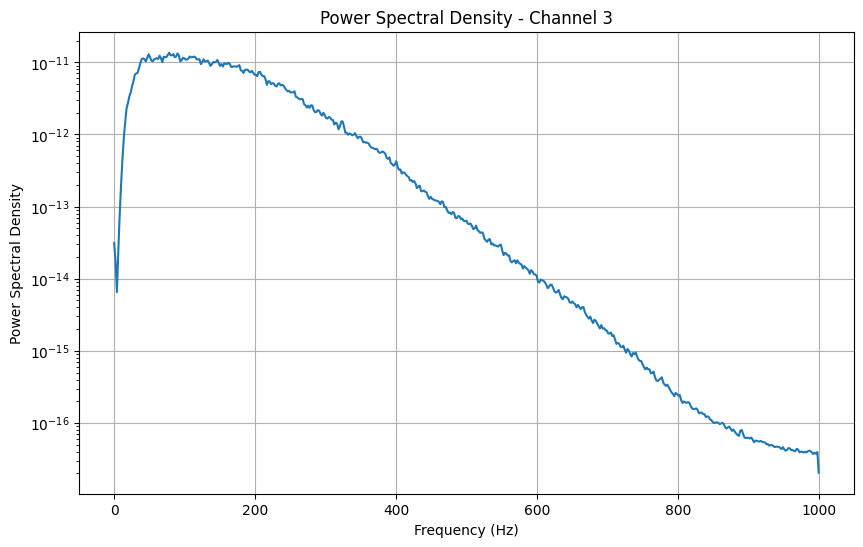

Channel 3: Maximum significant frequency = 449.22 Hz


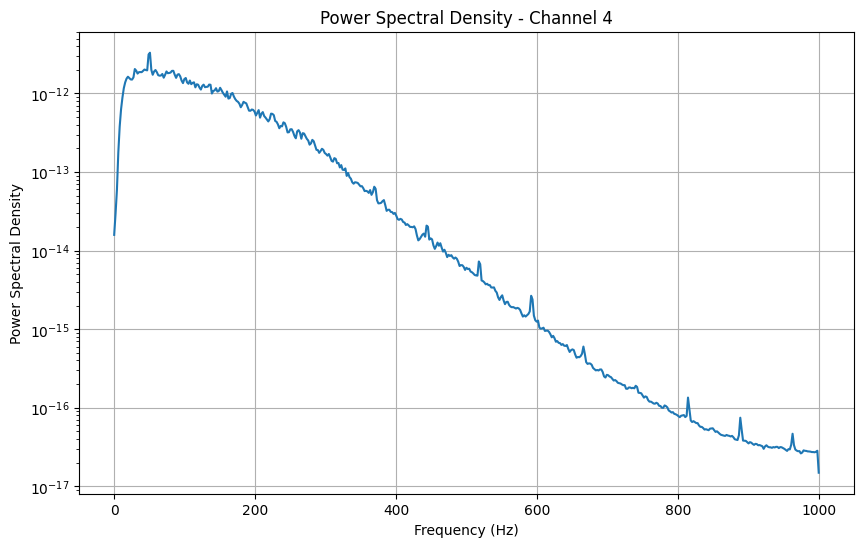

Channel 4: Maximum significant frequency = 390.62 Hz


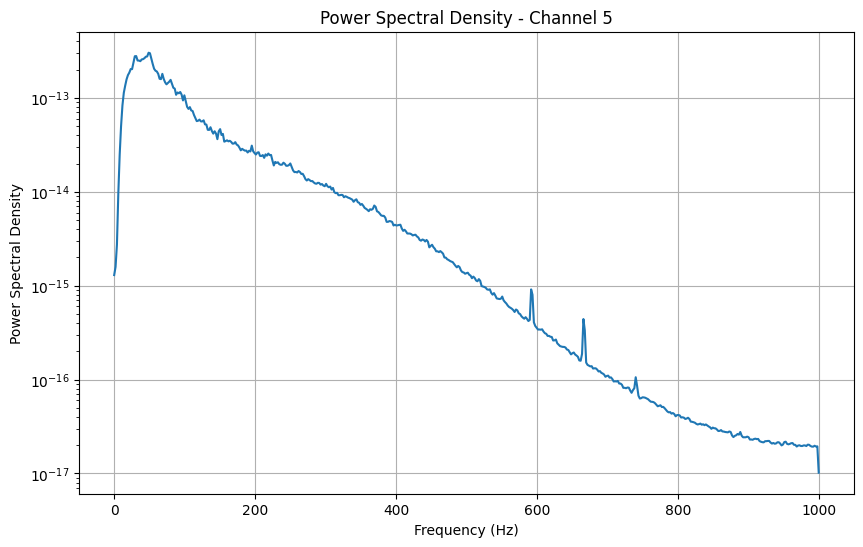

Channel 5: Maximum significant frequency = 443.36 Hz


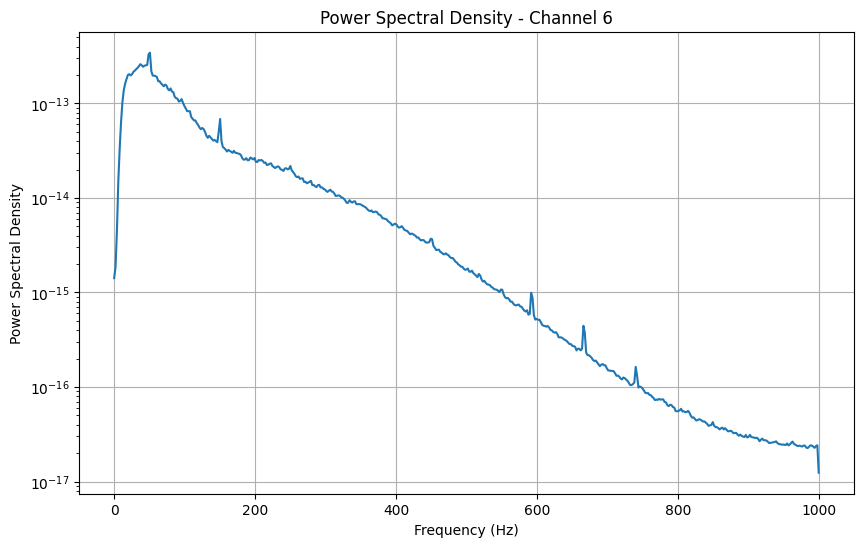

Channel 6: Maximum significant frequency = 451.17 Hz


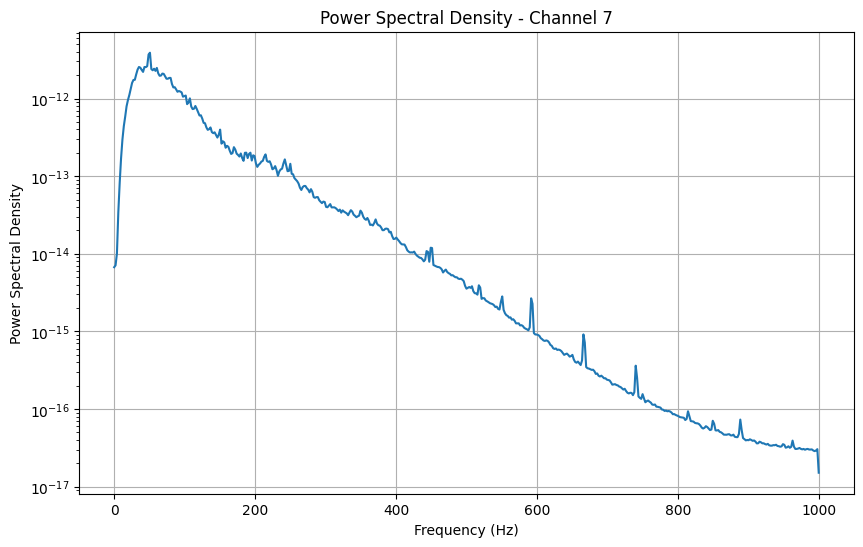

Channel 7: Maximum significant frequency = 312.50 Hz


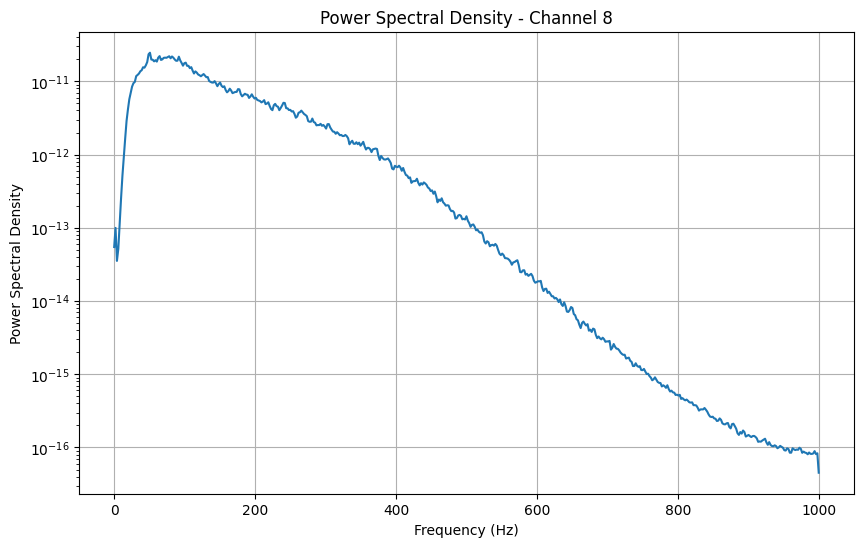

Channel 8: Maximum significant frequency = 464.84 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S5_E1_A1.mat


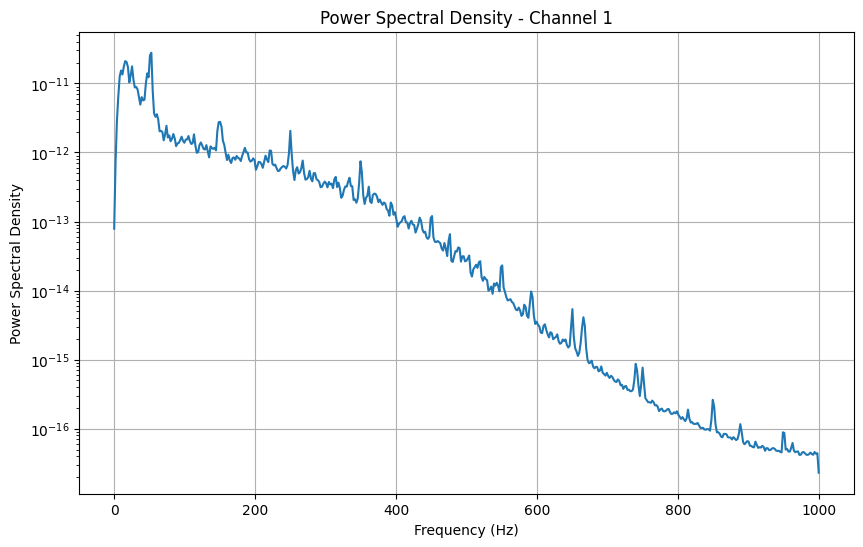

Channel 1: Maximum significant frequency = 361.33 Hz


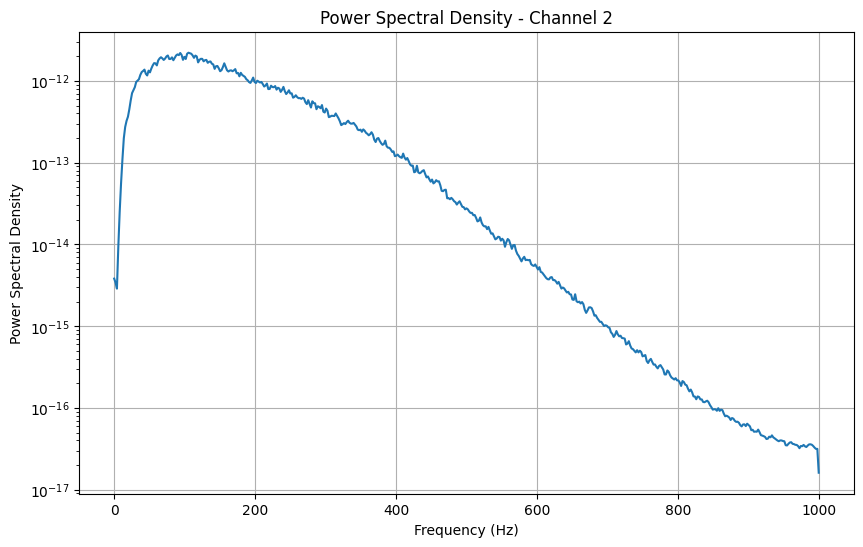

Channel 2: Maximum significant frequency = 511.72 Hz


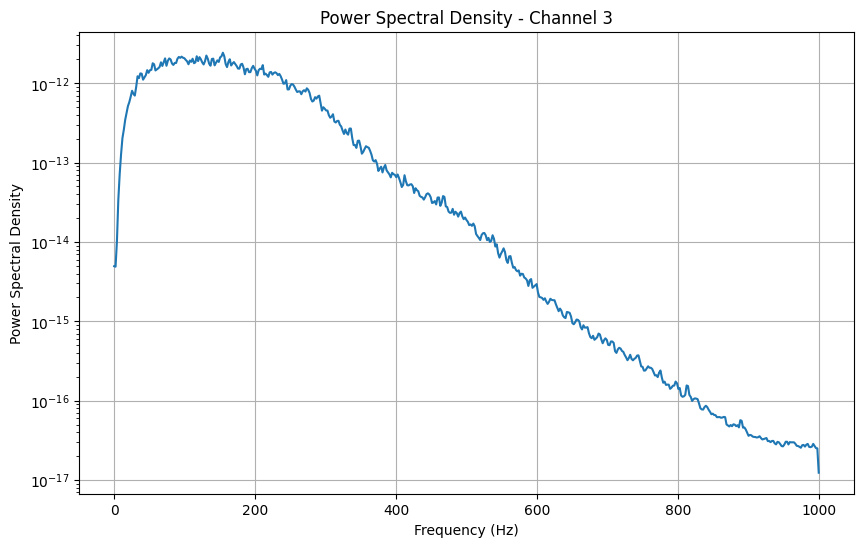

Channel 3: Maximum significant frequency = 480.47 Hz


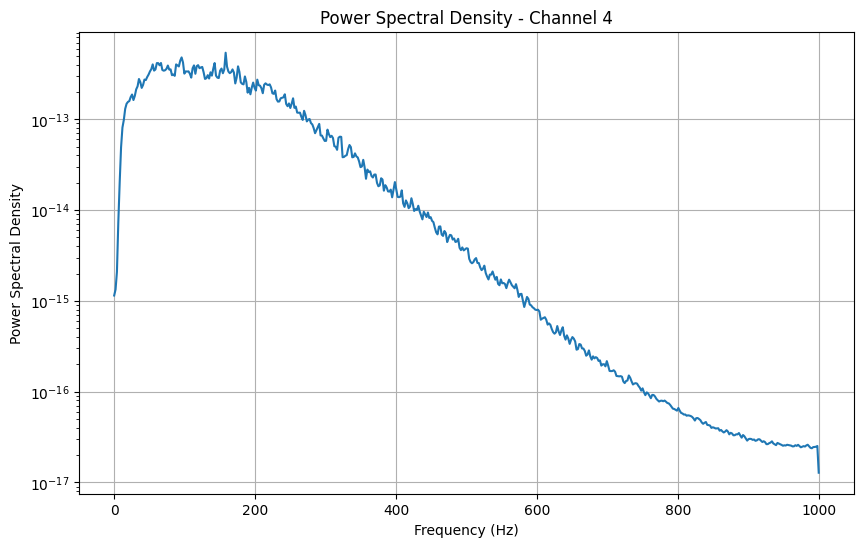

Channel 4: Maximum significant frequency = 470.70 Hz


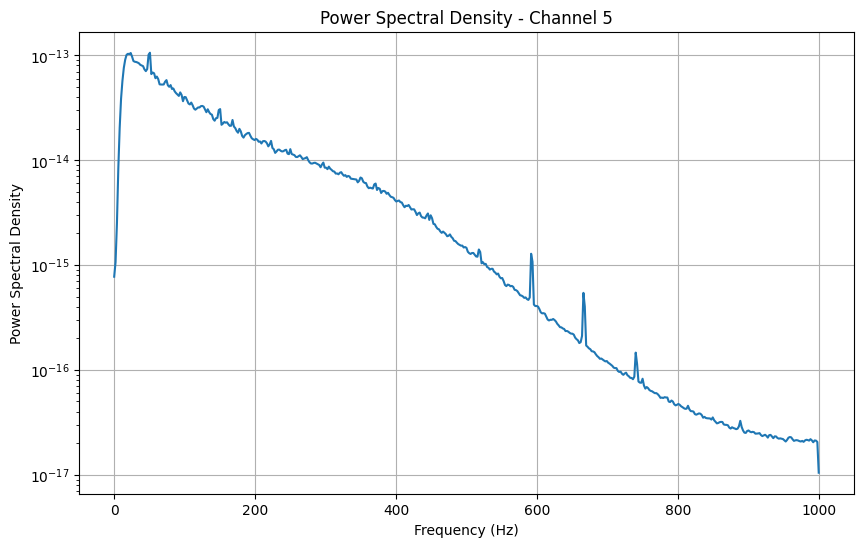

Channel 5: Maximum significant frequency = 593.75 Hz


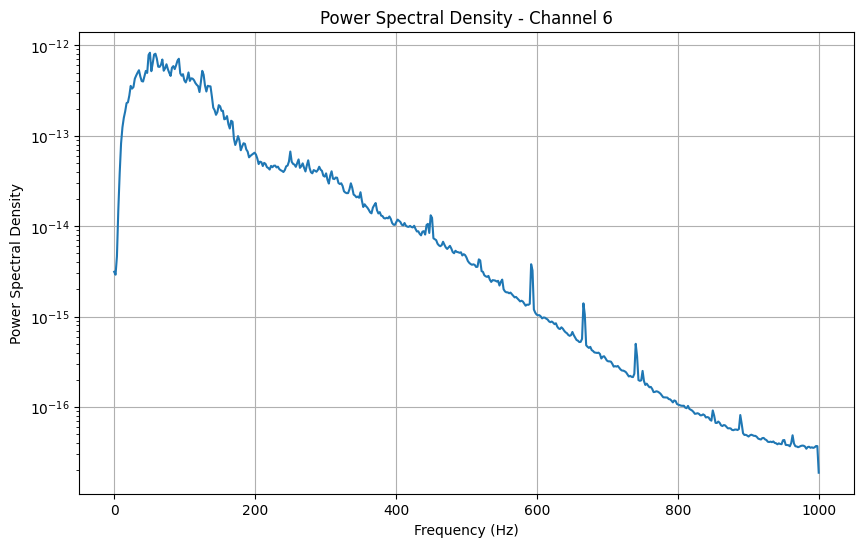

Channel 6: Maximum significant frequency = 451.17 Hz


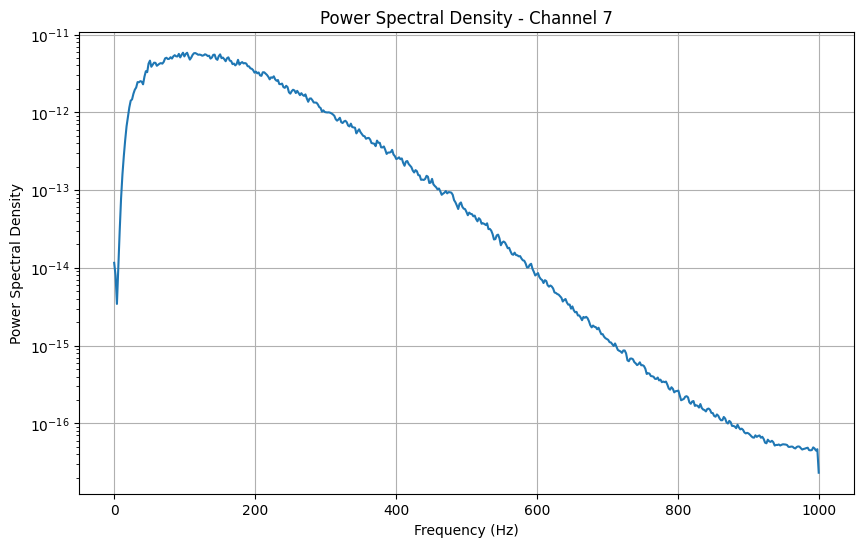

Channel 7: Maximum significant frequency = 494.14 Hz


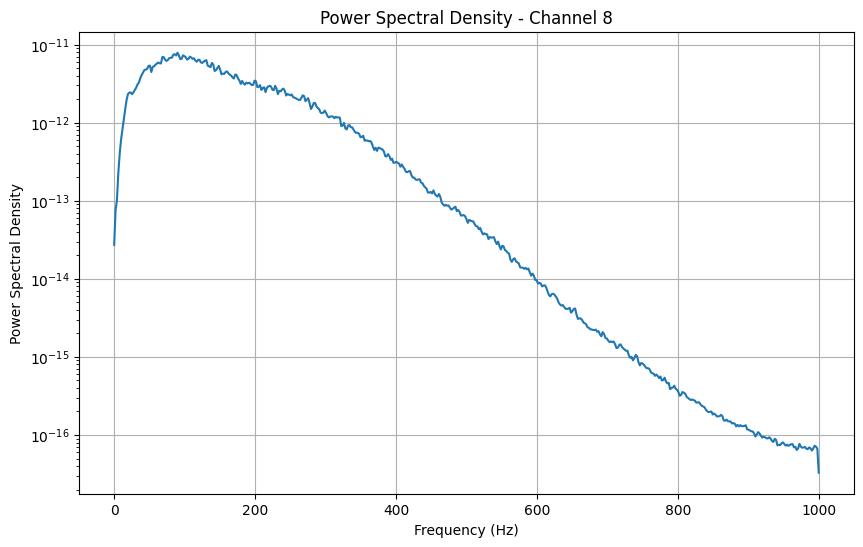

Channel 8: Maximum significant frequency = 484.38 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S4_E1_A1.mat


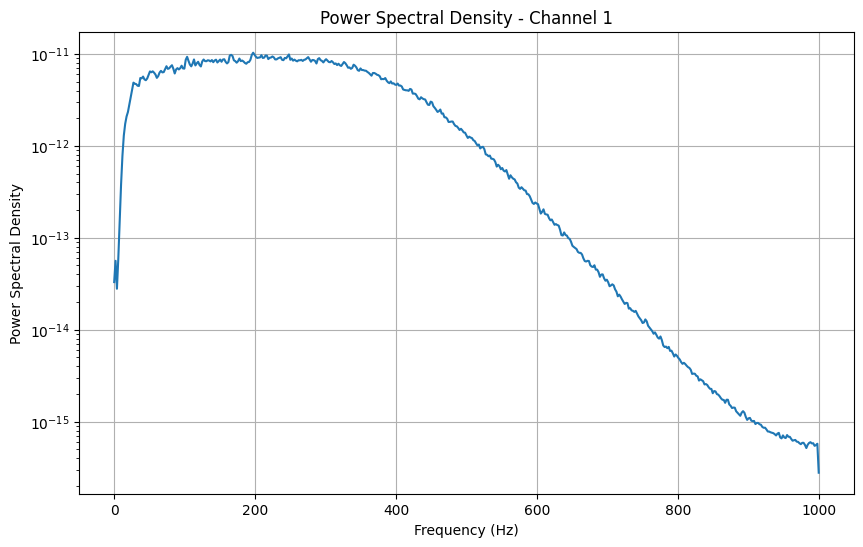

Channel 1: Maximum significant frequency = 642.58 Hz


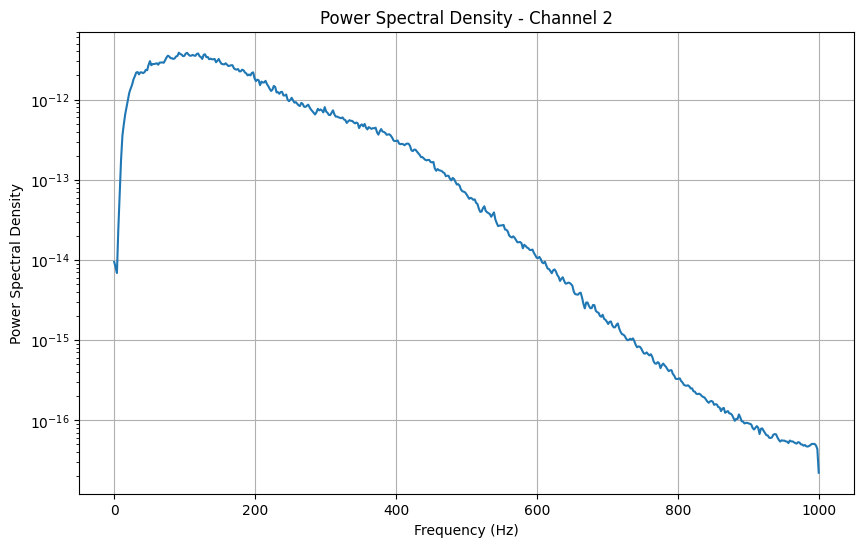

Channel 2: Maximum significant frequency = 539.06 Hz


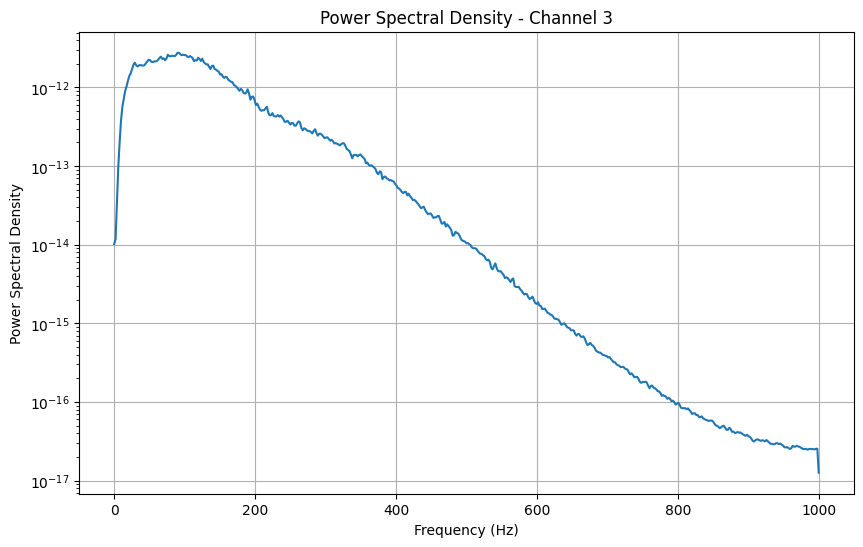

Channel 3: Maximum significant frequency = 441.41 Hz


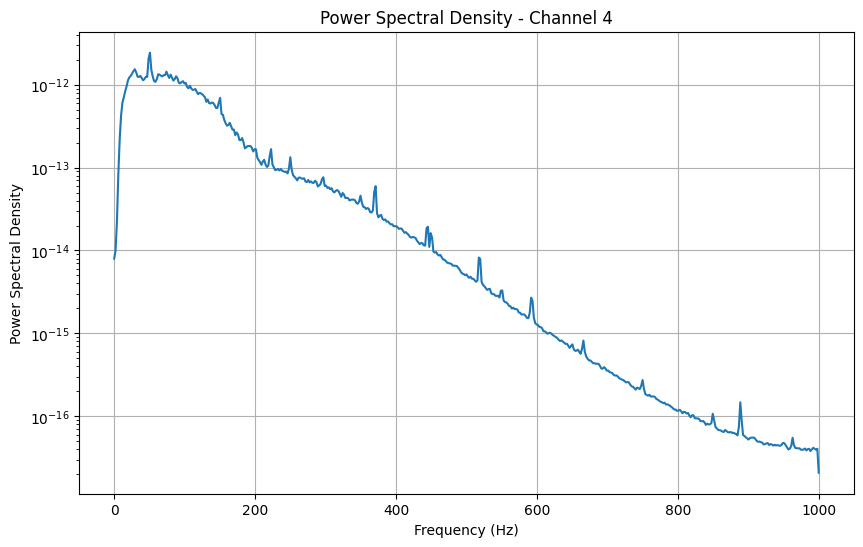

Channel 4: Maximum significant frequency = 378.91 Hz


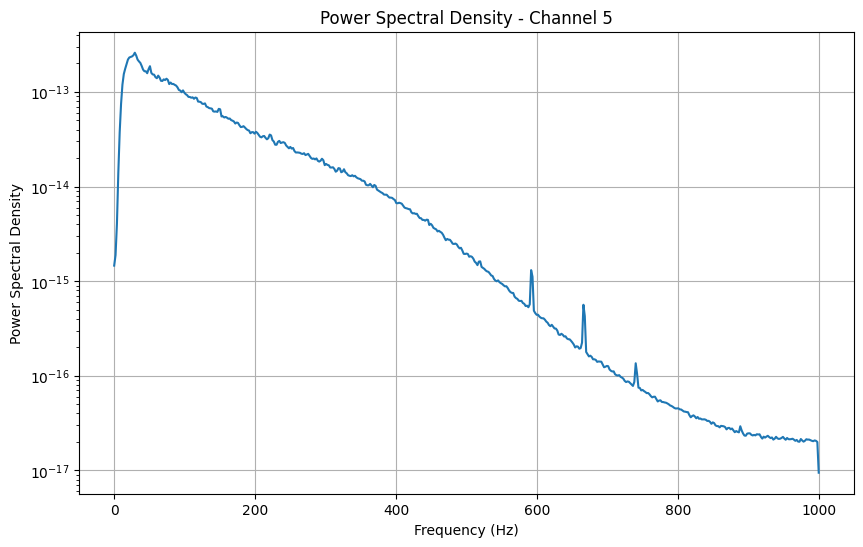

Channel 5: Maximum significant frequency = 478.52 Hz


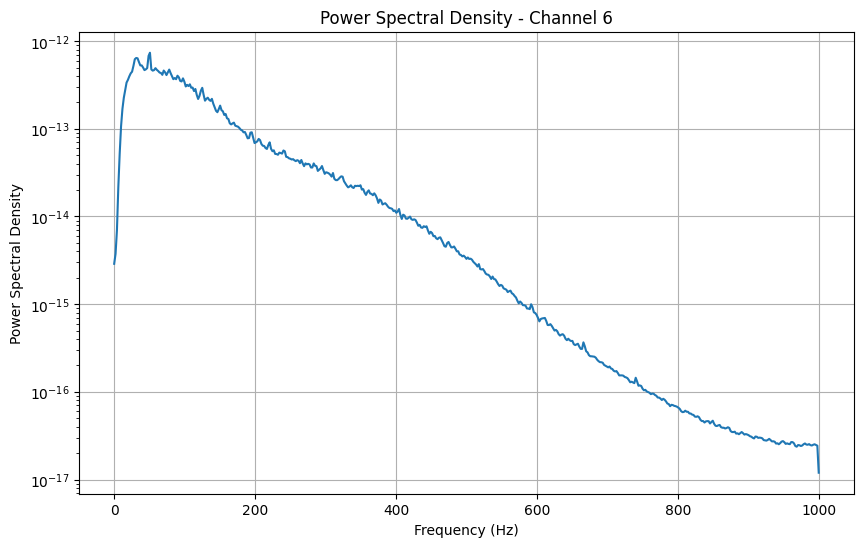

Channel 6: Maximum significant frequency = 443.36 Hz


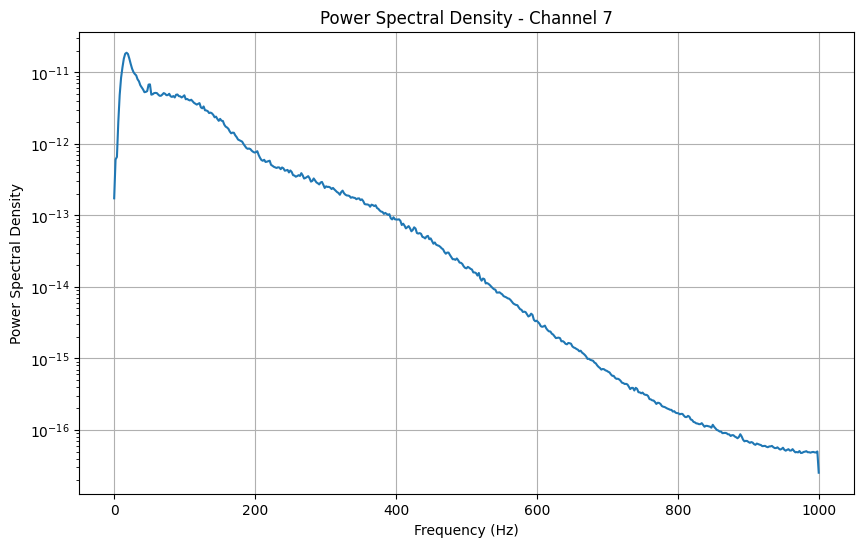

Channel 7: Maximum significant frequency = 332.03 Hz


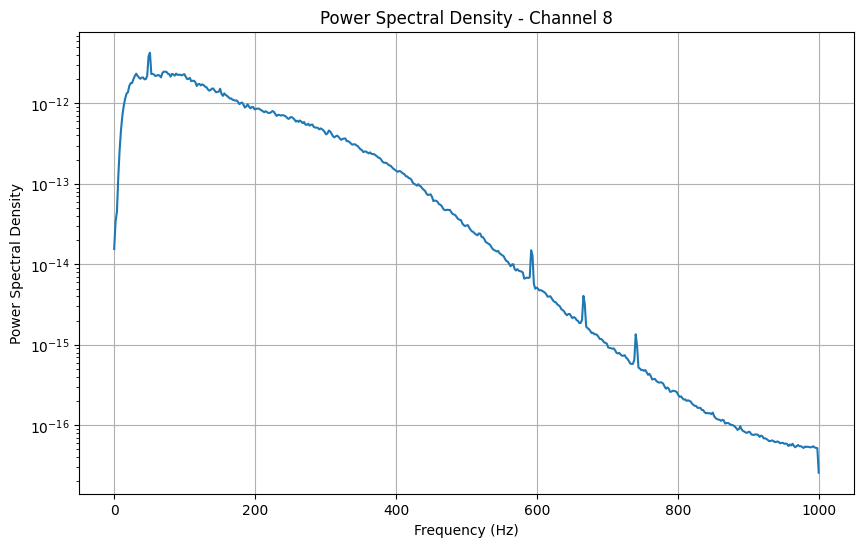

Channel 8: Maximum significant frequency = 478.52 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S7_E1_A1.mat


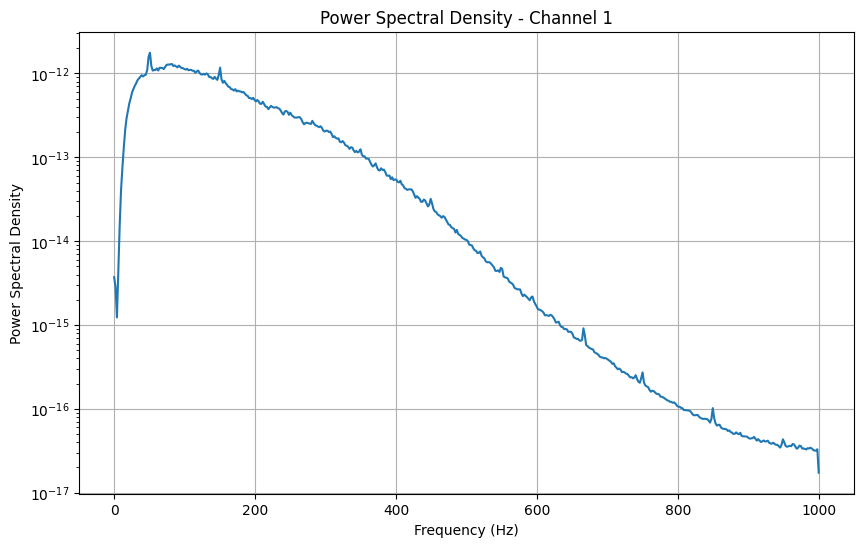

Channel 1: Maximum significant frequency = 470.70 Hz


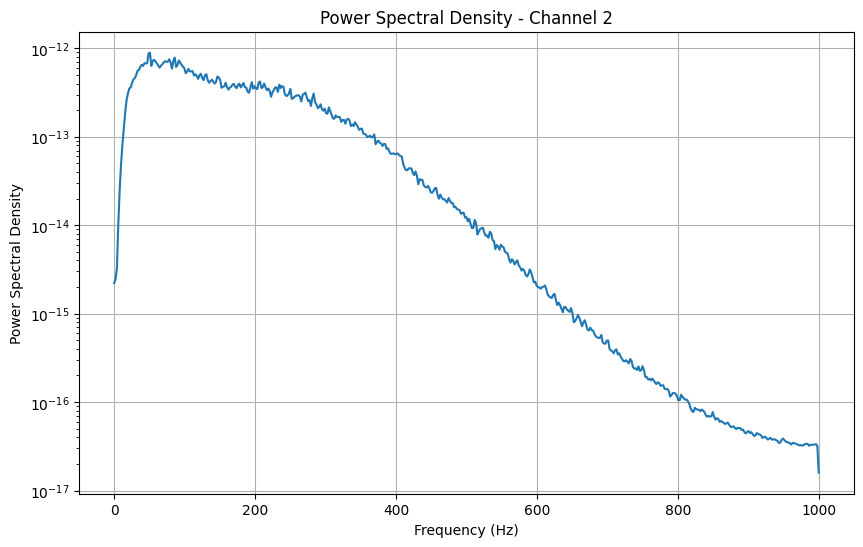

Channel 2: Maximum significant frequency = 523.44 Hz


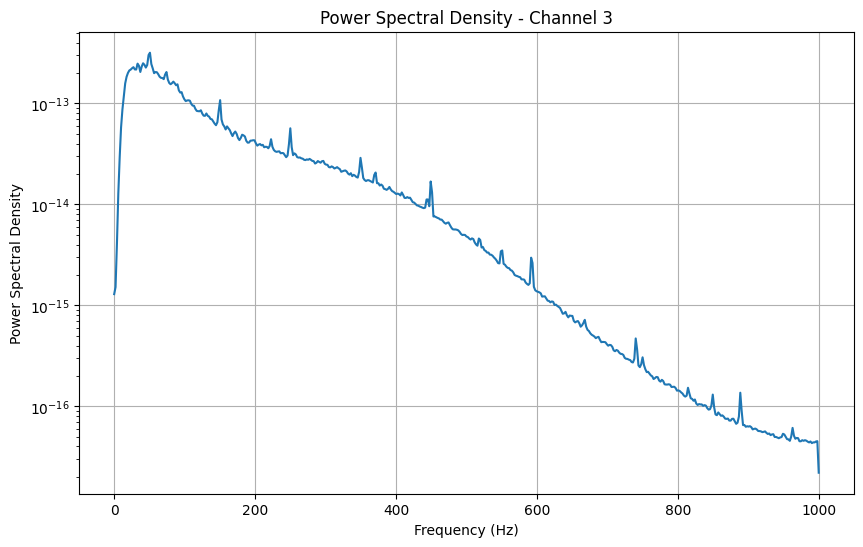

Channel 3: Maximum significant frequency = 550.78 Hz


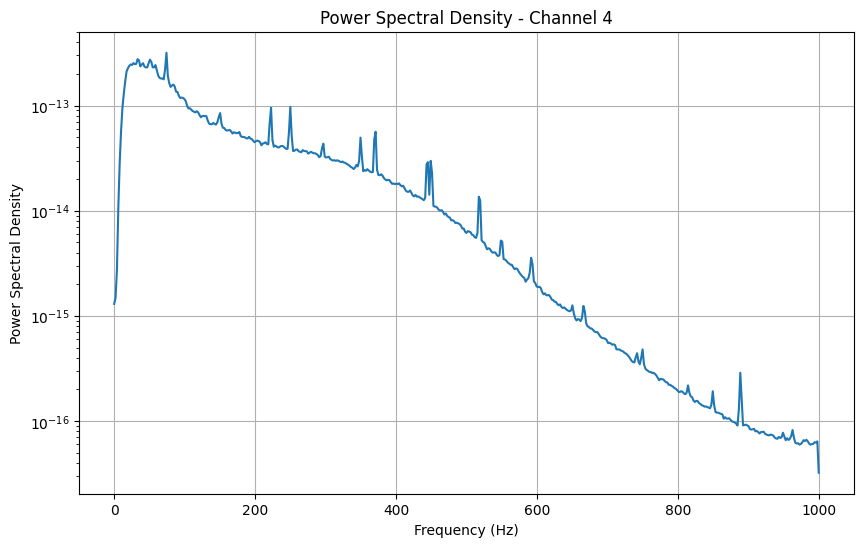

Channel 4: Maximum significant frequency = 591.80 Hz


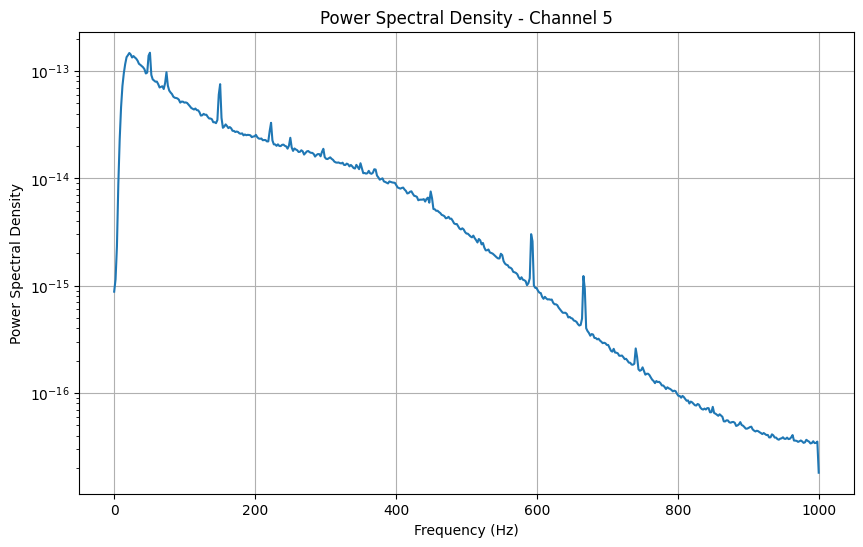

Channel 5: Maximum significant frequency = 593.75 Hz


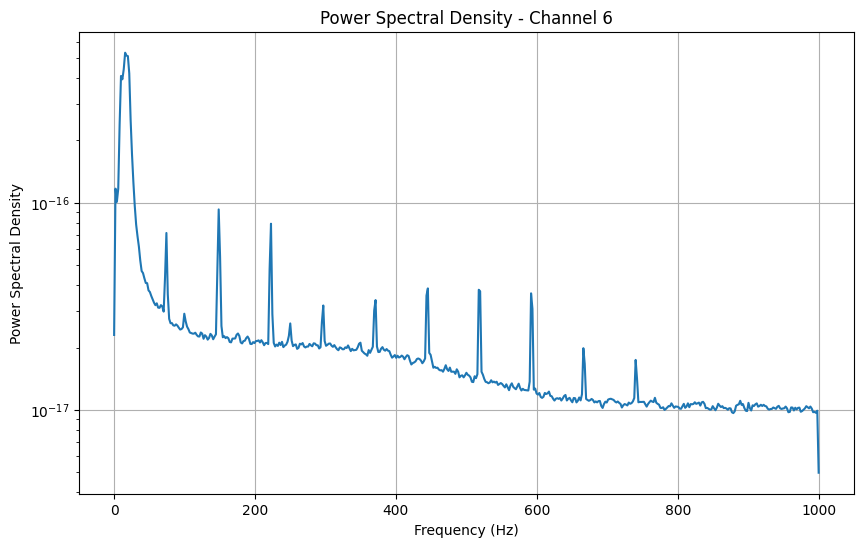

Channel 6: Maximum significant frequency = 998.05 Hz


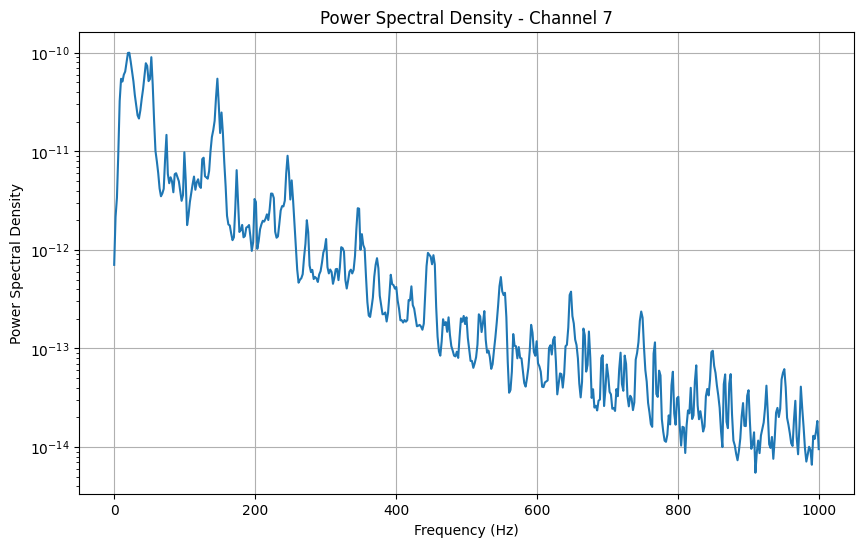

Channel 7: Maximum significant frequency = 355.47 Hz


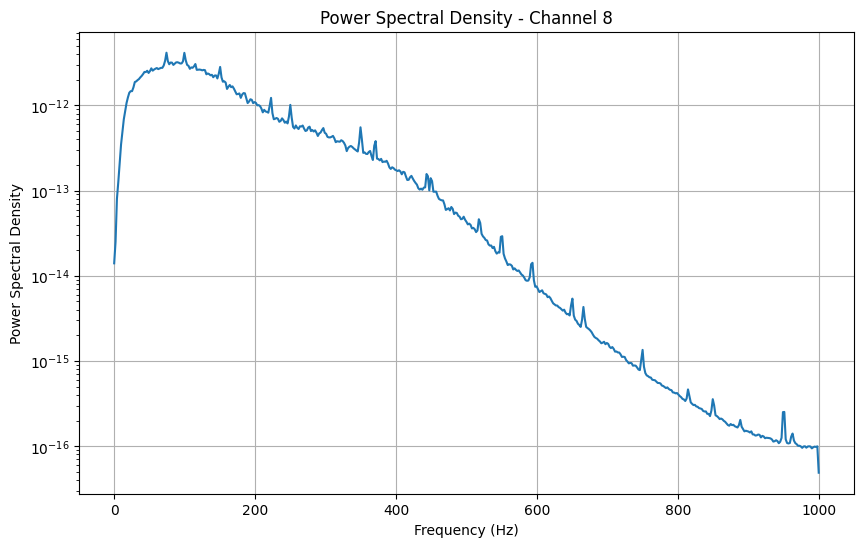

Channel 8: Maximum significant frequency = 519.53 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S6_E1_A1.mat


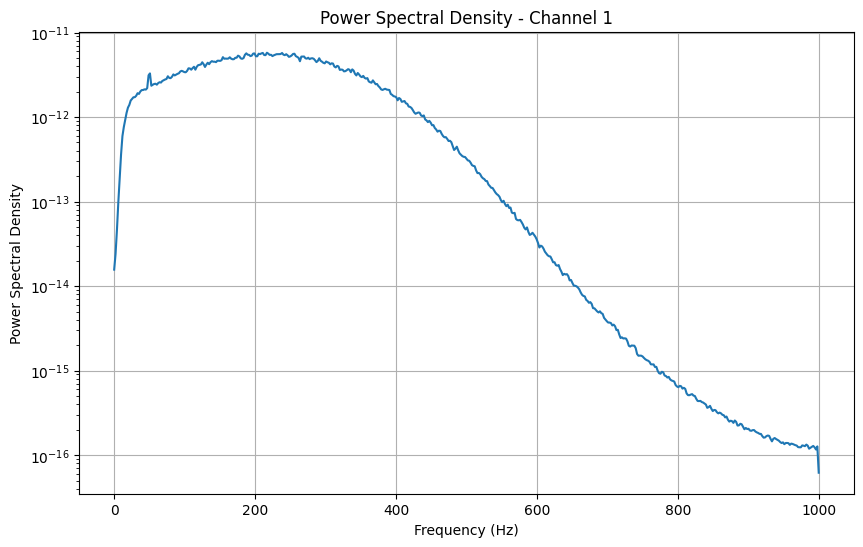

Channel 1: Maximum significant frequency = 576.17 Hz


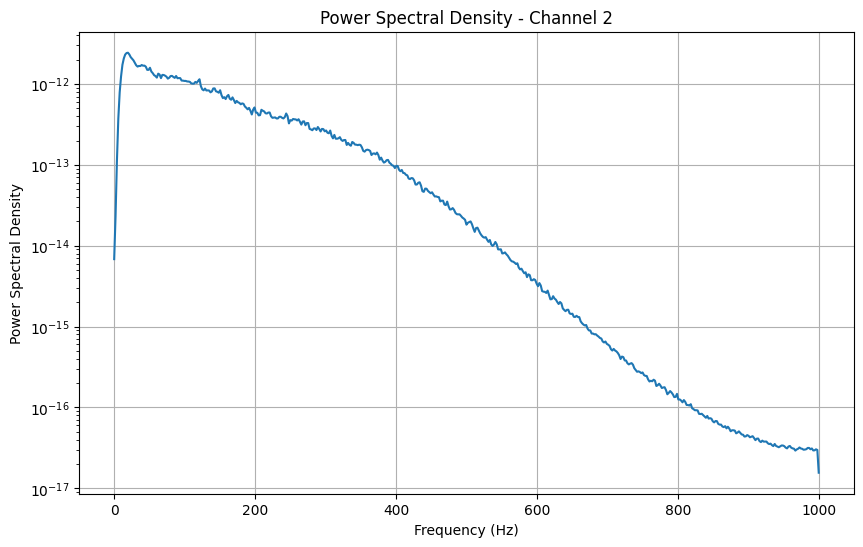

Channel 2: Maximum significant frequency = 490.23 Hz


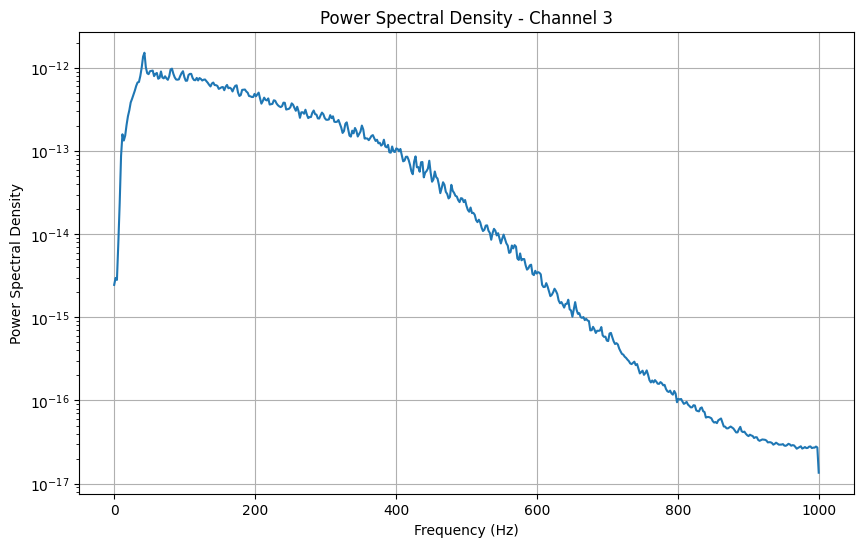

Channel 3: Maximum significant frequency = 511.72 Hz


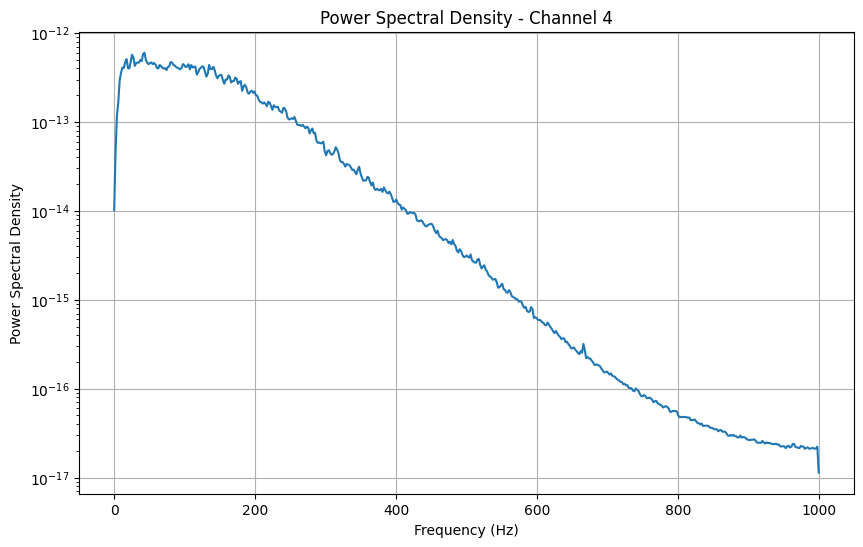

Channel 4: Maximum significant frequency = 453.12 Hz


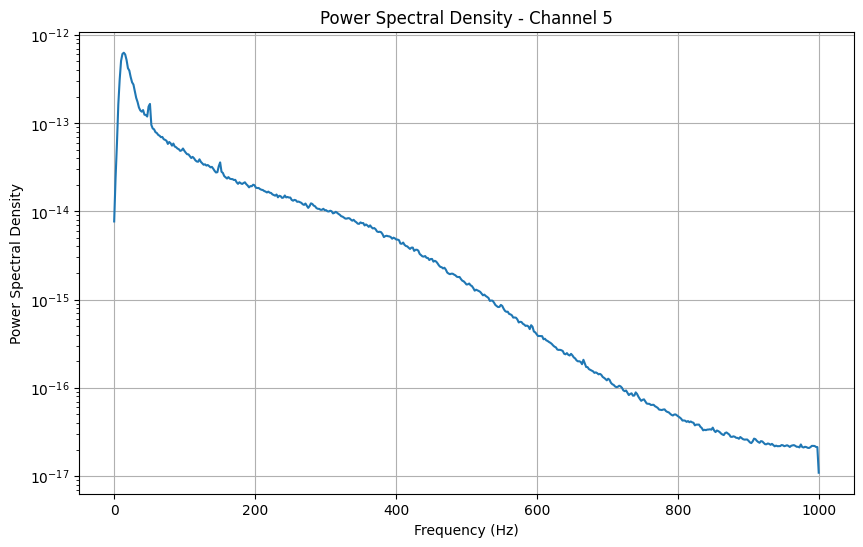

Channel 5: Maximum significant frequency = 369.14 Hz


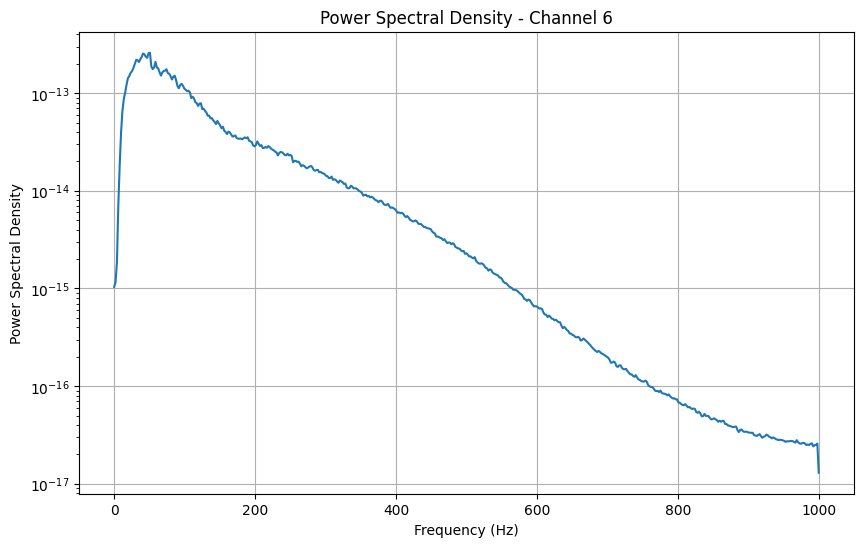

Channel 6: Maximum significant frequency = 486.33 Hz


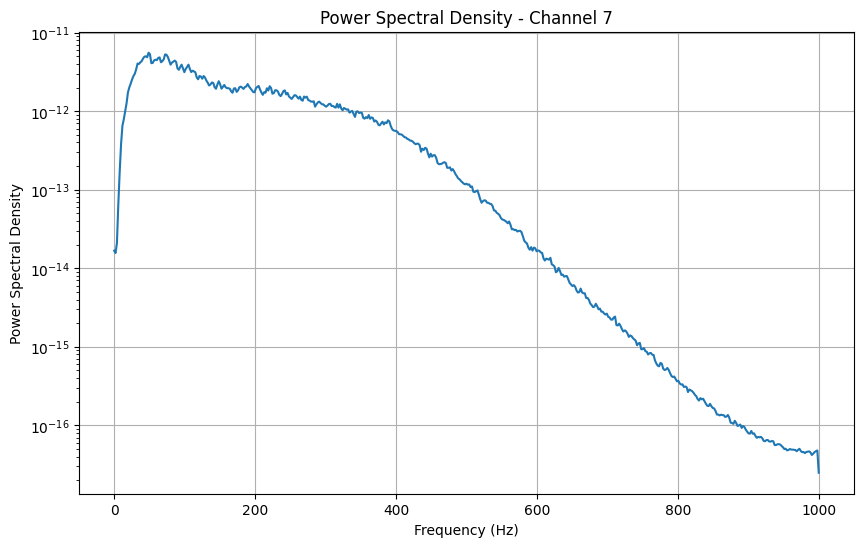

Channel 7: Maximum significant frequency = 537.11 Hz


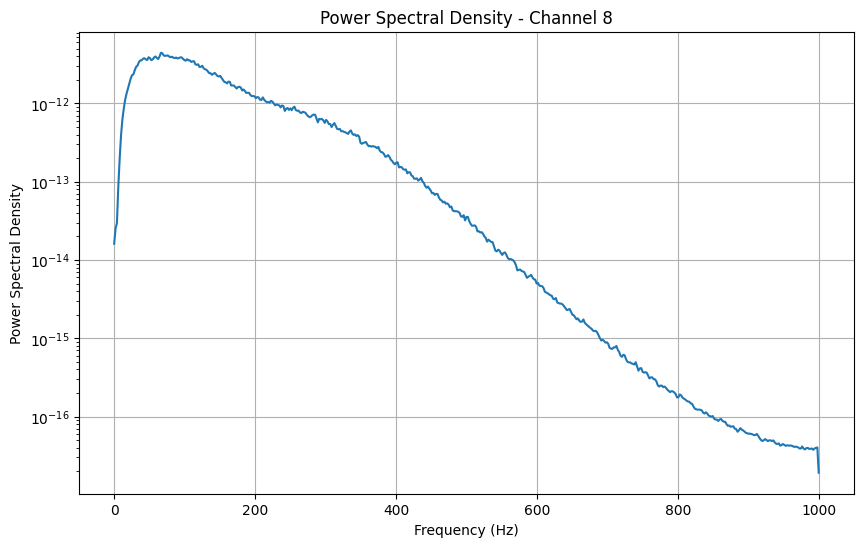

Channel 8: Maximum significant frequency = 478.52 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S10_E1_A1.mat


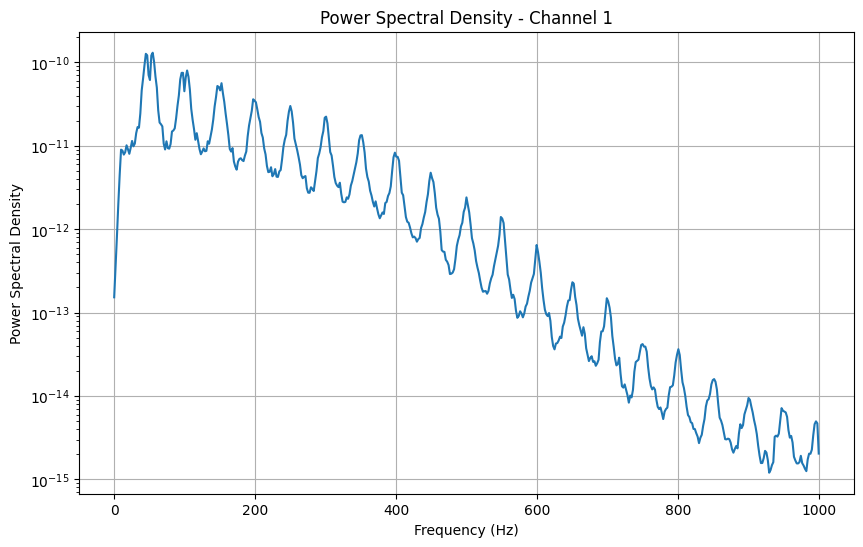

Channel 1: Maximum significant frequency = 550.78 Hz


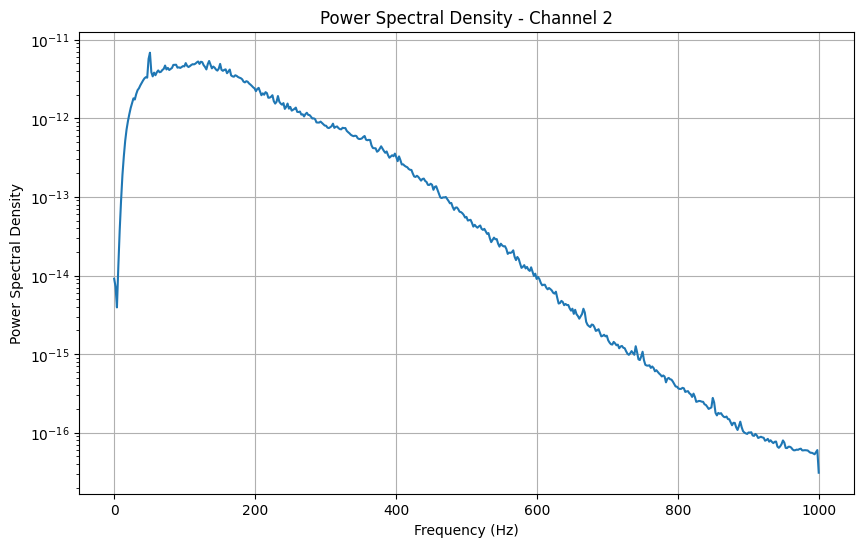

Channel 2: Maximum significant frequency = 488.28 Hz


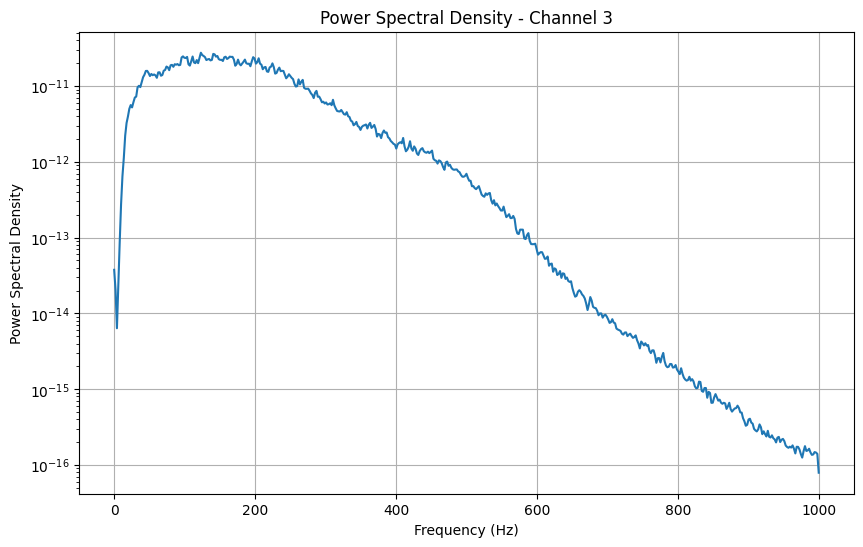

Channel 3: Maximum significant frequency = 542.97 Hz


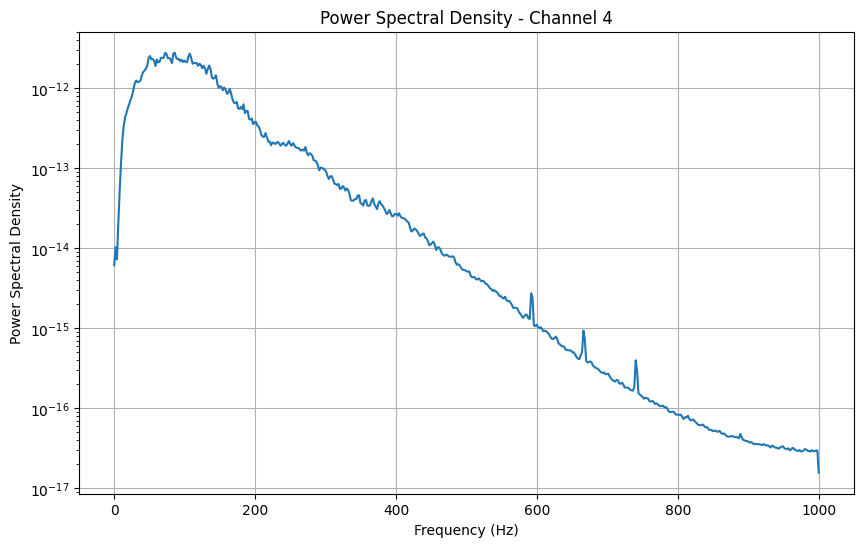

Channel 4: Maximum significant frequency = 390.62 Hz


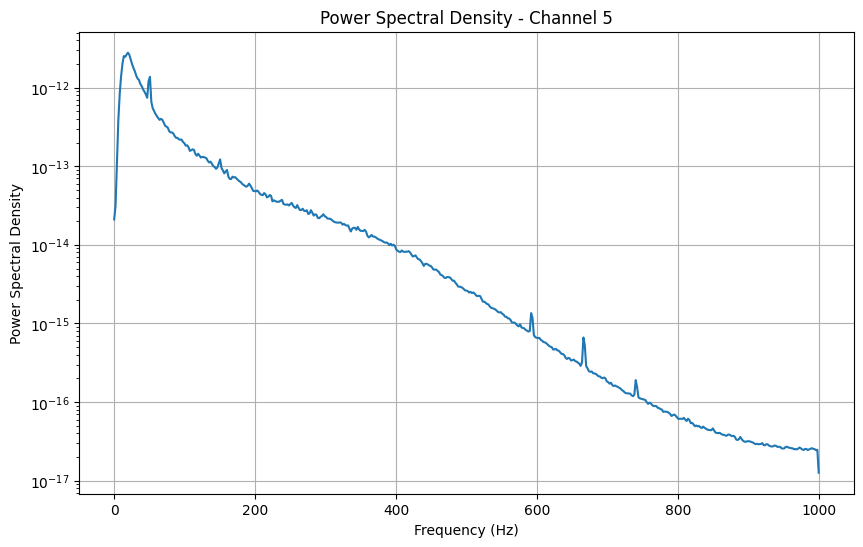

Channel 5: Maximum significant frequency = 267.58 Hz


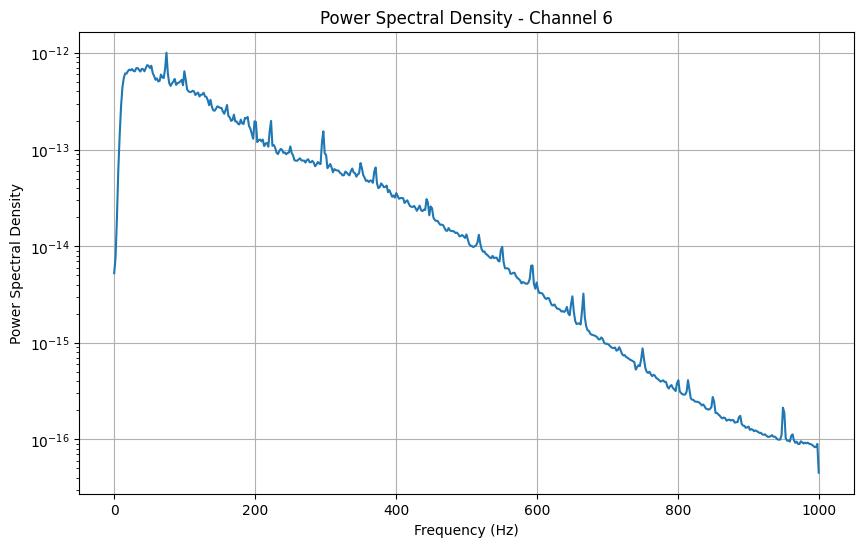

Channel 6: Maximum significant frequency = 519.53 Hz


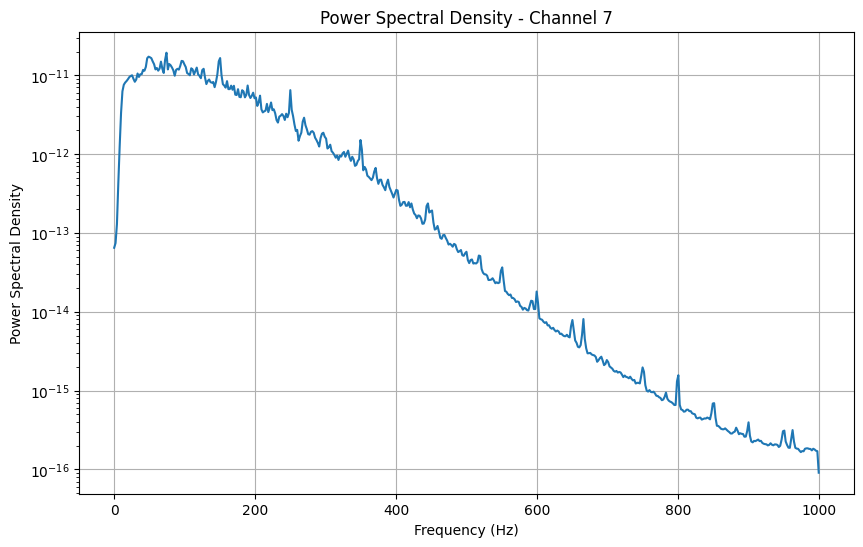

Channel 7: Maximum significant frequency = 445.31 Hz


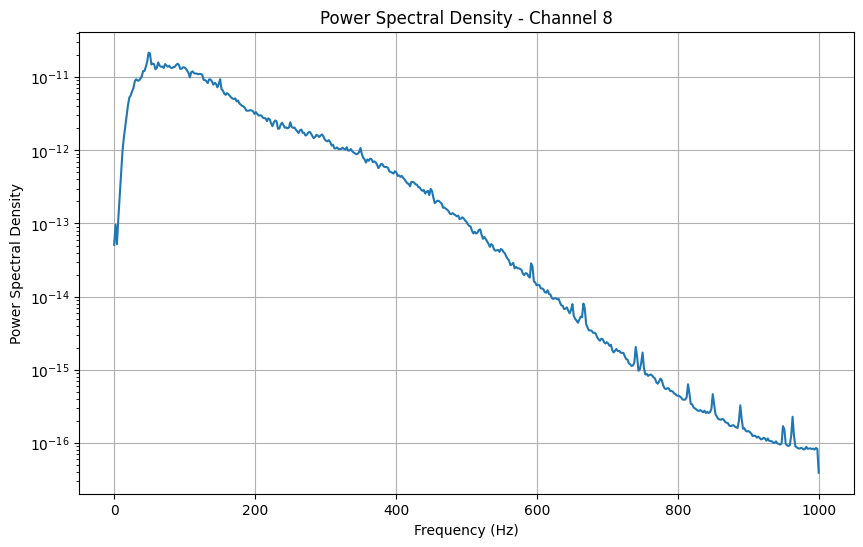

Channel 8: Maximum significant frequency = 453.12 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S8_E1_A1.mat


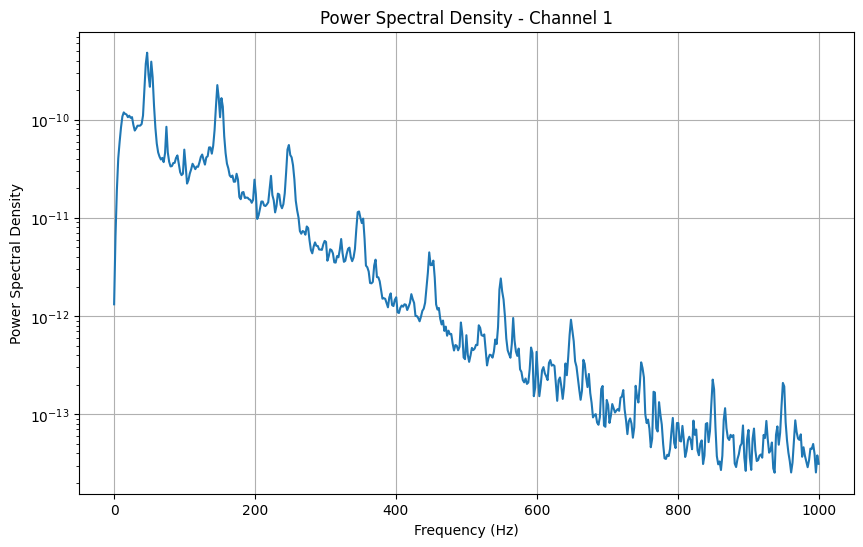

Channel 1: Maximum significant frequency = 355.47 Hz


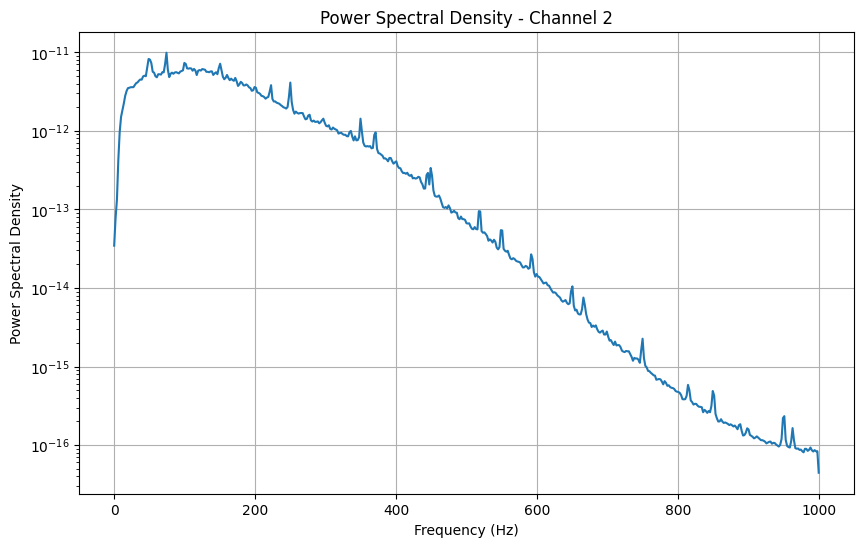

Channel 2: Maximum significant frequency = 476.56 Hz


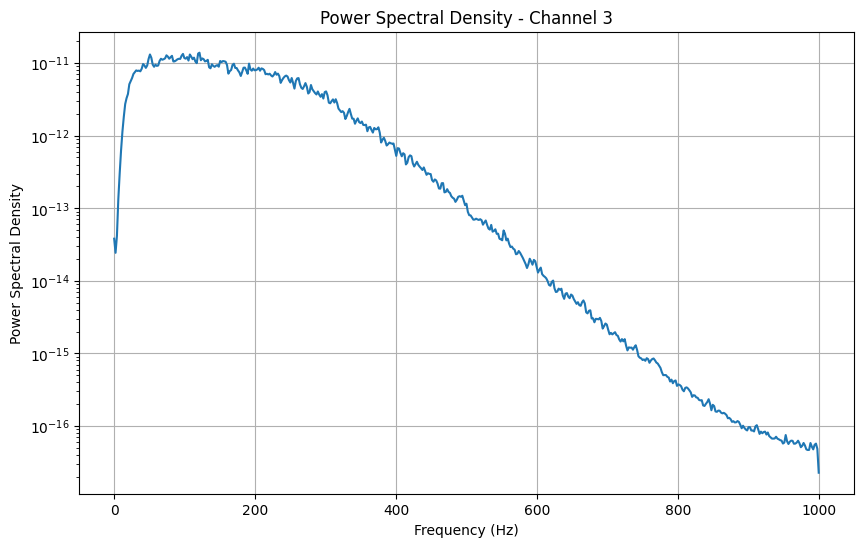

Channel 3: Maximum significant frequency = 494.14 Hz


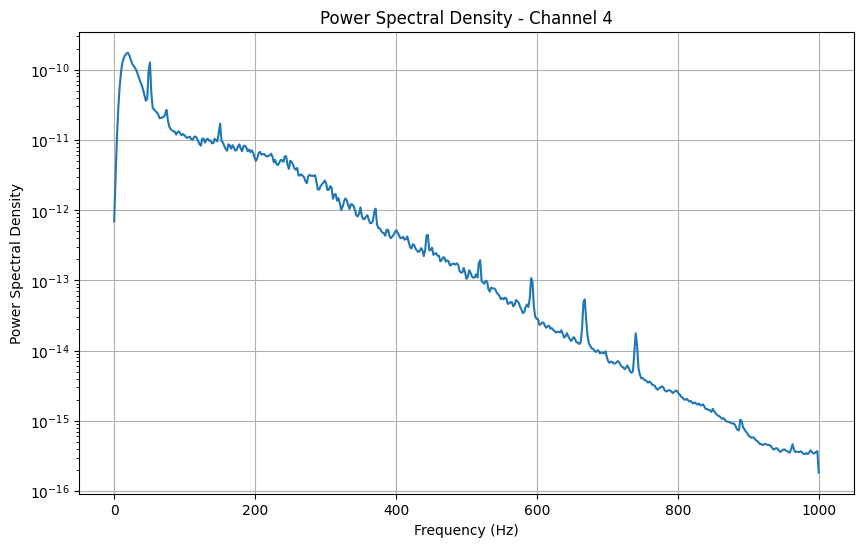

Channel 4: Maximum significant frequency = 308.59 Hz


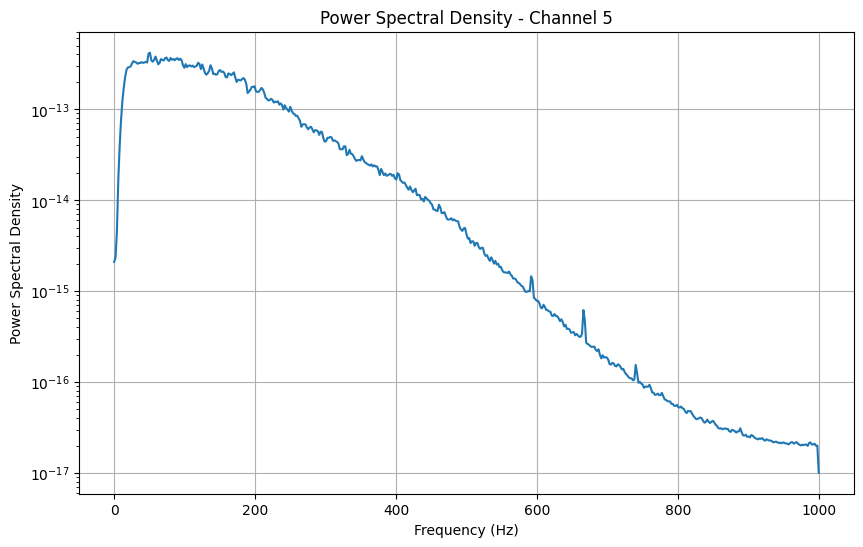

Channel 5: Maximum significant frequency = 500.00 Hz


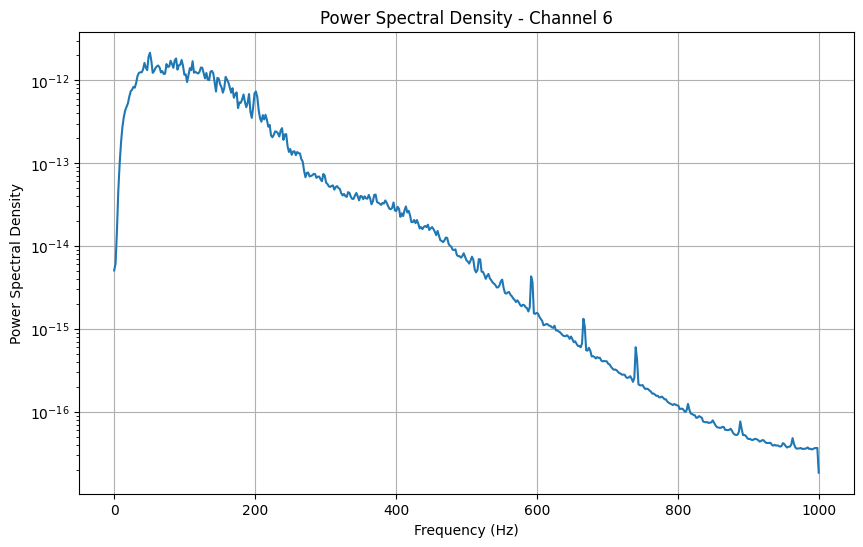

Channel 6: Maximum significant frequency = 419.92 Hz


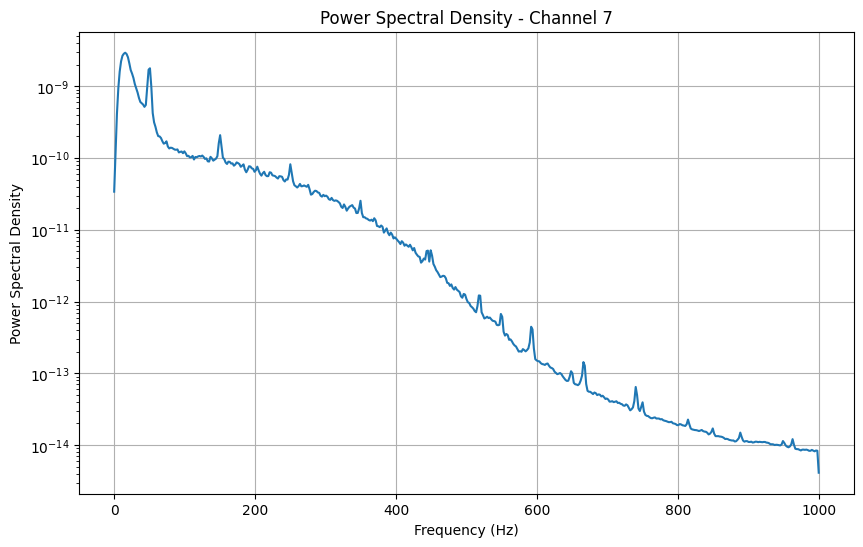

Channel 7: Maximum significant frequency = 300.78 Hz


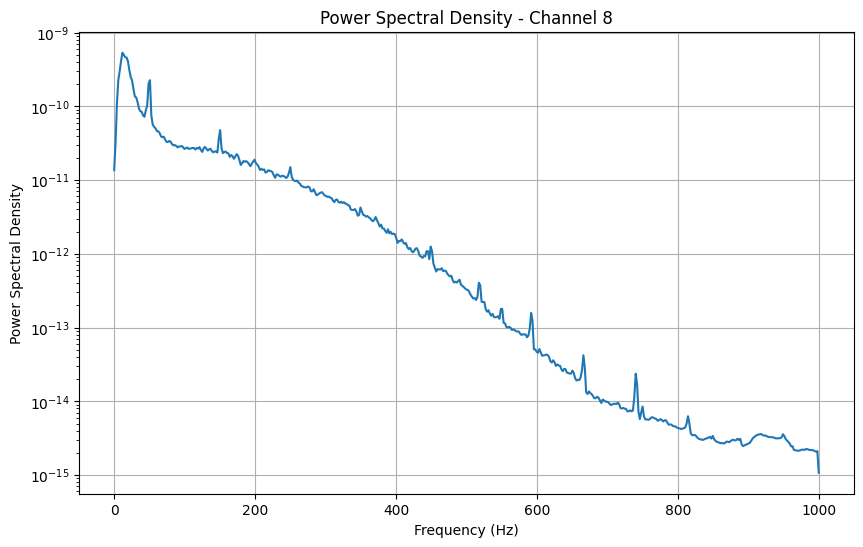

Channel 8: Maximum significant frequency = 316.41 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S9_E1_A1.mat


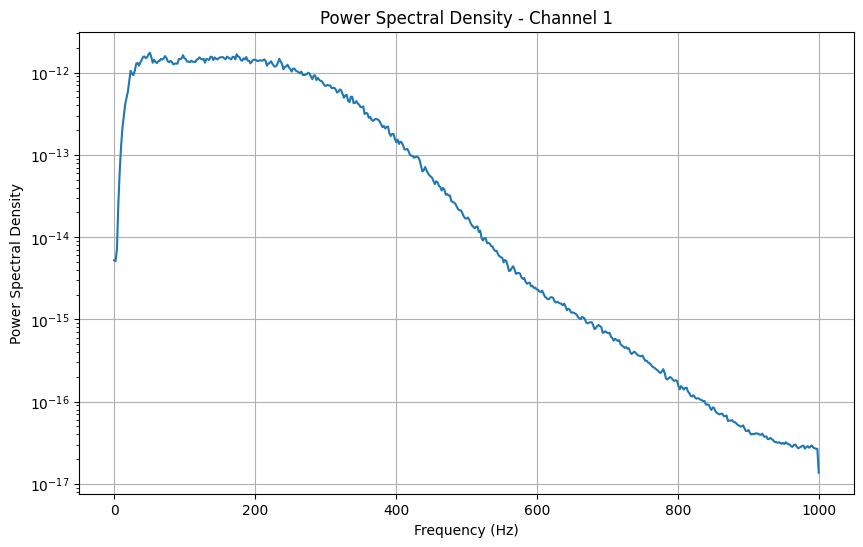

Channel 1: Maximum significant frequency = 496.09 Hz


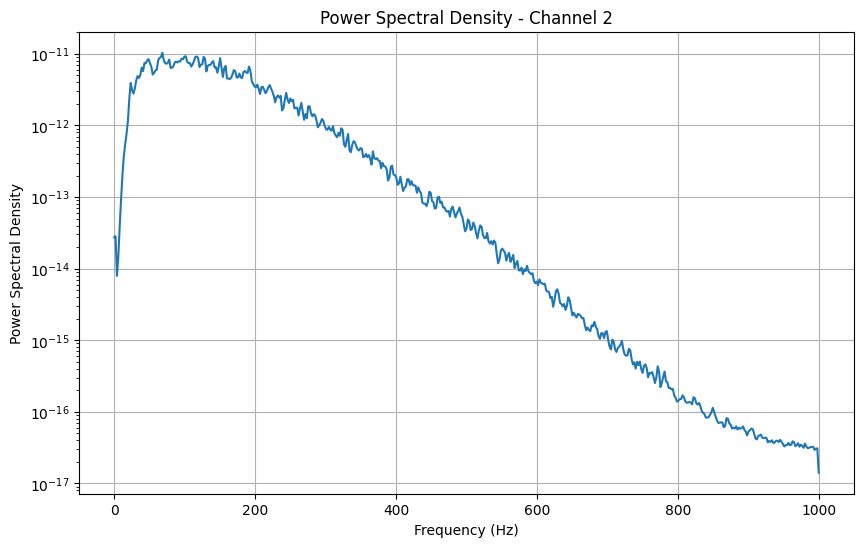

Channel 2: Maximum significant frequency = 449.22 Hz


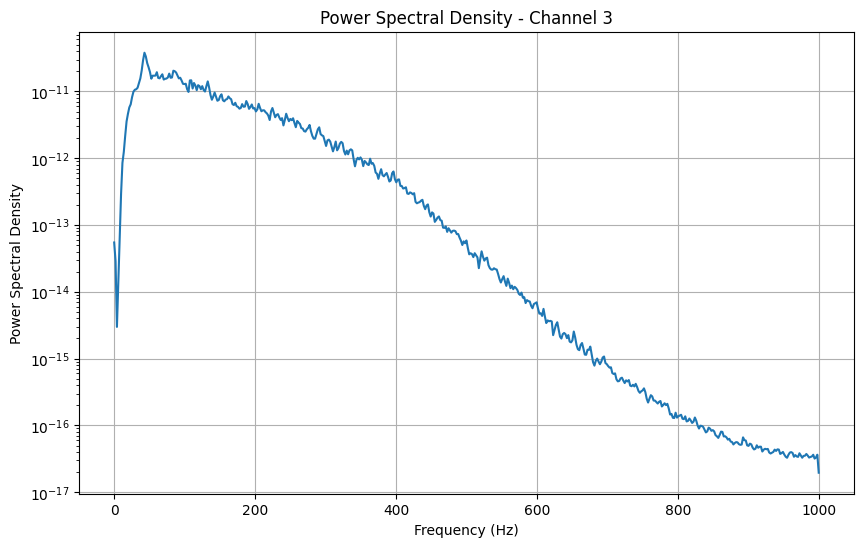

Channel 3: Maximum significant frequency = 408.20 Hz


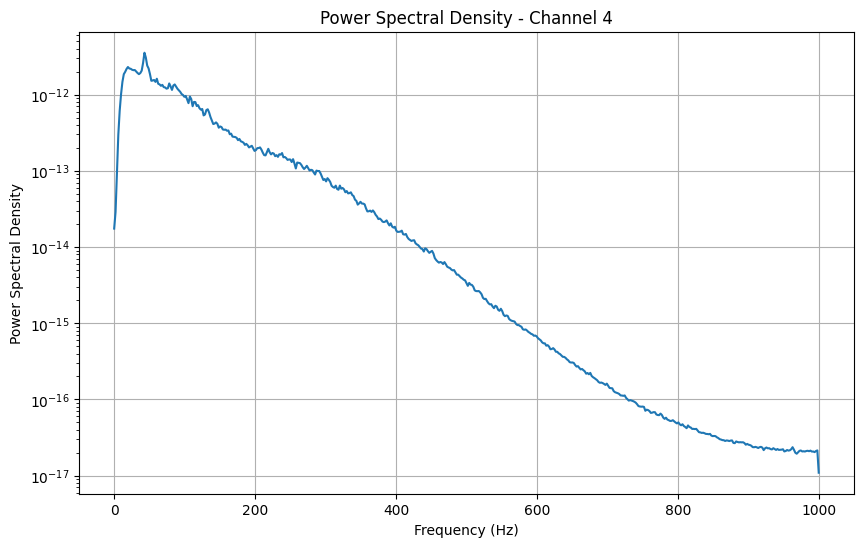

Channel 4: Maximum significant frequency = 355.47 Hz


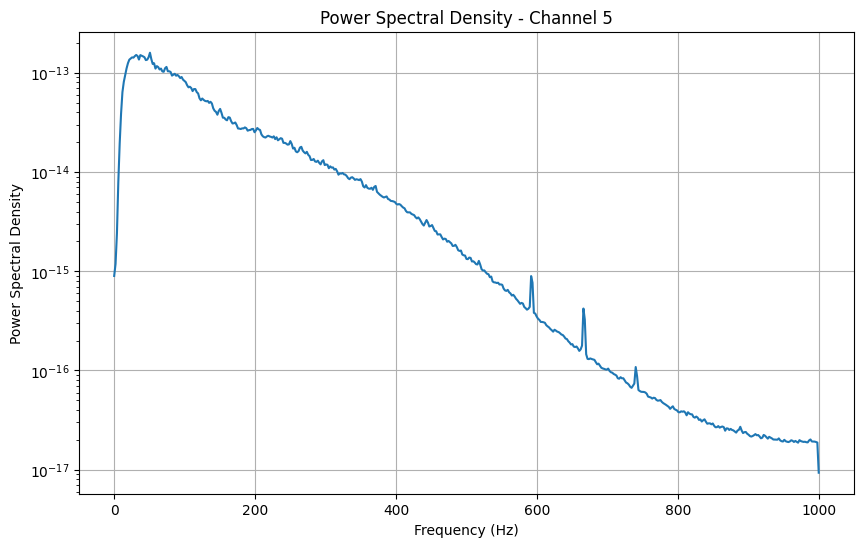

Channel 5: Maximum significant frequency = 492.19 Hz


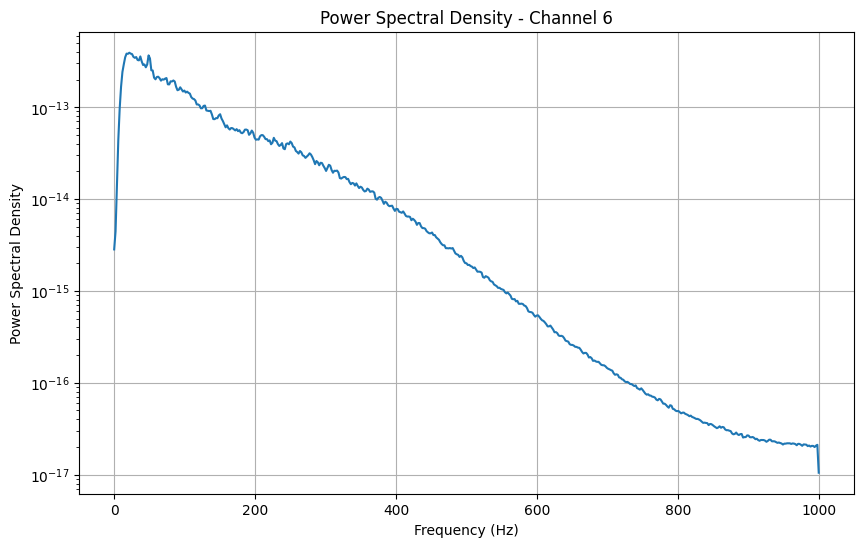

Channel 6: Maximum significant frequency = 455.08 Hz


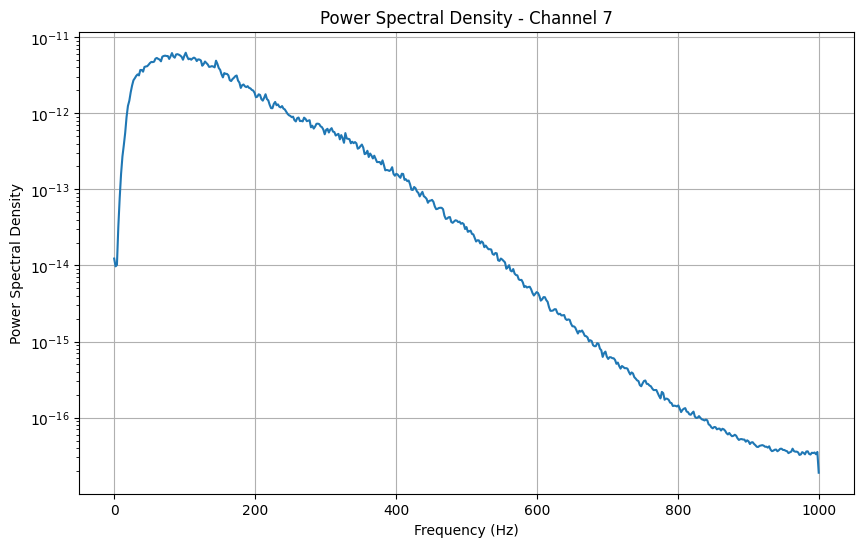

Channel 7: Maximum significant frequency = 453.12 Hz


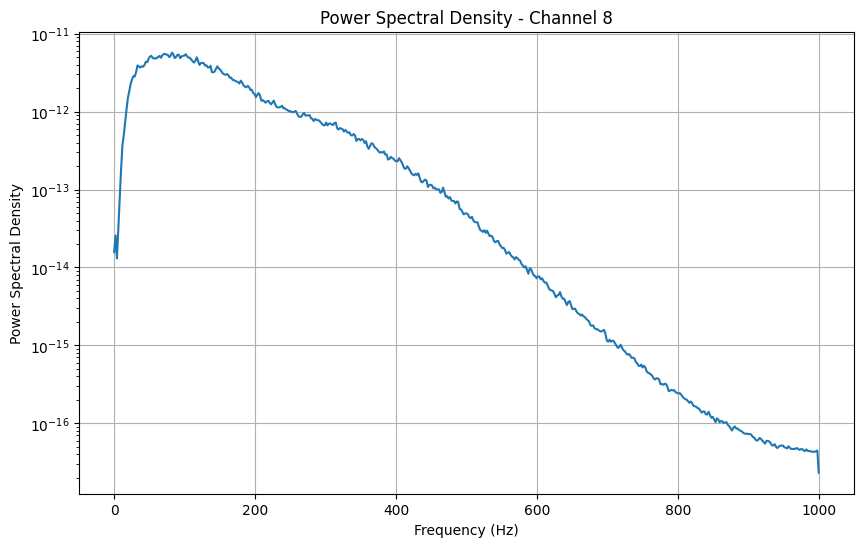

Channel 8: Maximum significant frequency = 488.28 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S12_E1_A1.mat


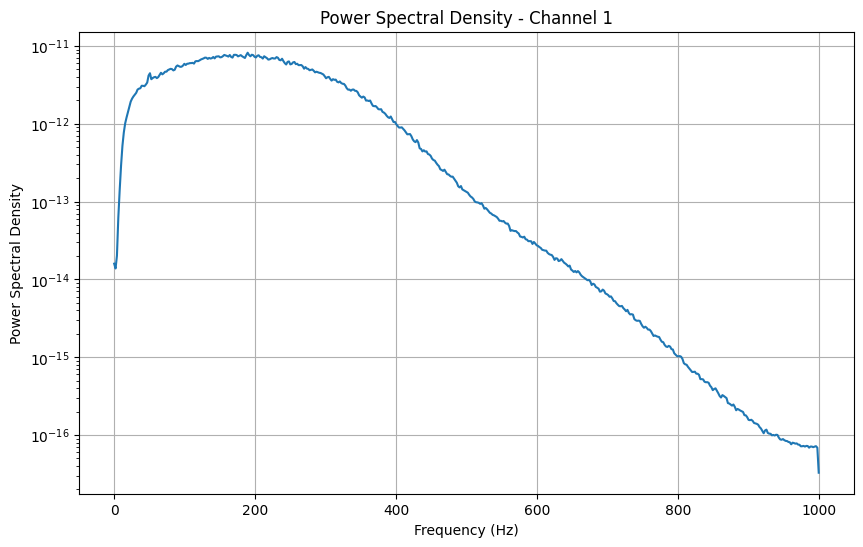

Channel 1: Maximum significant frequency = 527.34 Hz


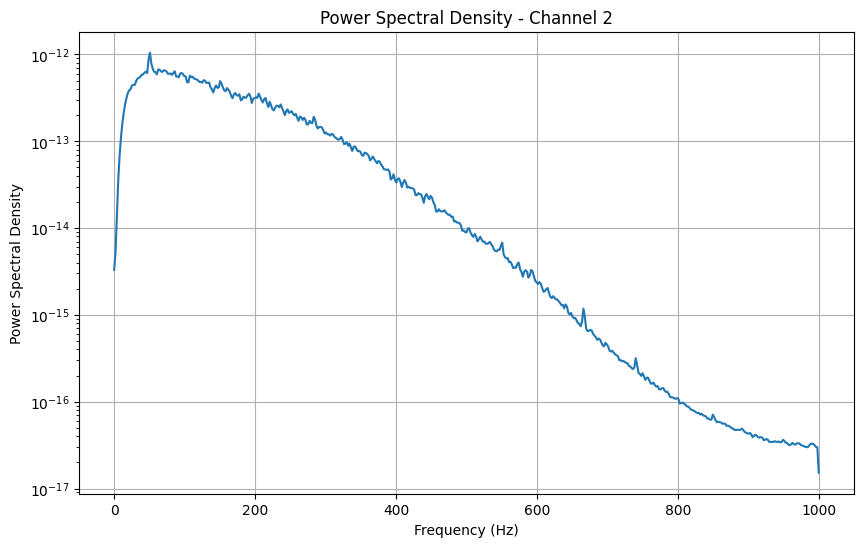

Channel 2: Maximum significant frequency = 492.19 Hz


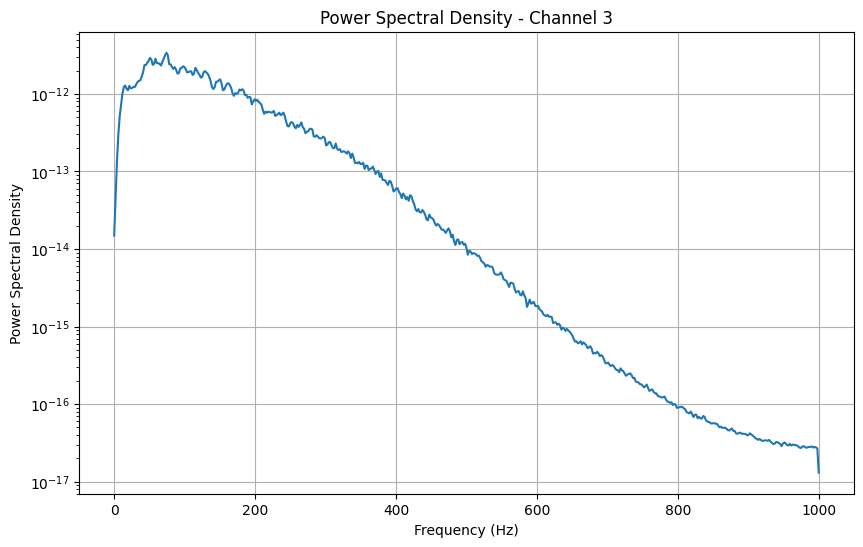

Channel 3: Maximum significant frequency = 425.78 Hz


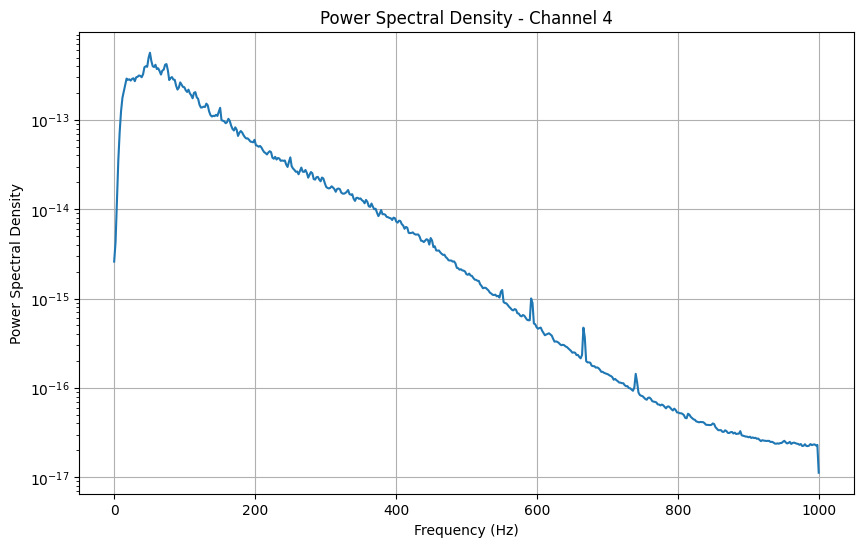

Channel 4: Maximum significant frequency = 416.02 Hz


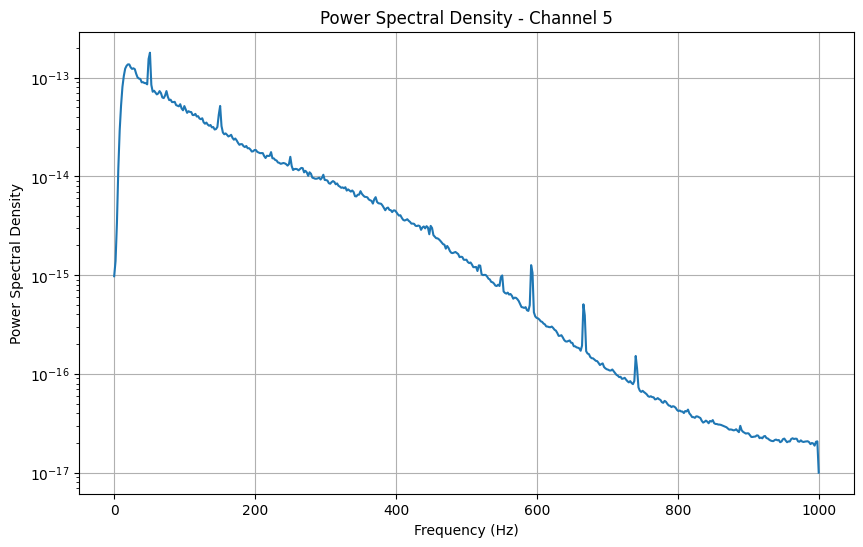

Channel 5: Maximum significant frequency = 474.61 Hz


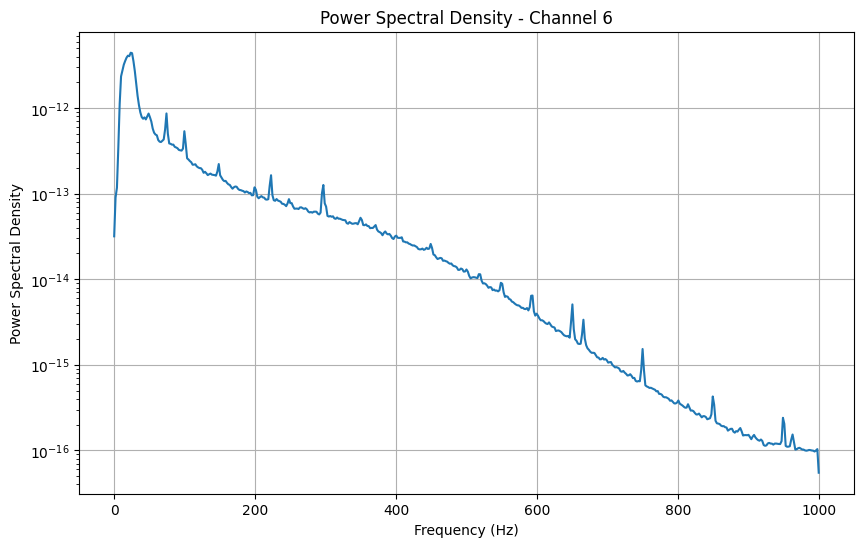

Channel 6: Maximum significant frequency = 351.56 Hz


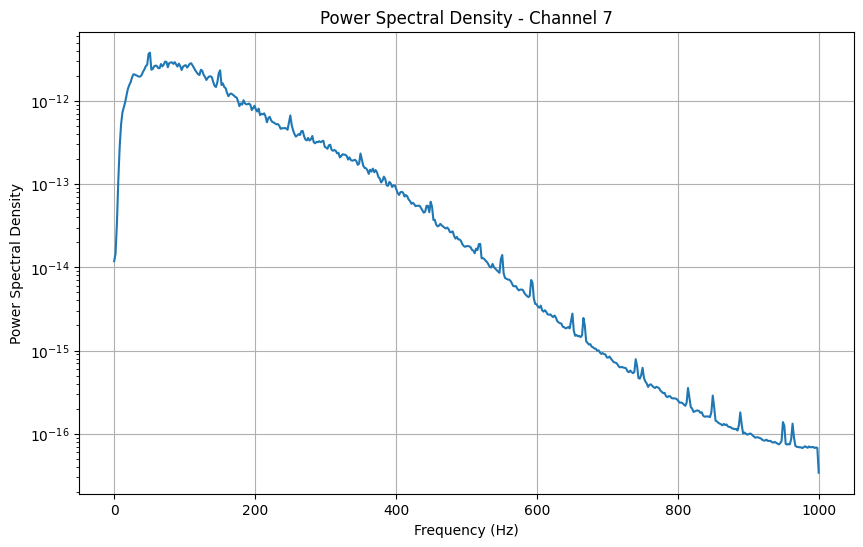

Channel 7: Maximum significant frequency = 451.17 Hz


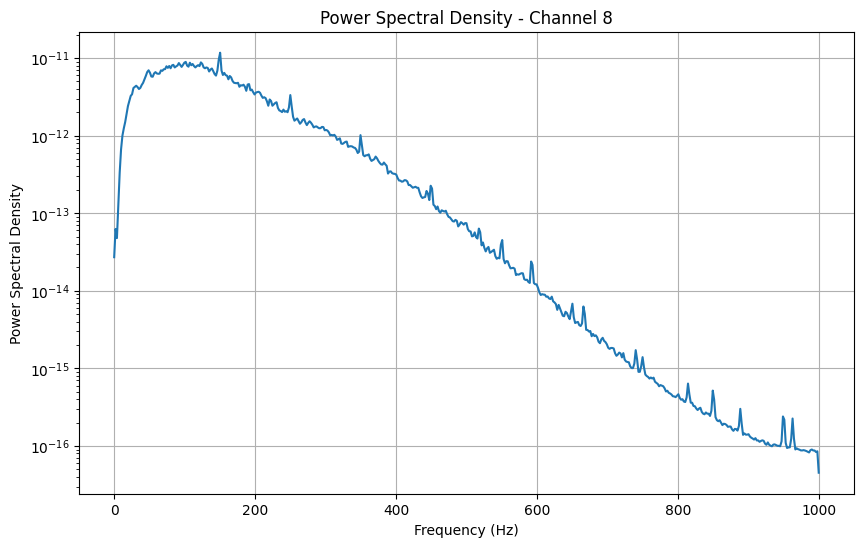

Channel 8: Maximum significant frequency = 458.98 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S11_E1_A1.mat


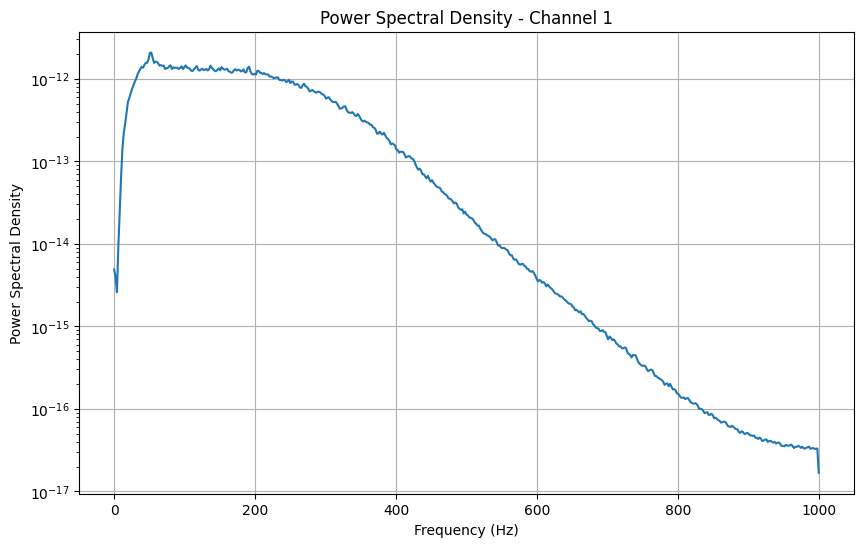

Channel 1: Maximum significant frequency = 503.91 Hz


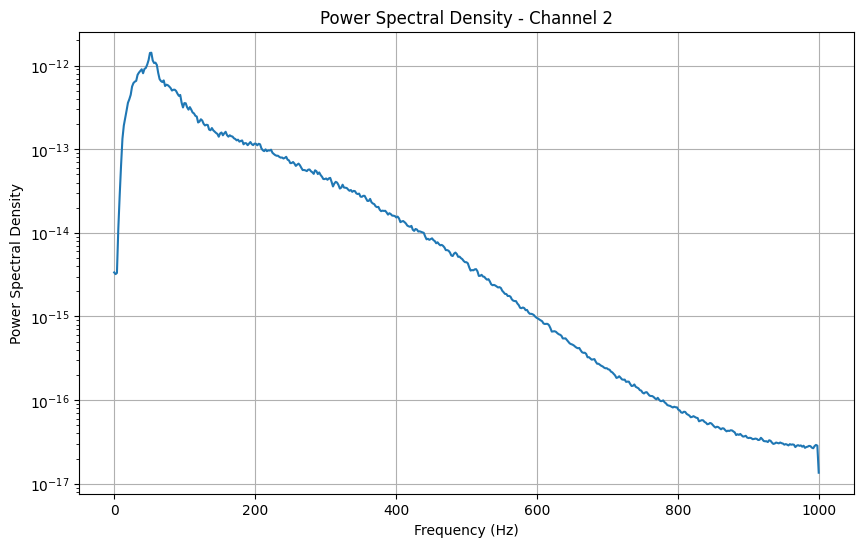

Channel 2: Maximum significant frequency = 404.30 Hz


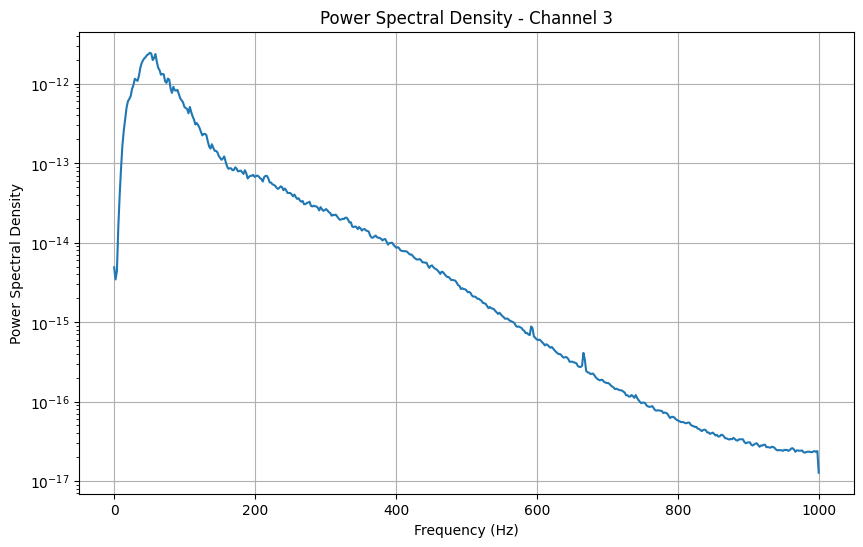

Channel 3: Maximum significant frequency = 302.73 Hz


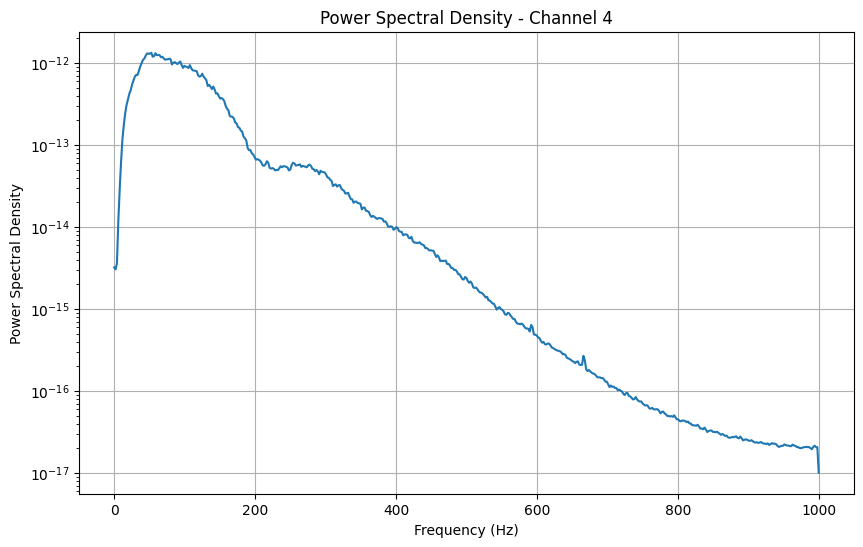

Channel 4: Maximum significant frequency = 369.14 Hz


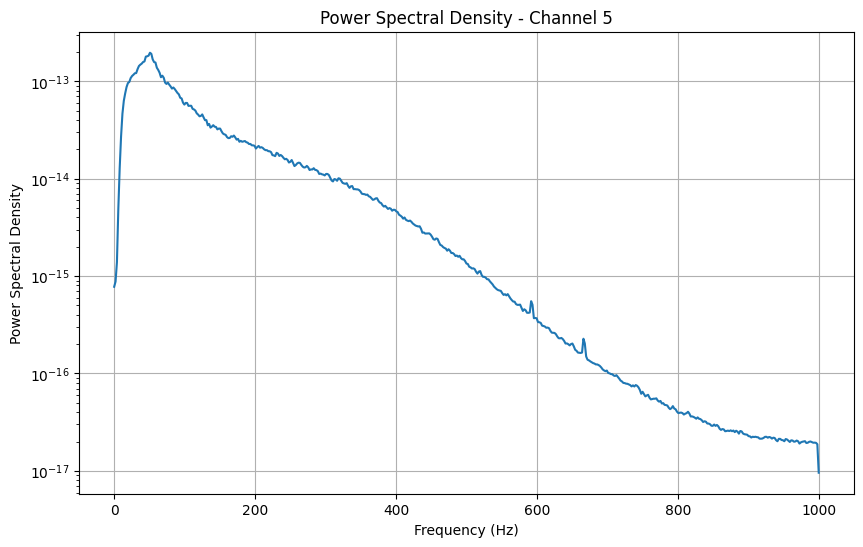

Channel 5: Maximum significant frequency = 466.80 Hz


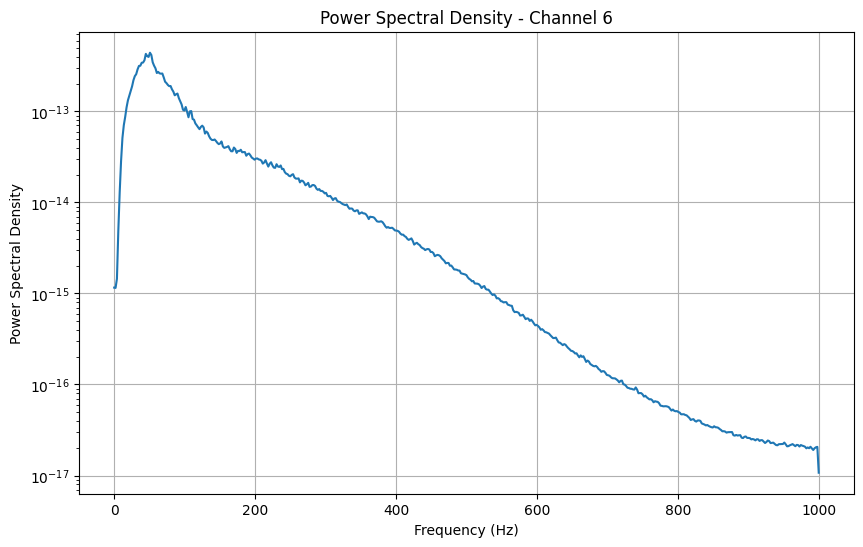

Channel 6: Maximum significant frequency = 410.16 Hz


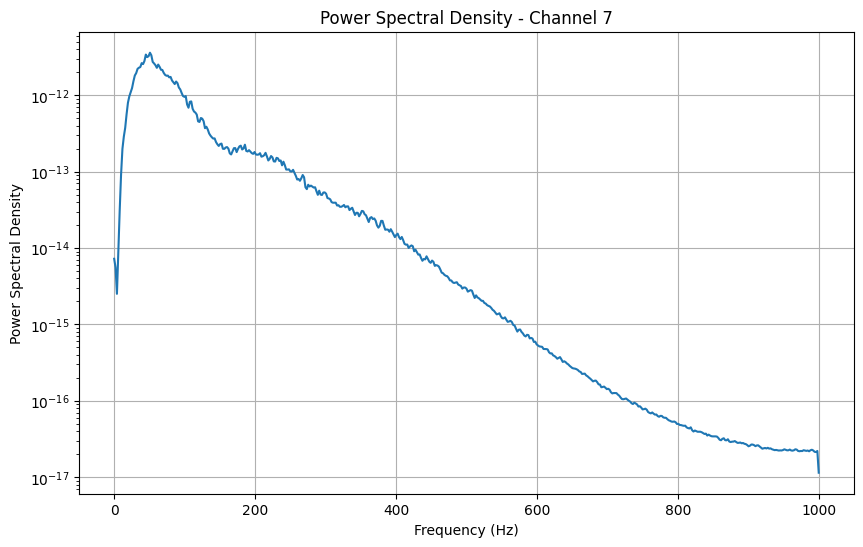

Channel 7: Maximum significant frequency = 326.17 Hz


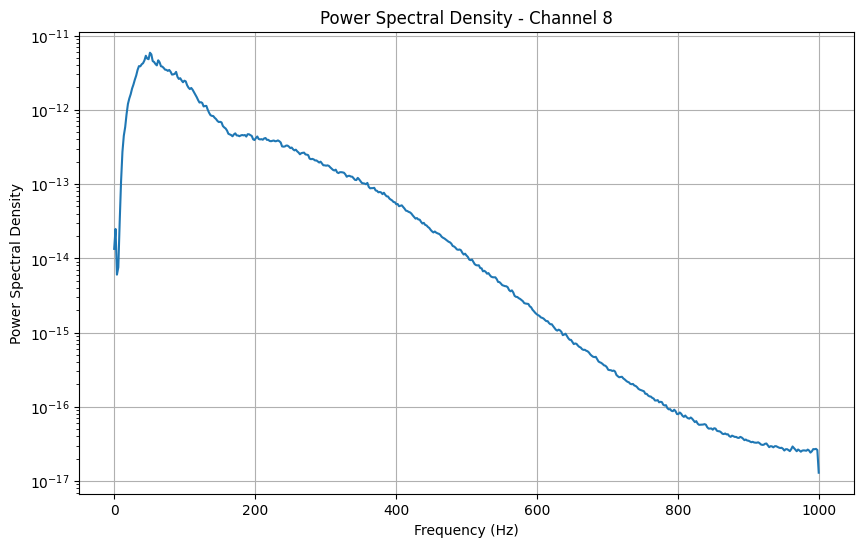

Channel 8: Maximum significant frequency = 394.53 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S14_E1_A1.mat


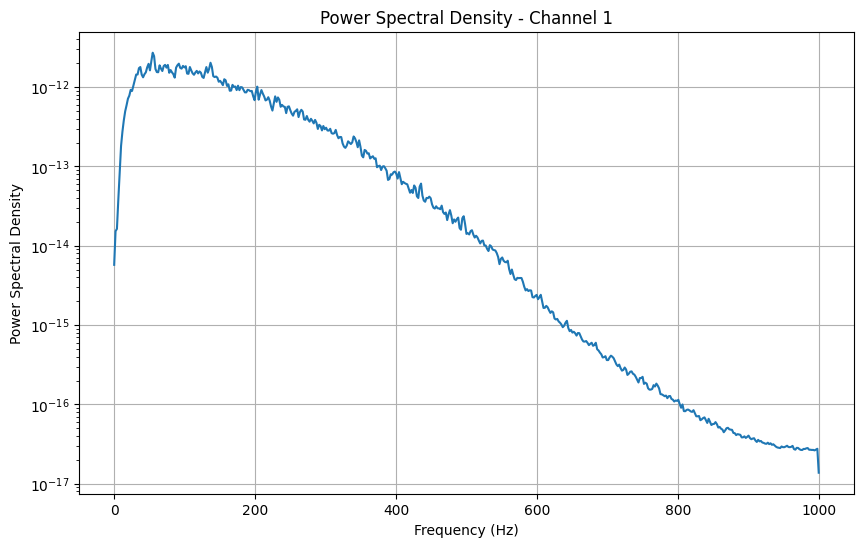

Channel 1: Maximum significant frequency = 476.56 Hz


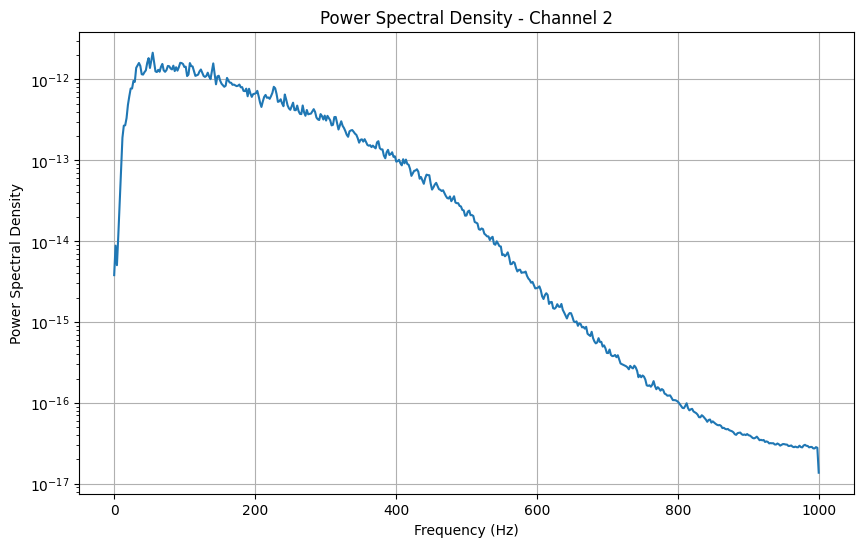

Channel 2: Maximum significant frequency = 503.91 Hz


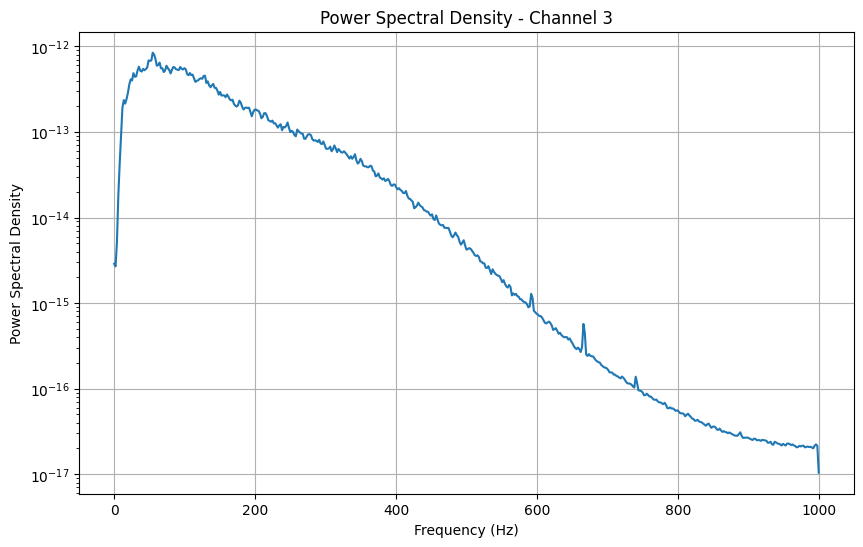

Channel 3: Maximum significant frequency = 460.94 Hz


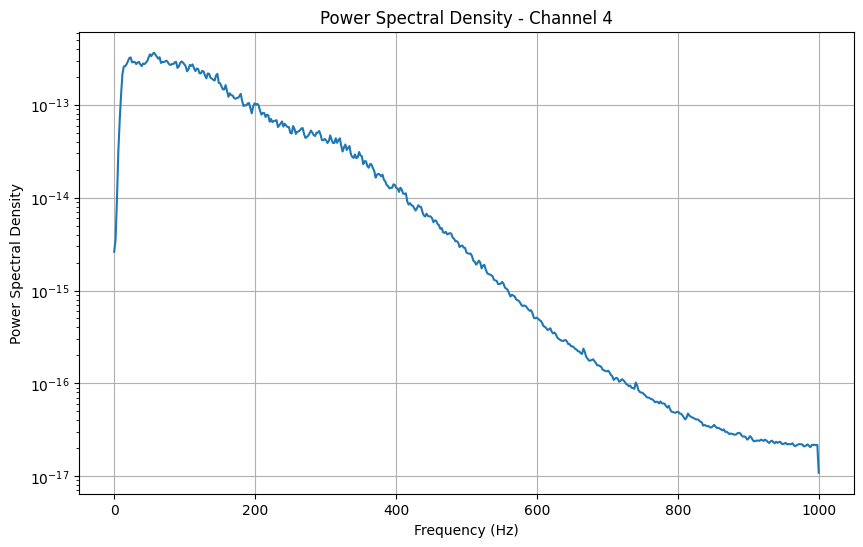

Channel 4: Maximum significant frequency = 480.47 Hz


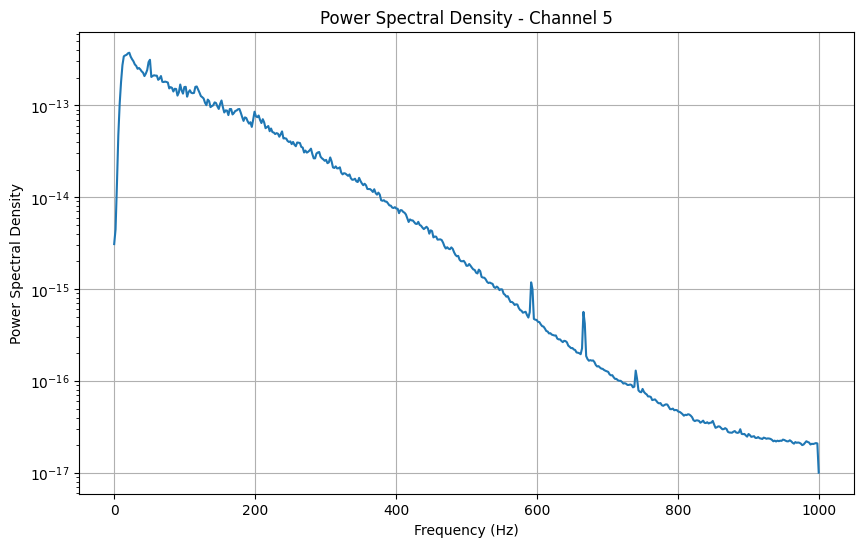

Channel 5: Maximum significant frequency = 451.17 Hz


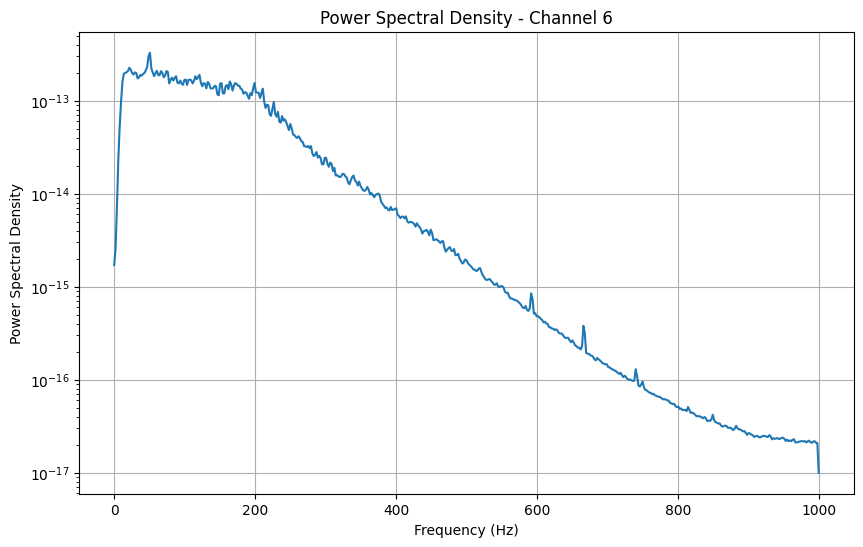

Channel 6: Maximum significant frequency = 451.17 Hz


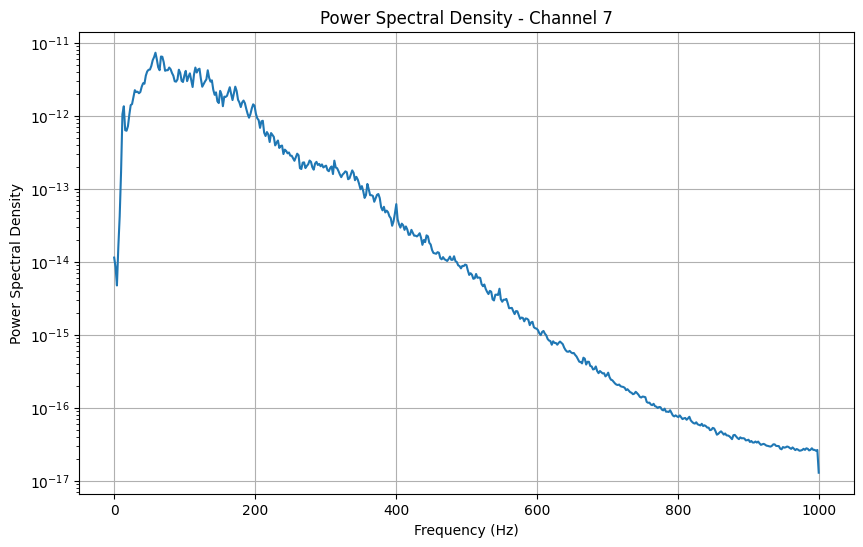

Channel 7: Maximum significant frequency = 376.95 Hz


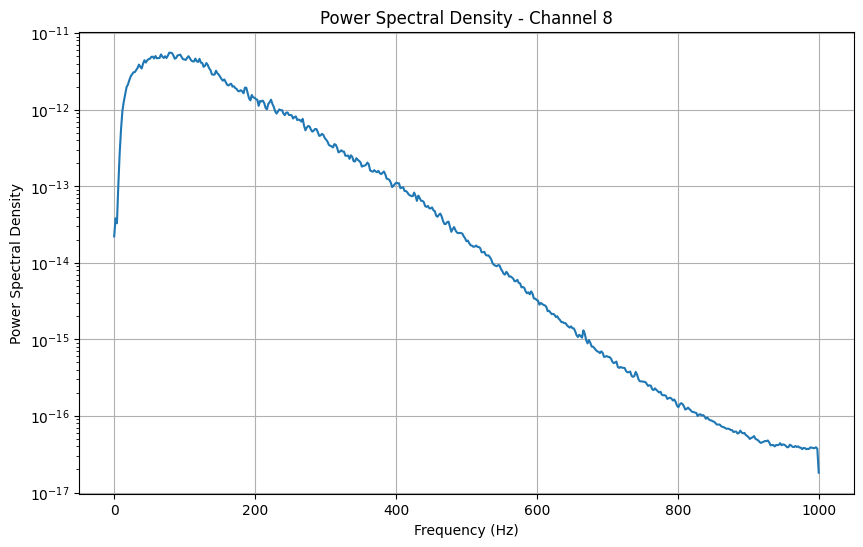

Channel 8: Maximum significant frequency = 439.45 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S13_E1_A1.mat


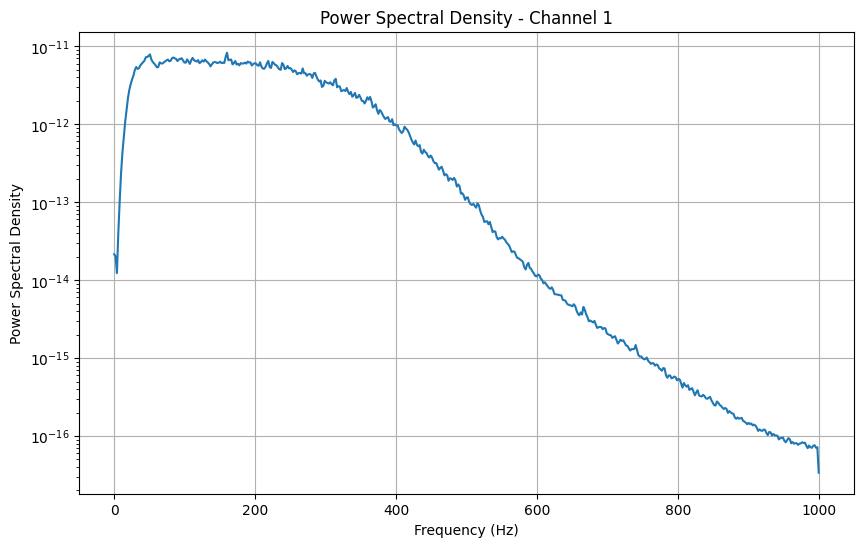

Channel 1: Maximum significant frequency = 517.58 Hz


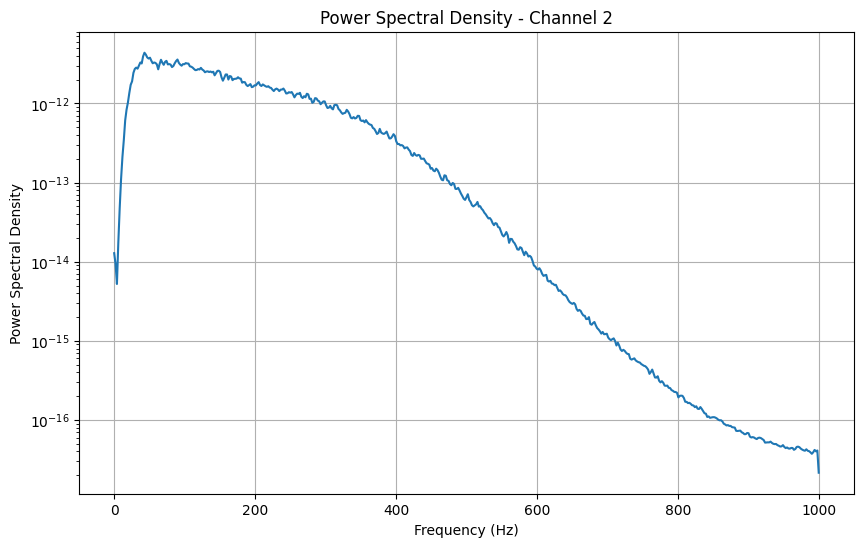

Channel 2: Maximum significant frequency = 523.44 Hz


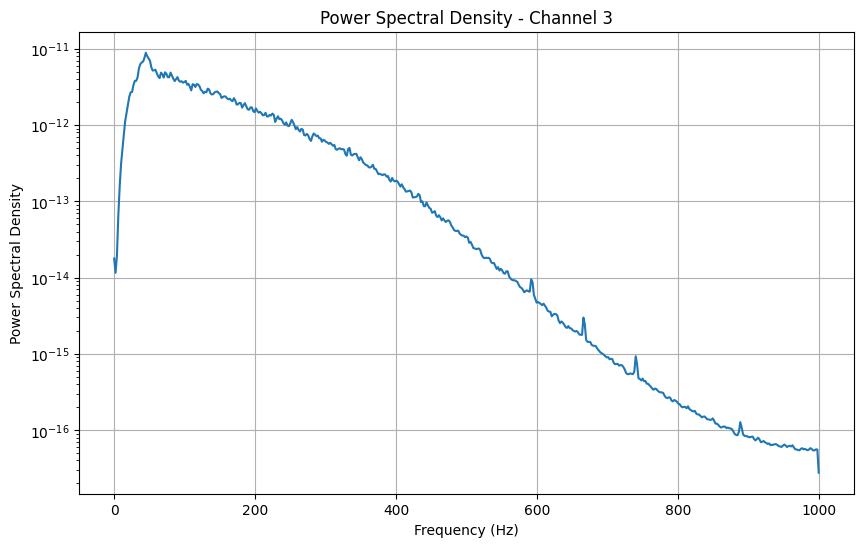

Channel 3: Maximum significant frequency = 443.36 Hz


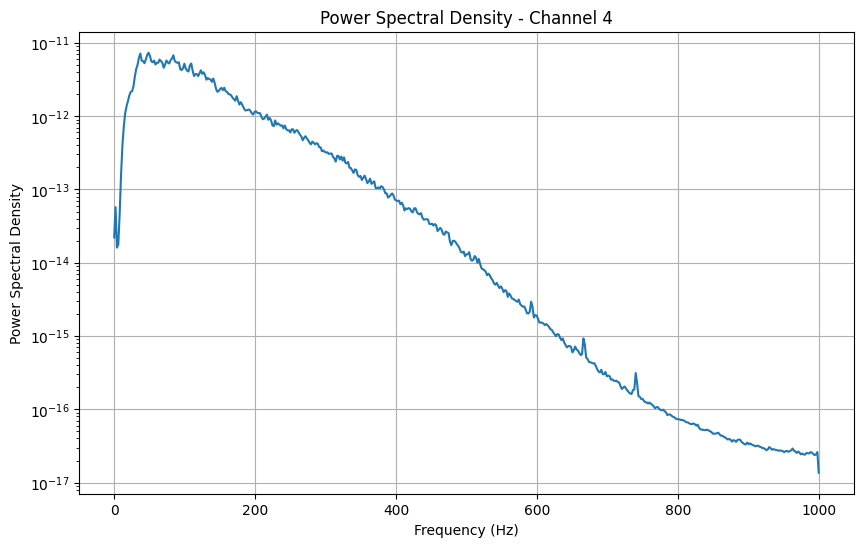

Channel 4: Maximum significant frequency = 396.48 Hz


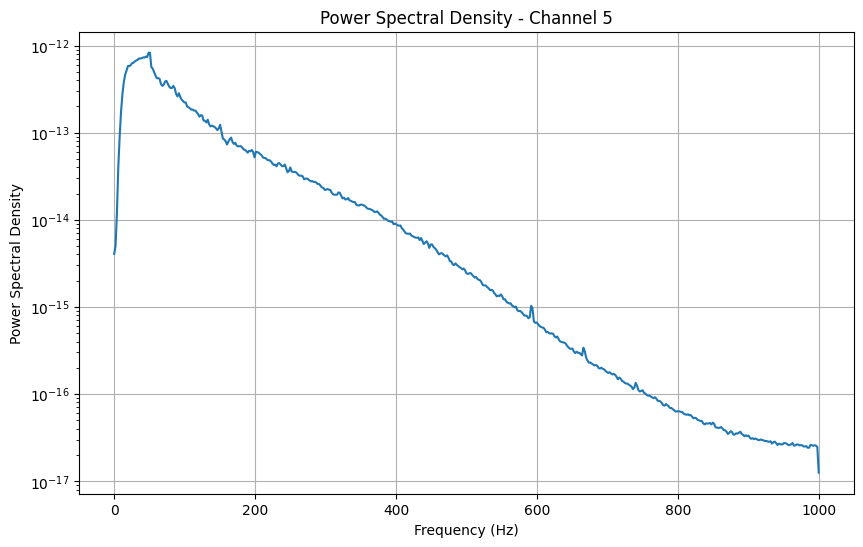

Channel 5: Maximum significant frequency = 406.25 Hz


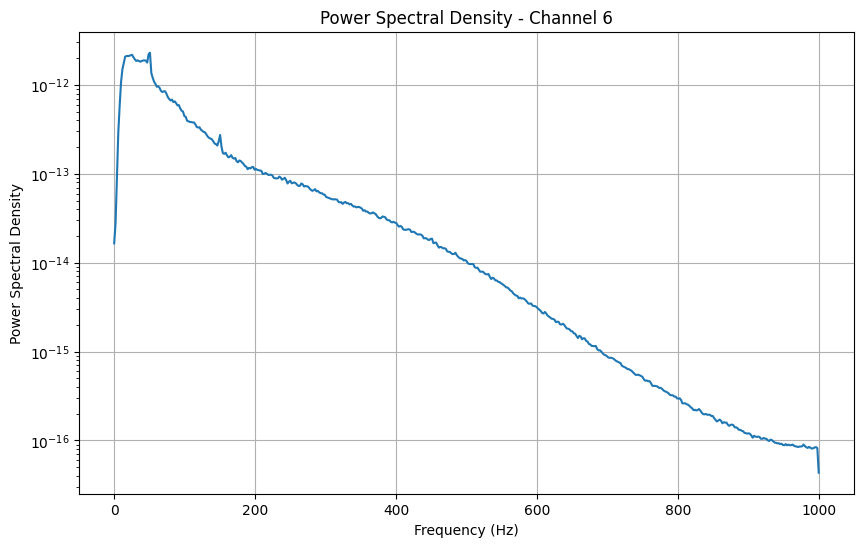

Channel 6: Maximum significant frequency = 419.92 Hz


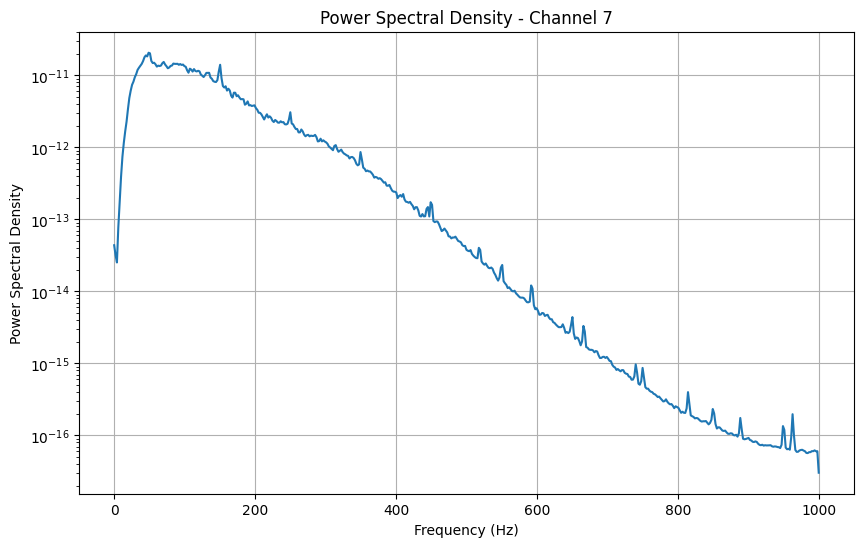

Channel 7: Maximum significant frequency = 410.16 Hz


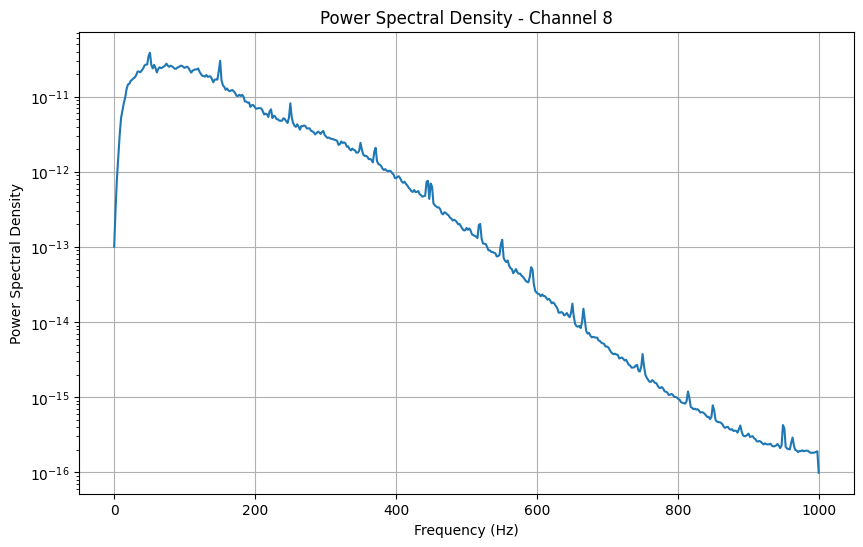

Channel 8: Maximum significant frequency = 451.17 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S16_E1_A1.mat


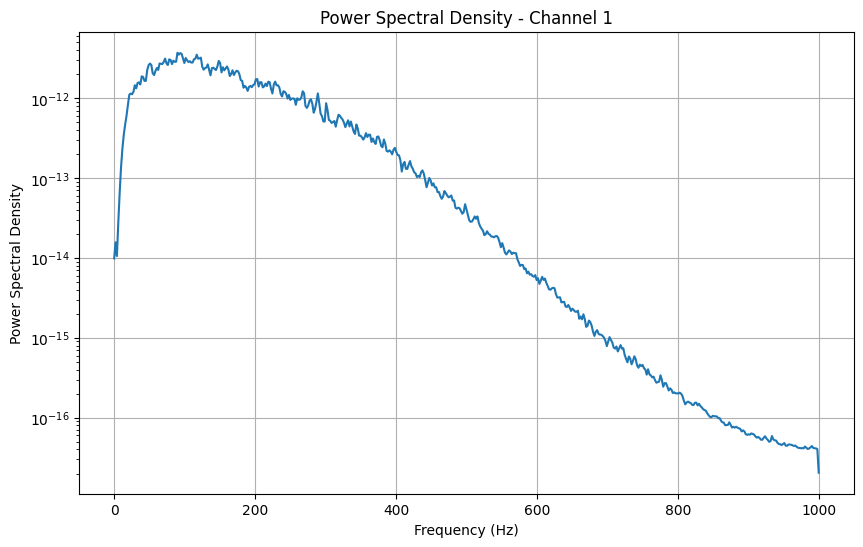

Channel 1: Maximum significant frequency = 500.00 Hz


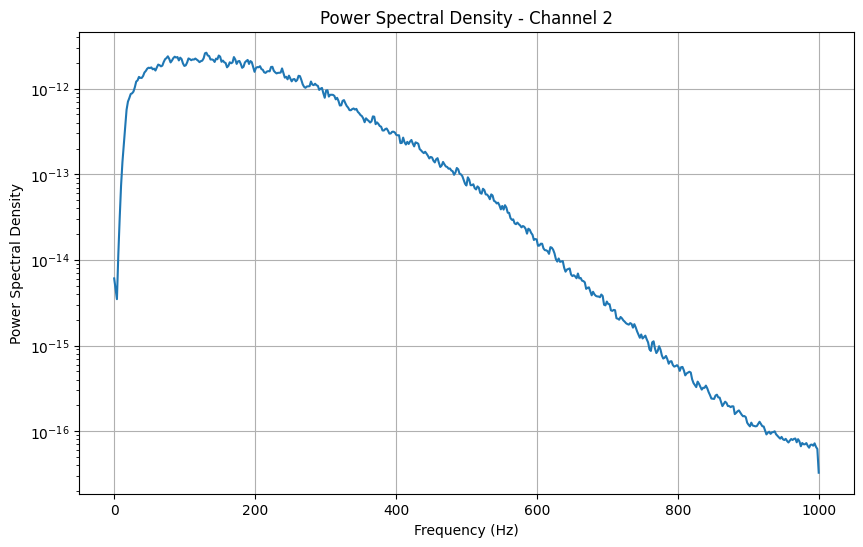

Channel 2: Maximum significant frequency = 572.27 Hz


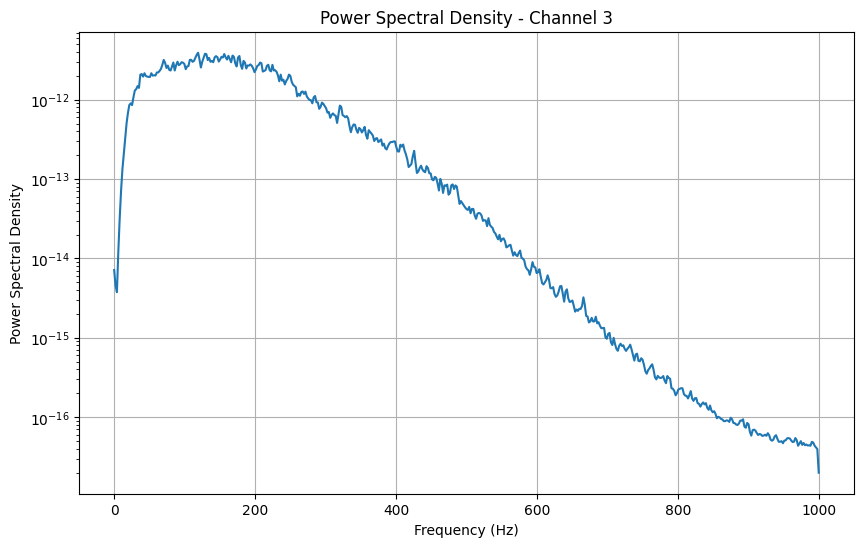

Channel 3: Maximum significant frequency = 509.77 Hz


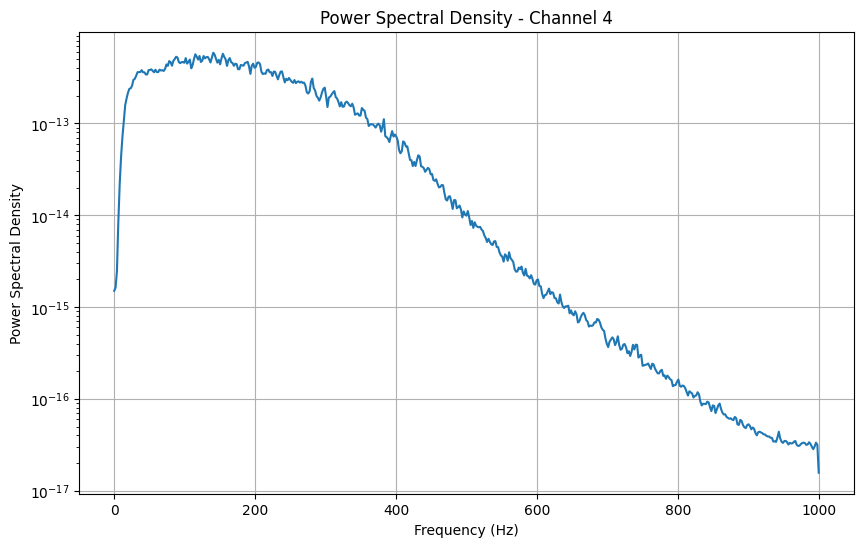

Channel 4: Maximum significant frequency = 525.39 Hz


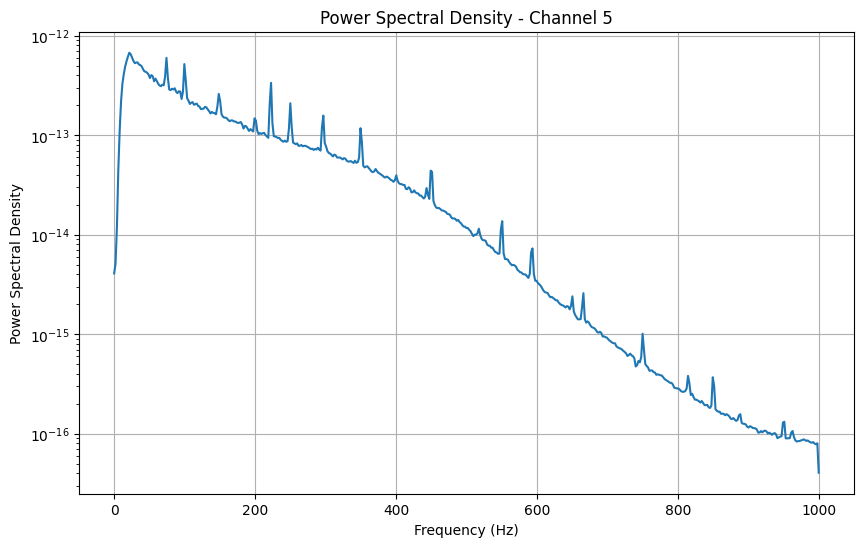

Channel 5: Maximum significant frequency = 593.75 Hz


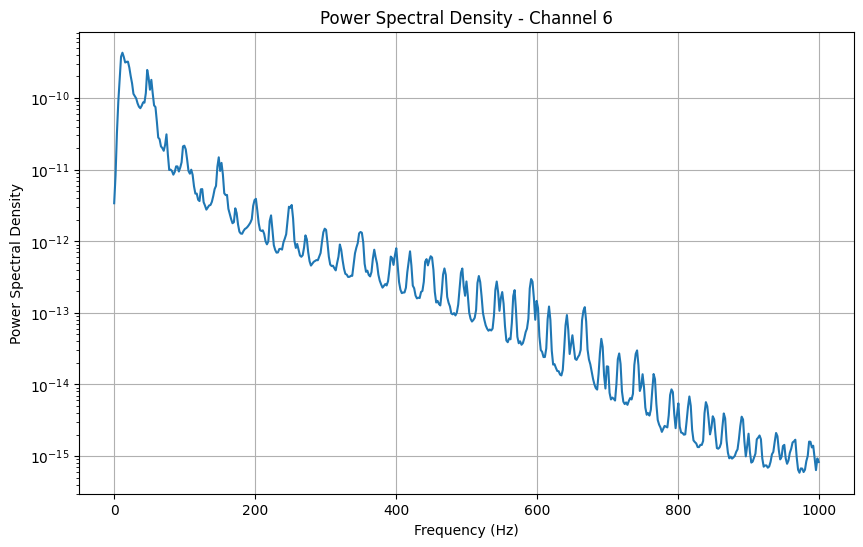

Channel 6: Maximum significant frequency = 160.16 Hz


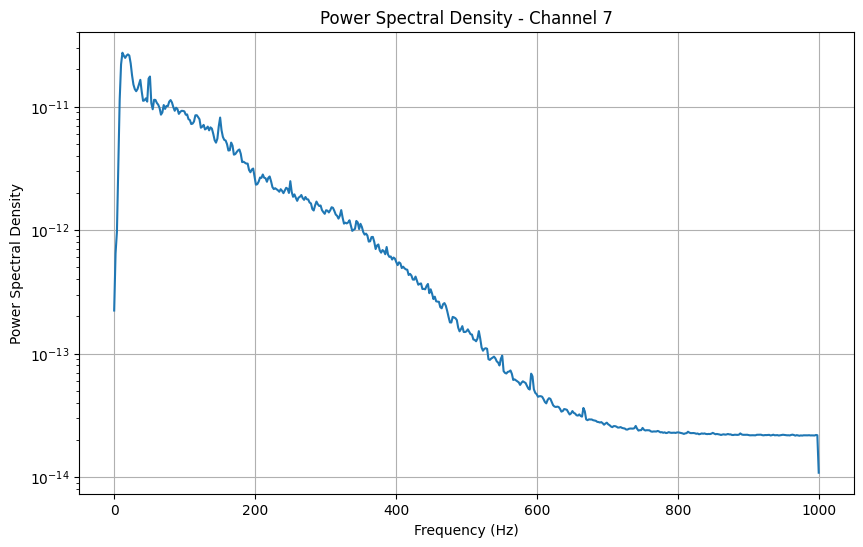

Channel 7: Maximum significant frequency = 455.08 Hz


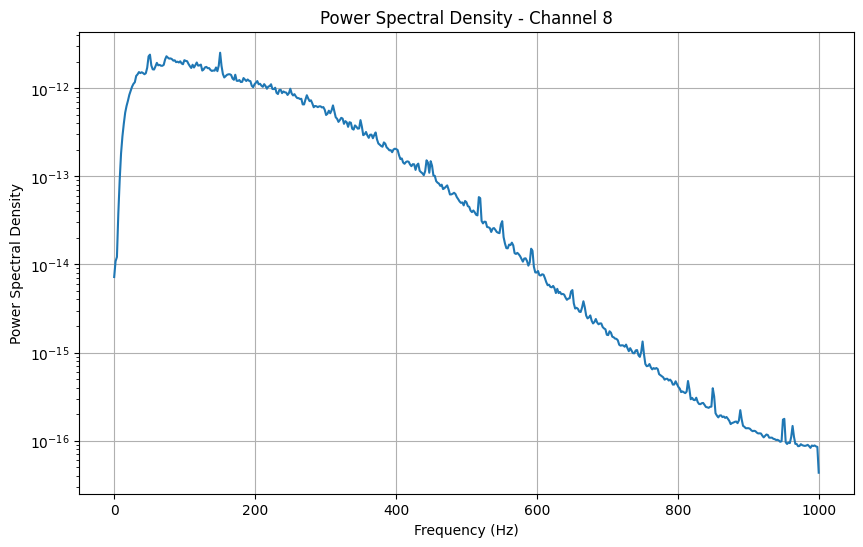

Channel 8: Maximum significant frequency = 550.78 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S15_E1_A1.mat


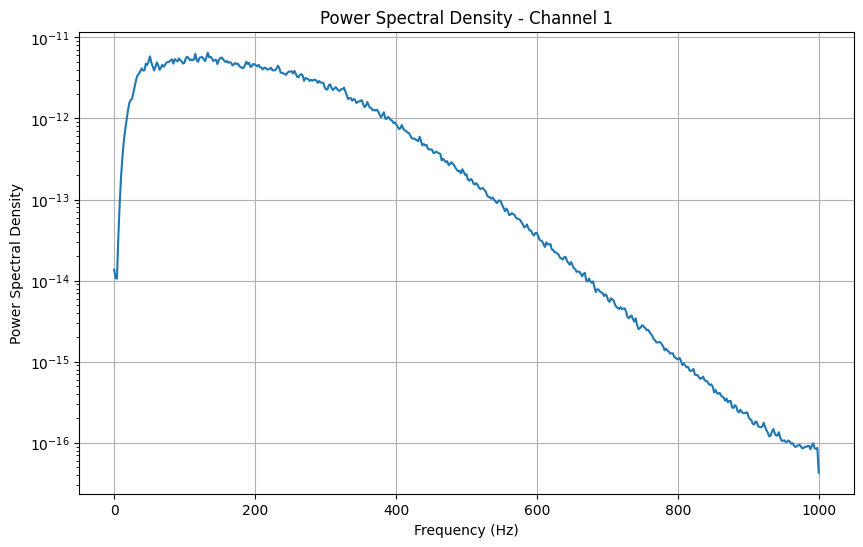

Channel 1: Maximum significant frequency = 568.36 Hz


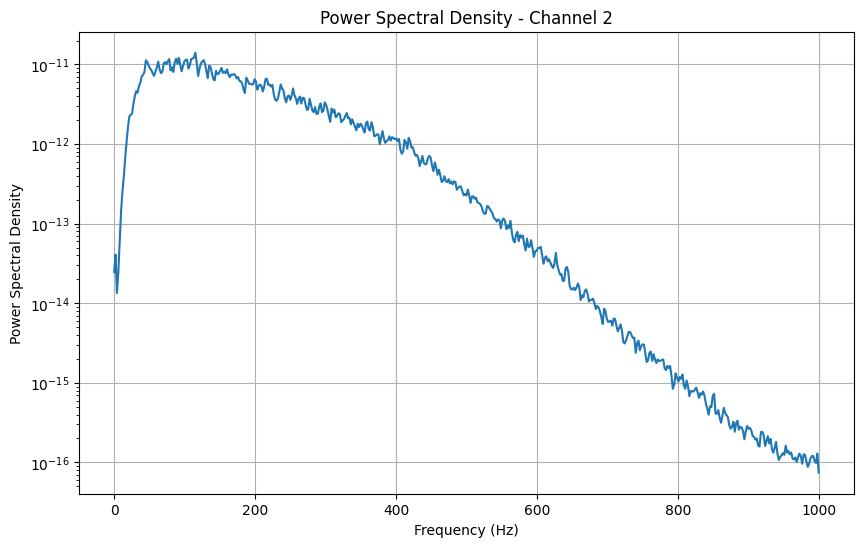

Channel 2: Maximum significant frequency = 535.16 Hz


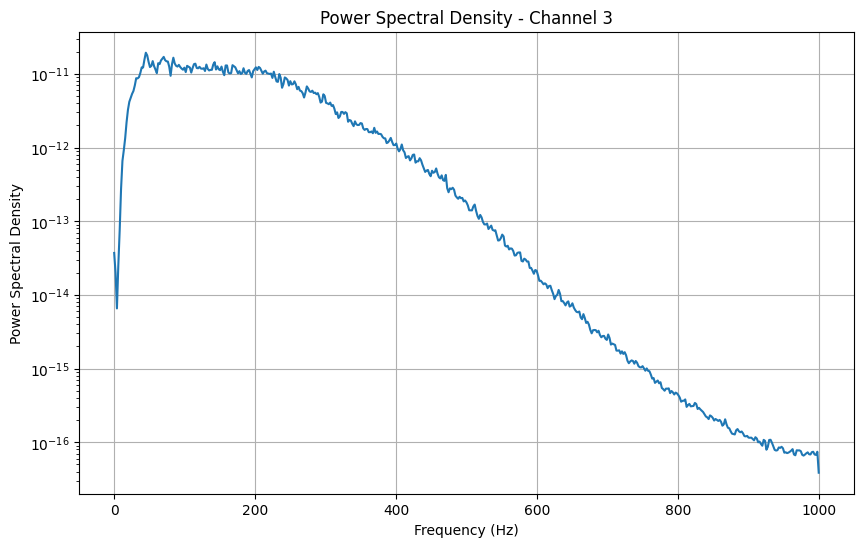

Channel 3: Maximum significant frequency = 494.14 Hz


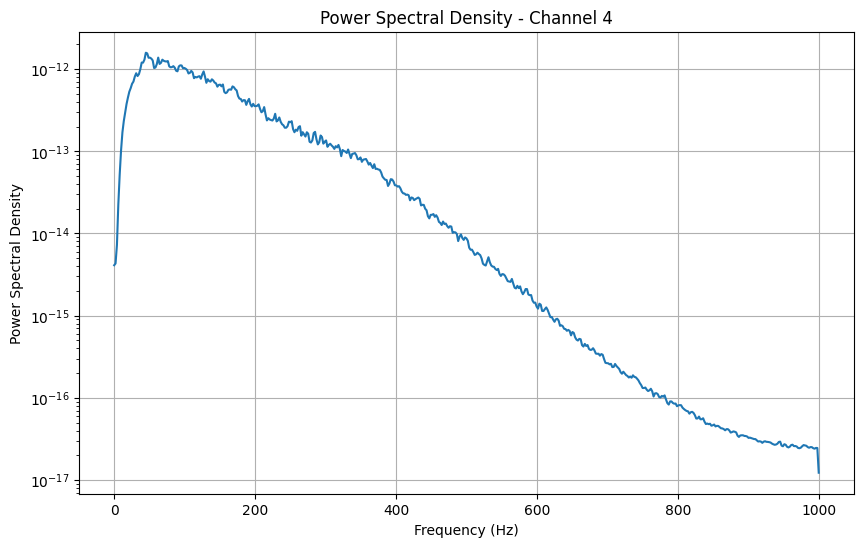

Channel 4: Maximum significant frequency = 457.03 Hz


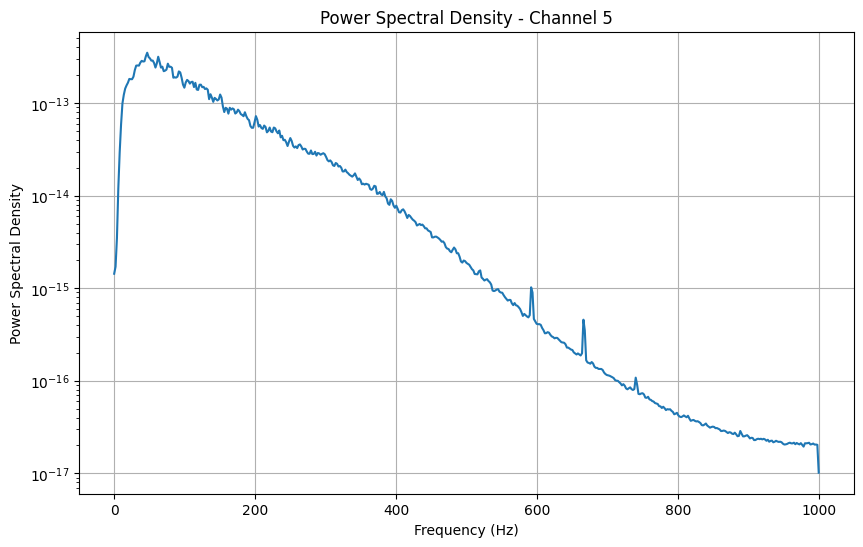

Channel 5: Maximum significant frequency = 458.98 Hz


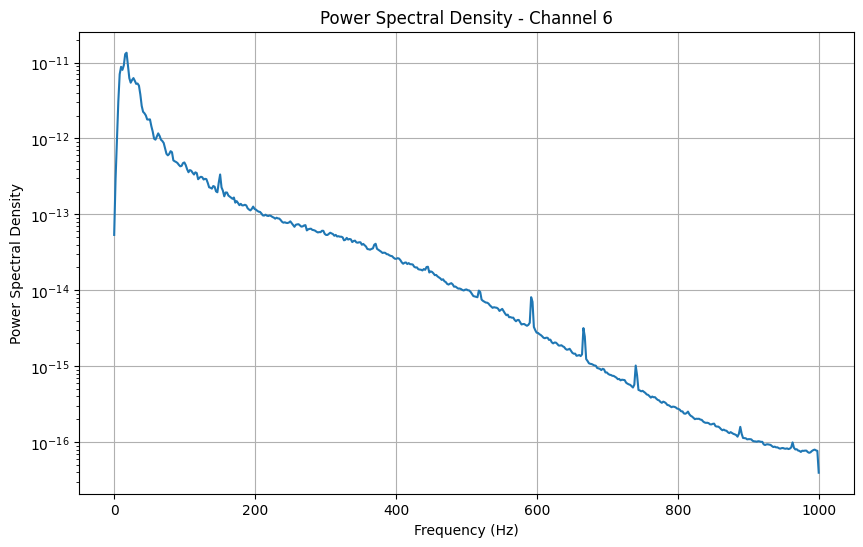

Channel 6: Maximum significant frequency = 179.69 Hz


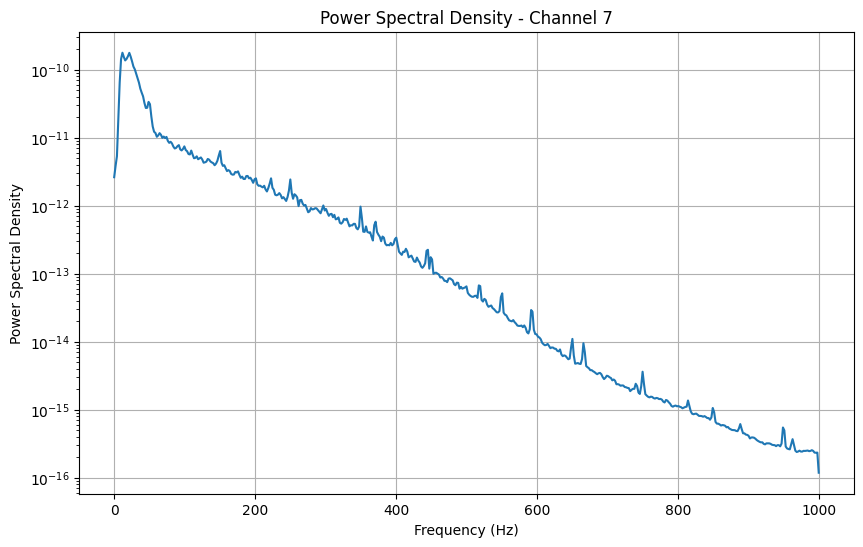

Channel 7: Maximum significant frequency = 250.00 Hz


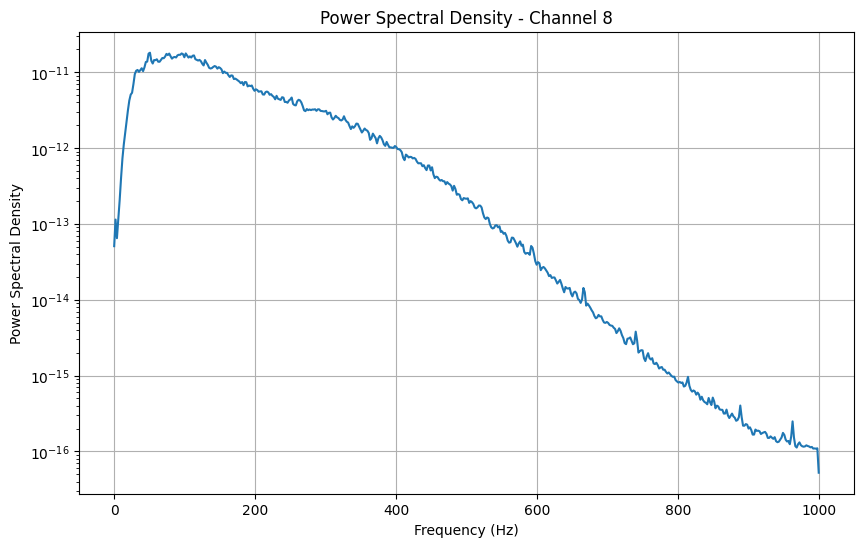

Channel 8: Maximum significant frequency = 509.77 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S17_E1_A1.mat


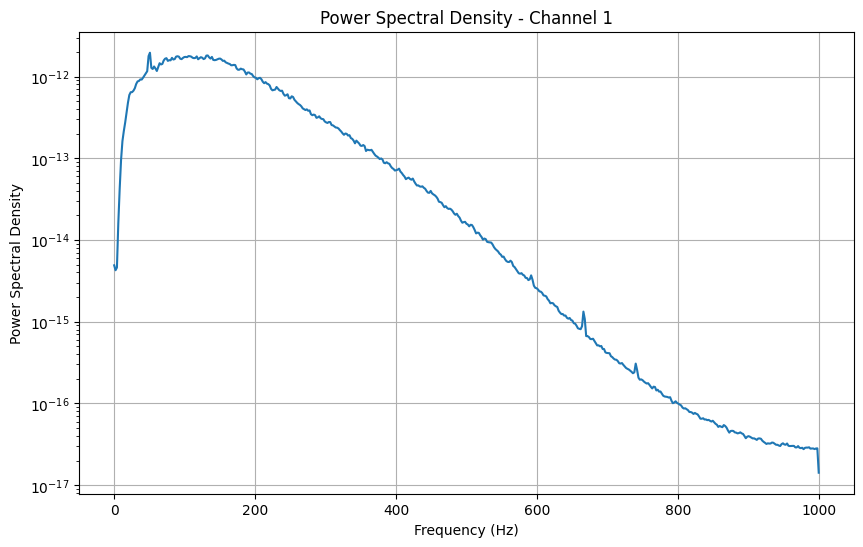

Channel 1: Maximum significant frequency = 488.28 Hz


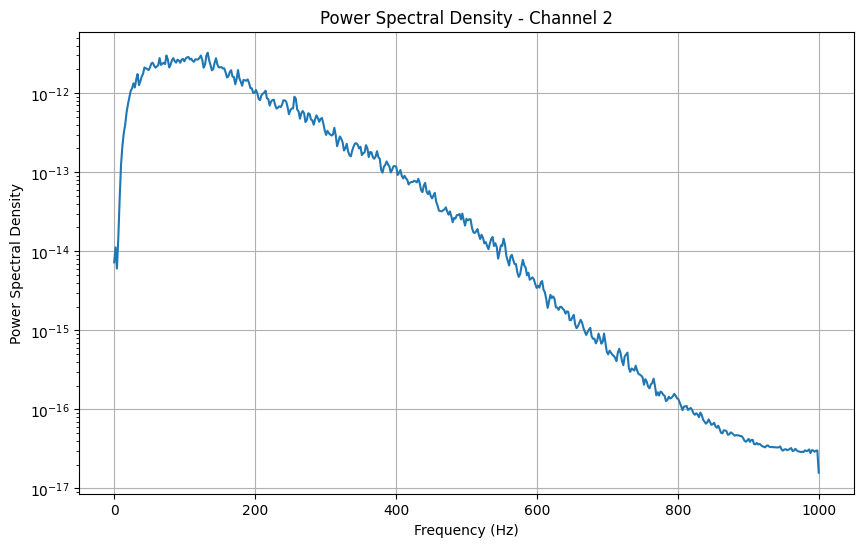

Channel 2: Maximum significant frequency = 470.70 Hz


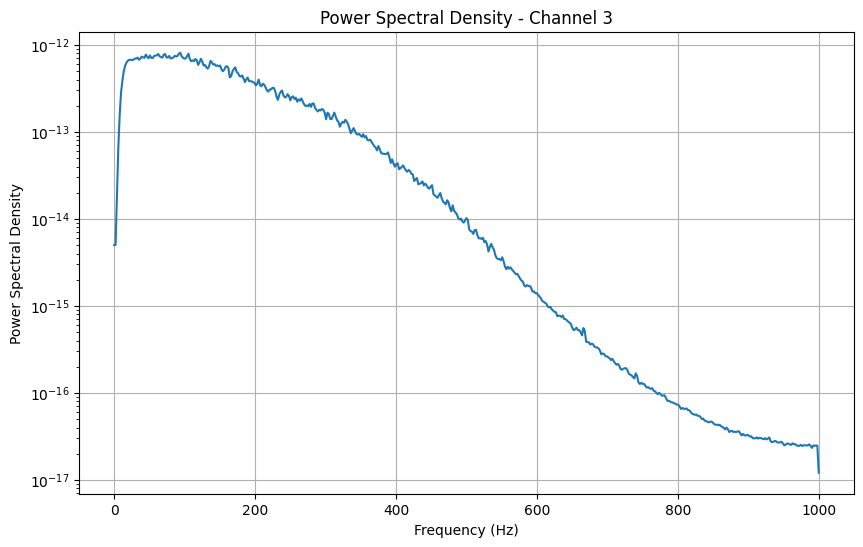

Channel 3: Maximum significant frequency = 501.95 Hz


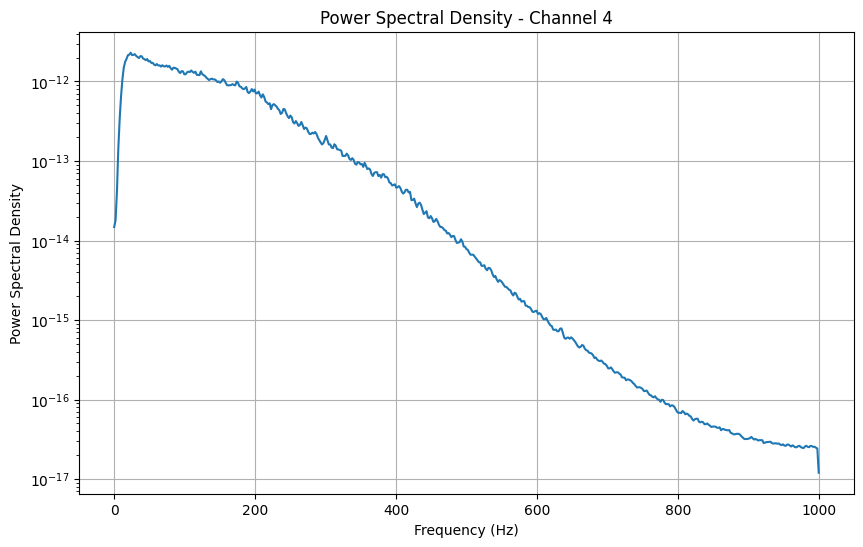

Channel 4: Maximum significant frequency = 443.36 Hz


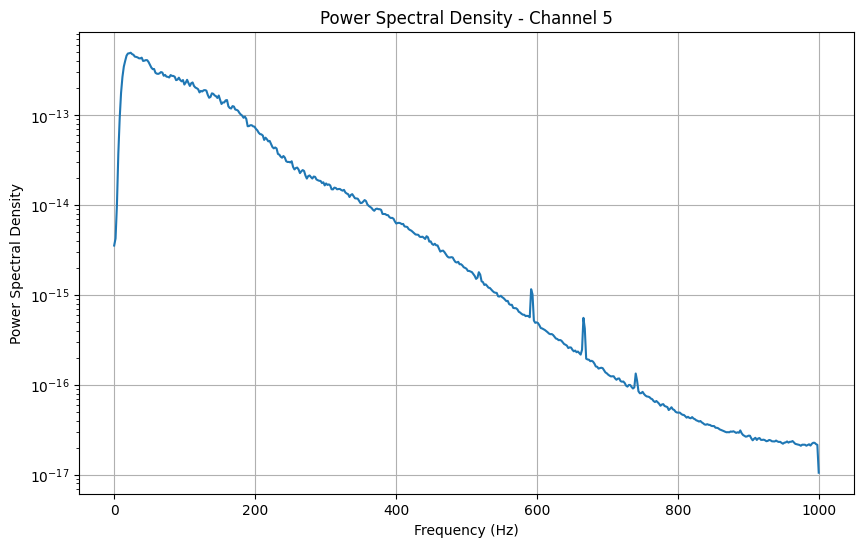

Channel 5: Maximum significant frequency = 423.83 Hz


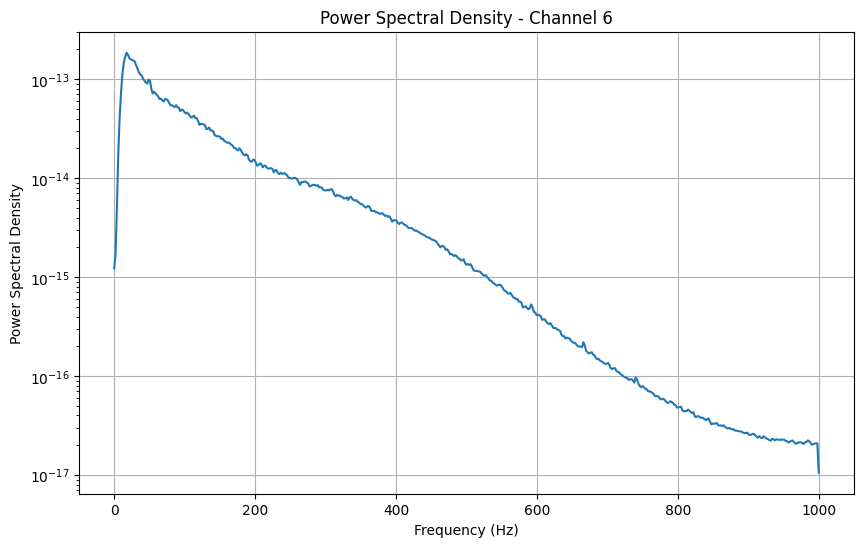

Channel 6: Maximum significant frequency = 472.66 Hz


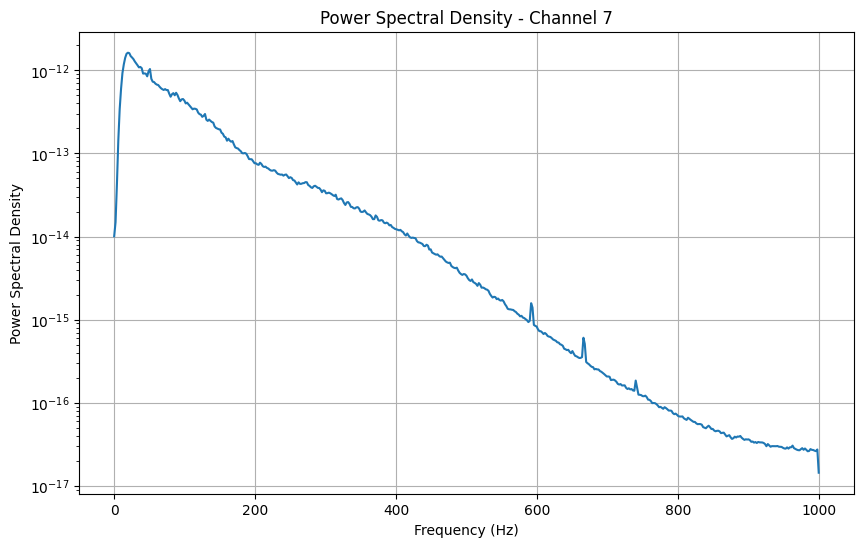

Channel 7: Maximum significant frequency = 373.05 Hz


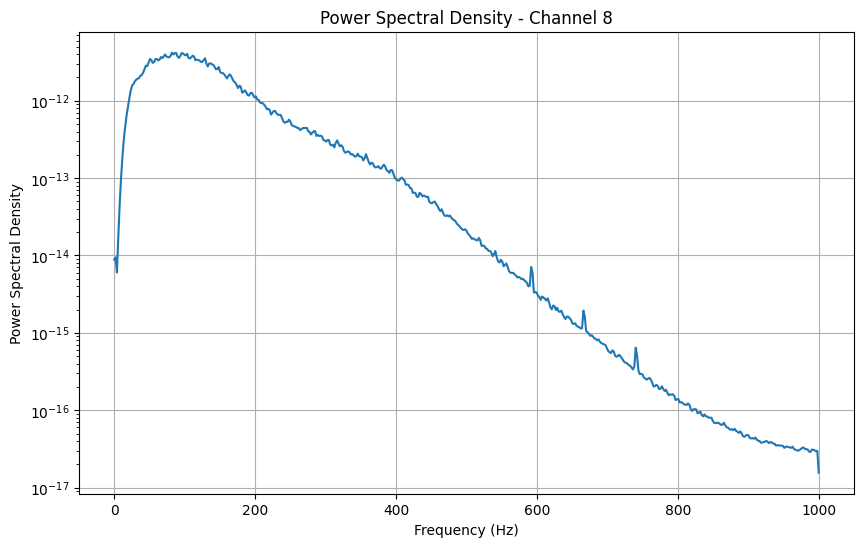

Channel 8: Maximum significant frequency = 458.98 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S18_E1_A1.mat


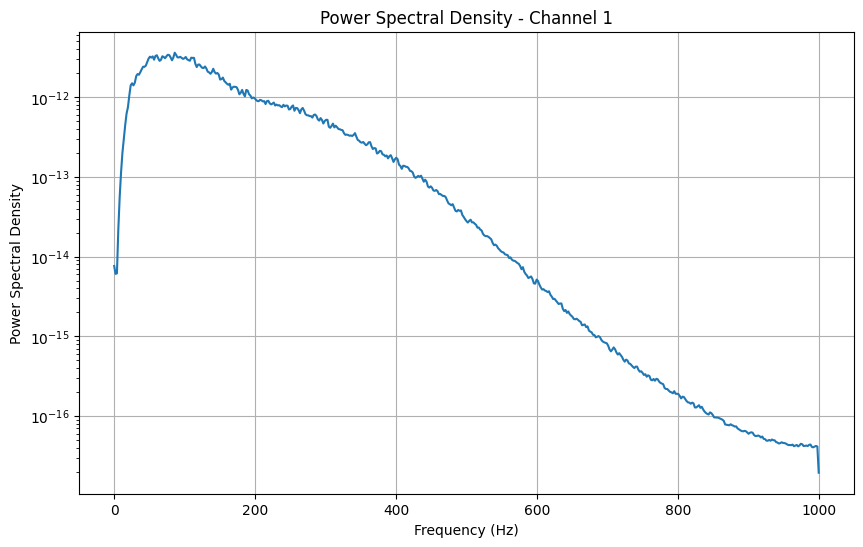

Channel 1: Maximum significant frequency = 492.19 Hz


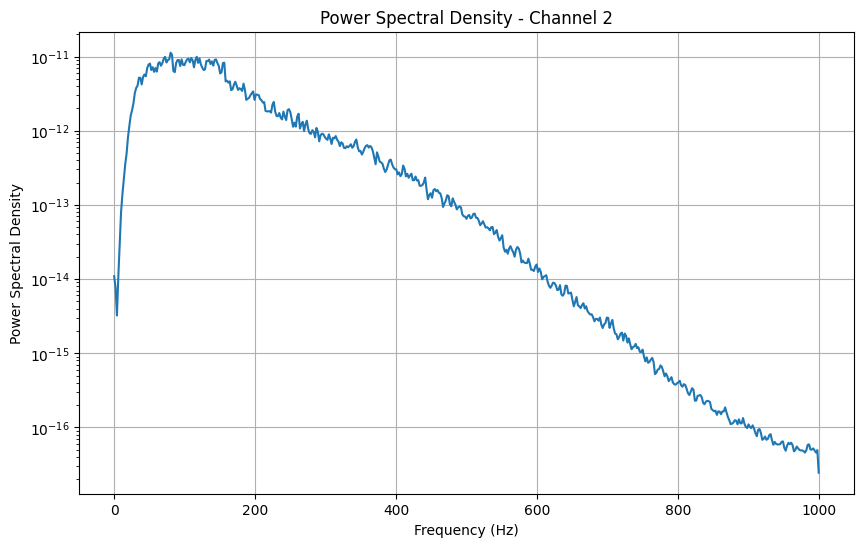

Channel 2: Maximum significant frequency = 480.47 Hz


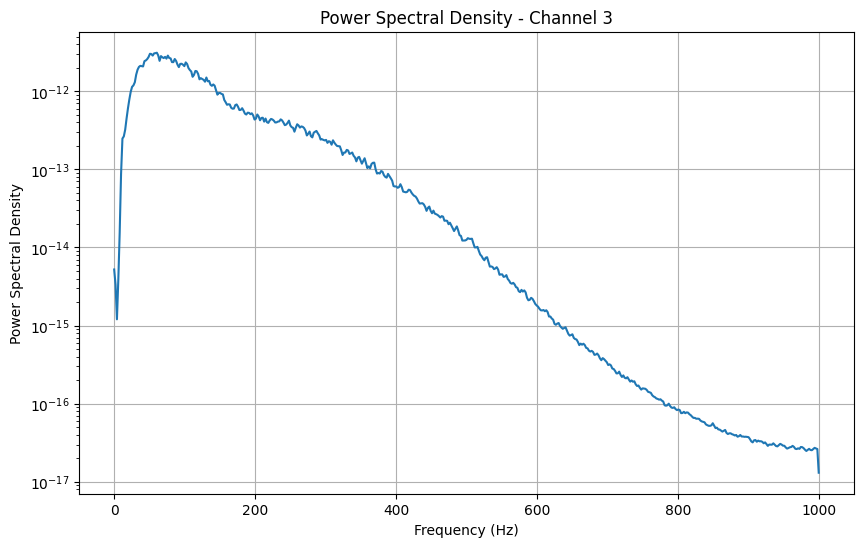

Channel 3: Maximum significant frequency = 447.27 Hz


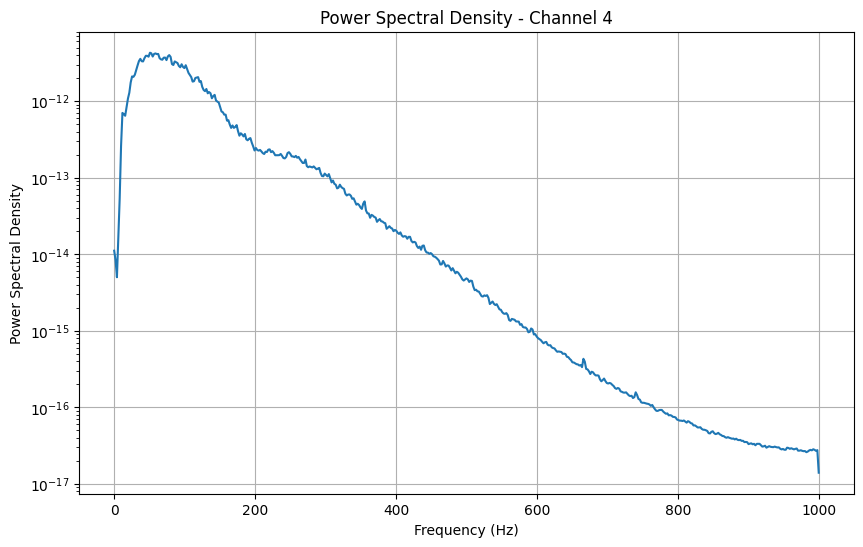

Channel 4: Maximum significant frequency = 355.47 Hz


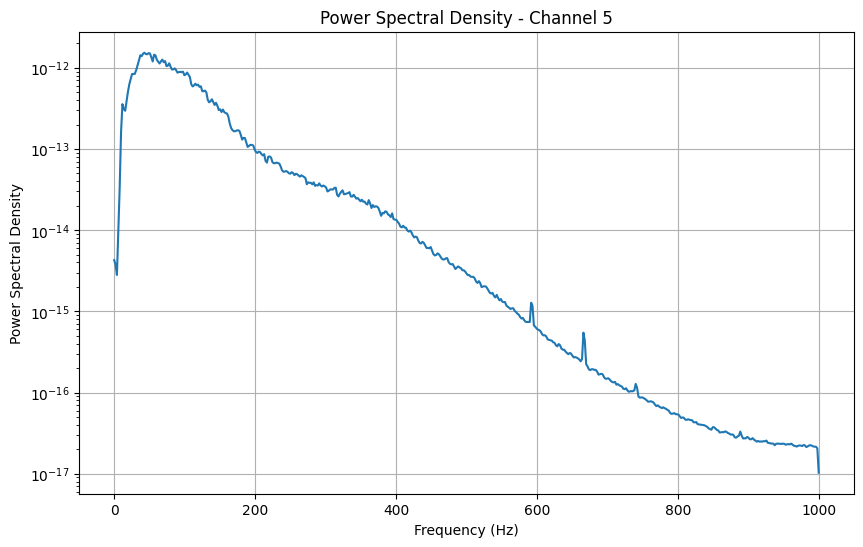

Channel 5: Maximum significant frequency = 394.53 Hz


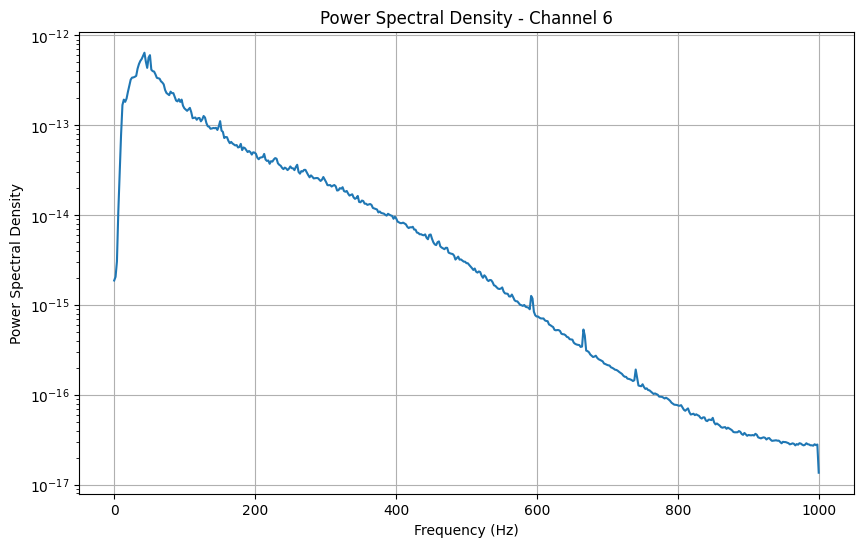

Channel 6: Maximum significant frequency = 427.73 Hz


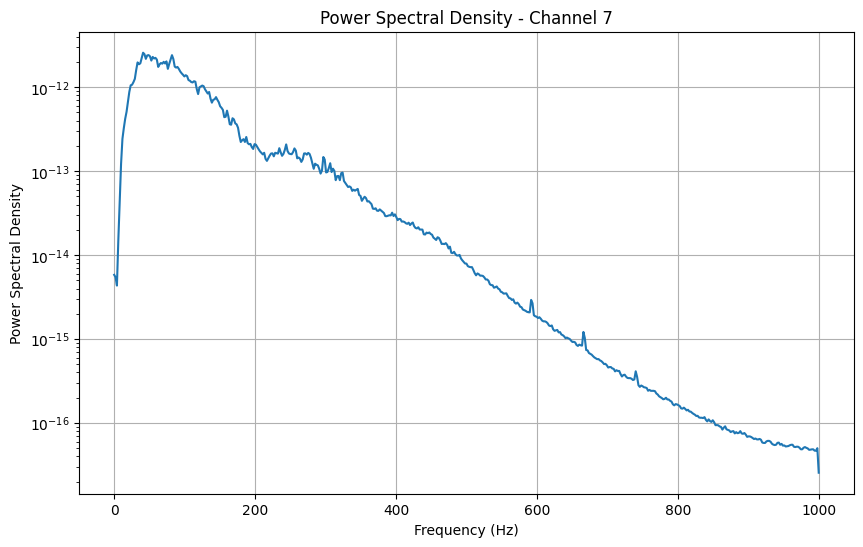

Channel 7: Maximum significant frequency = 406.25 Hz


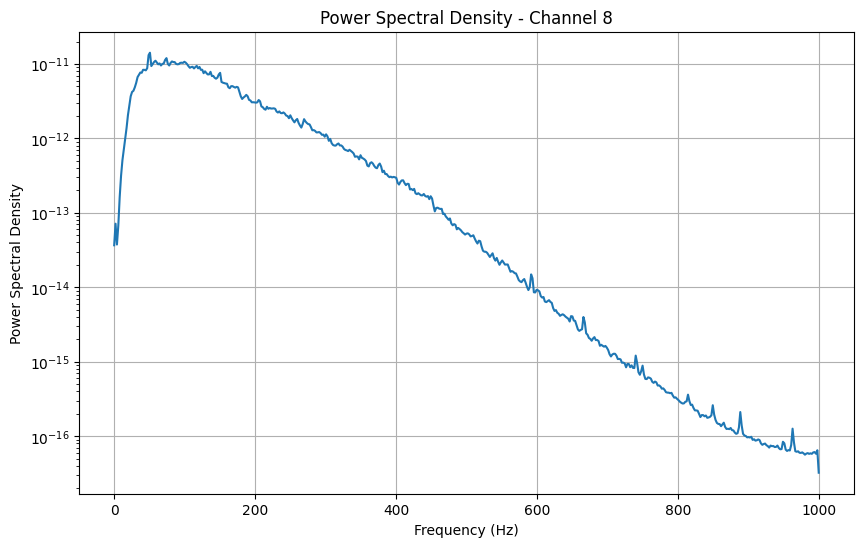

Channel 8: Maximum significant frequency = 451.17 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S20_E1_A1.mat


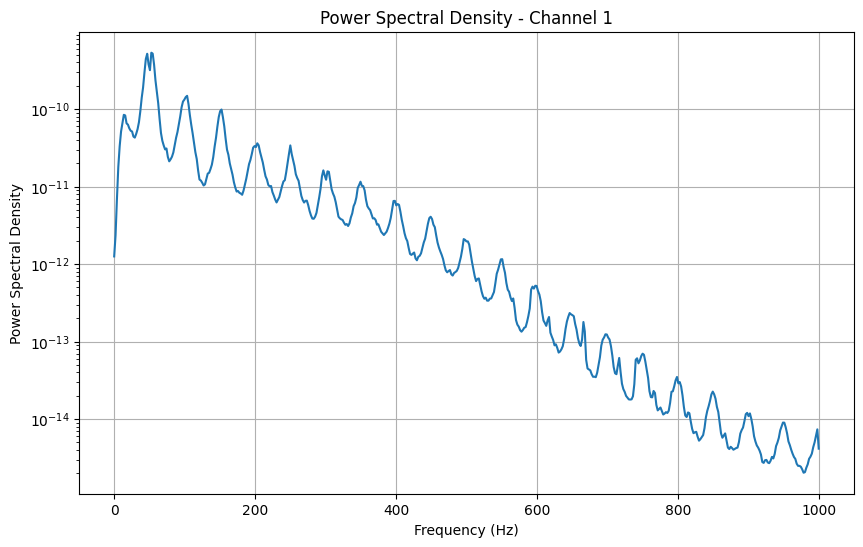

Channel 1: Maximum significant frequency = 404.30 Hz


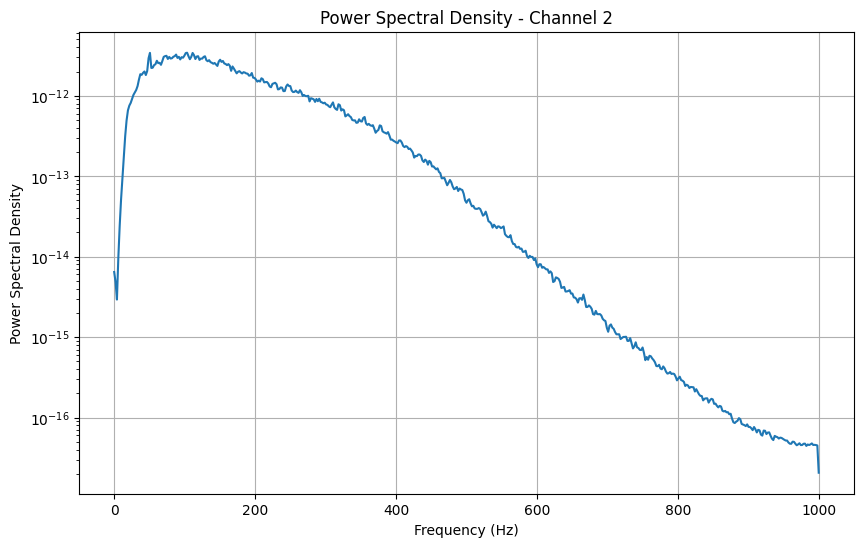

Channel 2: Maximum significant frequency = 527.34 Hz


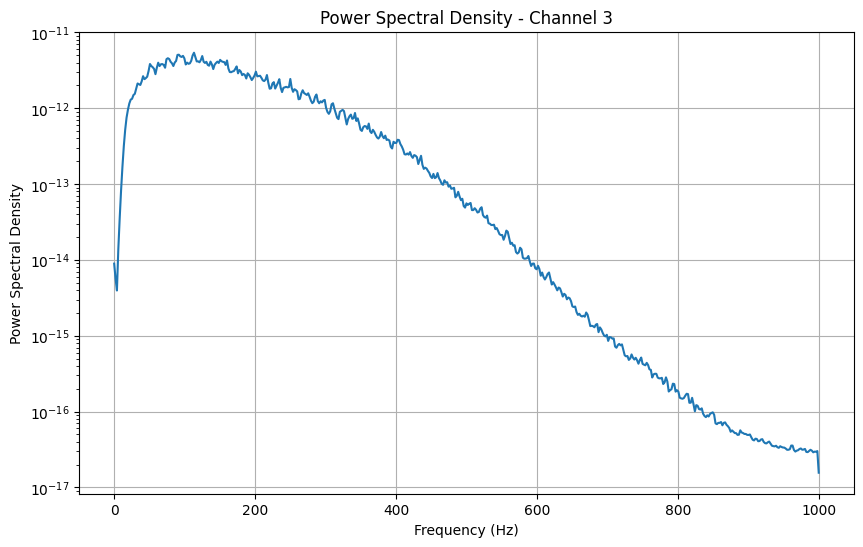

Channel 3: Maximum significant frequency = 505.86 Hz


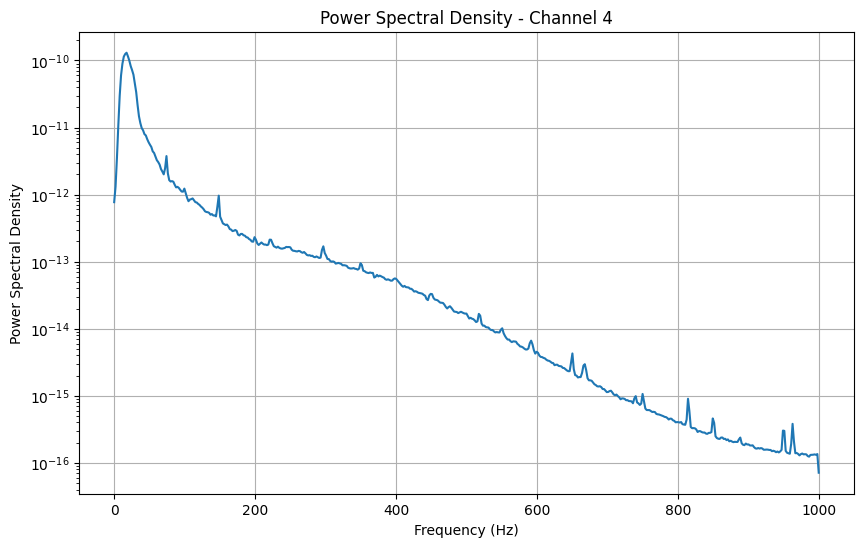

Channel 4: Maximum significant frequency = 85.94 Hz


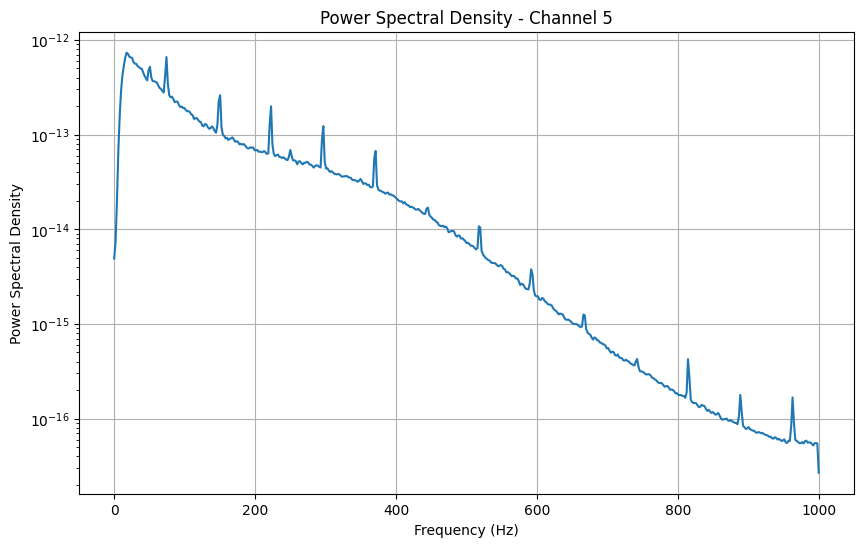

Channel 5: Maximum significant frequency = 519.53 Hz


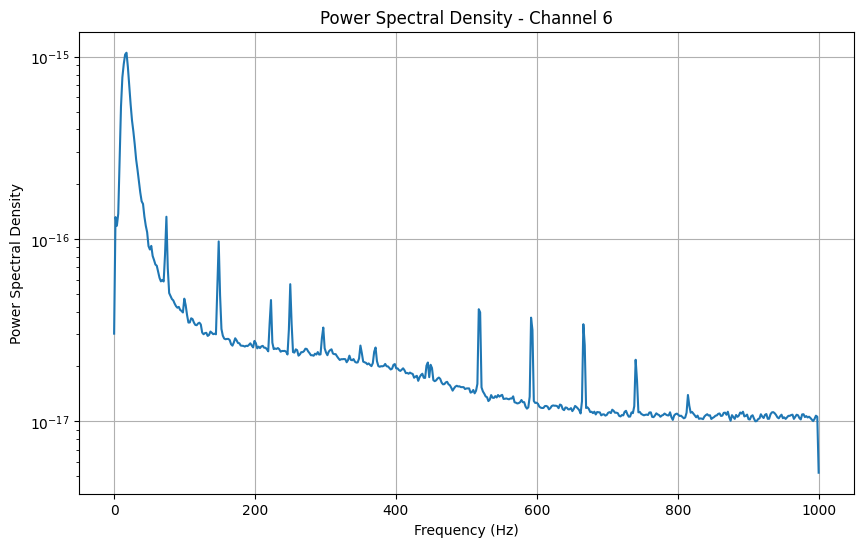

Channel 6: Maximum significant frequency = 998.05 Hz


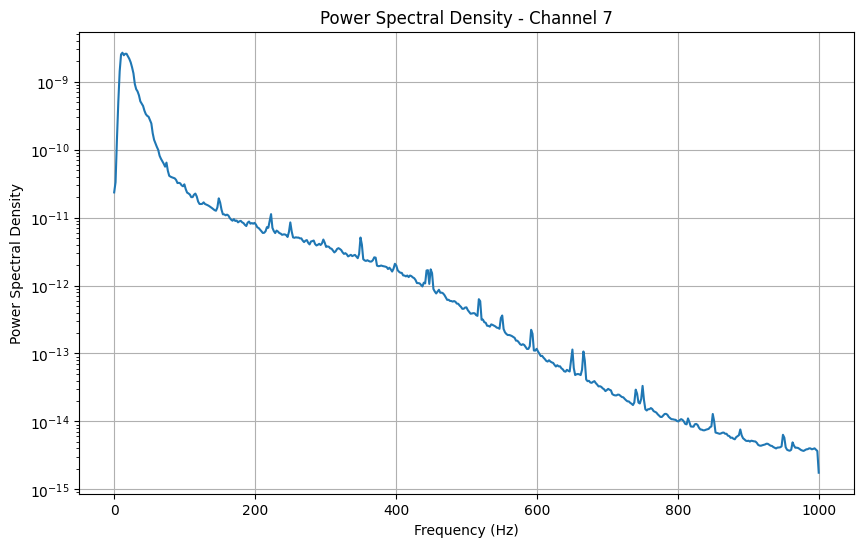

Channel 7: Maximum significant frequency = 99.61 Hz


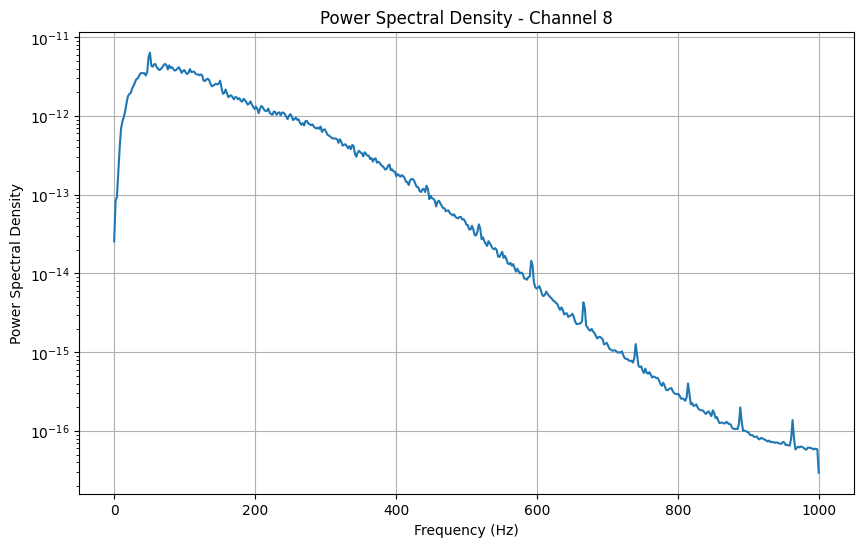

Channel 8: Maximum significant frequency = 468.75 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S22_E1_A1.mat


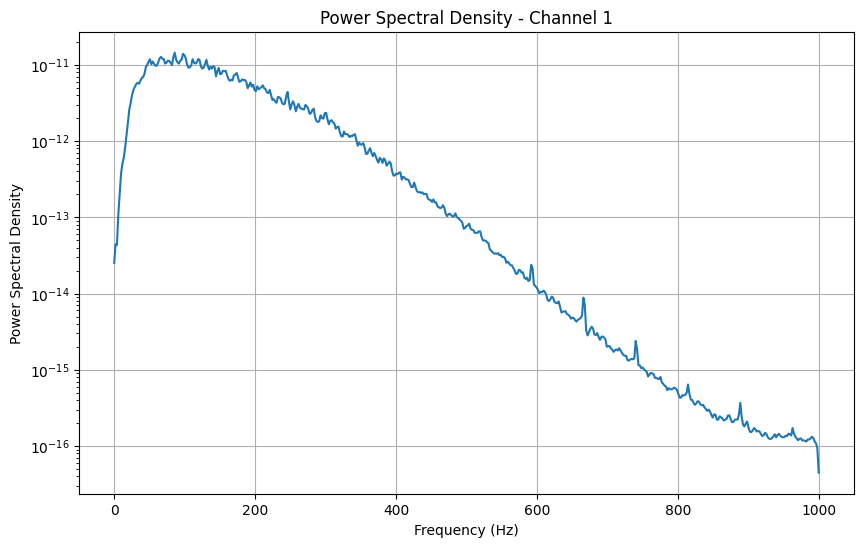

Channel 1: Maximum significant frequency = 466.80 Hz


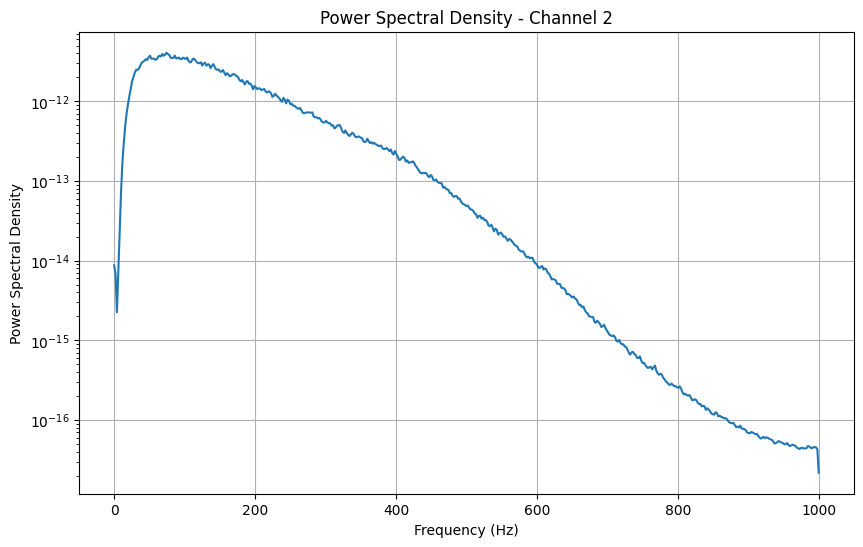

Channel 2: Maximum significant frequency = 509.77 Hz


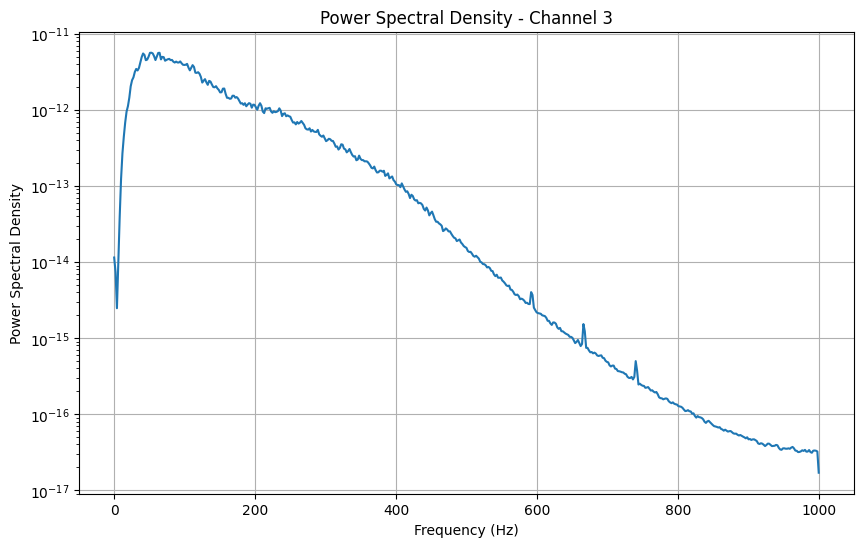

Channel 3: Maximum significant frequency = 435.55 Hz


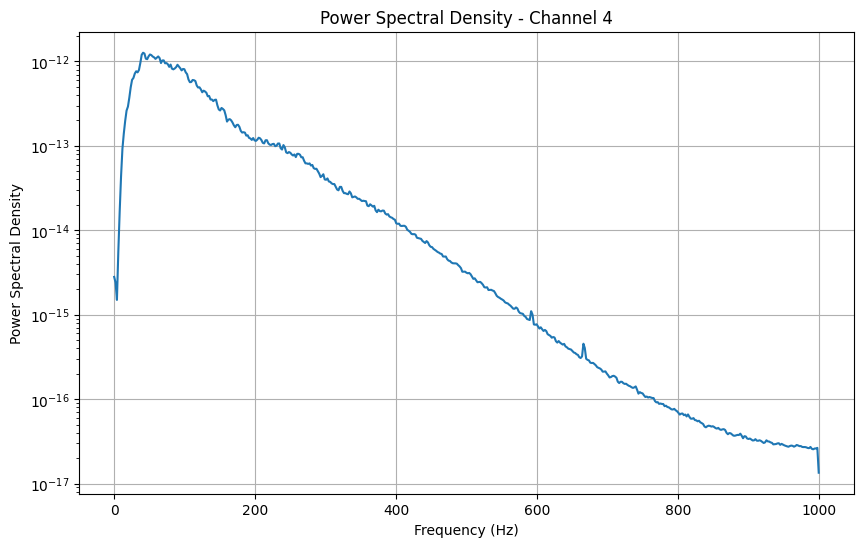

Channel 4: Maximum significant frequency = 398.44 Hz


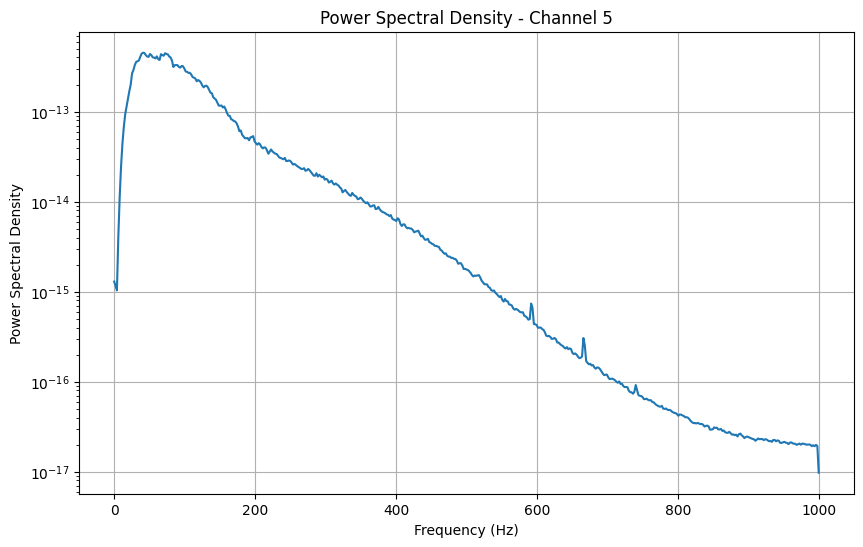

Channel 5: Maximum significant frequency = 431.64 Hz


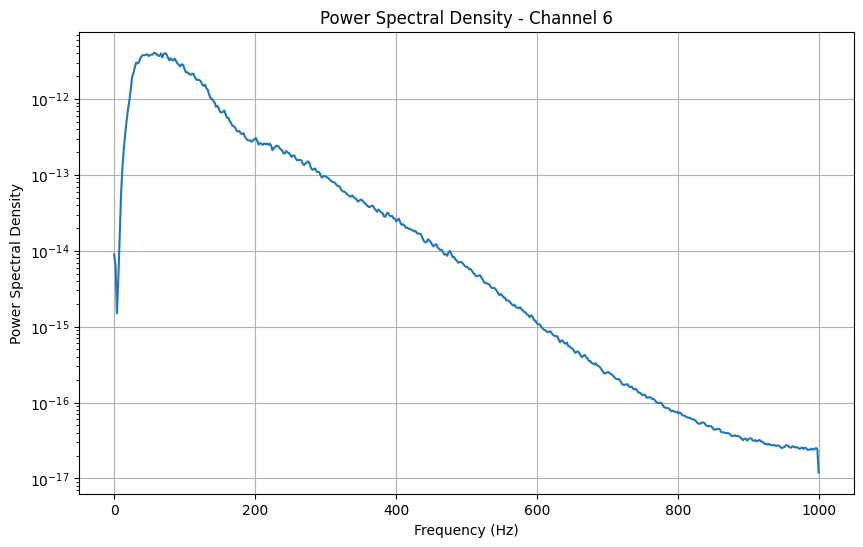

Channel 6: Maximum significant frequency = 357.42 Hz


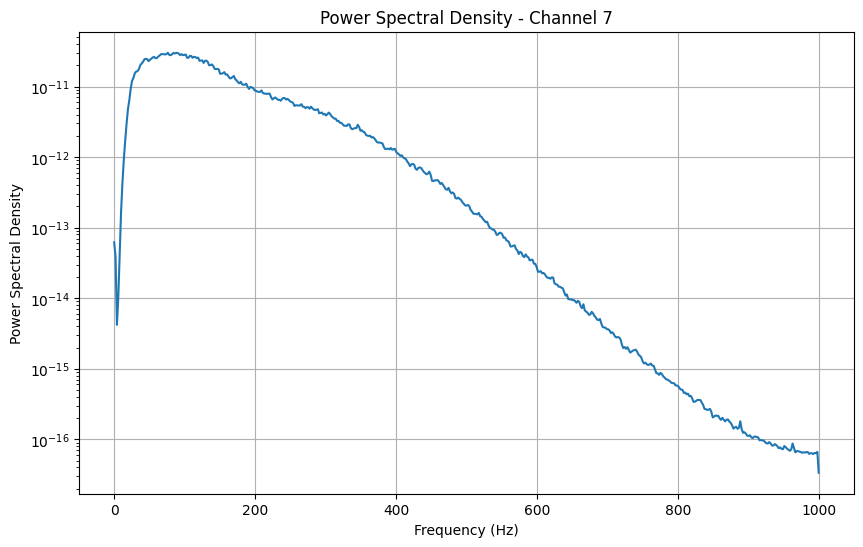

Channel 7: Maximum significant frequency = 482.42 Hz


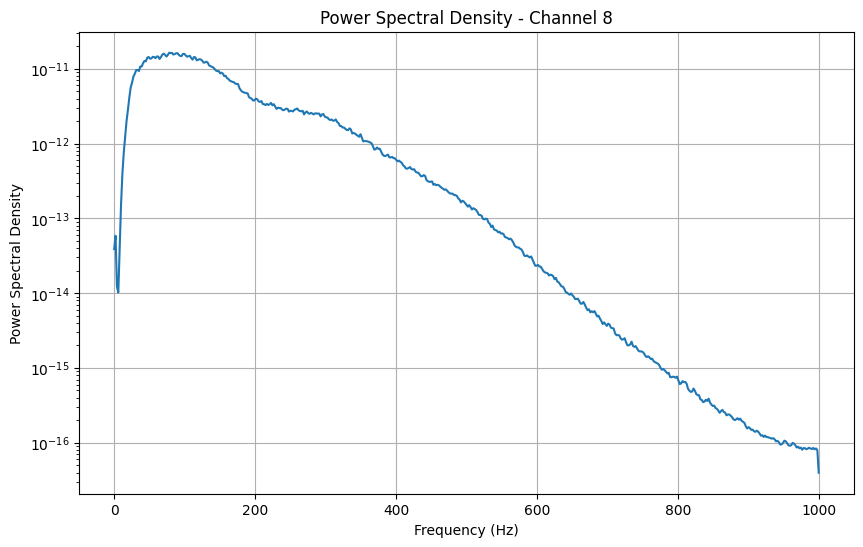

Channel 8: Maximum significant frequency = 496.09 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S19_E1_A1.mat


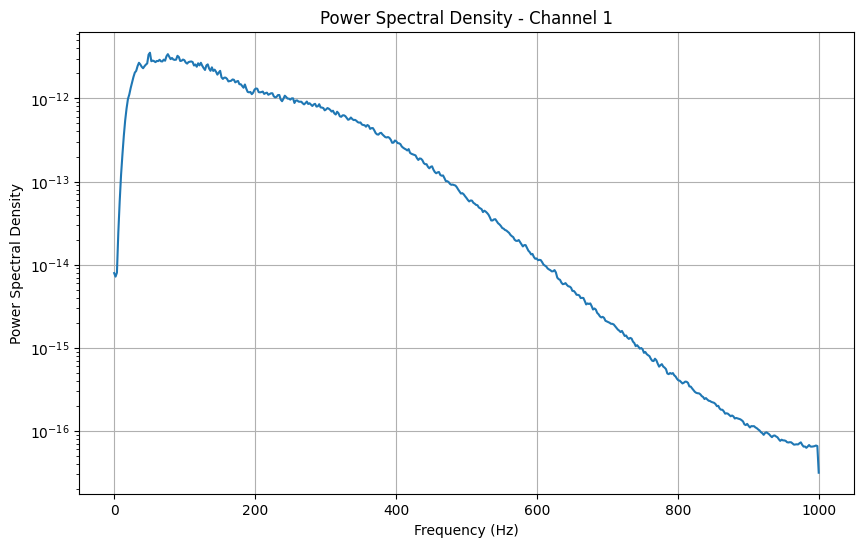

Channel 1: Maximum significant frequency = 533.20 Hz


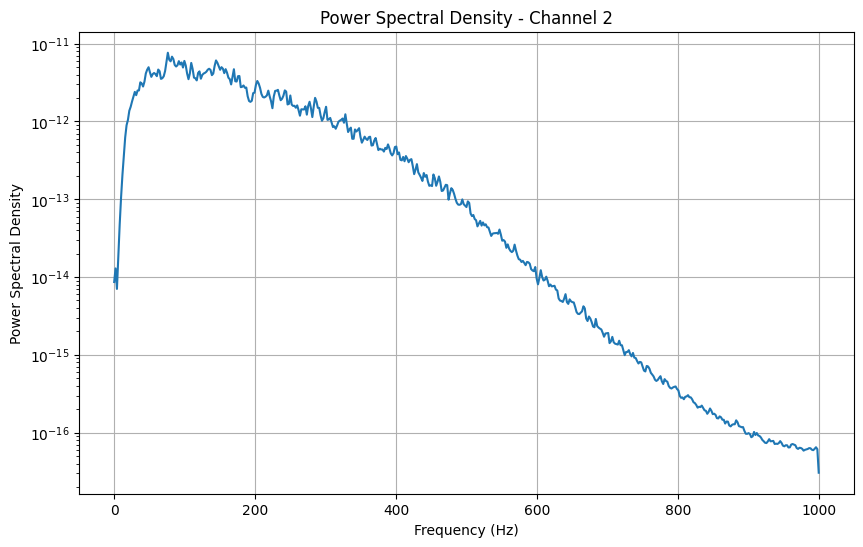

Channel 2: Maximum significant frequency = 503.91 Hz


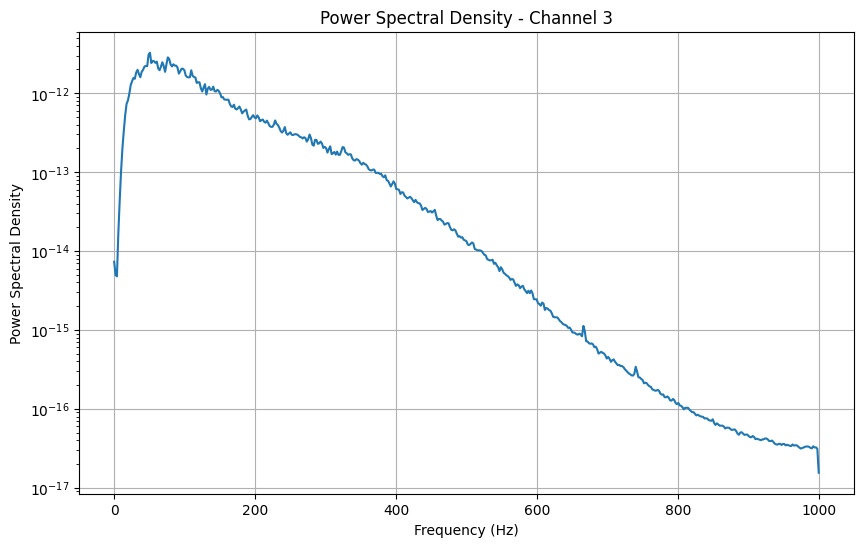

Channel 3: Maximum significant frequency = 455.08 Hz


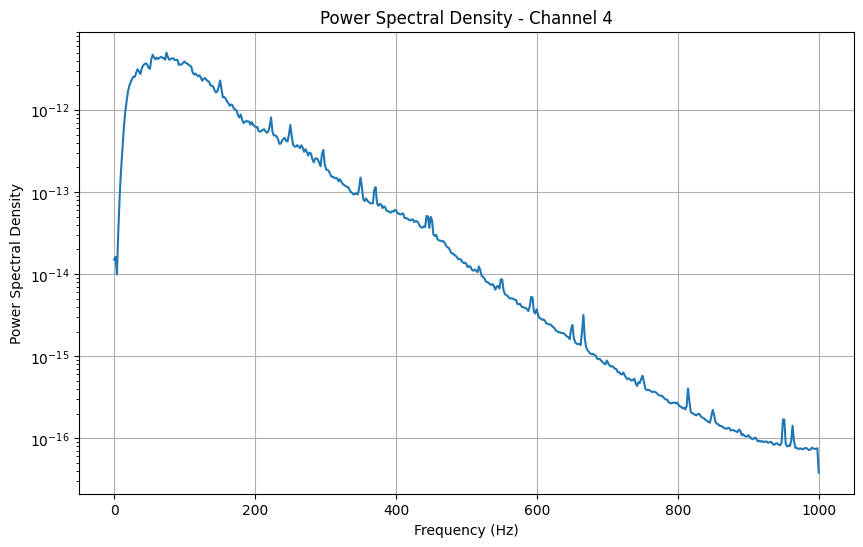

Channel 4: Maximum significant frequency = 449.22 Hz


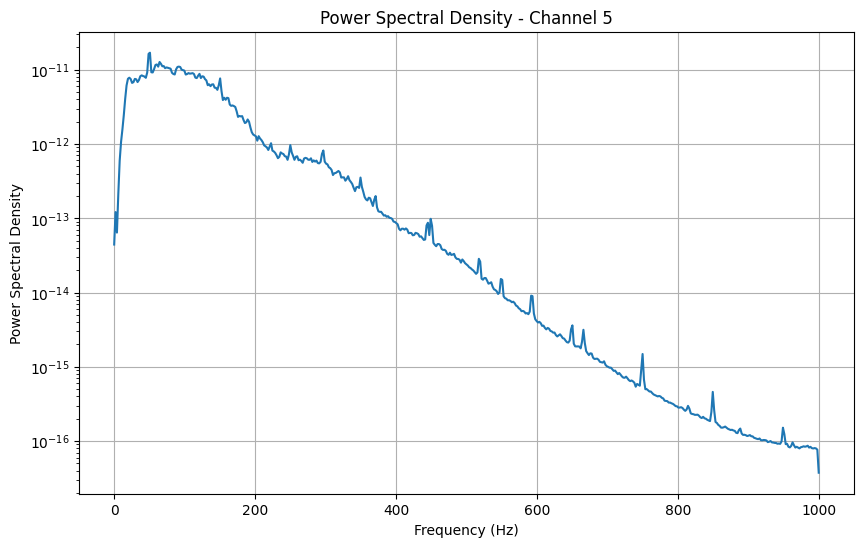

Channel 5: Maximum significant frequency = 371.09 Hz


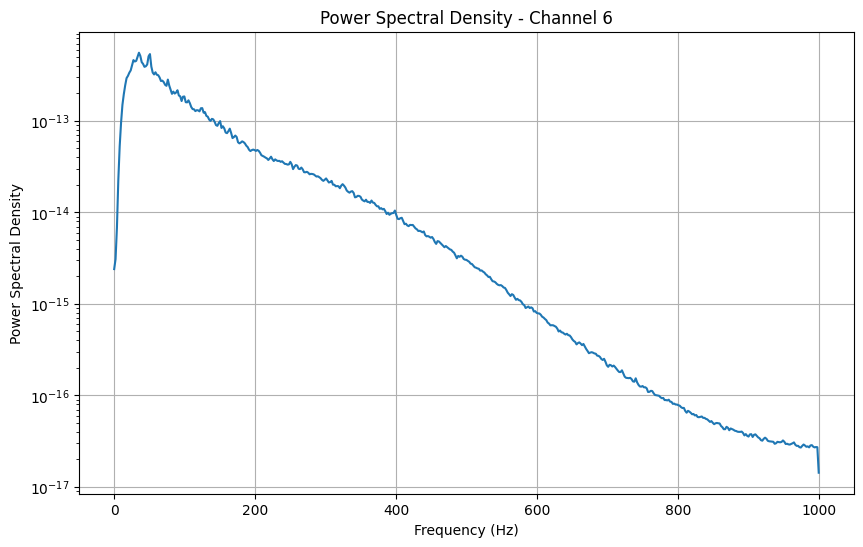

Channel 6: Maximum significant frequency = 441.41 Hz


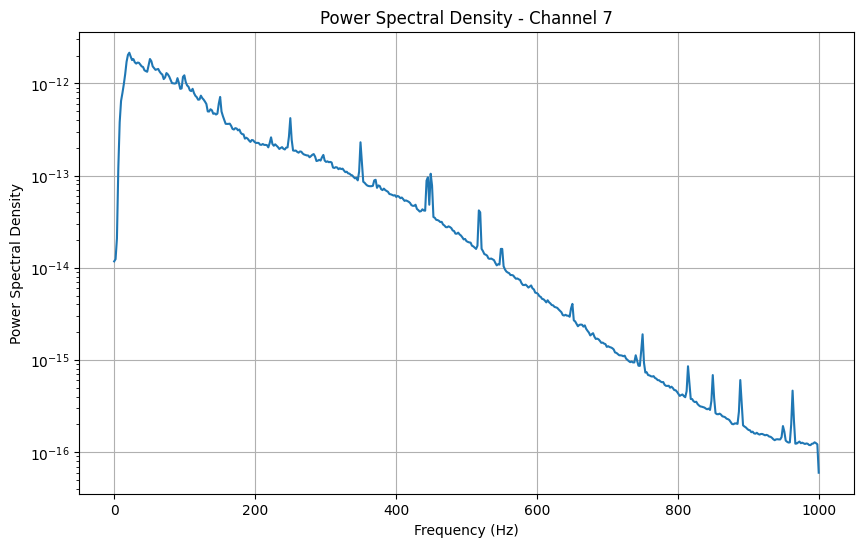

Channel 7: Maximum significant frequency = 519.53 Hz


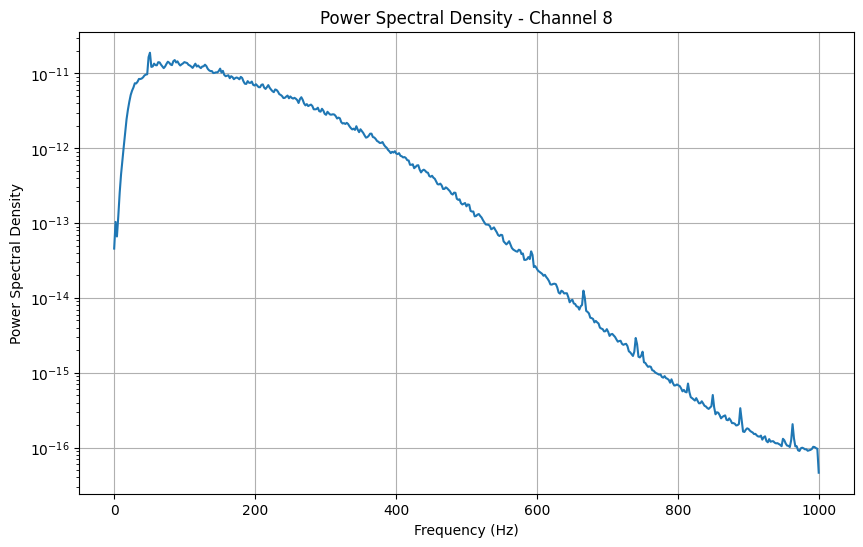

Channel 8: Maximum significant frequency = 490.23 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S21_E1_A1.mat


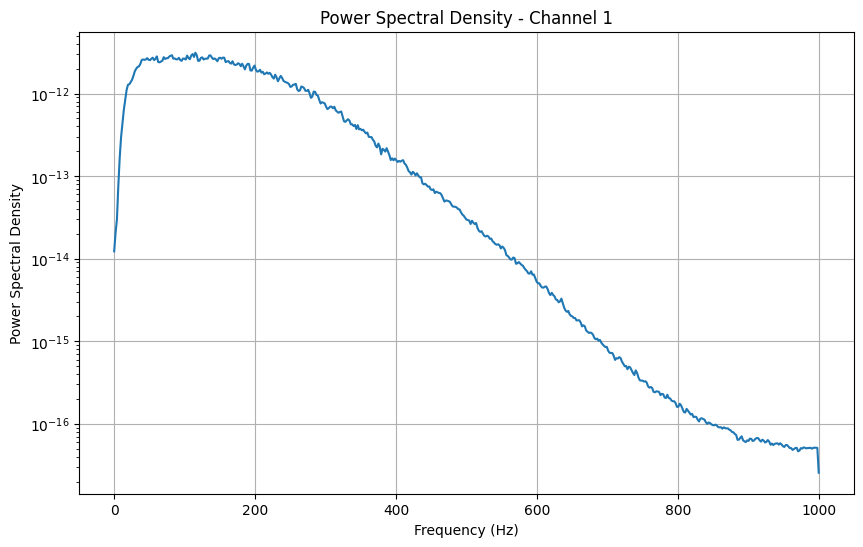

Channel 1: Maximum significant frequency = 498.05 Hz


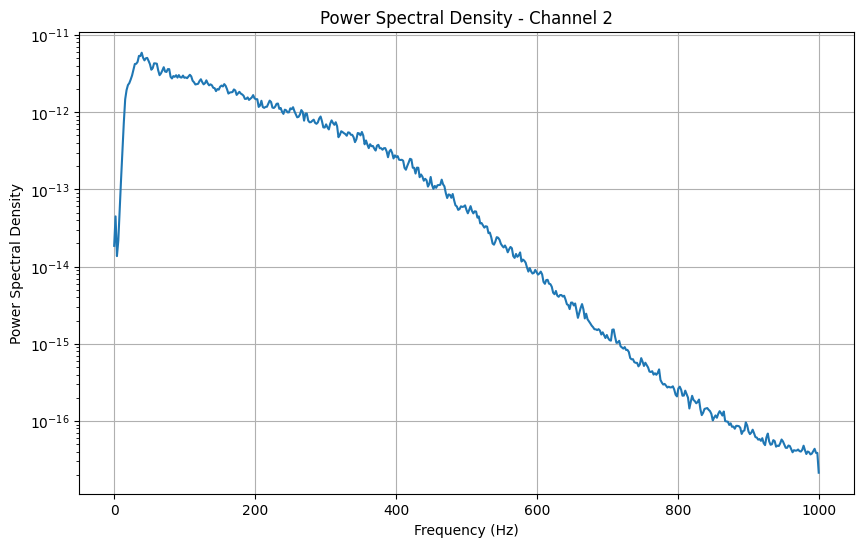

Channel 2: Maximum significant frequency = 505.86 Hz


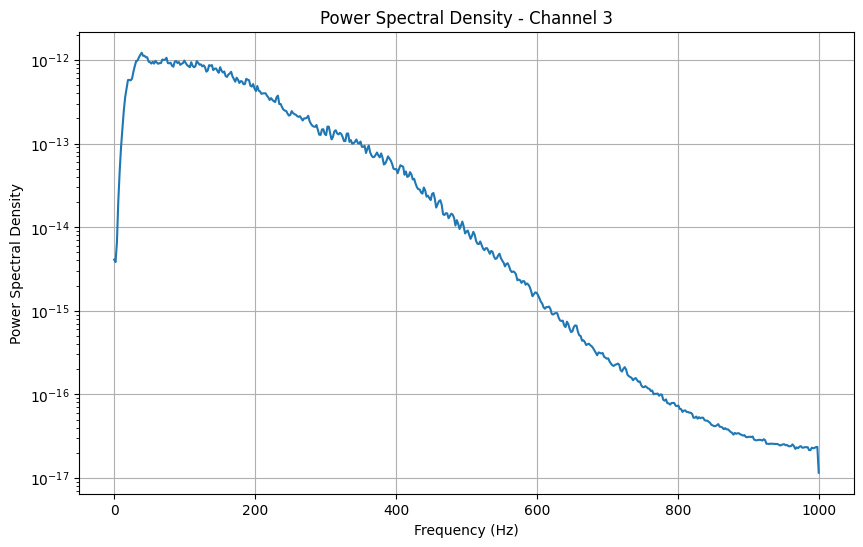

Channel 3: Maximum significant frequency = 482.42 Hz


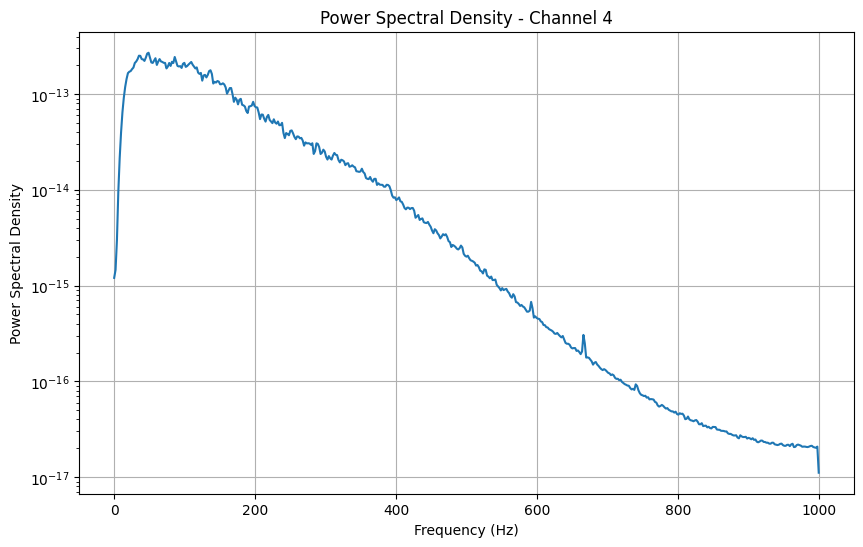

Channel 4: Maximum significant frequency = 476.56 Hz


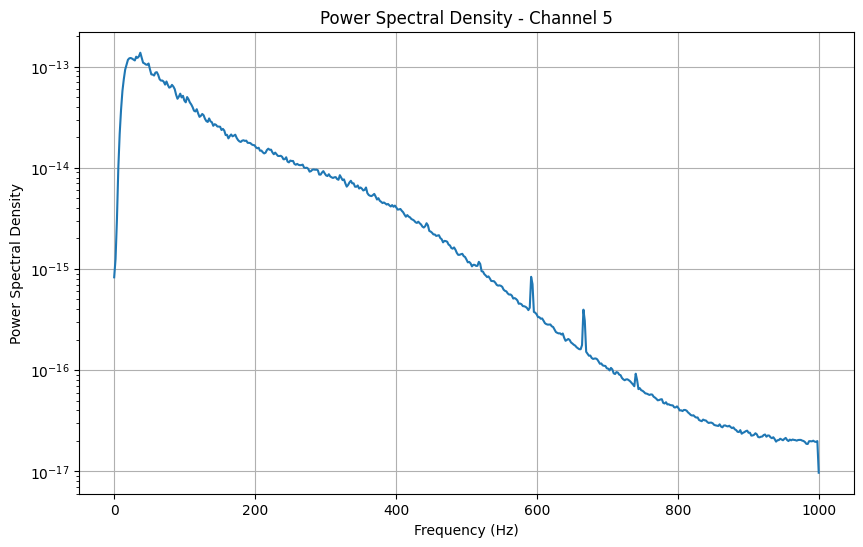

Channel 5: Maximum significant frequency = 494.14 Hz


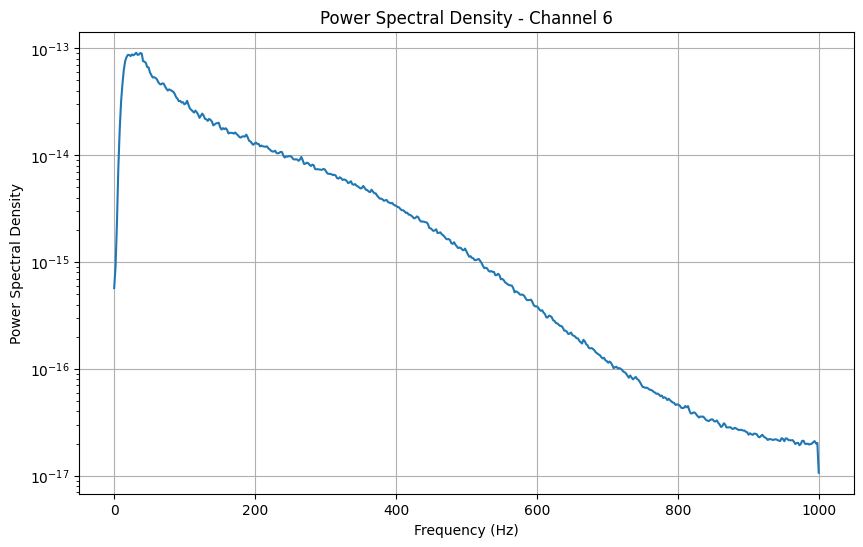

Channel 6: Maximum significant frequency = 523.44 Hz


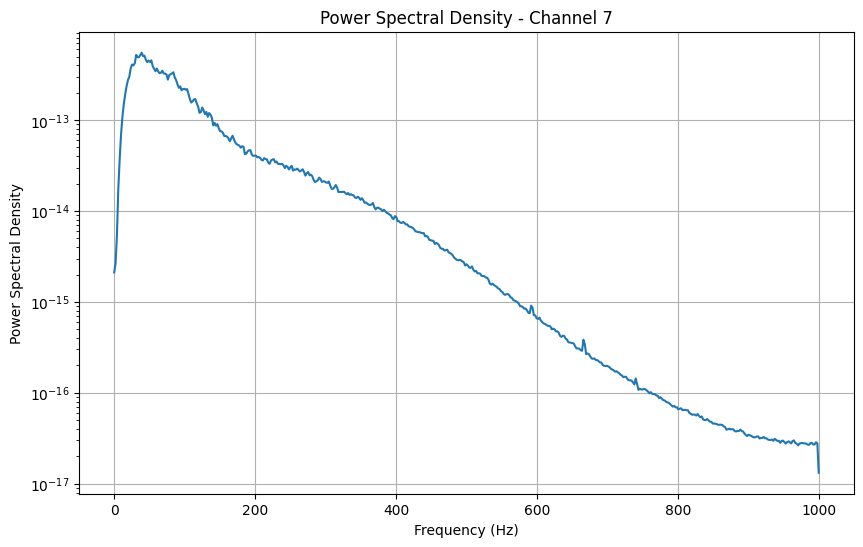

Channel 7: Maximum significant frequency = 439.45 Hz


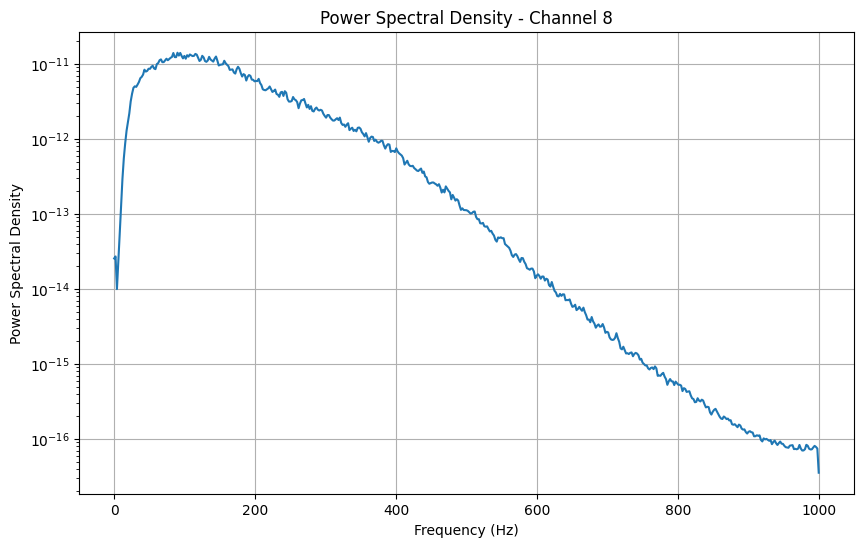

Channel 8: Maximum significant frequency = 488.28 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S26_E1_A1.mat


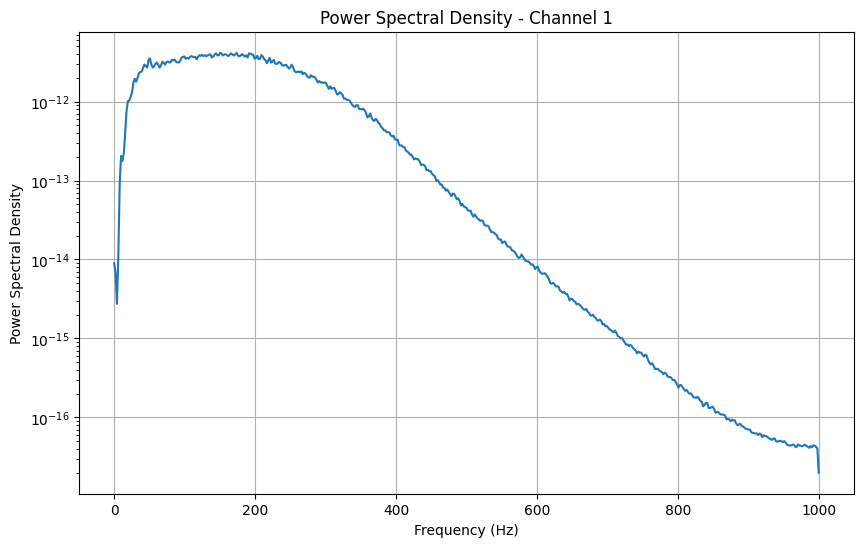

Channel 1: Maximum significant frequency = 501.95 Hz


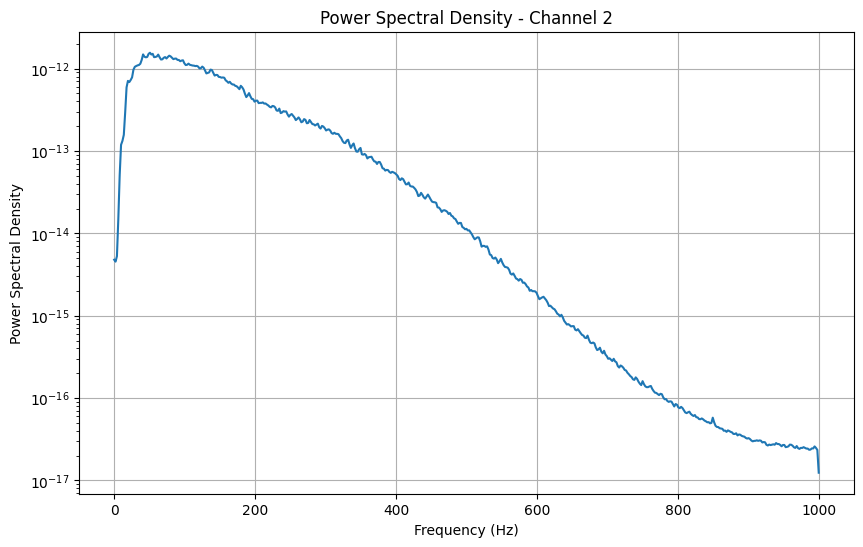

Channel 2: Maximum significant frequency = 480.47 Hz


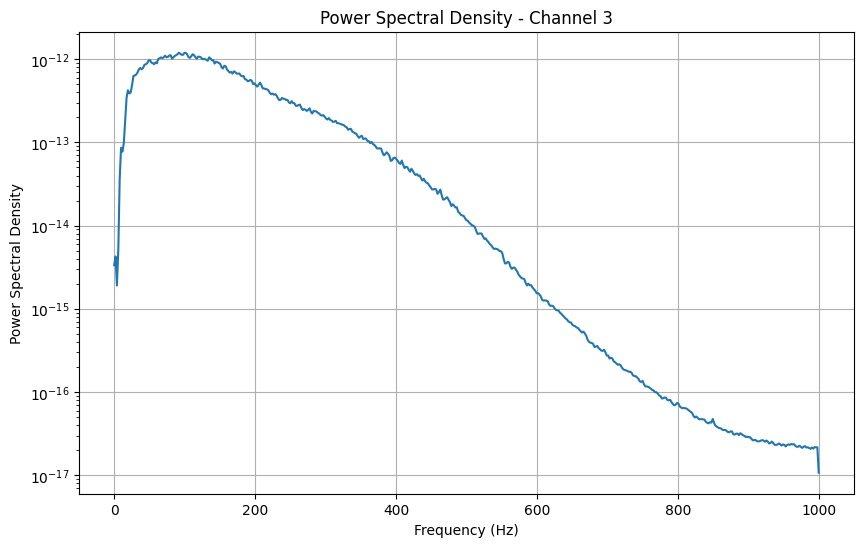

Channel 3: Maximum significant frequency = 498.05 Hz


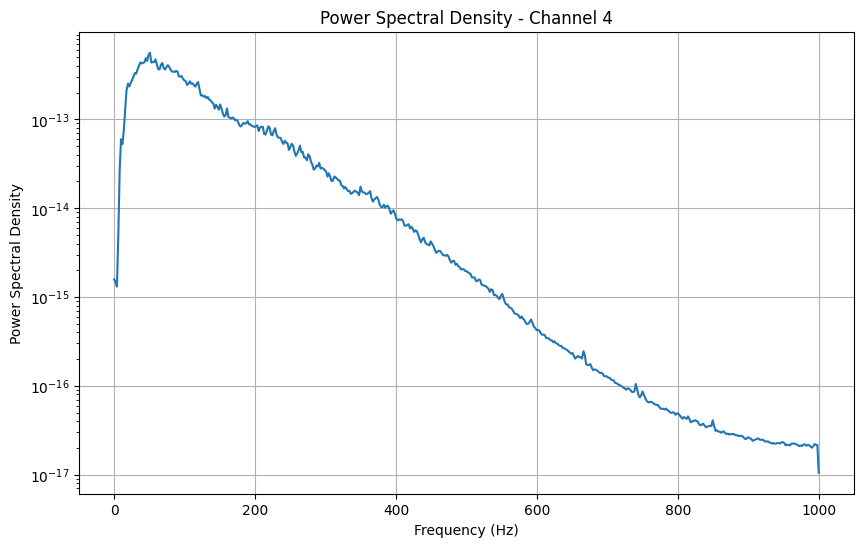

Channel 4: Maximum significant frequency = 423.83 Hz


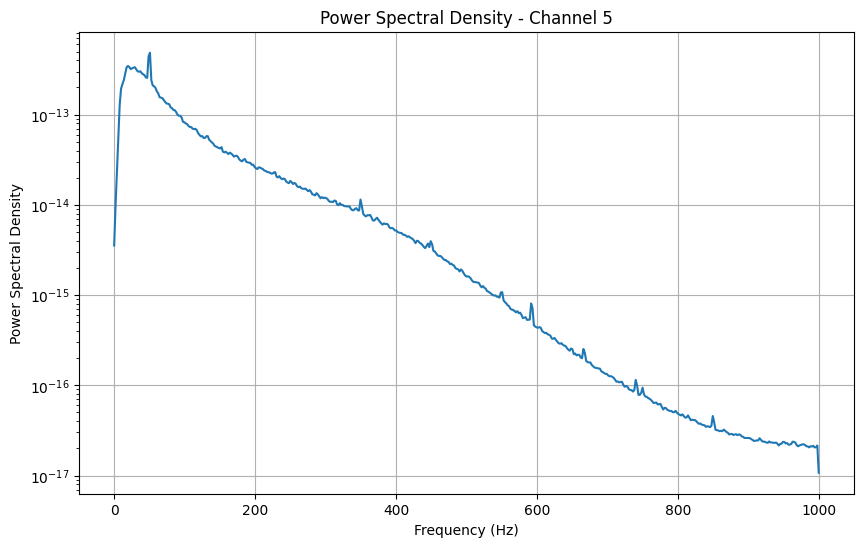

Channel 5: Maximum significant frequency = 406.25 Hz


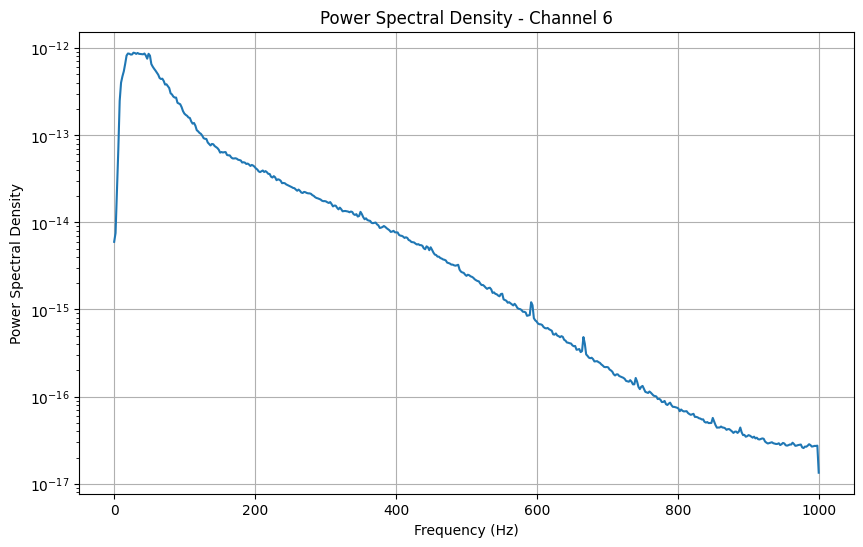

Channel 6: Maximum significant frequency = 384.77 Hz


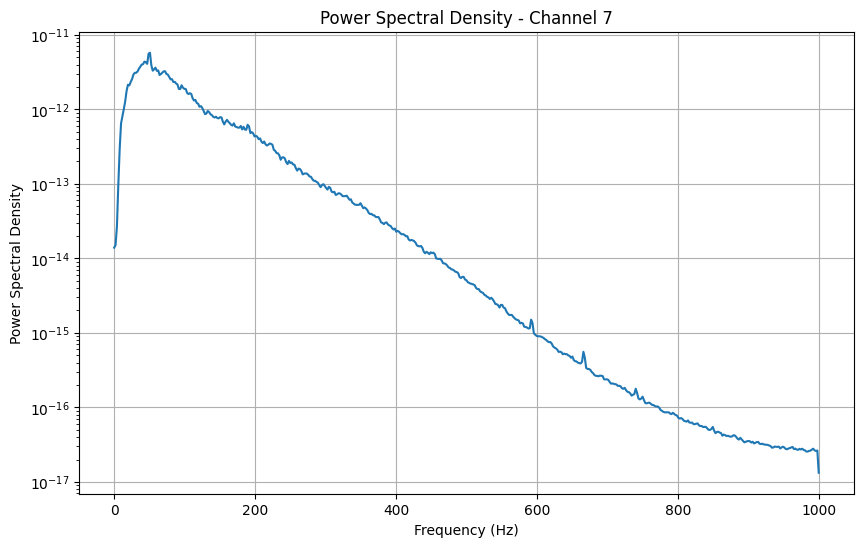

Channel 7: Maximum significant frequency = 335.94 Hz


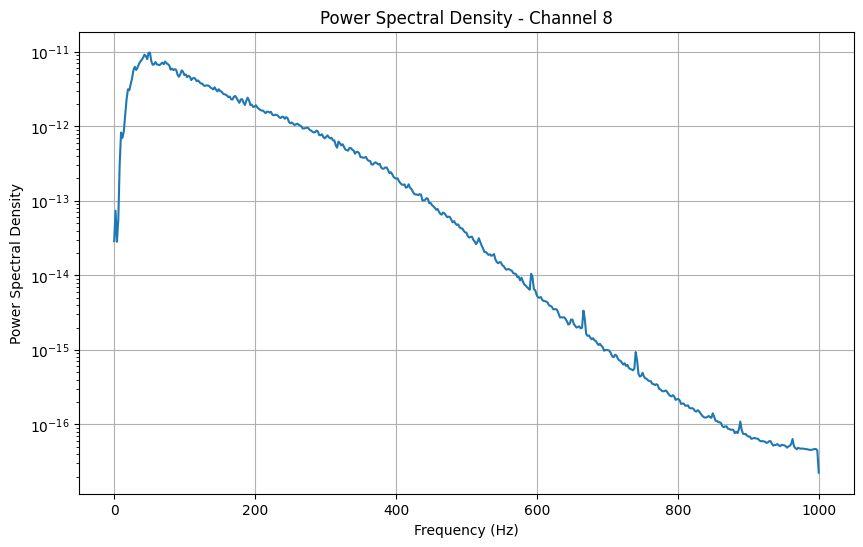

Channel 8: Maximum significant frequency = 445.31 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S25_E1_A1.mat


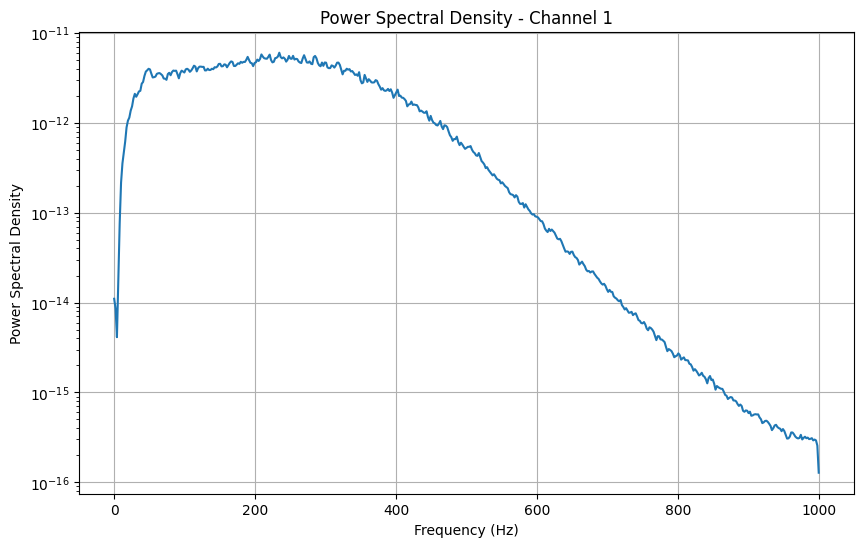

Channel 1: Maximum significant frequency = 623.05 Hz


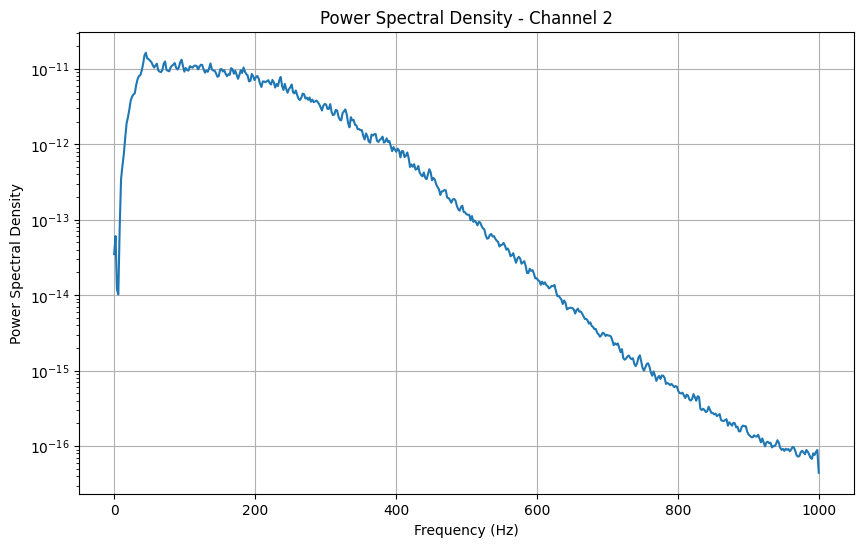

Channel 2: Maximum significant frequency = 484.38 Hz


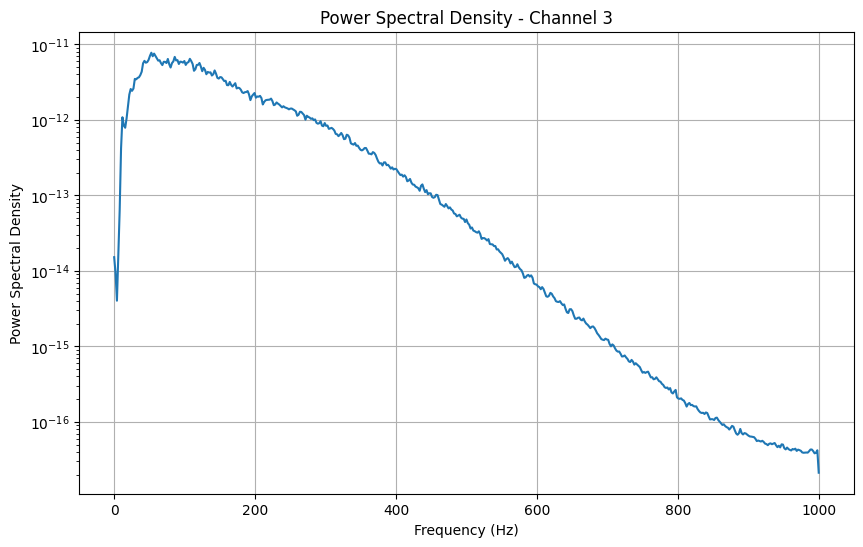

Channel 3: Maximum significant frequency = 460.94 Hz


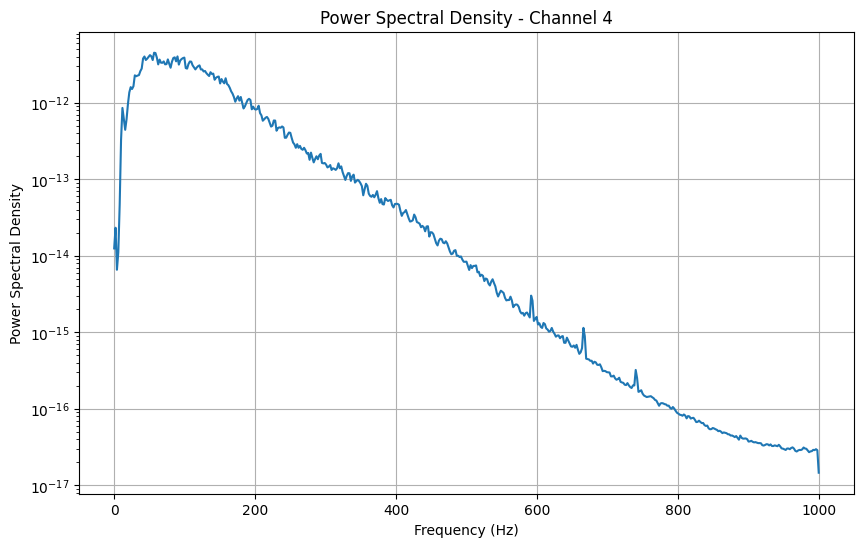

Channel 4: Maximum significant frequency = 404.30 Hz


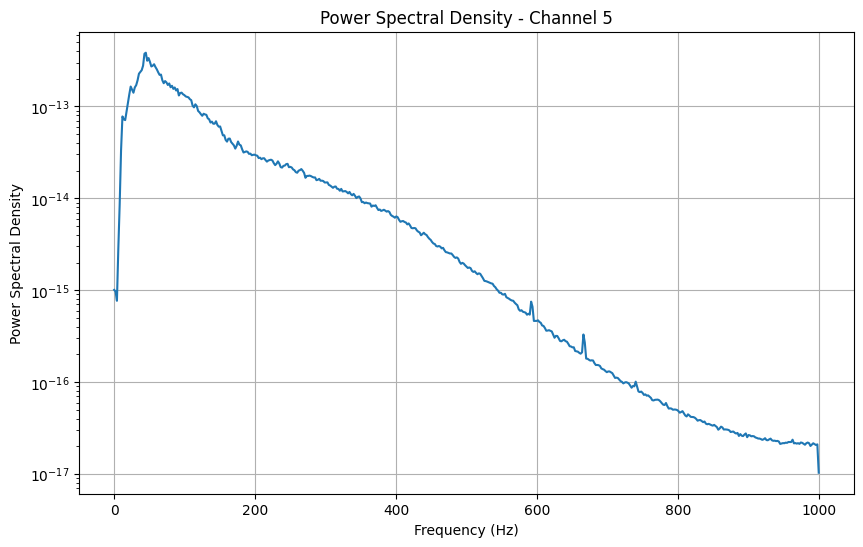

Channel 5: Maximum significant frequency = 443.36 Hz


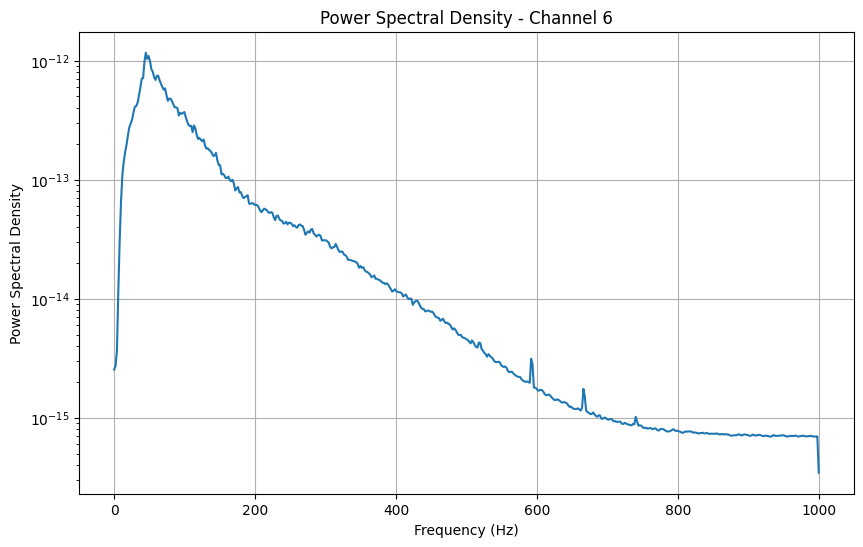

Channel 6: Maximum significant frequency = 398.44 Hz


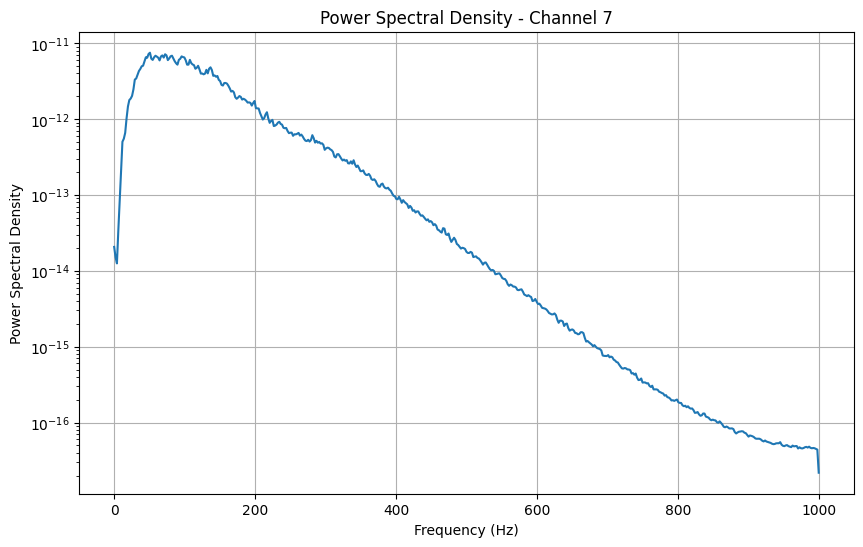

Channel 7: Maximum significant frequency = 416.02 Hz


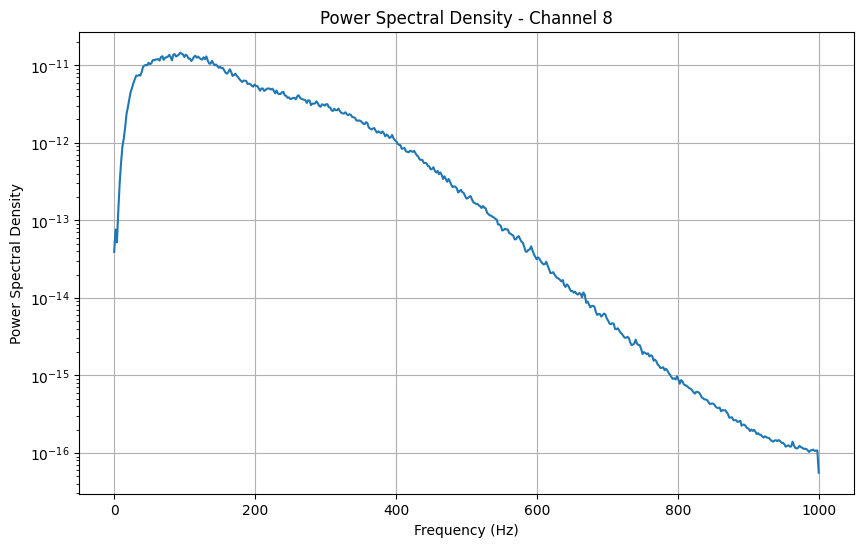

Channel 8: Maximum significant frequency = 525.39 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S23_E1_A1.mat


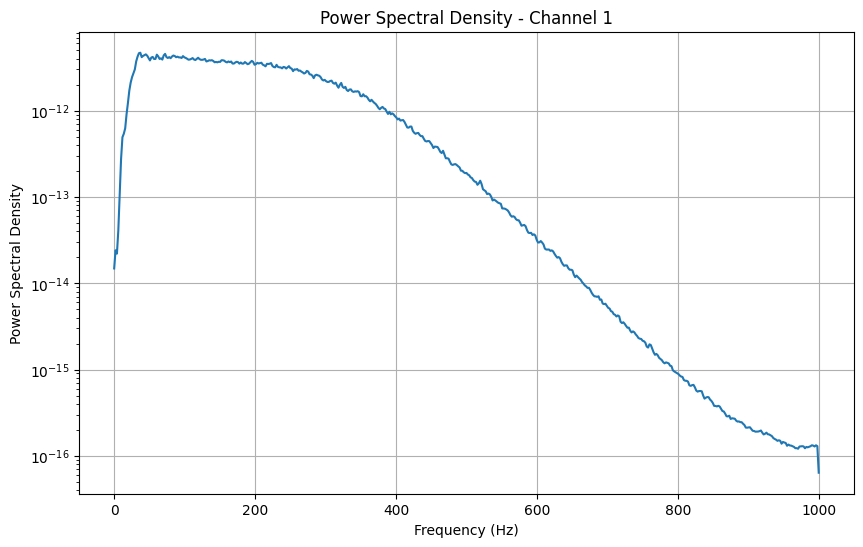

Channel 1: Maximum significant frequency = 582.03 Hz


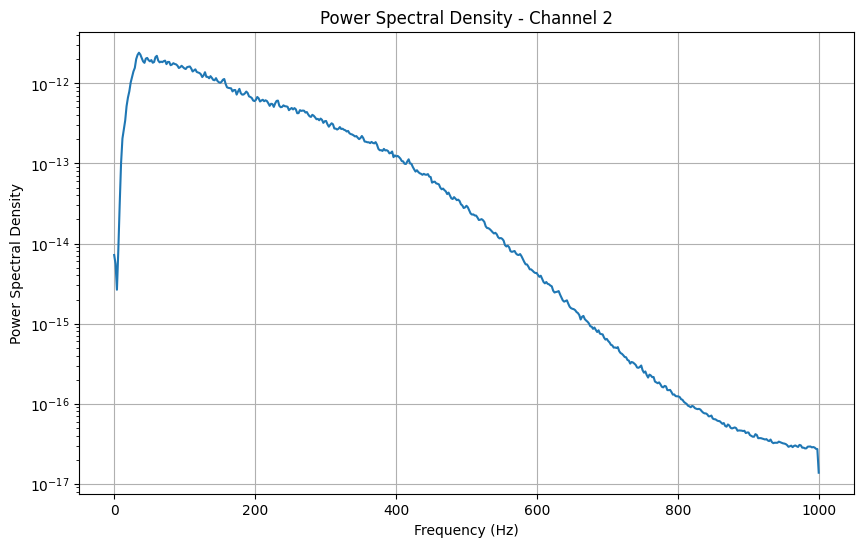

Channel 2: Maximum significant frequency = 503.91 Hz


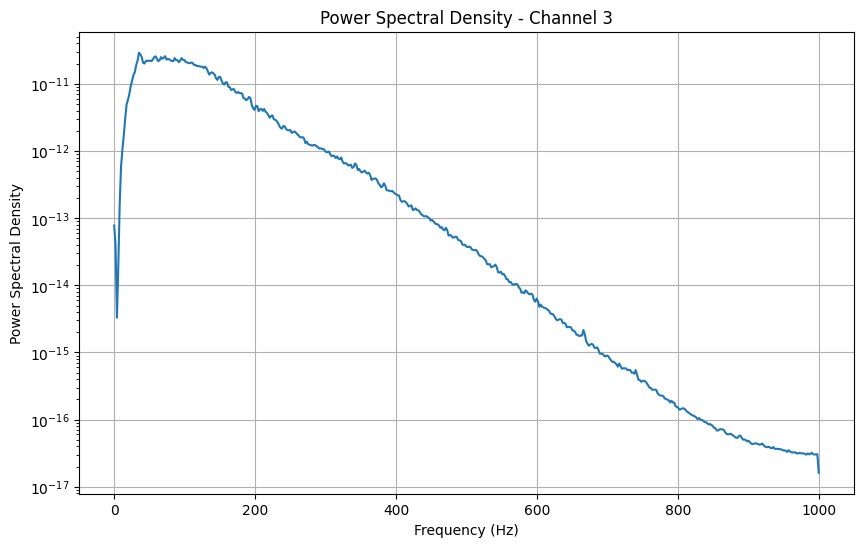

Channel 3: Maximum significant frequency = 384.77 Hz


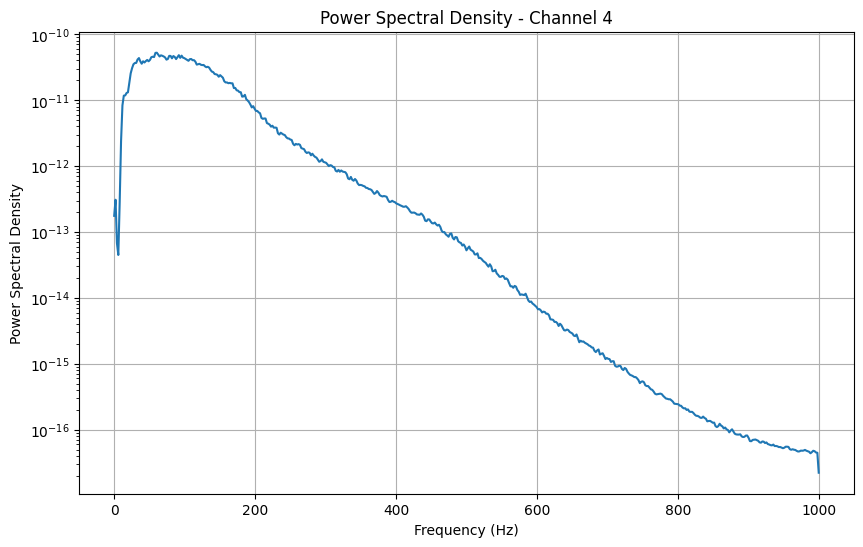

Channel 4: Maximum significant frequency = 345.70 Hz


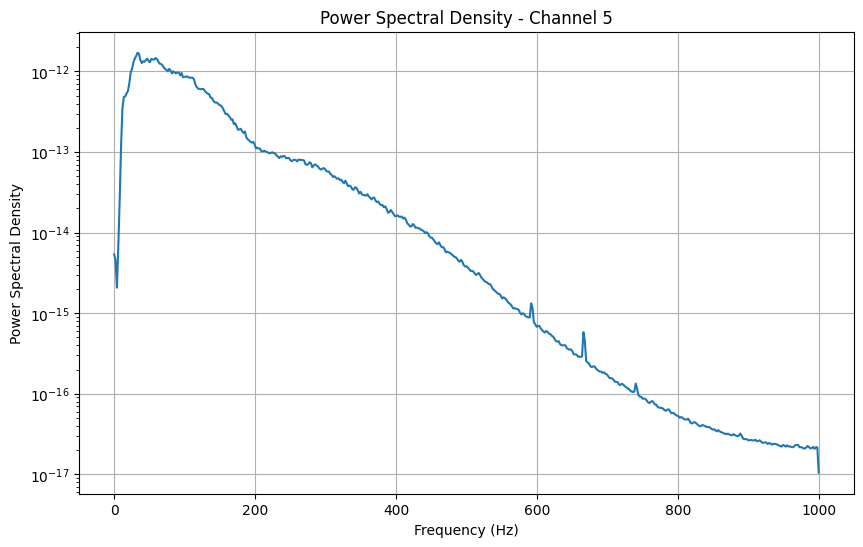

Channel 5: Maximum significant frequency = 394.53 Hz


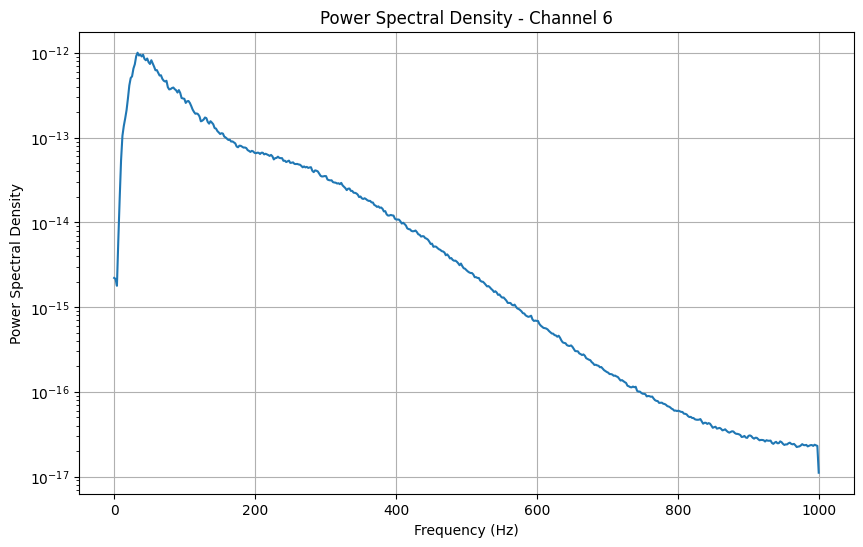

Channel 6: Maximum significant frequency = 406.25 Hz


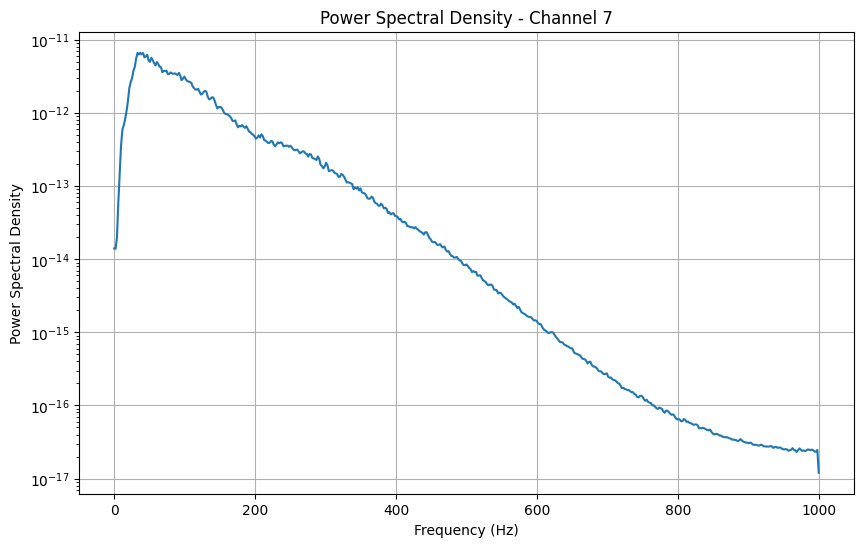

Channel 7: Maximum significant frequency = 367.19 Hz


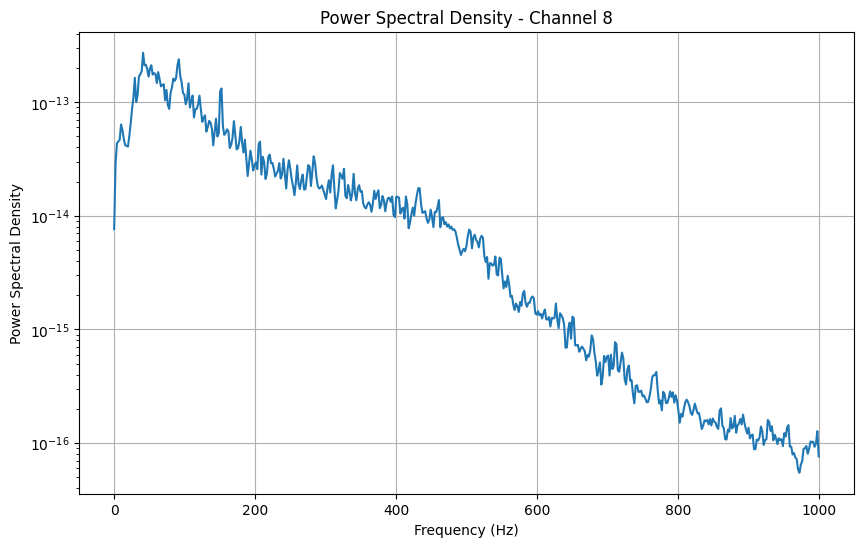

Channel 8: Maximum significant frequency = 558.59 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S29_E1_A1.mat


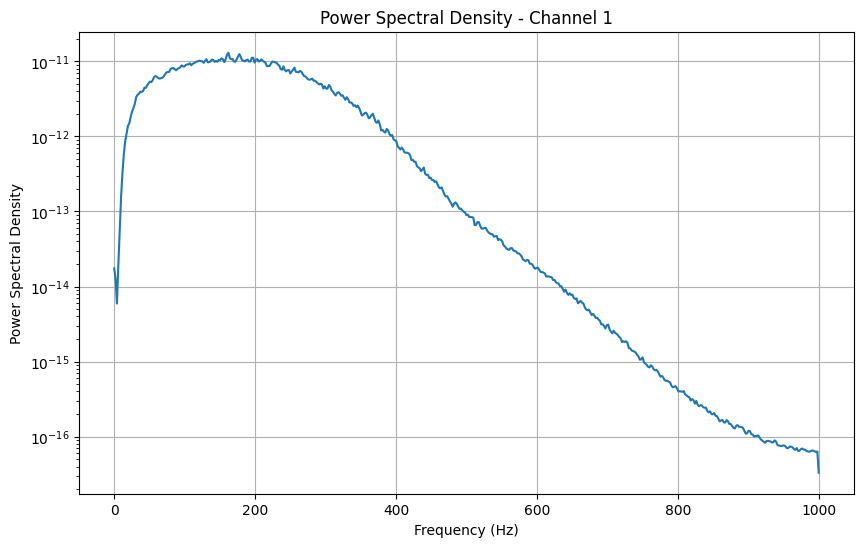

Channel 1: Maximum significant frequency = 484.38 Hz


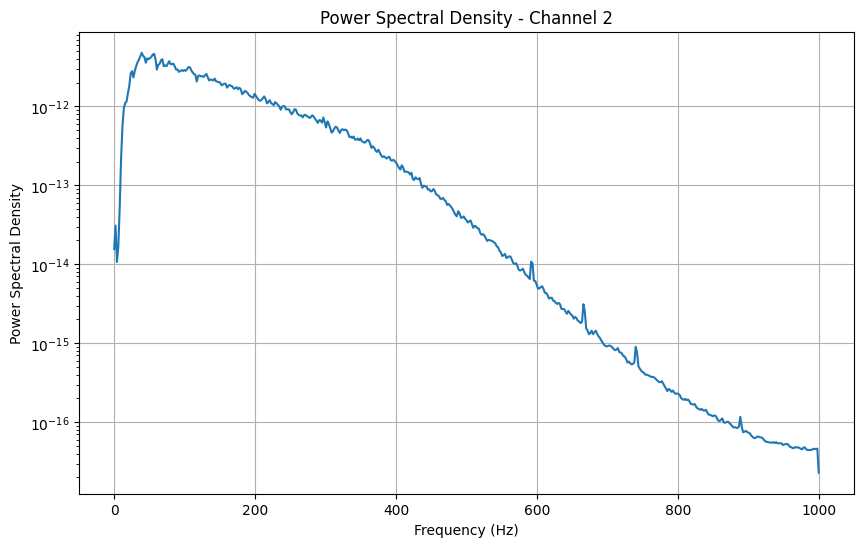

Channel 2: Maximum significant frequency = 480.47 Hz


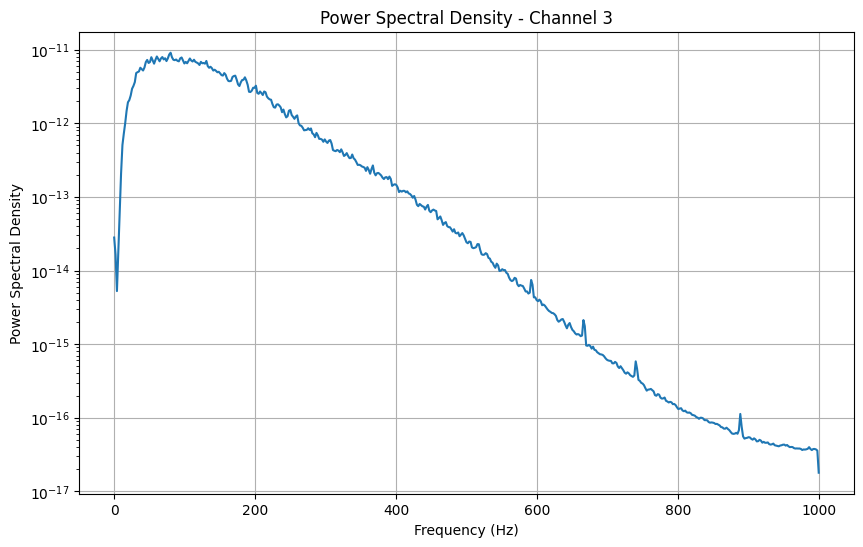

Channel 3: Maximum significant frequency = 427.73 Hz


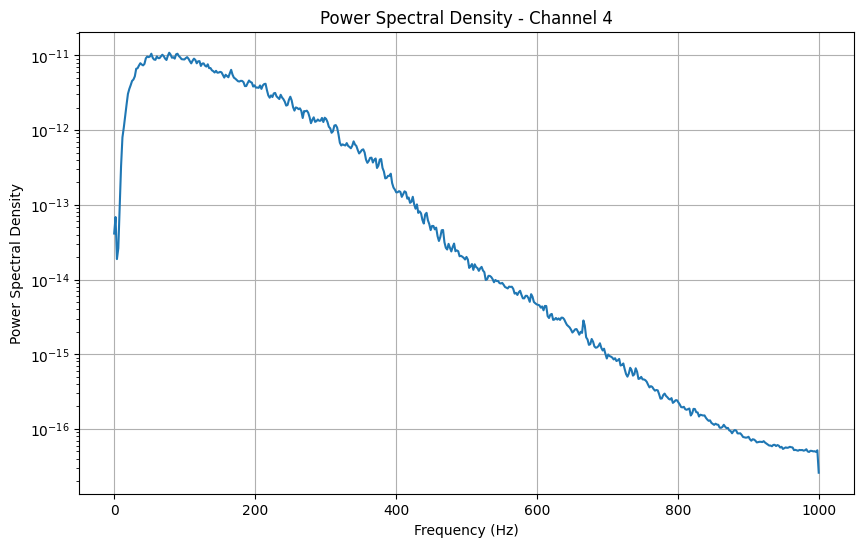

Channel 4: Maximum significant frequency = 423.83 Hz


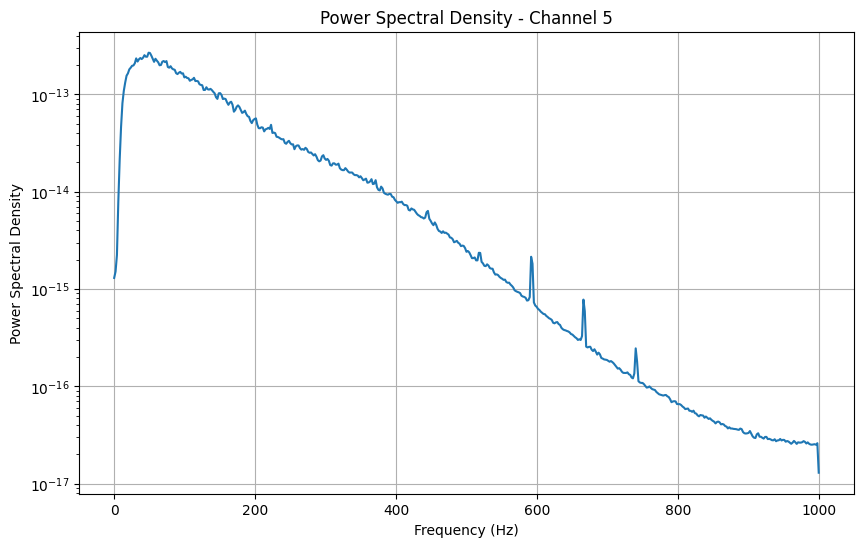

Channel 5: Maximum significant frequency = 496.09 Hz


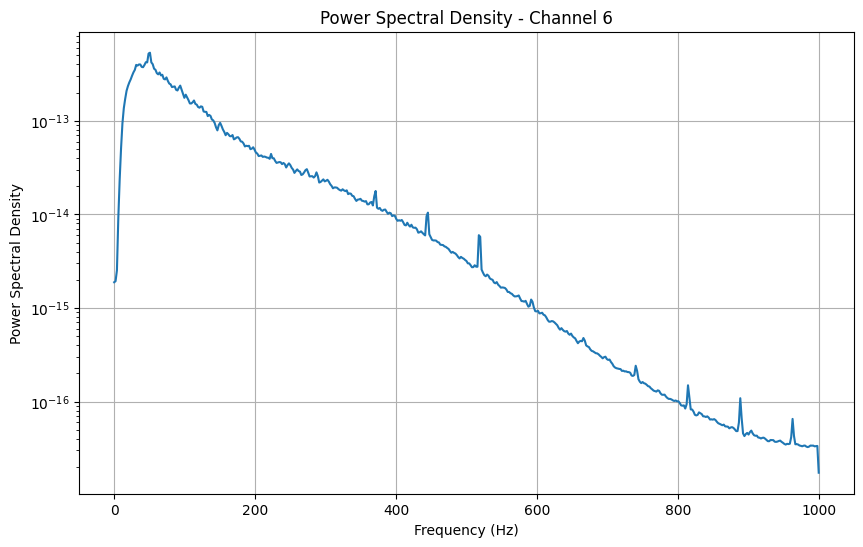

Channel 6: Maximum significant frequency = 519.53 Hz


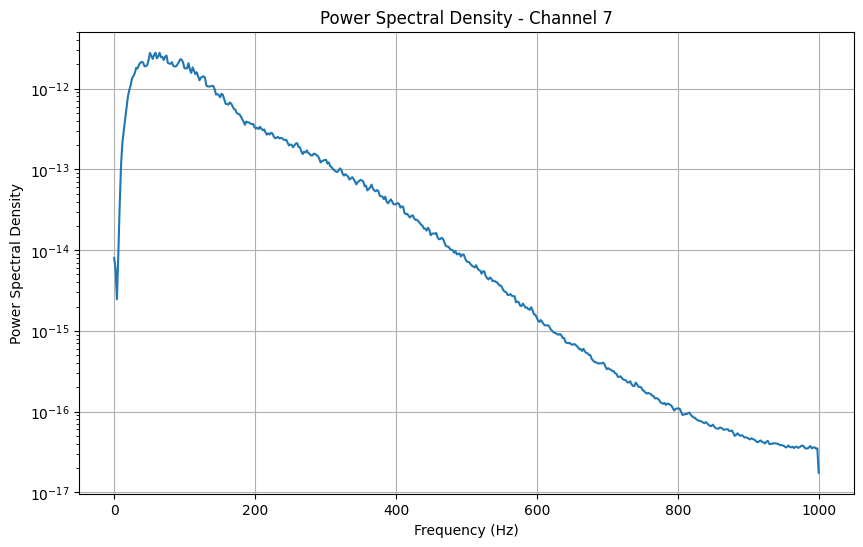

Channel 7: Maximum significant frequency = 416.02 Hz


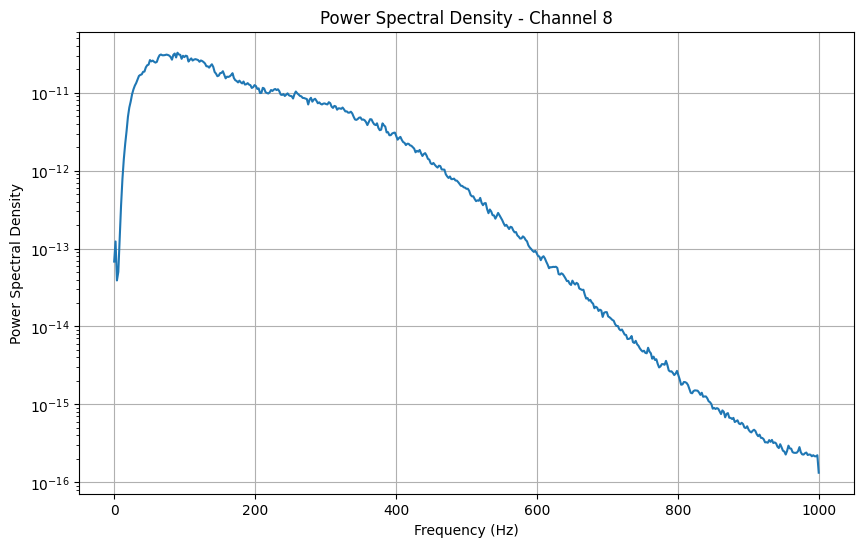

Channel 8: Maximum significant frequency = 527.34 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S27_E1_A1.mat


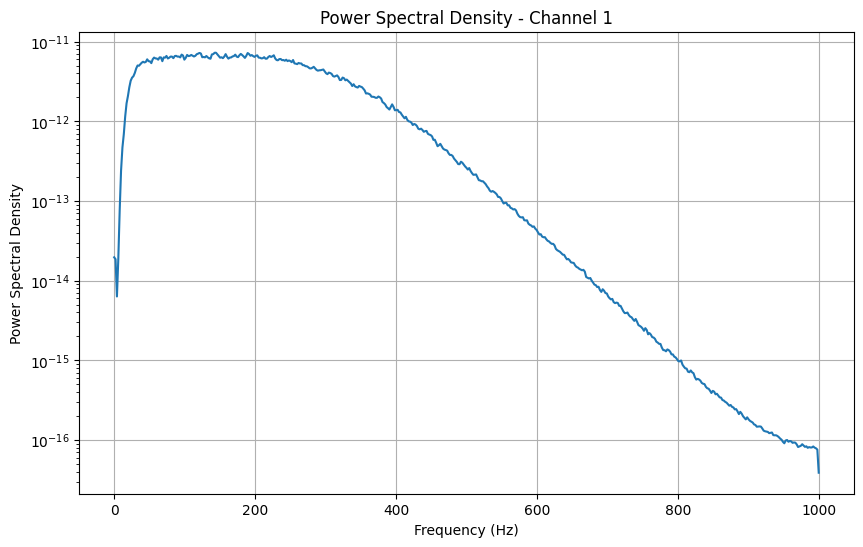

Channel 1: Maximum significant frequency = 570.31 Hz


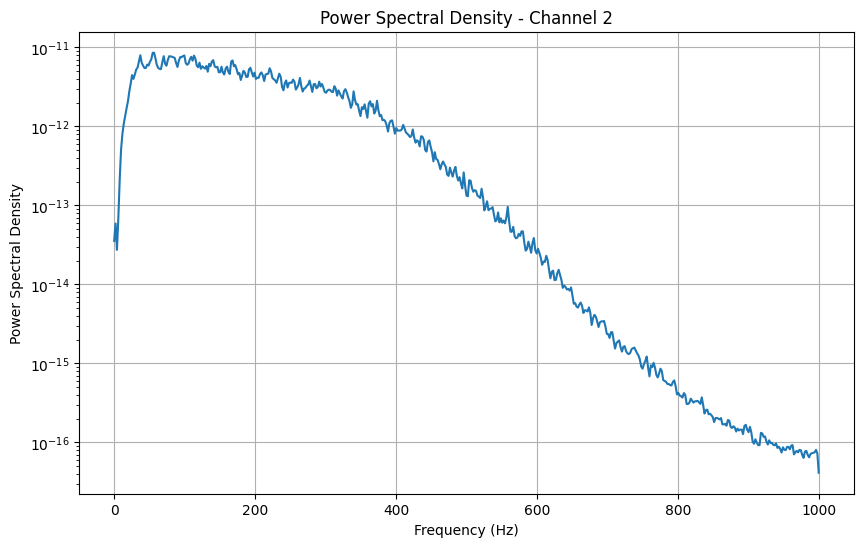

Channel 2: Maximum significant frequency = 558.59 Hz


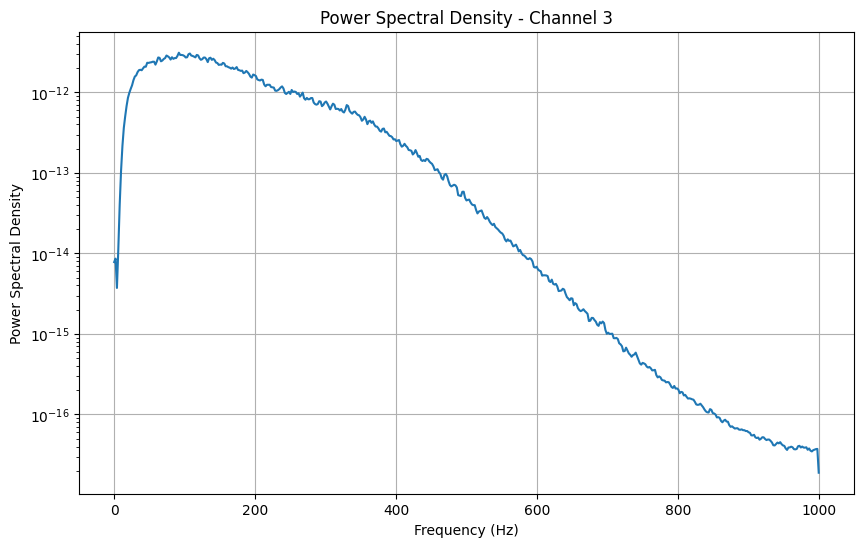

Channel 3: Maximum significant frequency = 521.48 Hz


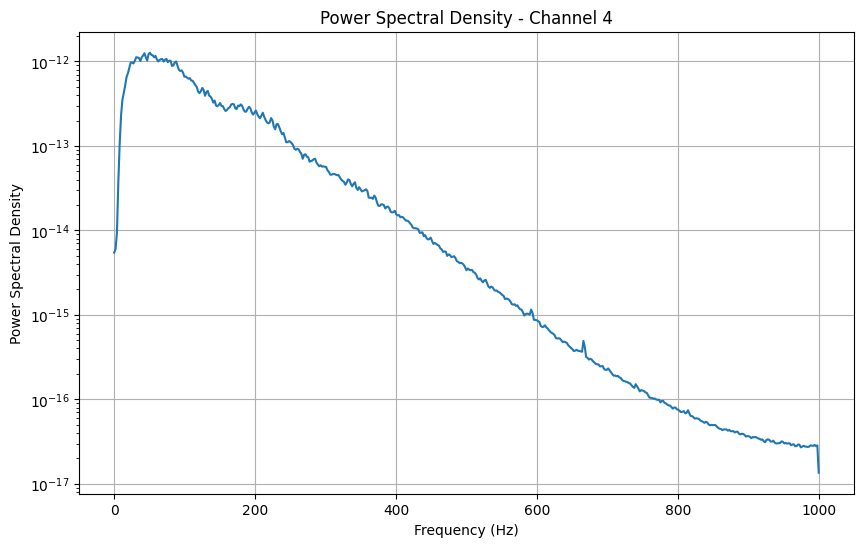

Channel 4: Maximum significant frequency = 417.97 Hz


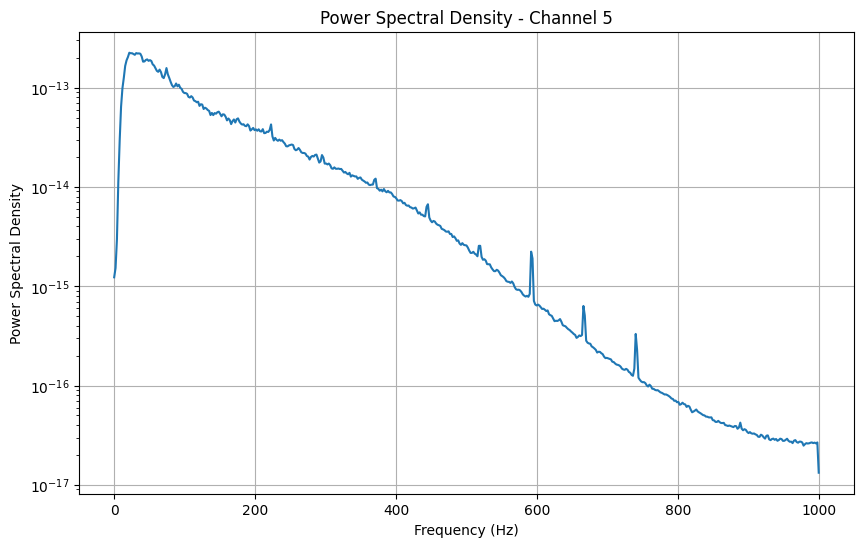

Channel 5: Maximum significant frequency = 519.53 Hz


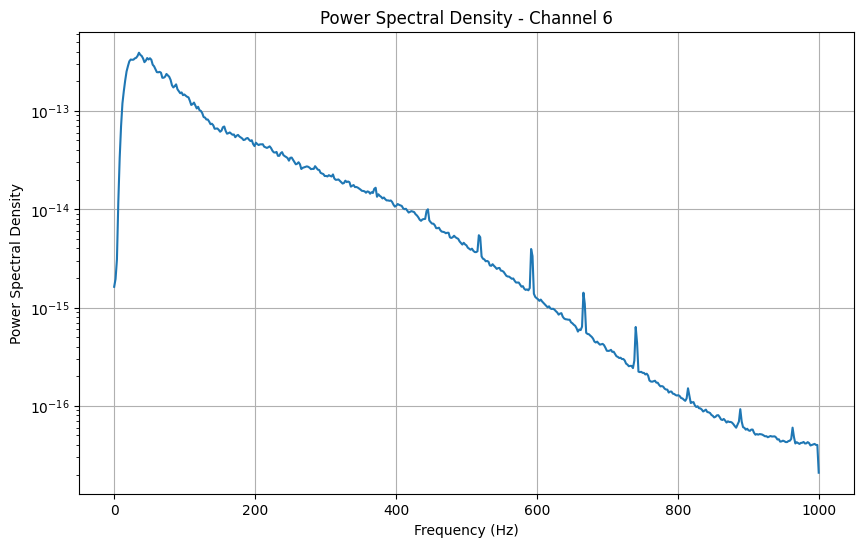

Channel 6: Maximum significant frequency = 591.80 Hz


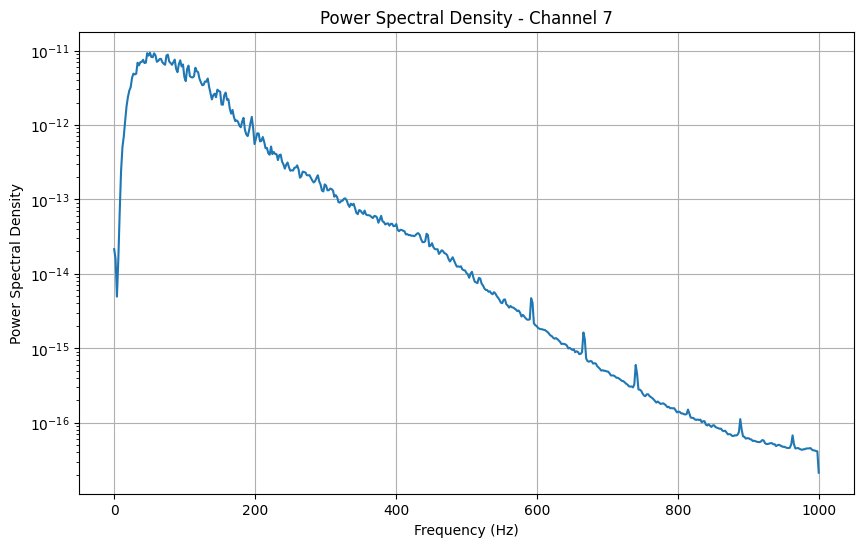

Channel 7: Maximum significant frequency = 330.08 Hz


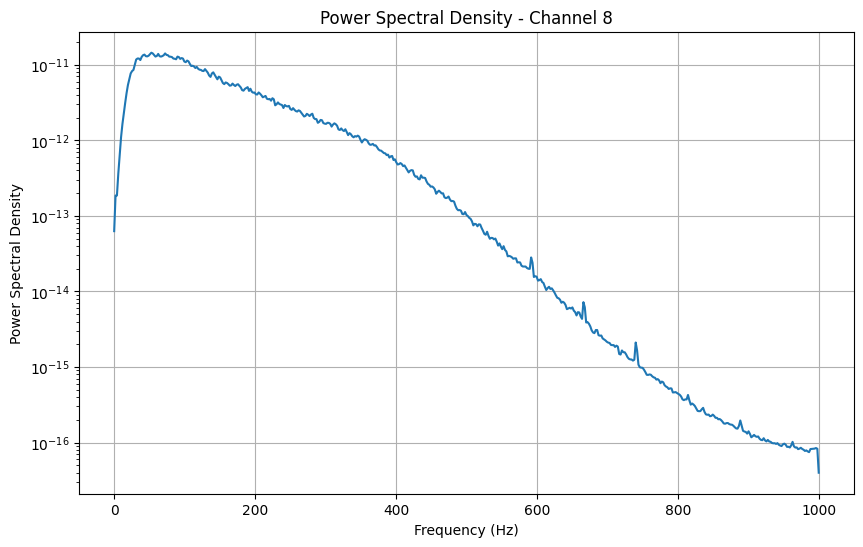

Channel 8: Maximum significant frequency = 482.42 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S33_E1_A1.mat


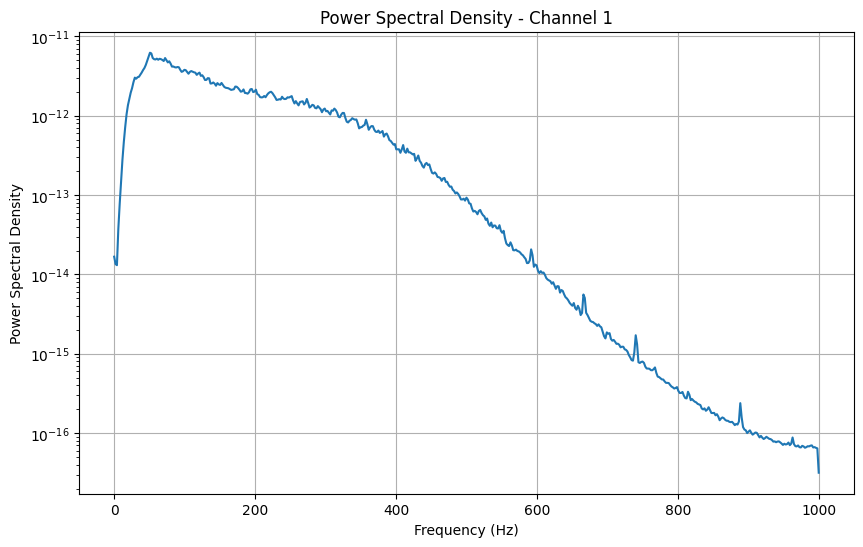

Channel 1: Maximum significant frequency = 519.53 Hz


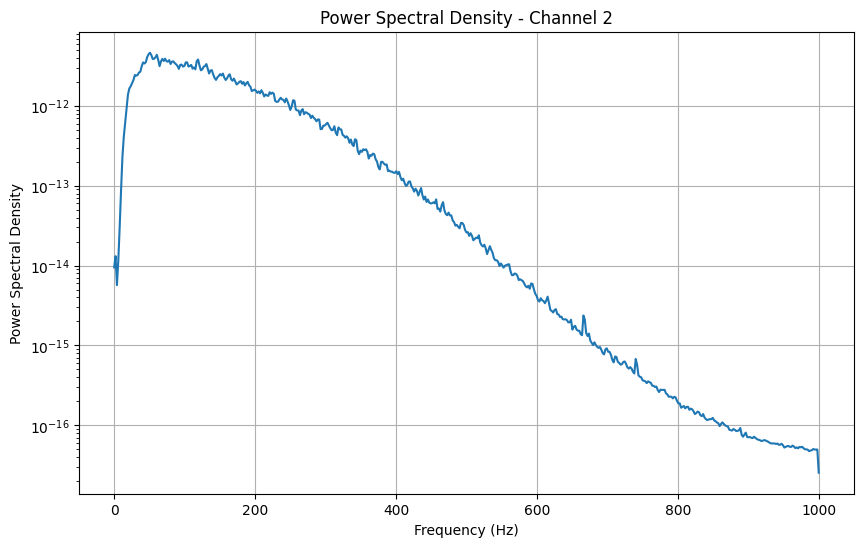

Channel 2: Maximum significant frequency = 468.75 Hz


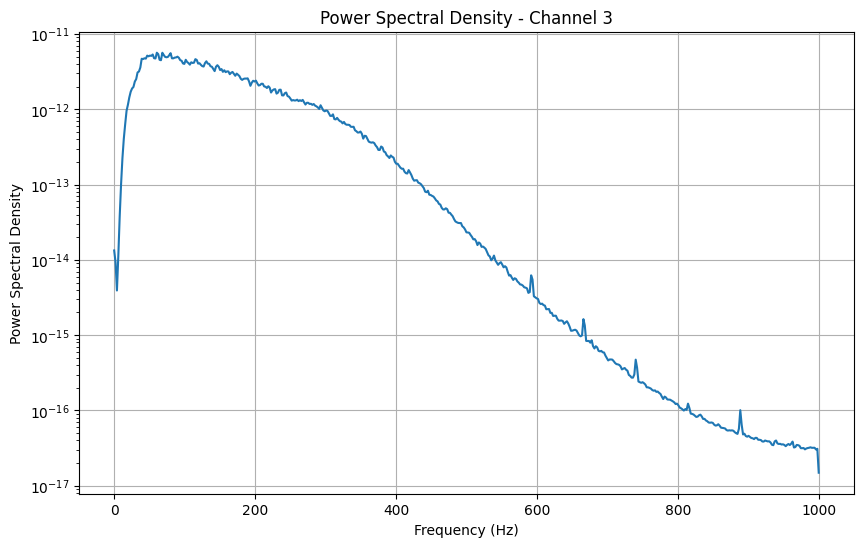

Channel 3: Maximum significant frequency = 458.98 Hz


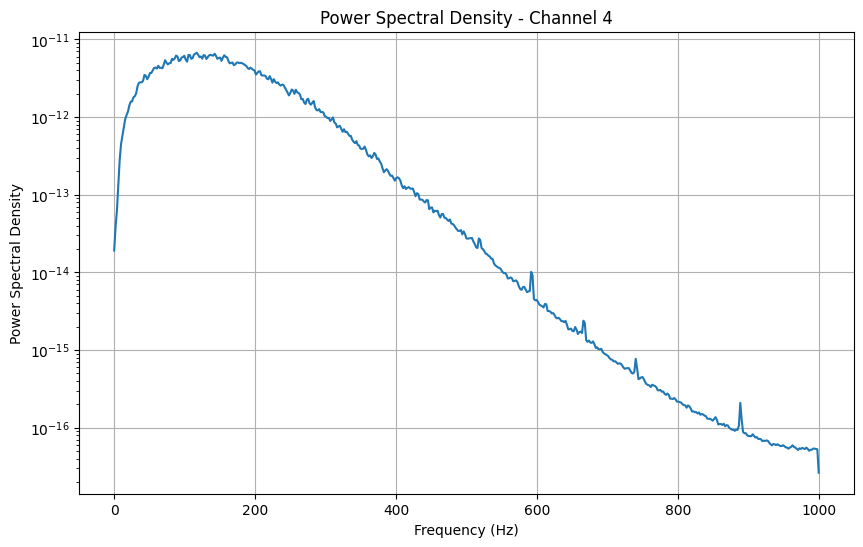

Channel 4: Maximum significant frequency = 451.17 Hz


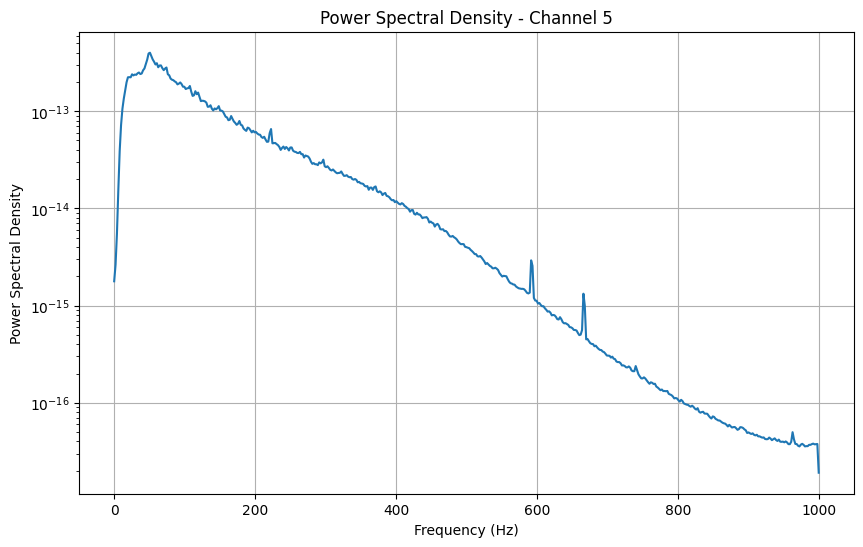

Channel 5: Maximum significant frequency = 498.05 Hz


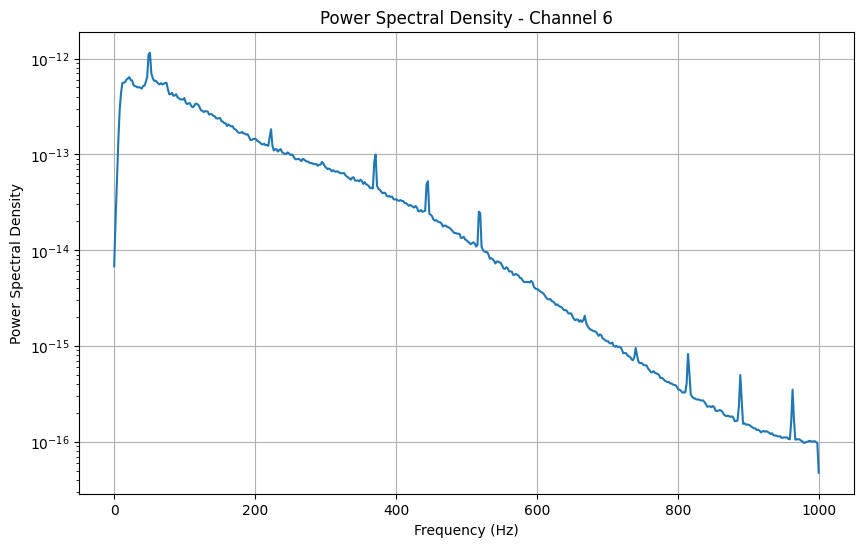

Channel 6: Maximum significant frequency = 519.53 Hz


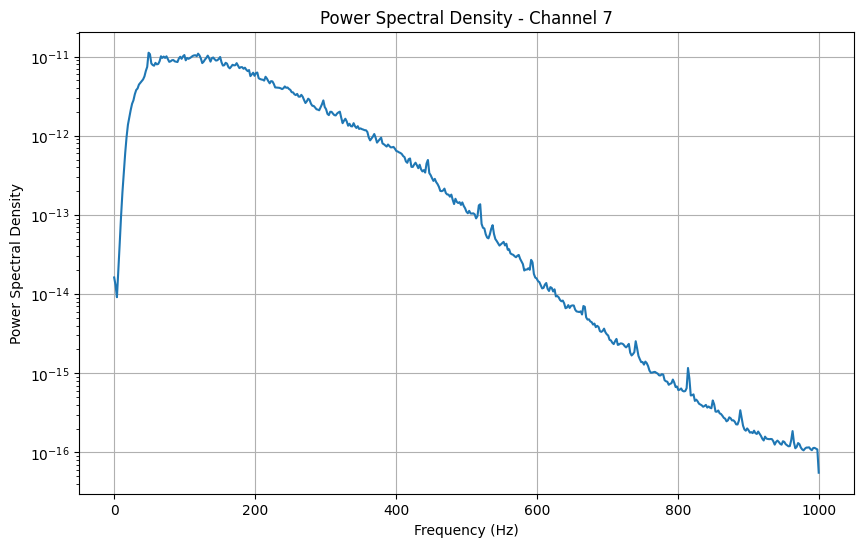

Channel 7: Maximum significant frequency = 519.53 Hz


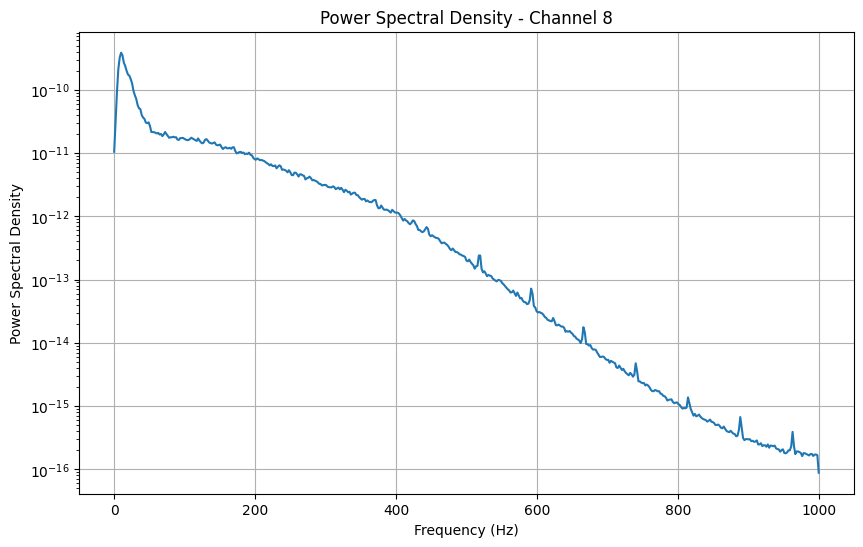

Channel 8: Maximum significant frequency = 279.30 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S31_E1_A1.mat


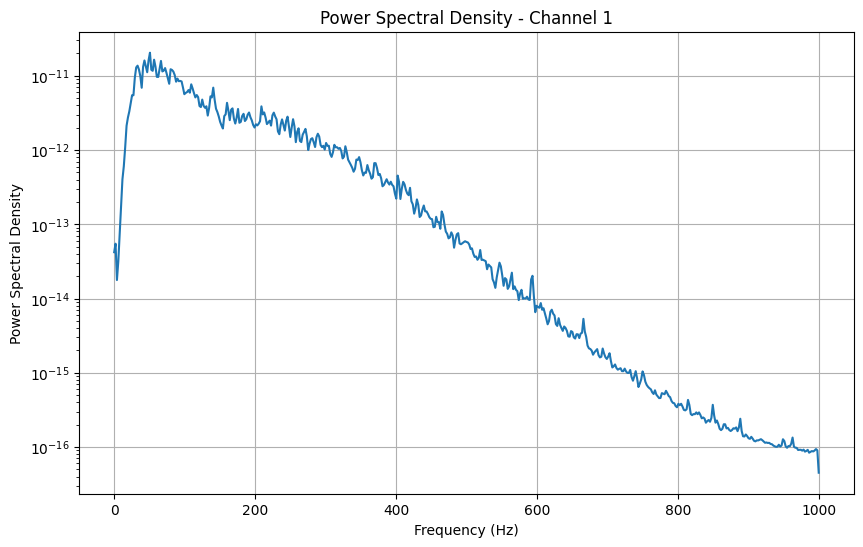

Channel 1: Maximum significant frequency = 429.69 Hz


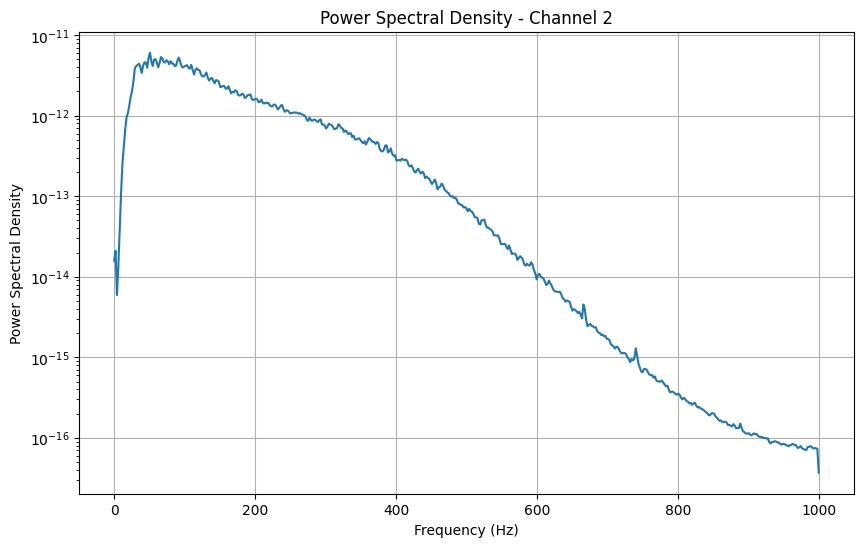

Channel 2: Maximum significant frequency = 509.77 Hz


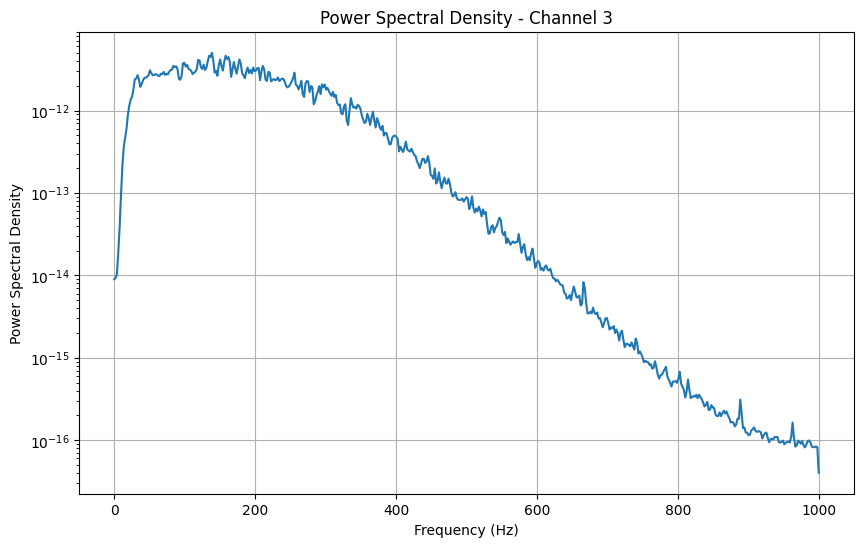

Channel 3: Maximum significant frequency = 527.34 Hz


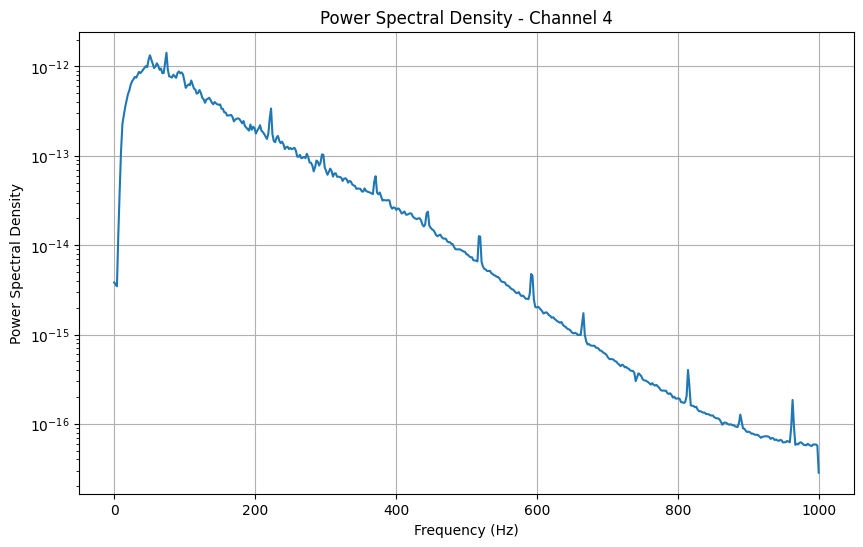

Channel 4: Maximum significant frequency = 453.12 Hz


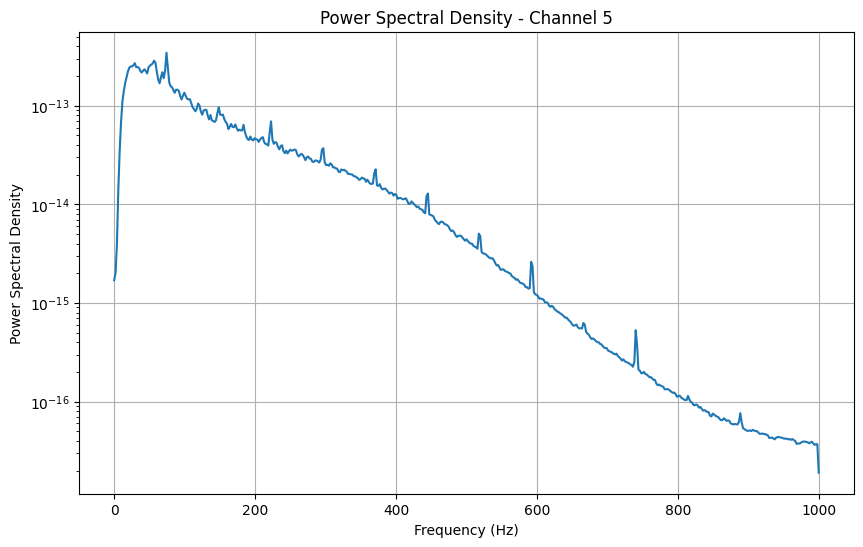

Channel 5: Maximum significant frequency = 519.53 Hz


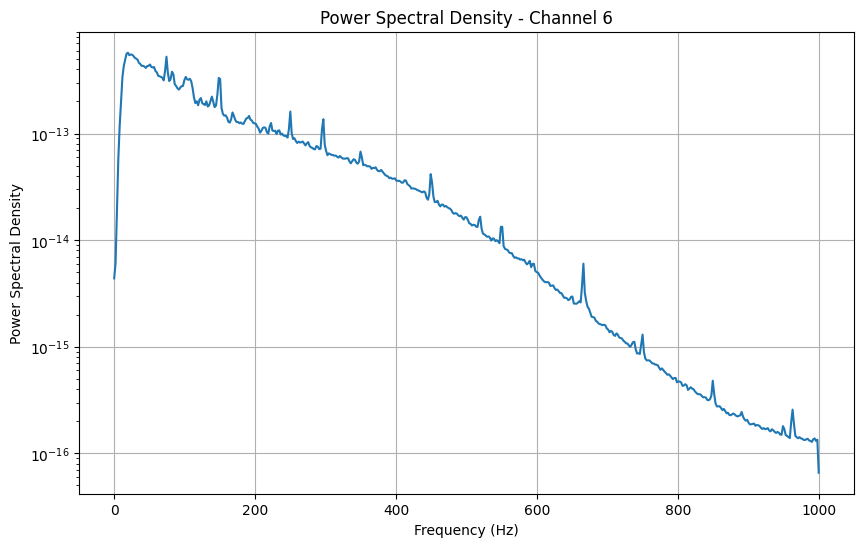

Channel 6: Maximum significant frequency = 666.02 Hz


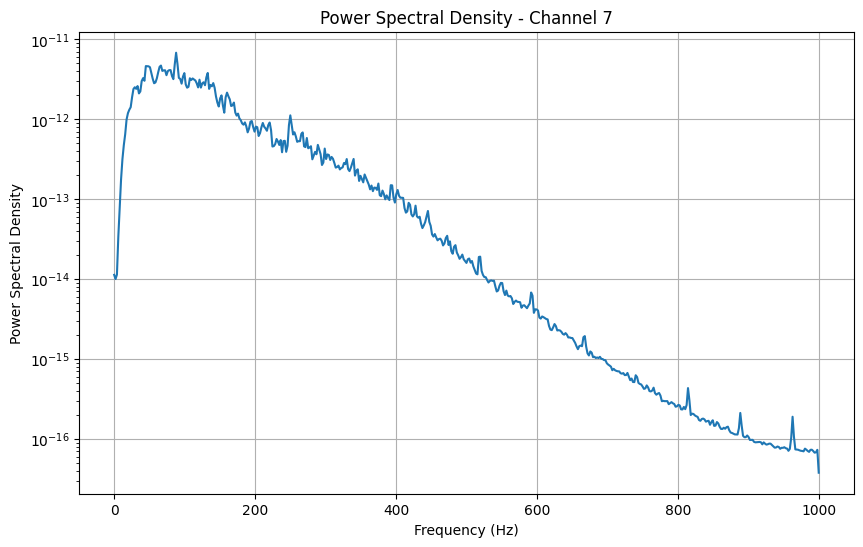

Channel 7: Maximum significant frequency = 445.31 Hz


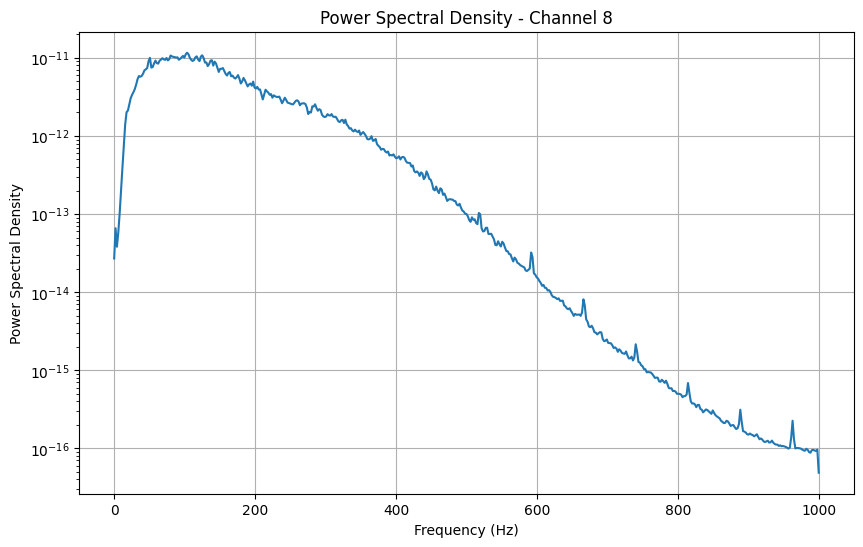

Channel 8: Maximum significant frequency = 492.19 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S35_E1_A1.mat


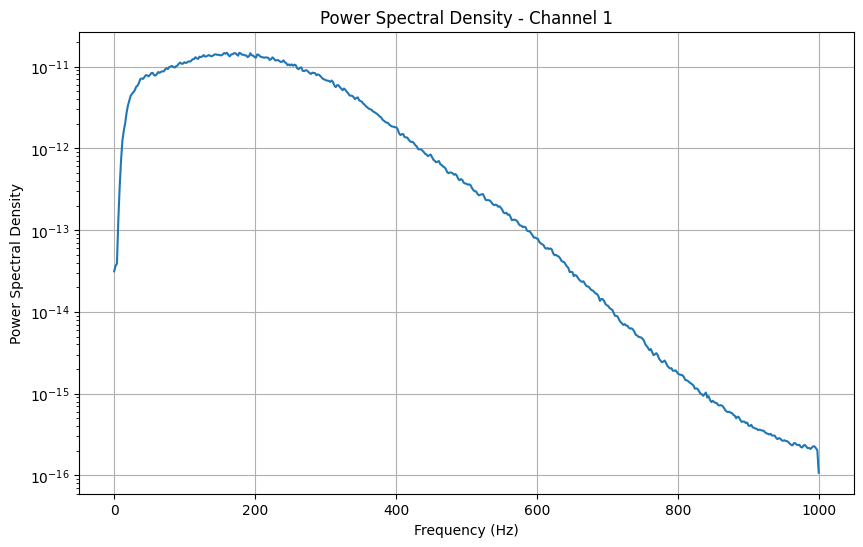

Channel 1: Maximum significant frequency = 560.55 Hz


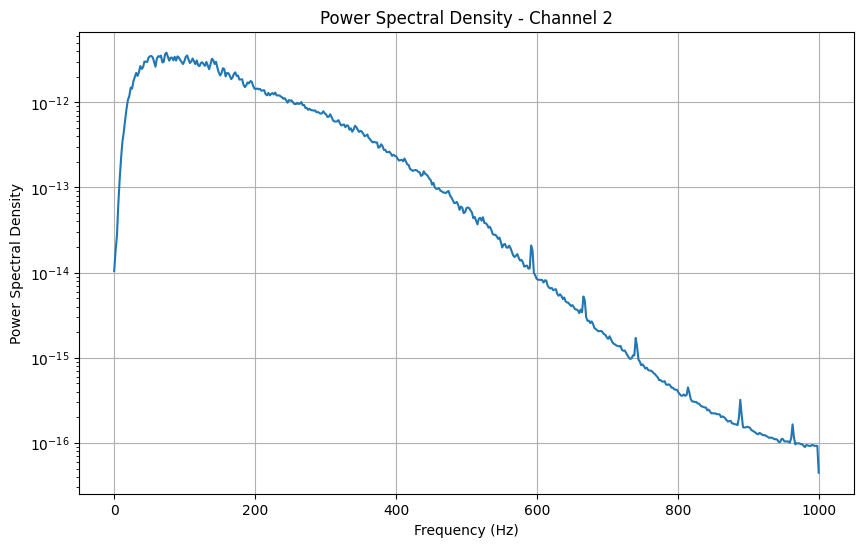

Channel 2: Maximum significant frequency = 525.39 Hz


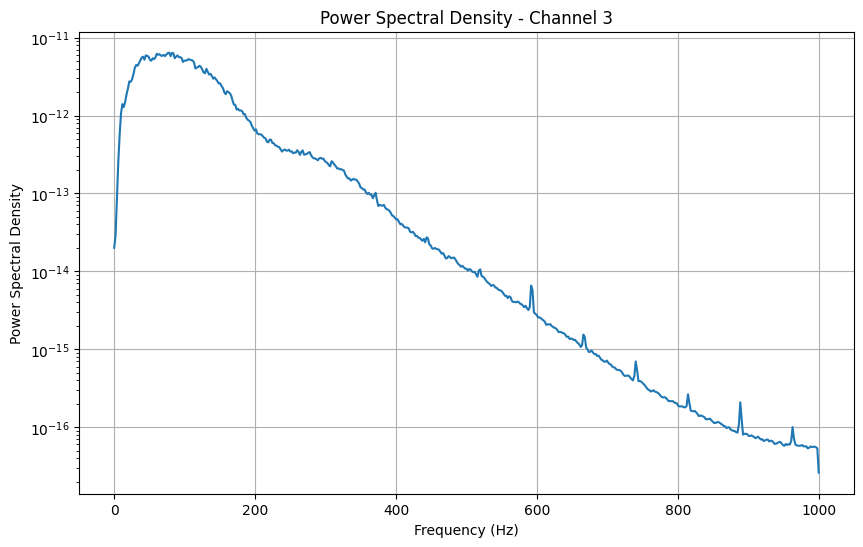

Channel 3: Maximum significant frequency = 384.77 Hz


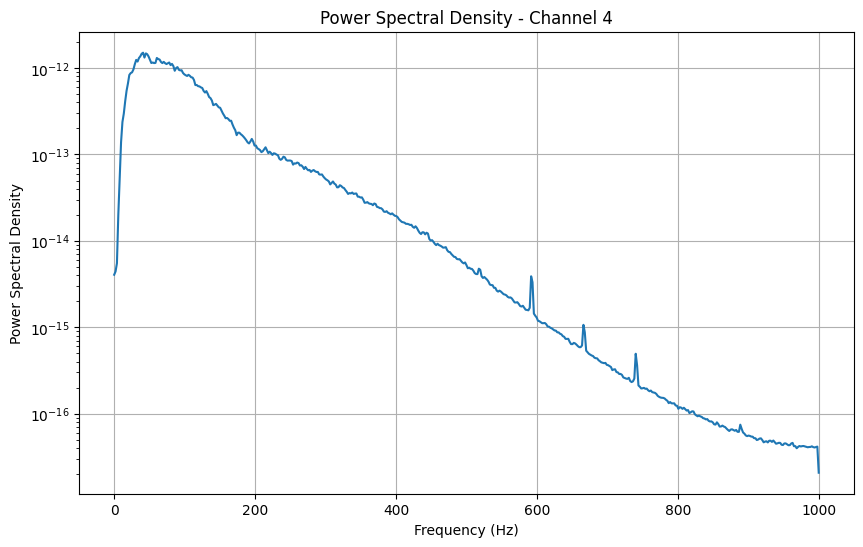

Channel 4: Maximum significant frequency = 421.88 Hz


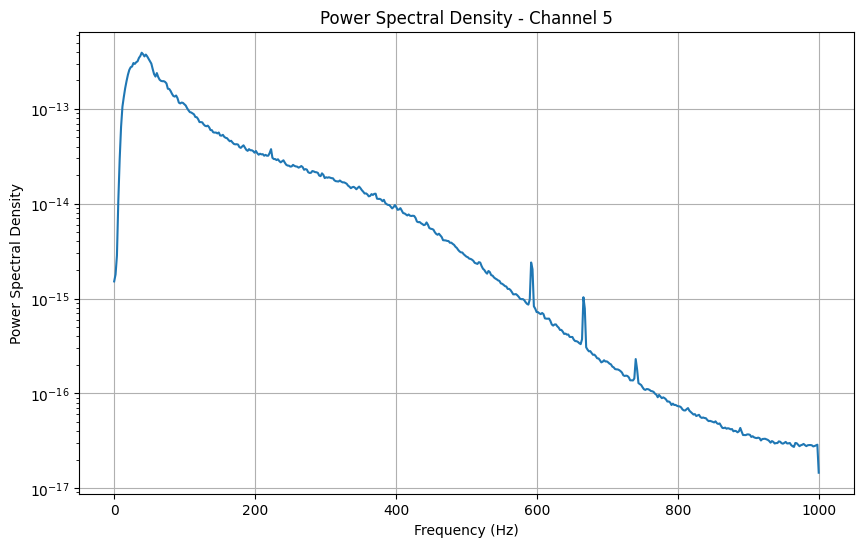

Channel 5: Maximum significant frequency = 474.61 Hz


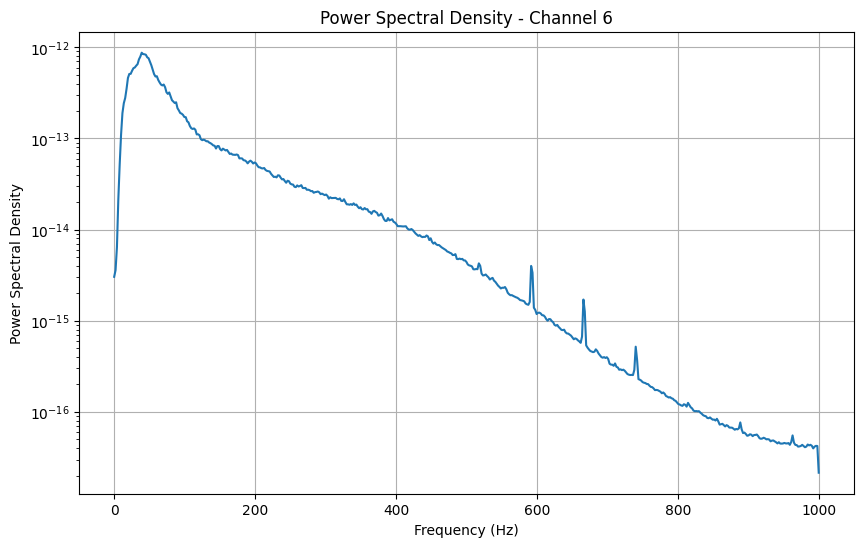

Channel 6: Maximum significant frequency = 429.69 Hz


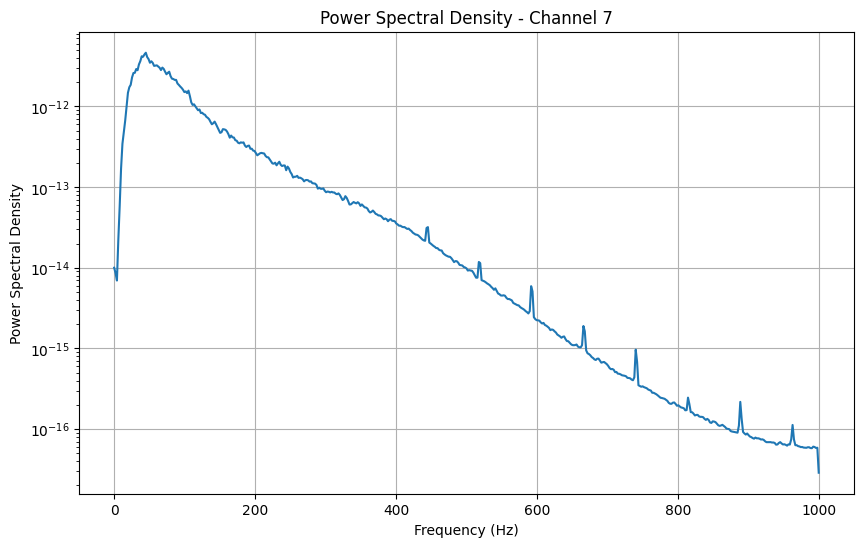

Channel 7: Maximum significant frequency = 371.09 Hz


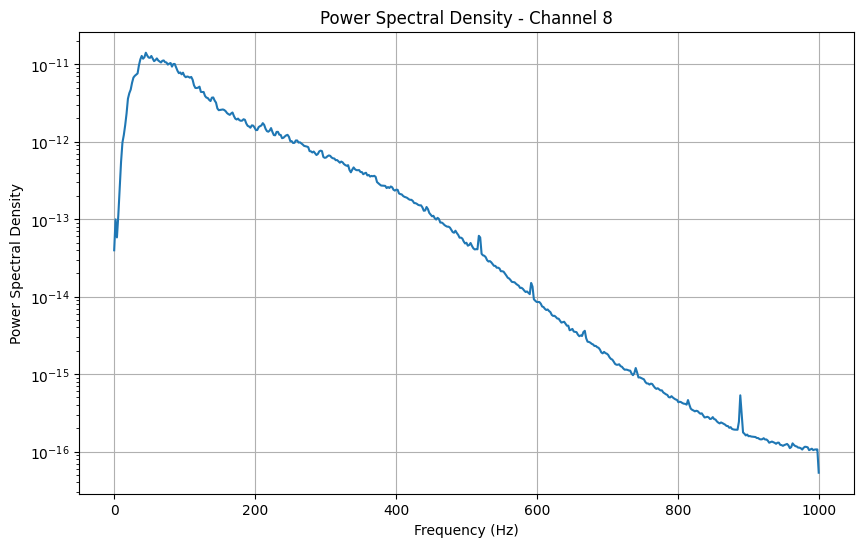

Channel 8: Maximum significant frequency = 443.36 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S36_E1_A1.mat


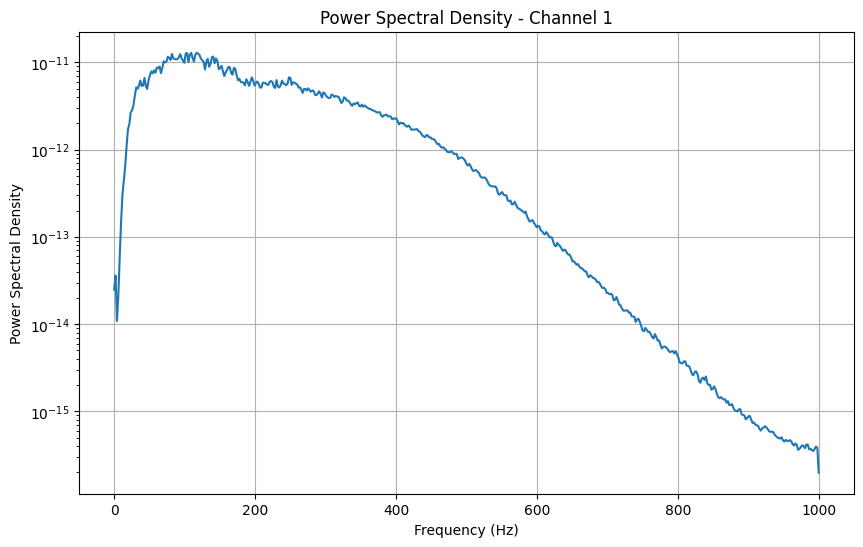

Channel 1: Maximum significant frequency = 603.52 Hz


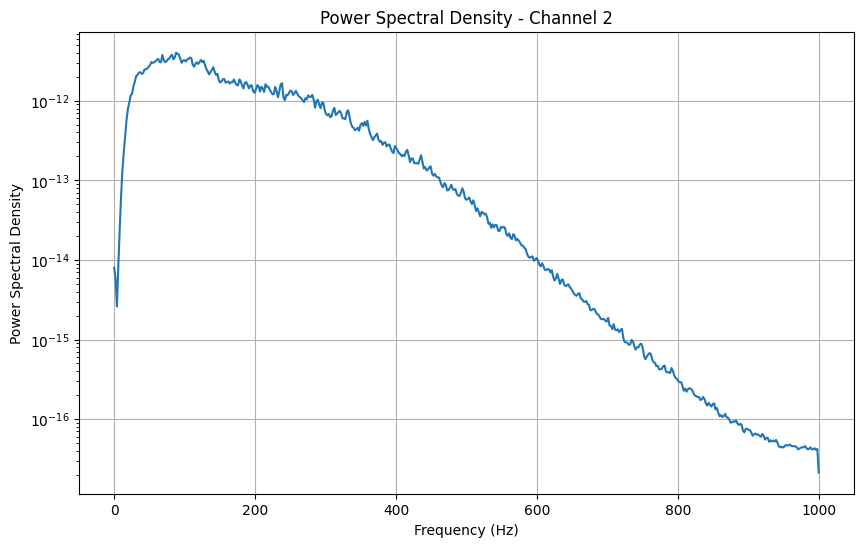

Channel 2: Maximum significant frequency = 515.62 Hz


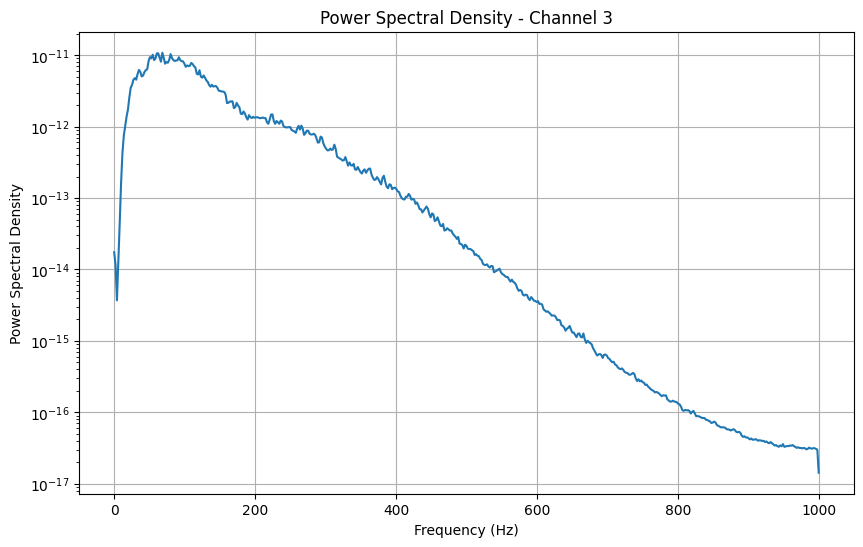

Channel 3: Maximum significant frequency = 417.97 Hz


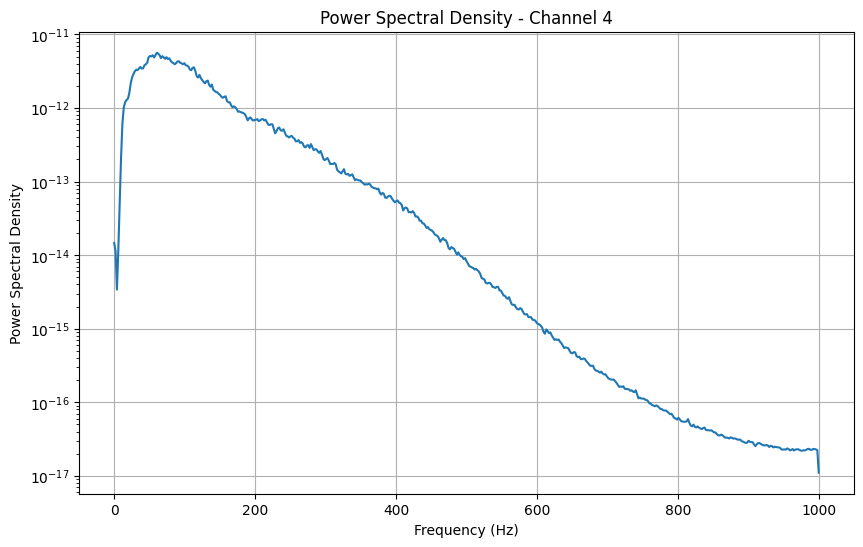

Channel 4: Maximum significant frequency = 394.53 Hz


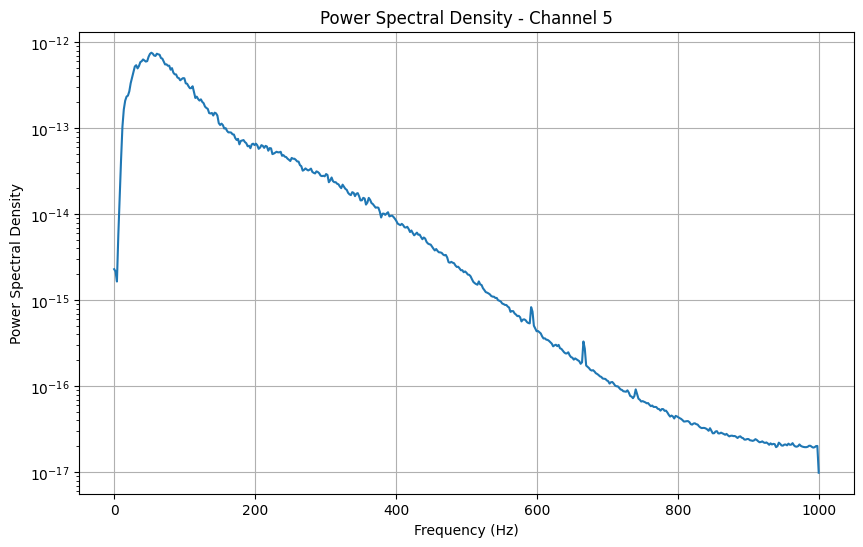

Channel 5: Maximum significant frequency = 408.20 Hz


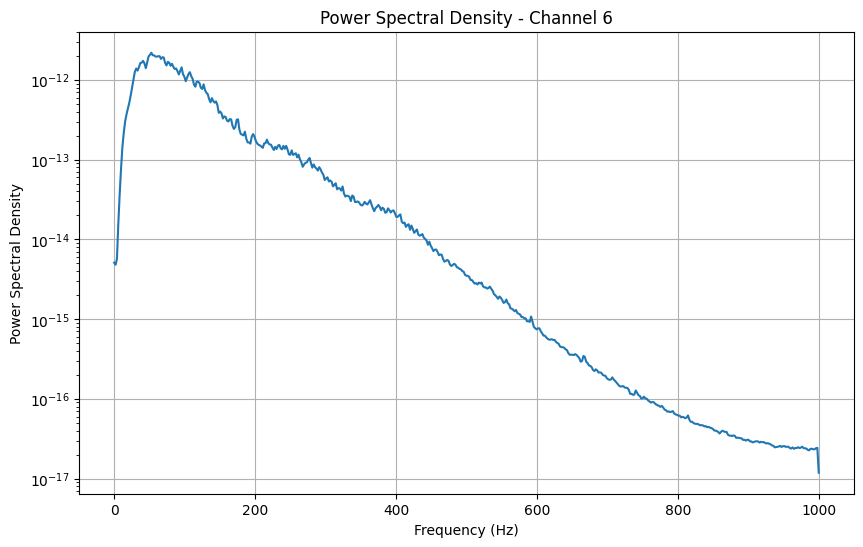

Channel 6: Maximum significant frequency = 396.48 Hz


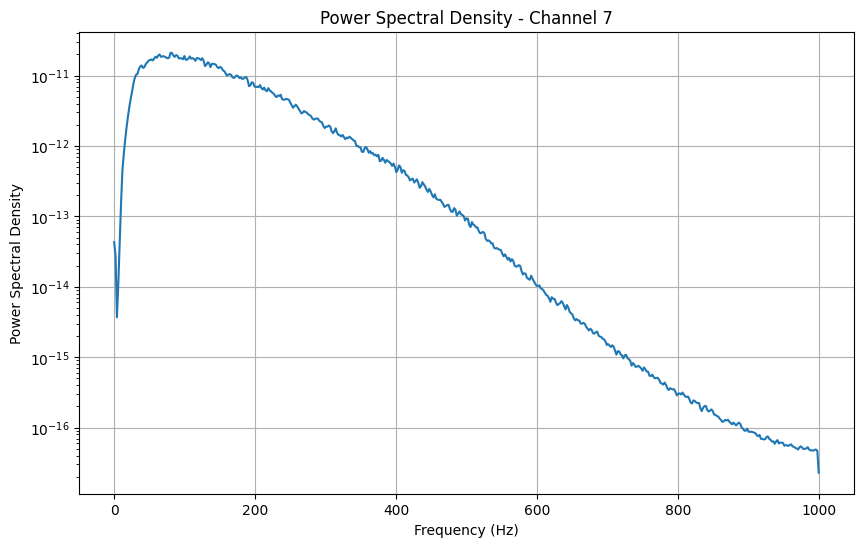

Channel 7: Maximum significant frequency = 449.22 Hz


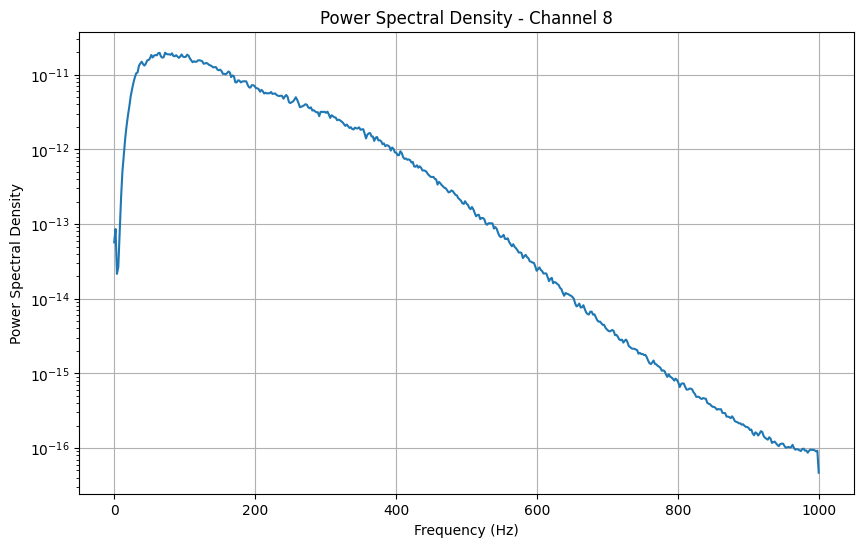

Channel 8: Maximum significant frequency = 498.05 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S38_E1_A1.mat


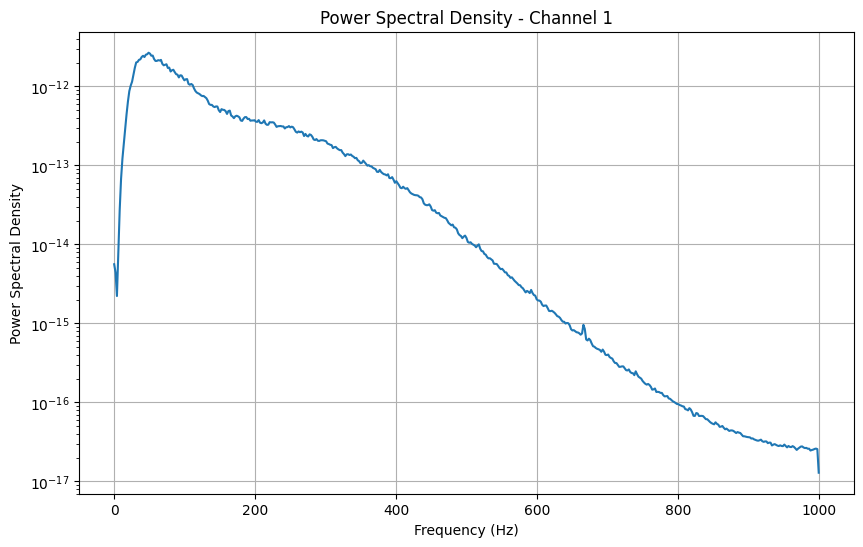

Channel 1: Maximum significant frequency = 455.08 Hz


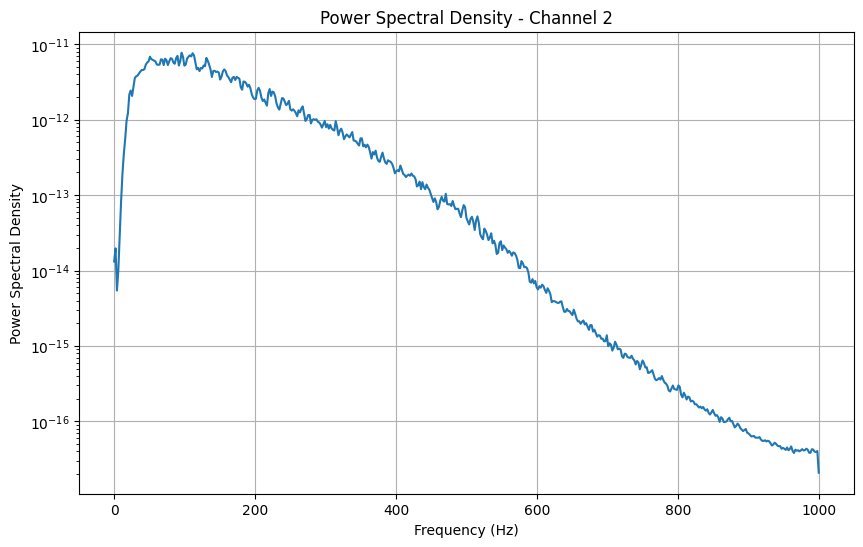

Channel 2: Maximum significant frequency = 480.47 Hz


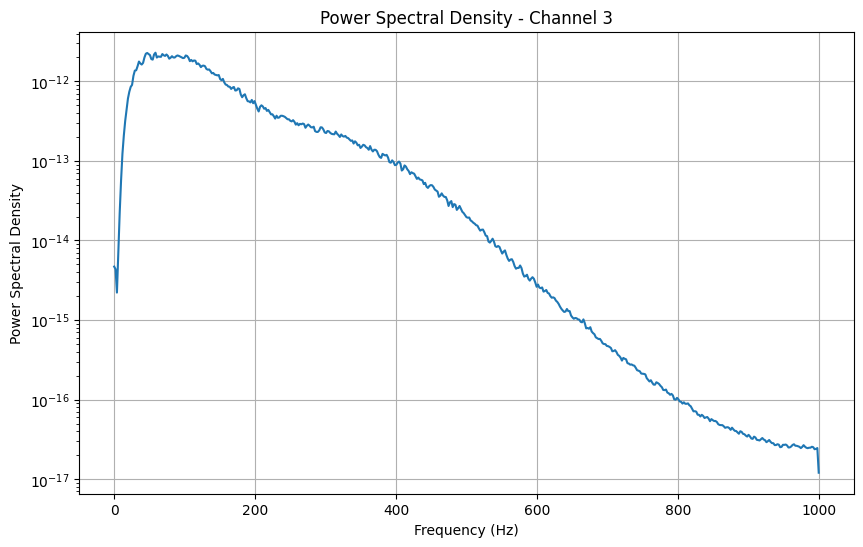

Channel 3: Maximum significant frequency = 494.14 Hz


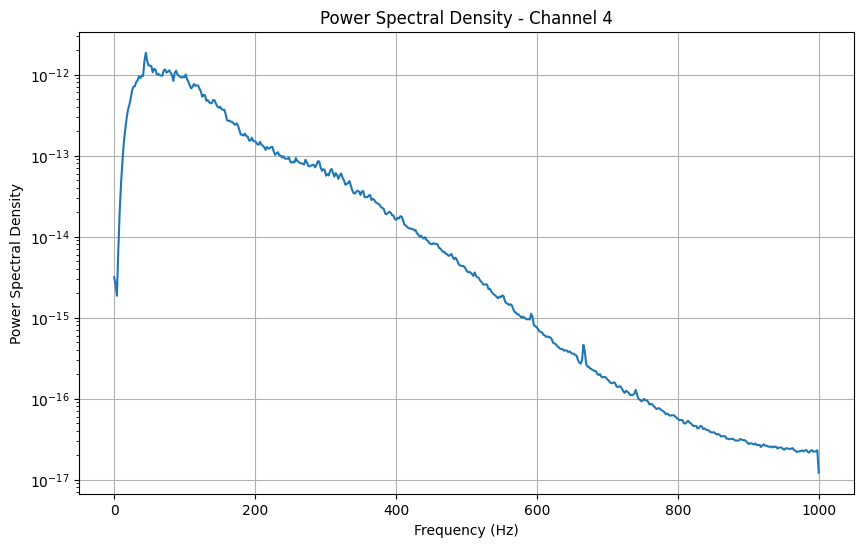

Channel 4: Maximum significant frequency = 392.58 Hz


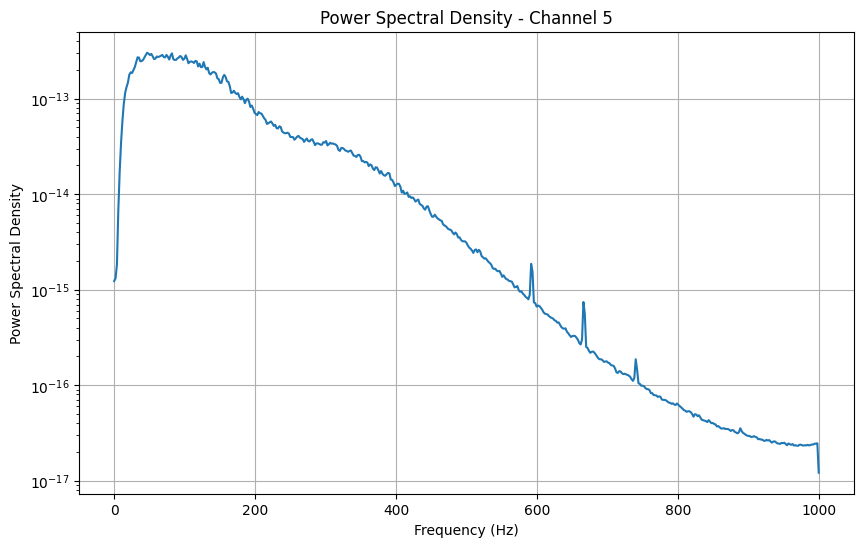

Channel 5: Maximum significant frequency = 500.00 Hz


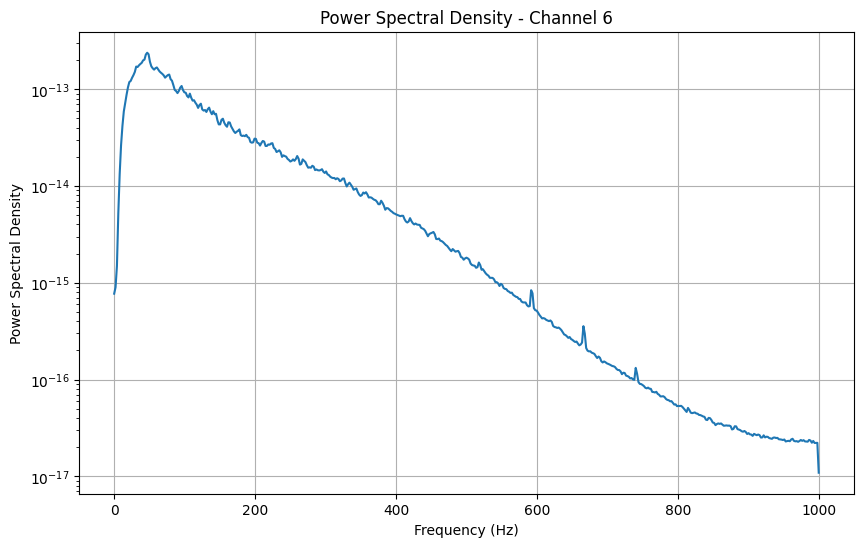

Channel 6: Maximum significant frequency = 472.66 Hz


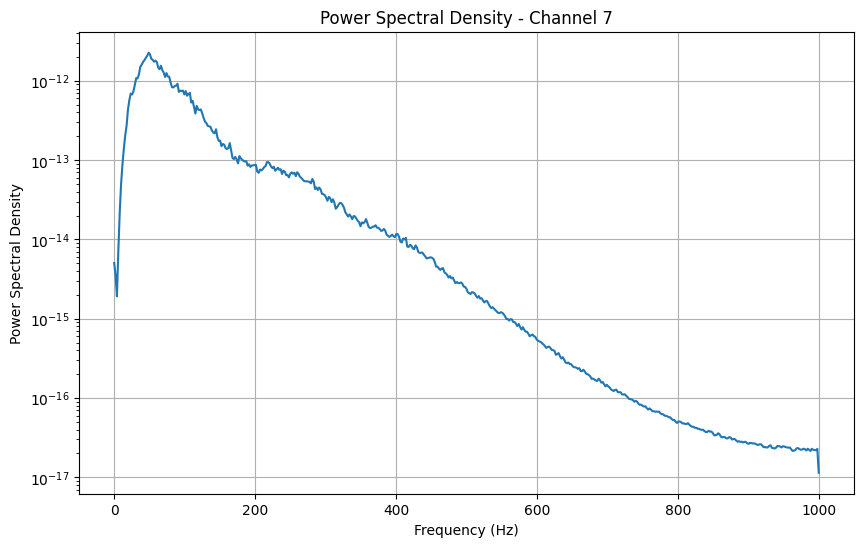

Channel 7: Maximum significant frequency = 326.17 Hz


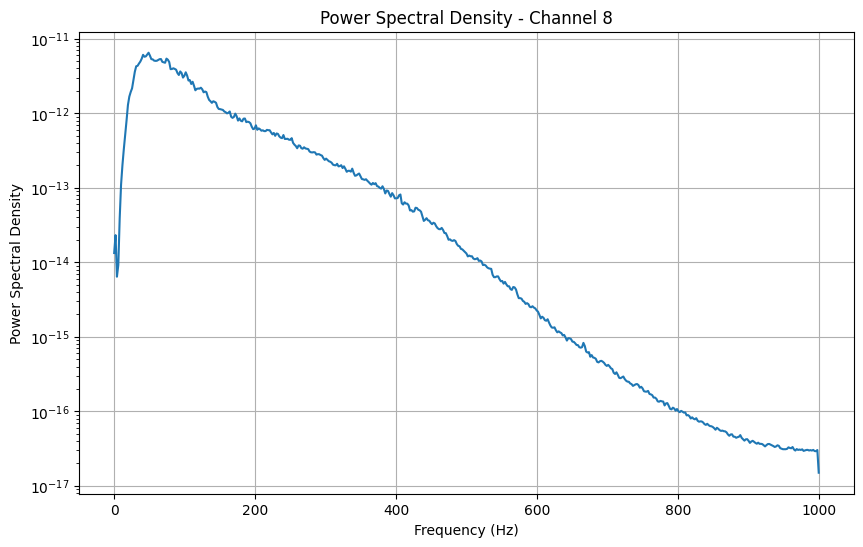

Channel 8: Maximum significant frequency = 406.25 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S37_E1_A1.mat


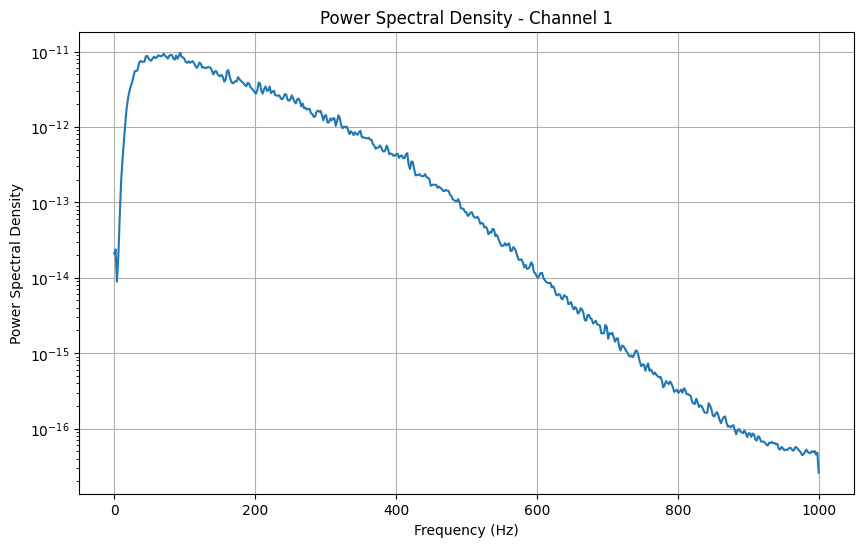

Channel 1: Maximum significant frequency = 490.23 Hz


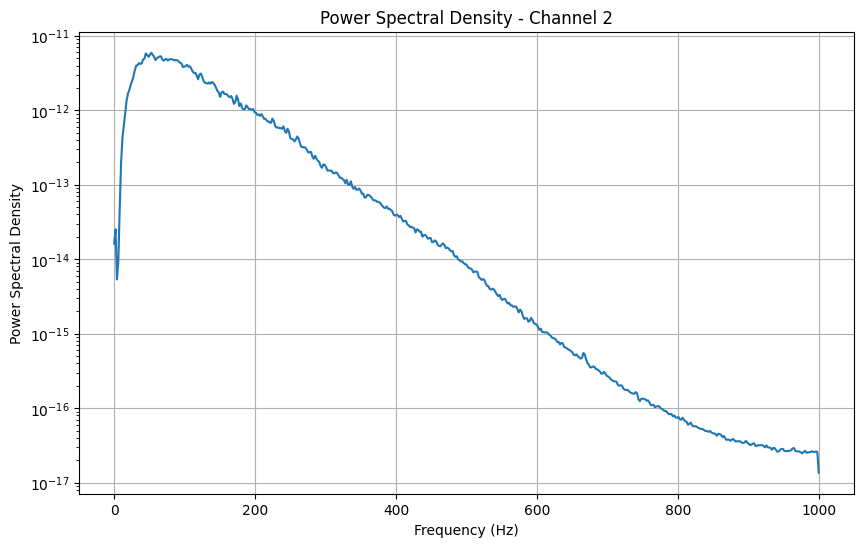

Channel 2: Maximum significant frequency = 371.09 Hz


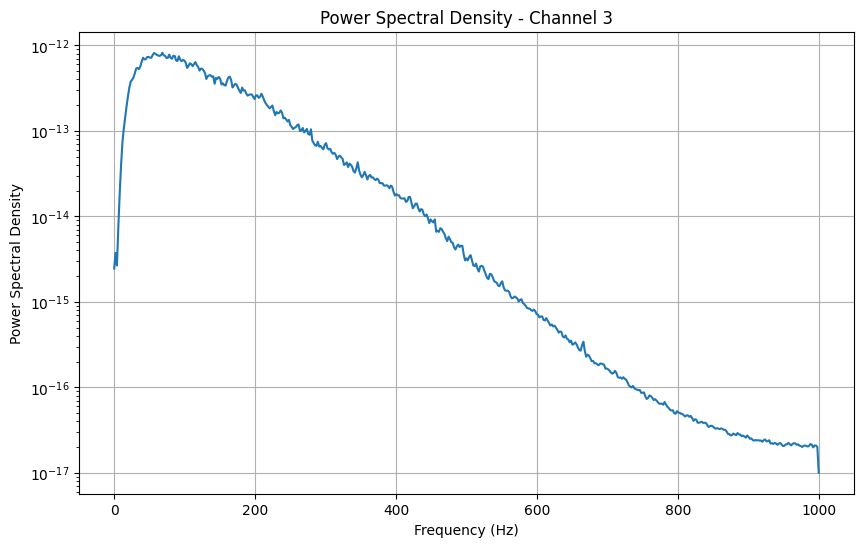

Channel 3: Maximum significant frequency = 455.08 Hz


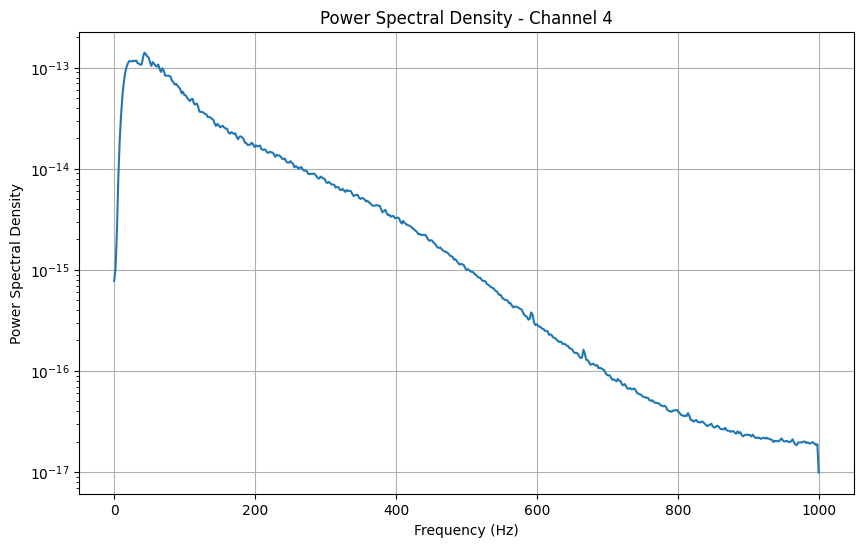

Channel 4: Maximum significant frequency = 474.61 Hz


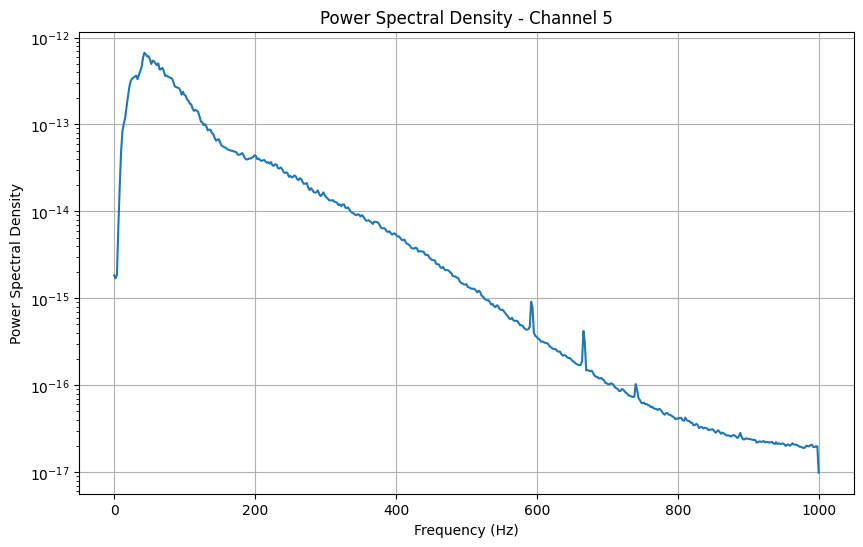

Channel 5: Maximum significant frequency = 376.95 Hz


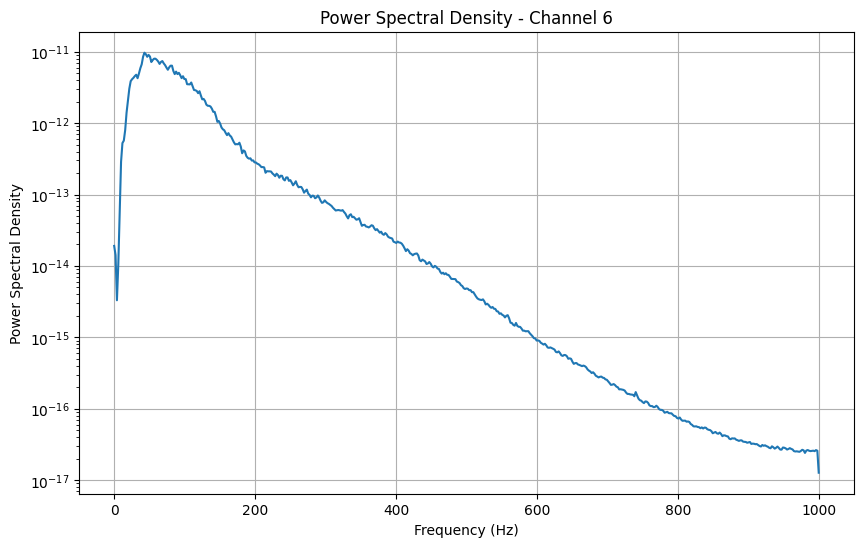

Channel 6: Maximum significant frequency = 289.06 Hz


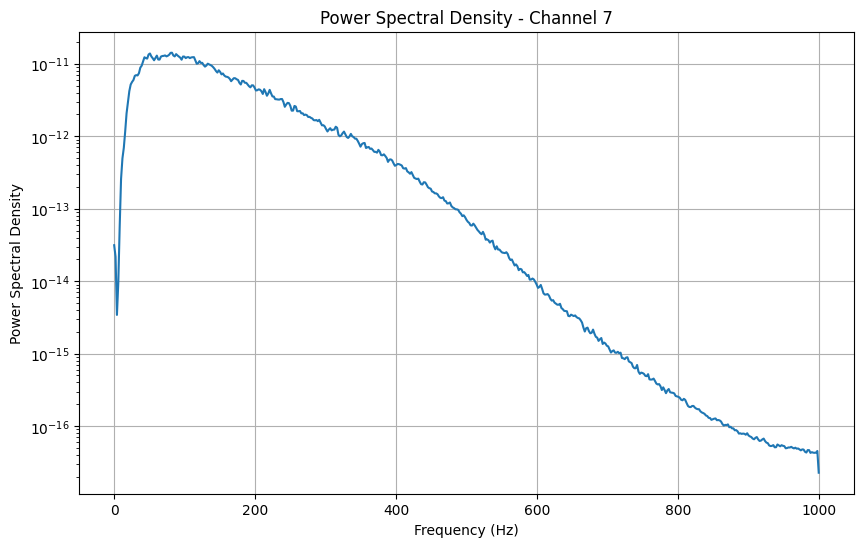

Channel 7: Maximum significant frequency = 466.80 Hz


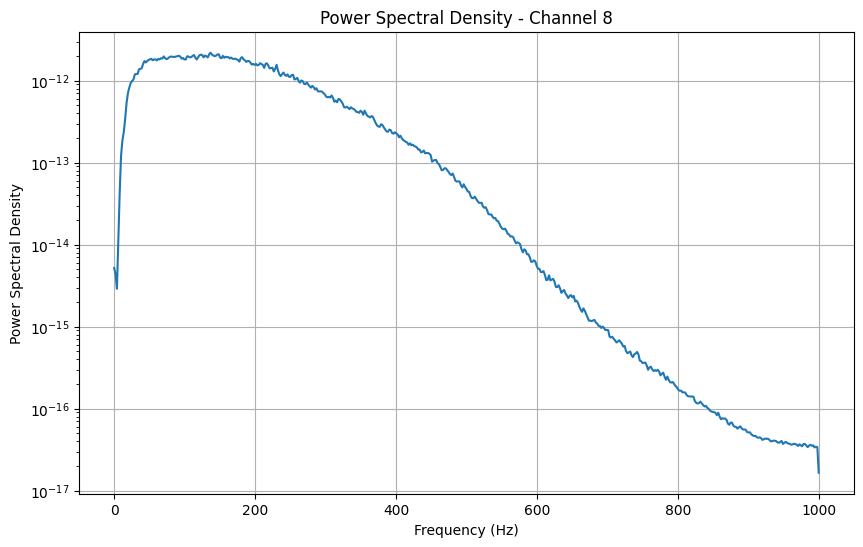

Channel 8: Maximum significant frequency = 535.16 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S39_E1_A1.mat


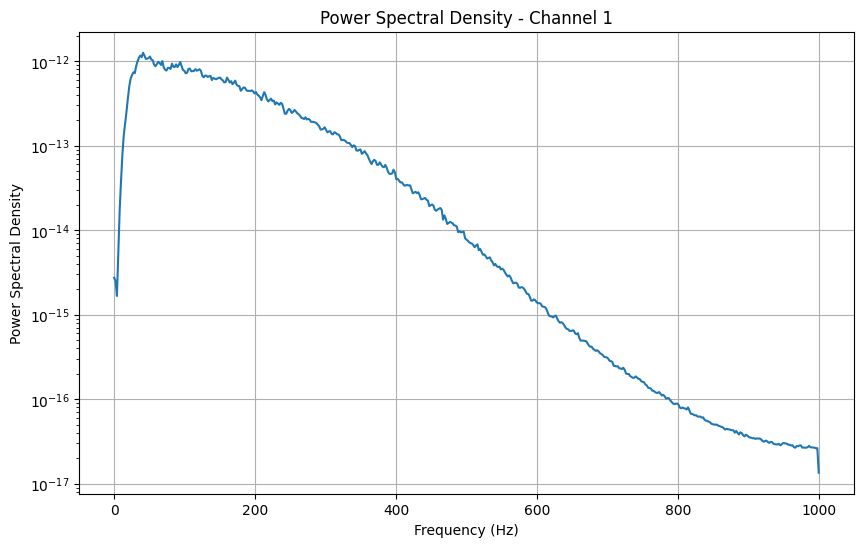

Channel 1: Maximum significant frequency = 470.70 Hz


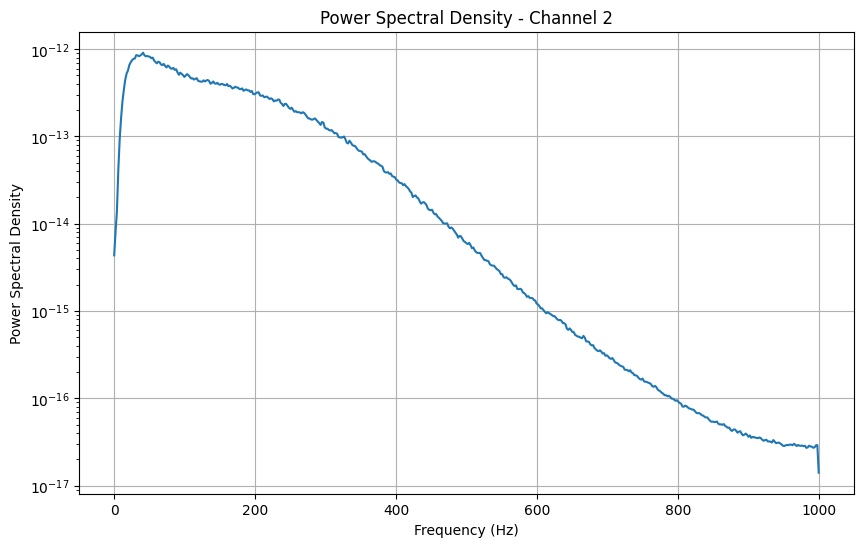

Channel 2: Maximum significant frequency = 474.61 Hz


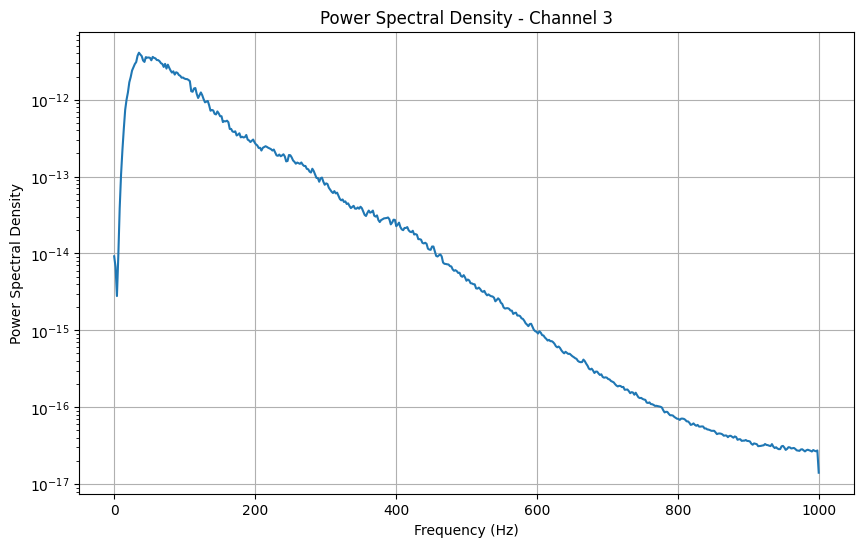

Channel 3: Maximum significant frequency = 339.84 Hz


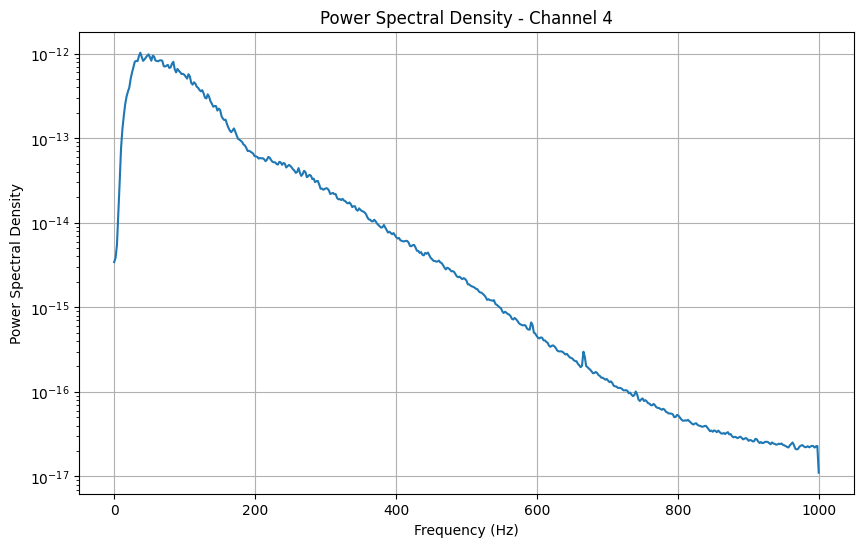

Channel 4: Maximum significant frequency = 371.09 Hz


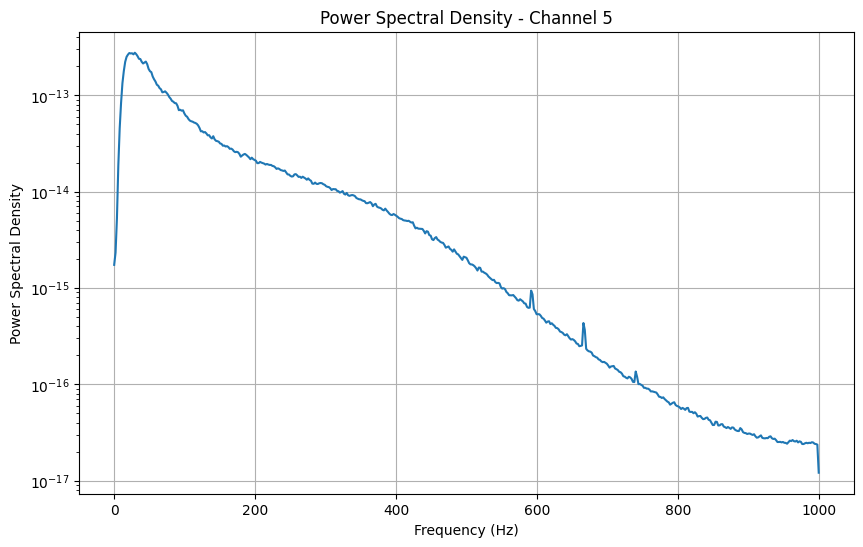

Channel 5: Maximum significant frequency = 468.75 Hz


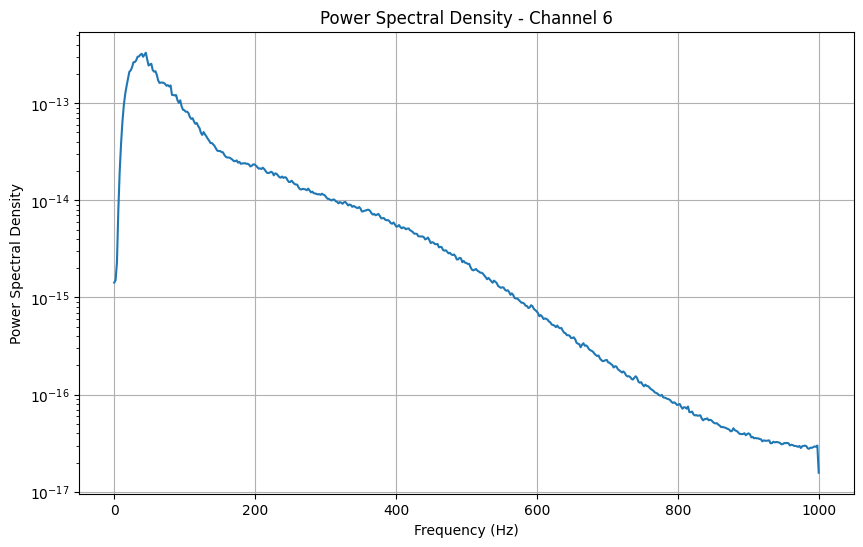

Channel 6: Maximum significant frequency = 462.89 Hz


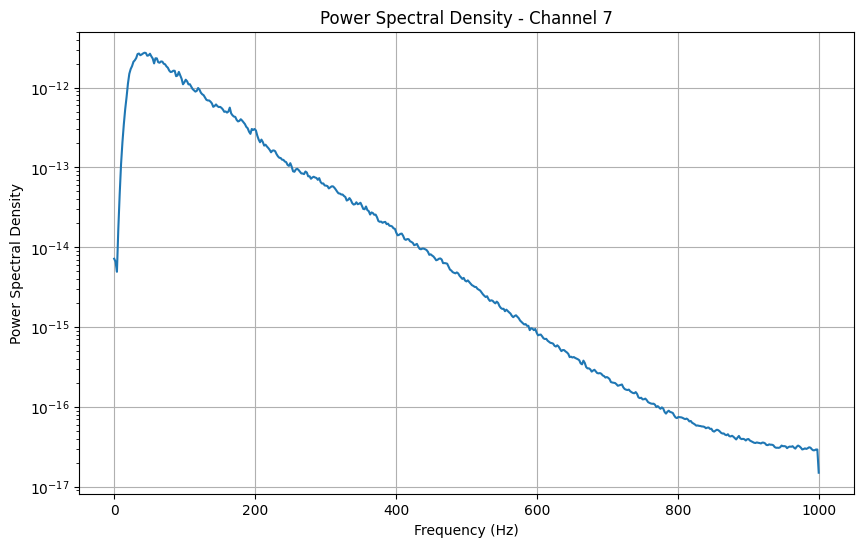

Channel 7: Maximum significant frequency = 361.33 Hz


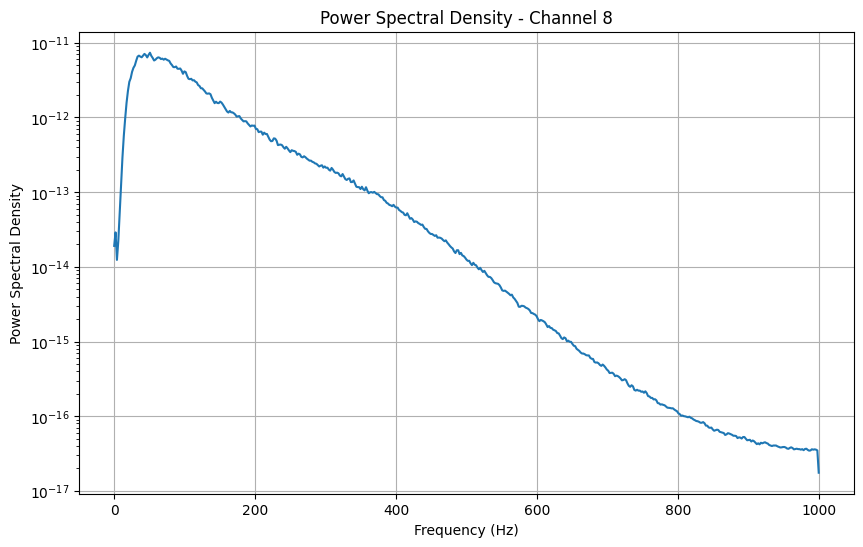

Channel 8: Maximum significant frequency = 384.77 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S40_E1_A1.mat


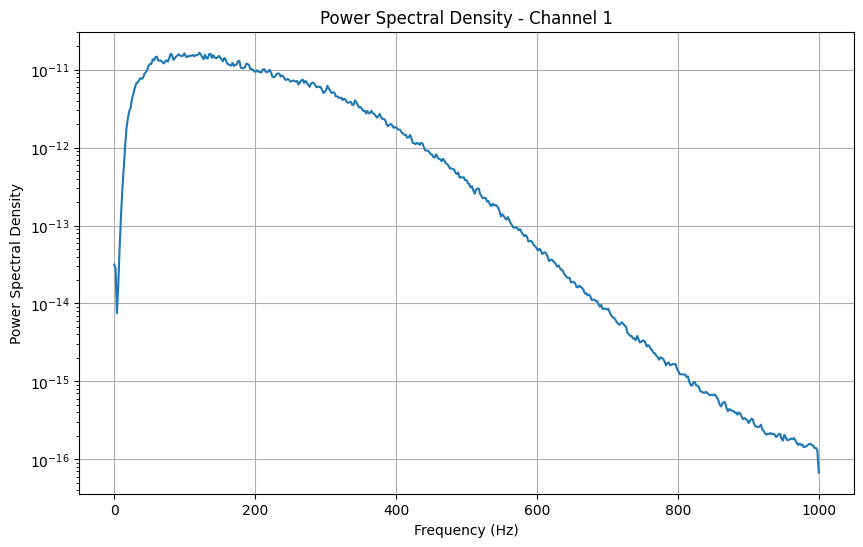

Channel 1: Maximum significant frequency = 544.92 Hz


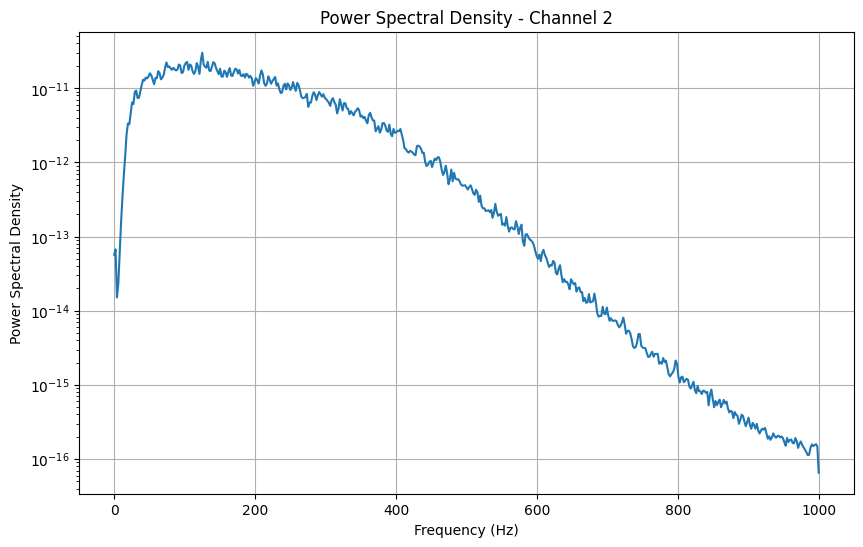

Channel 2: Maximum significant frequency = 519.53 Hz


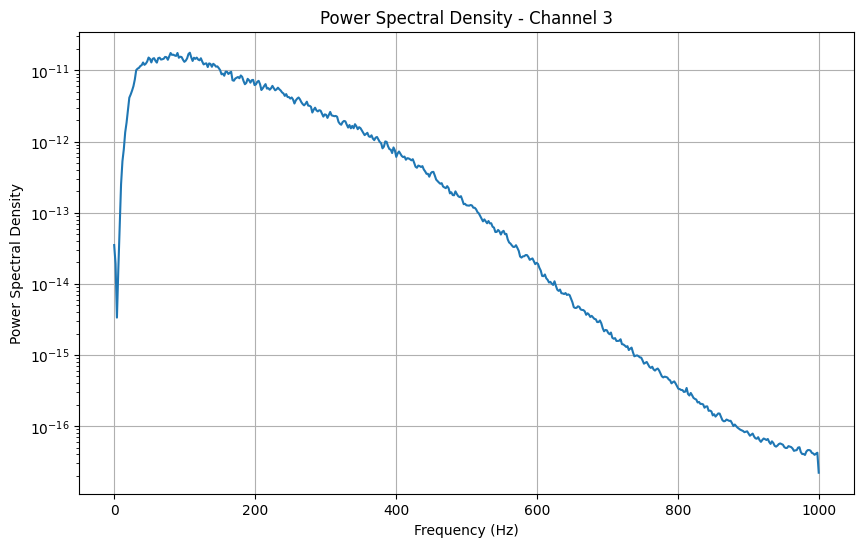

Channel 3: Maximum significant frequency = 486.33 Hz


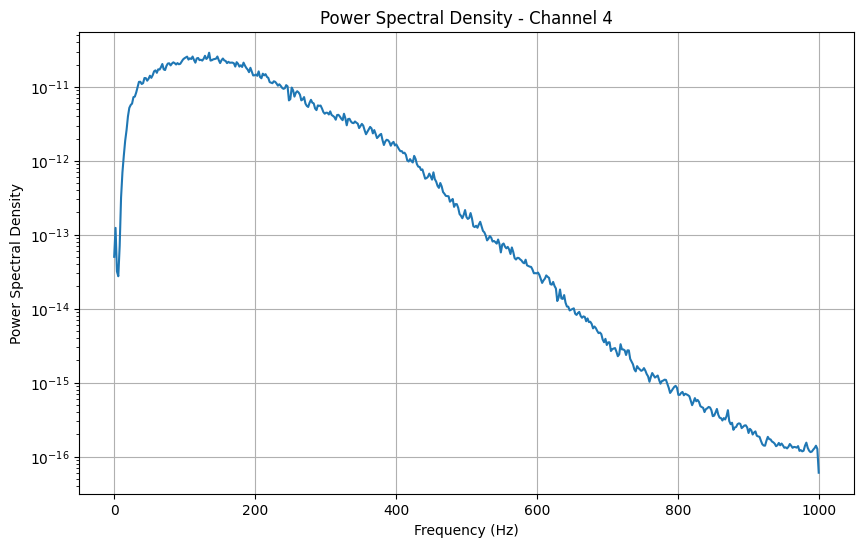

Channel 4: Maximum significant frequency = 480.47 Hz


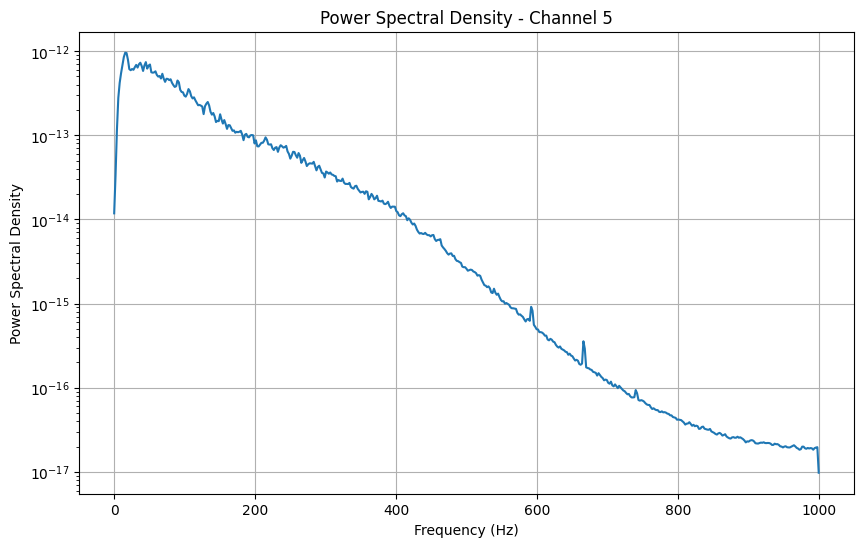

Channel 5: Maximum significant frequency = 419.92 Hz


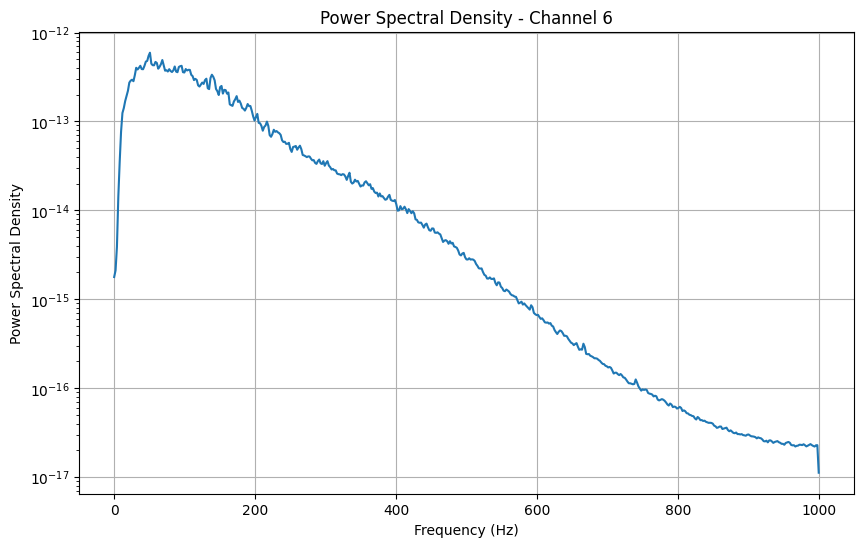

Channel 6: Maximum significant frequency = 453.12 Hz


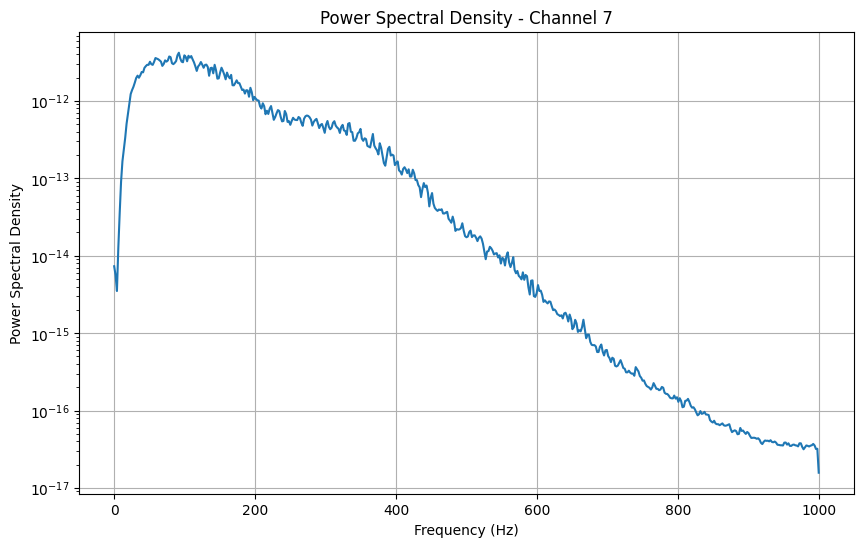

Channel 7: Maximum significant frequency = 453.12 Hz


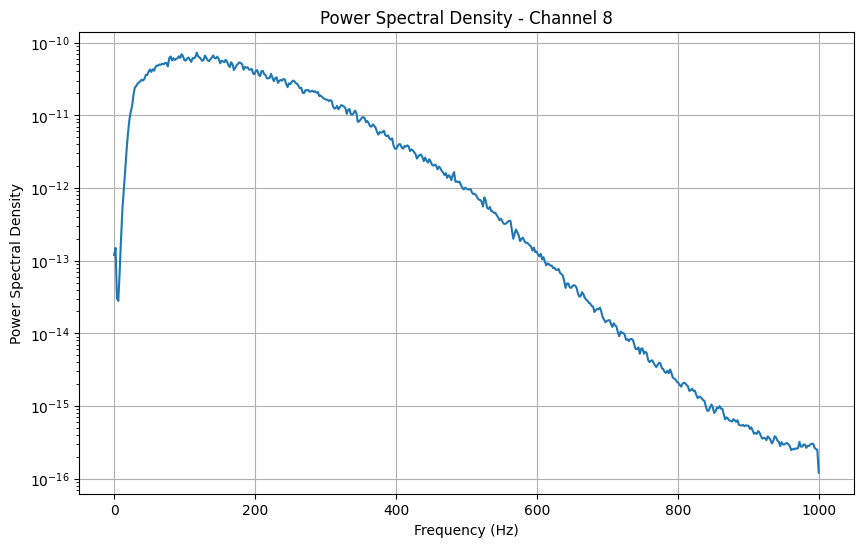

Channel 8: Maximum significant frequency = 525.39 Hz
Analyzing file: /content/drive/MyDrive/CORSO PROGETTO/DB2/S2_E1_A1.mat


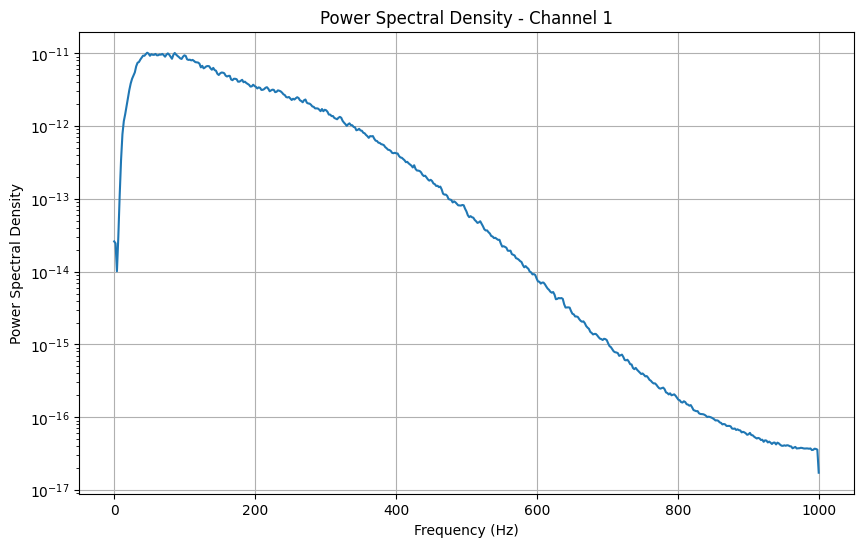

Channel 1: Maximum significant frequency = 472.66 Hz


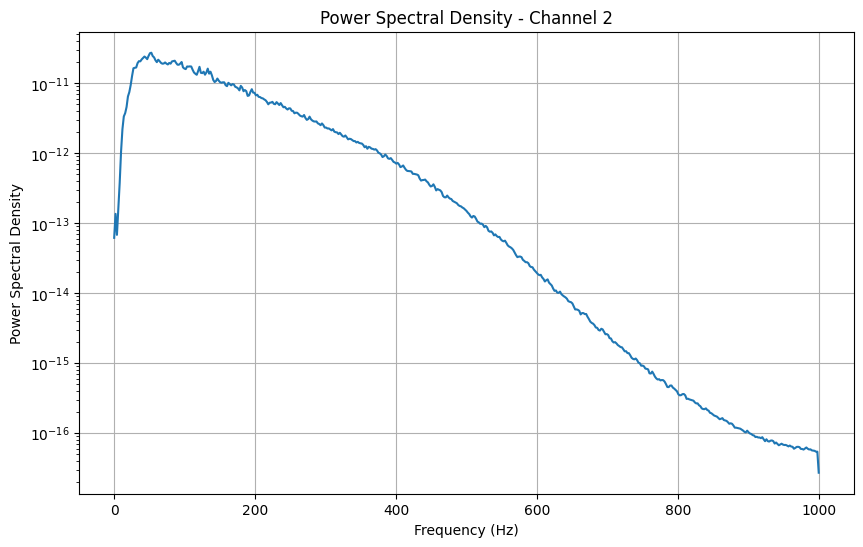

Channel 2: Maximum significant frequency = 464.84 Hz


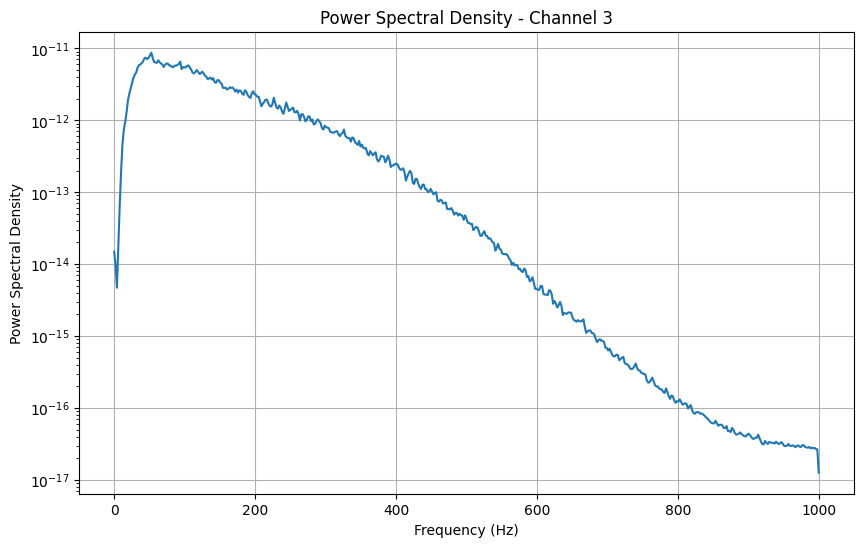

Channel 3: Maximum significant frequency = 457.03 Hz


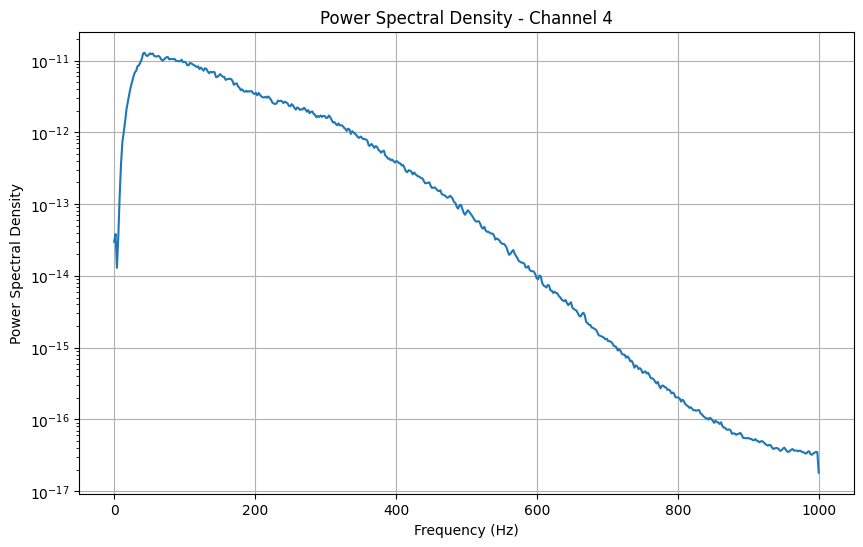

Channel 4: Maximum significant frequency = 476.56 Hz


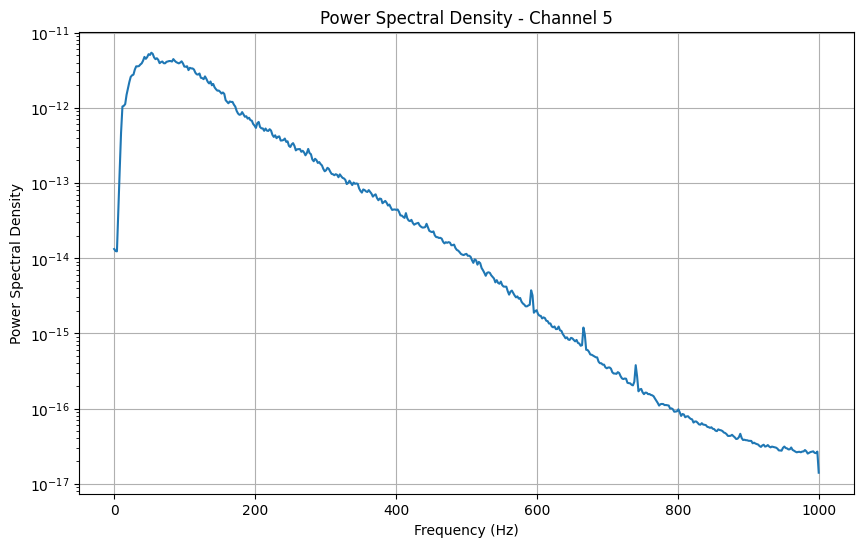

Channel 5: Maximum significant frequency = 386.72 Hz


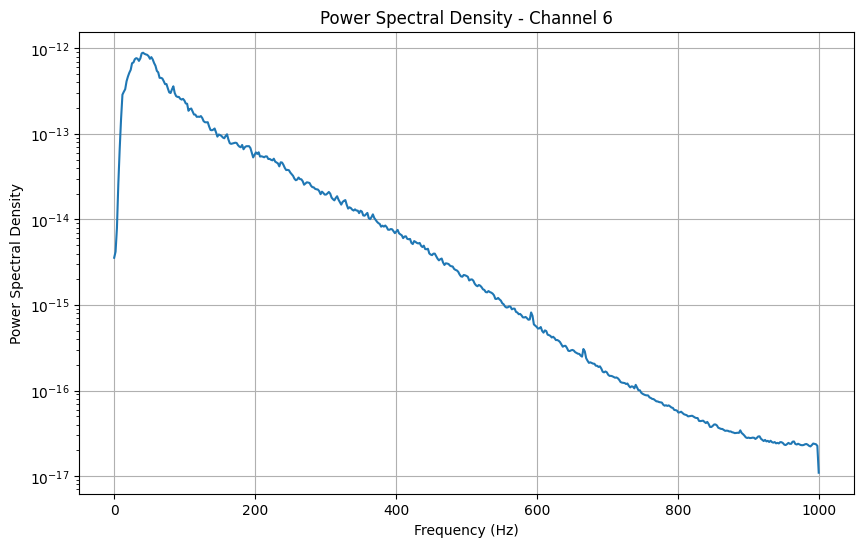

Channel 6: Maximum significant frequency = 375.00 Hz


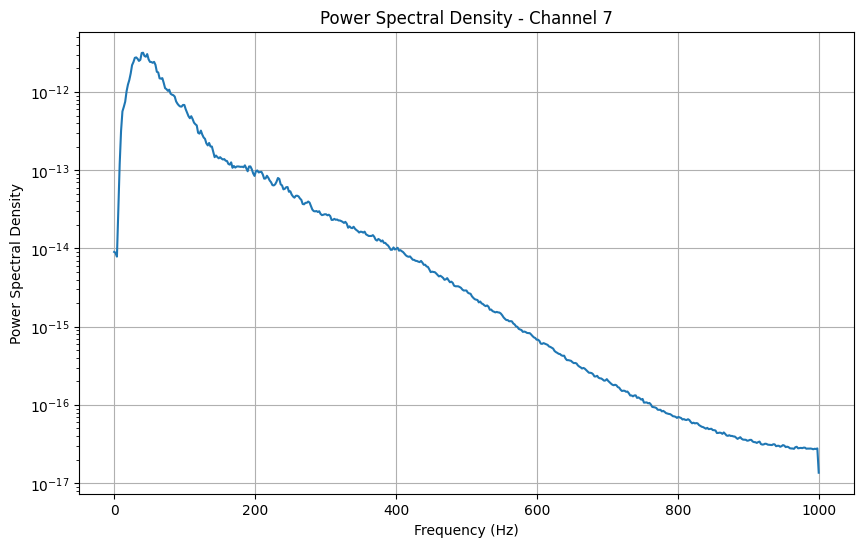

Channel 7: Maximum significant frequency = 279.30 Hz


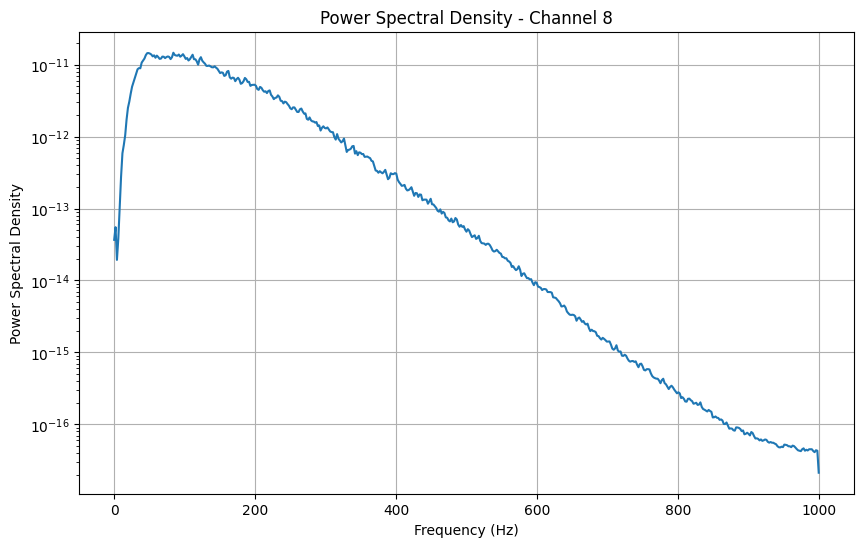

Channel 8: Maximum significant frequency = 435.55 Hz


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import loadmat
from scipy.signal import welch

# Define constants
DATA_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'
NUM_CHANNELS = 8
SAMPLING_RATE = 2000

def analyze_signal_frequency(file_path, sampling_rate, num_channels):
    data = loadmat(file_path)
    emg = data['emg'][:, :num_channels]

    for i in range(num_channels):
        signal = emg[:, i]

        freqs, psd = welch(signal, fs=sampling_rate, nperseg=1024)

        plt.figure(figsize=(10, 6))
        plt.semilogy(freqs, psd)
        plt.title(f"Power Spectral Density - Channel {i + 1}")
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Power Spectral Density")
        plt.grid()
        plt.show()

        significant_power_threshold = 0.01 * np.max(psd)
        significant_freqs = freqs[psd > significant_power_threshold]
        max_significant_freq = np.max(significant_freqs) if len(significant_freqs) > 0 else 0

        print(f"Channel {i + 1}: Maximum significant frequency = {max_significant_freq:.2f} Hz")

def process_all_signals(data_dir, sampling_rate, num_channels):
    mat_files = [os.path.join(data_dir, f) for f in os.listdir(data_dir) if f.endswith('.mat')]

    for mat_file in mat_files:
        print(f"Analyzing file: {mat_file}")
        analyze_signal_frequency(mat_file, sampling_rate, num_channels)

process_all_signals(DATA_DIR, SAMPLING_RATE, NUM_CHANNELS)

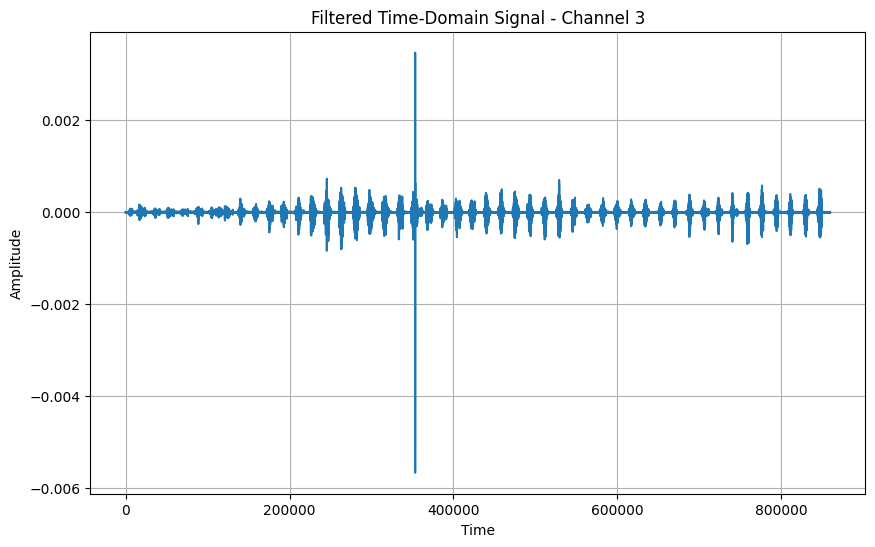

In [ ]:
from scipy.io import loadmat
from scipy.signal import butter, filtfilt
import numpy as np
import matplotlib.pyplot as plt

# Bandpass filter function
def bandpass_filter(signal, lowcut, highcut, fs, order=4):
    nyquist = fs / 2
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, signal, axis=0)

# Load the .mat file and extract the EMG signal
file_path = '/content/drive/MyDrive/CORSO PROGETTO/DB2/S1_E1_A1.mat'  # Replace with your actual .mat file path
data = loadmat(file_path)

# Ensure the variable names match your dataset structure
emg = data['emg']  # Extract the EMG signals
channel_to_analyze = 2  # Channel 3 (index starts at 0 in Python)

# Apply bandpass filter
filtered_signal = bandpass_filter(emg[:, channel_to_analyze], lowcut=20, highcut=500, fs=2000)

# Plot the filtered time-domain signal
plt.figure(figsize=(10, 6))
plt.plot(filtered_signal)
plt.title(f"Filtered Time-Domain Signal - Channel {channel_to_analyze + 1}")
plt.xlabel("Time")
plt.ylabel("Amplitude")
plt.grid()
plt.show()

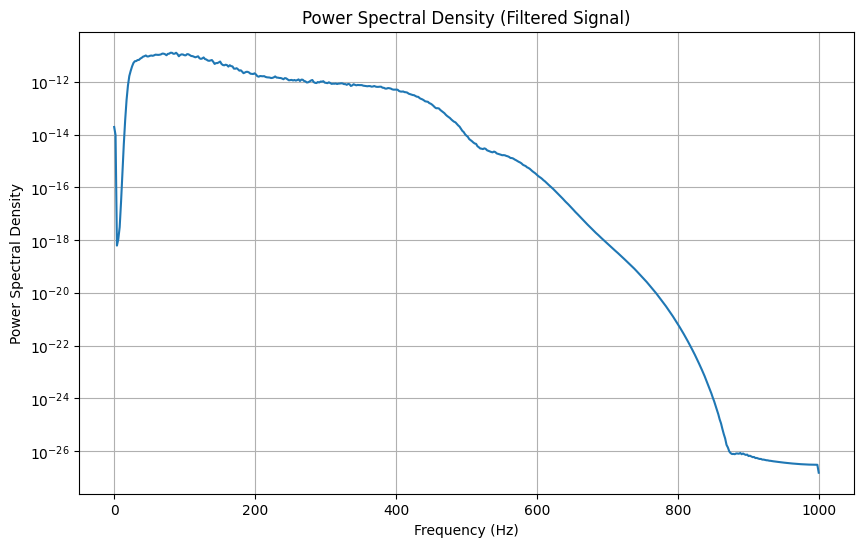

In [ ]:
from scipy.signal import welch

def analyze_signal_frequency(signal, sampling_rate):
    """
    Analyzes the frequency content of a signal using Welch's method.

    Args:
        signal (np.ndarray): Input signal (1D array).
        sampling_rate (int): Sampling rate in Hz.

    Returns:
        None
    """
    freqs, psd = welch(signal, fs=sampling_rate, nperseg=1024)
    plt.figure(figsize=(10, 6))
    plt.semilogy(freqs, psd)
    plt.title("Power Spectral Density (Filtered Signal)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power Spectral Density")
    plt.grid()
    plt.show()

# Analyze the filtered signal
analyze_signal_frequency(filtered_signal, sampling_rate=2000)


In [ ]:
import os
import numpy as np
from scipy.io import loadmat
from scipy.signal import welch

def max_frequency_per_file(data_dir, num_channels=8, sampling_rate=2000):

    def analyze_frequency(signal, sampling_rate):

        freqs, psd = welch(signal, fs=sampling_rate, nperseg=1024)
        significant_power_threshold = 0.01 * np.max(psd)  # 1% of max power
        significant_freqs = freqs[psd > significant_power_threshold]
        return np.max(significant_freqs) if len(significant_freqs) > 0 else 0

    max_freqs = {}
    mat_files = [f for f in os.listdir(data_dir) if f.endswith('.mat')]

    for mat_file in mat_files:
        file_path = os.path.join(data_dir, mat_file)
        data = loadmat(file_path)
        emg = data['emg'][:, :num_channels]

        max_channel_freqs = []
        for channel in range(num_channels):
            max_channel_freq = analyze_frequency(emg[:, channel], sampling_rate)
            max_channel_freqs.append(max_channel_freq)

        max_freqs[mat_file] = max(max_channel_freqs)  # Store the max frequency across channels for this file

    return max_freqs

# Example usage
data_dir = '/content/drive/MyDrive/CORSO PROGETTO/DB2'  # Replace with the path to your folder
max_frequencies = max_frequency_per_file(data_dir, num_channels=8, sampling_rate=2000)

# Print the results
for file, max_freq in max_frequencies.items():
    print(f"File: {file}, Maximum Frequency: {max_freq:.2f} Hz")


File: S1_E1_A1.mat, Maximum Frequency: 998.05 Hz
File: S3_E1_A1.mat, Maximum Frequency: 503.91 Hz
File: S5_E1_A1.mat, Maximum Frequency: 593.75 Hz
File: S4_E1_A1.mat, Maximum Frequency: 642.58 Hz
File: S7_E1_A1.mat, Maximum Frequency: 998.05 Hz
File: S6_E1_A1.mat, Maximum Frequency: 576.17 Hz
File: S10_E1_A1.mat, Maximum Frequency: 550.78 Hz
File: S8_E1_A1.mat, Maximum Frequency: 500.00 Hz
File: S9_E1_A1.mat, Maximum Frequency: 496.09 Hz
File: S12_E1_A1.mat, Maximum Frequency: 527.34 Hz
File: S11_E1_A1.mat, Maximum Frequency: 503.91 Hz
File: S14_E1_A1.mat, Maximum Frequency: 503.91 Hz
File: S13_E1_A1.mat, Maximum Frequency: 523.44 Hz
File: S16_E1_A1.mat, Maximum Frequency: 593.75 Hz
File: S15_E1_A1.mat, Maximum Frequency: 568.36 Hz
File: S17_E1_A1.mat, Maximum Frequency: 501.95 Hz
File: S18_E1_A1.mat, Maximum Frequency: 492.19 Hz
File: S20_E1_A1.mat, Maximum Frequency: 998.05 Hz
File: S22_E1_A1.mat, Maximum Frequency: 509.77 Hz
File: S19_E1_A1.mat, Maximum Frequency: 533.20 Hz
File: S2

# Segmentation, labeling, resampling, truncating

In [ ]:
# Parameters
NUM_SUBJECTS = 40
NUM_MOVEMENTS = 8
NUM_REPETITIONS = 6
NUM_CHANNELS = 8
ORIGINAL_SAMPLING_RATE = 2000
NEW_SAMPLING_RATE = 1000
SAMPLES_PER_SEGMENT = 8000

DATA_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'


In [ ]:
def center_and_rectify(segment):
    """
    After normalization, re-center and rectify the signal:
    1. Center: remove the mean again (though it's likely already zero-mean, this ensures any drift is removed).
    2. Rectify: take the absolute value of the centered signal.
    """
    segment_centered = segment - np.mean(segment, axis=0, keepdims=True)
    segment_rectified = np.abs(segment_centered)
    return segment_rectified

In [ ]:
def load_mat_file(file_path):
    data = sio.loadmat(file_path)
    emg = data['emg'][:, :NUM_CHANNELS]
    restimulus = data['restimulus'].flatten()
    rerepetition = data['rerepetition'].flatten()
    return emg, restimulus, rerepetition


In [ ]:
def resample_emg(emg_segment):
    resample_factor = NEW_SAMPLING_RATE / ORIGINAL_SAMPLING_RATE
    num_samples_original = emg_segment.shape[0]
    num_samples_new = int(num_samples_original * resample_factor)

    # Apply anti-aliasing filter
    nyquist_freq = ORIGINAL_SAMPLING_RATE / 2
    cutoff_freq = NEW_SAMPLING_RATE / 2 - 100  # Slightly below new Nyquist frequency
    b, a = signal.butter(N=4, Wn=cutoff_freq / nyquist_freq, btype='low')
    emg_filtered = signal.filtfilt(b, a, emg_segment, axis=0)

    # Resample the EMG data
    emg_resampled = signal.resample(emg_filtered, num_samples_new, axis=0)

    return emg_resampled

In [ ]:
def pad_or_truncate(segment):
    segment_length = segment.shape[0]

    if segment_length < SAMPLES_PER_SEGMENT:
        # Pad with zeros
        padding = np.zeros((SAMPLES_PER_SEGMENT - segment_length, NUM_CHANNELS))
        segment_padded = np.vstack((segment, padding))
    else:
        # Truncate
        segment_padded = segment[:SAMPLES_PER_SEGMENT, :]

    return segment_padded

In [ ]:
def normalize_segment(segment):
    """Normalize the segment using NumPy."""
    # Ensure segment is in float32
    segment = segment.astype(np.float32)

    # Mean offset removal
    mean = np.mean(segment, axis=0, keepdims=True)
    segment = segment - mean

    # Standard deviation
    std = np.std(segment, axis=0, keepdims=True)
    std[std == 0] = 1e-8  # Avoid division by zero

    # Normalization
    segment = segment / std

    return segment  # Already a NumPy array

    return segment.numpy()  # Convert to NumPy at the end

In [ ]:
def filter_emg(emg_data, sampling_rate):
    # Notch filter to remove power line interference
    notch_freq = 50
    quality_factor = 30.0  # Quality factor for notch filter
    b_notch, a_notch = signal.iirnotch(notch_freq, quality_factor, fs=sampling_rate)
    emg_notched = signal.filtfilt(b_notch, a_notch, emg_data, axis=0)

    lowcut = 20.0
    highcut = 450.0
    nyquist = 0.5 * sampling_rate
    low = lowcut / nyquist
    high = highcut / nyquist
    b_bandpass, a_bandpass = signal.butter(N=4, Wn=[low, high], btype='band')
    emg_filtered = signal.filtfilt(b_bandpass, a_bandpass, emg_notched, axis=0)

    return emg_filtered

In [ ]:
def rms_normalization(signal):
    rms = np.sqrt(np.mean(signal**2))
    return signal / rms if rms != 0 else signal

#Creating dataset and main

In [ ]:
def create_dataset():
    """Create the dataset by processing all MATLAB files."""
    all_segments = []
    all_labels = []

    # Get a sorted list of all MATLAB files
    mat_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith('.mat')])

    for filename in mat_files:
        file_path = os.path.join(DATA_DIR, filename)
        emg, restimulus, rerepetition = load_mat_file(file_path)

        # Extract subject and exercise numbers from filename
        parts = filename.replace('.mat', '').split('_')
        subject_id = int(parts[0][1:])
        exercise_id = int(parts[1][1:])

        unique_movements = np.unique(restimulus[restimulus > 0])

        for movement in unique_movements:
            movement_indices = np.where(restimulus == movement)[0]
            movement_rerepetition = rerepetition[movement_indices]
            unique_repetitions = np.unique(movement_rerepetition)

            for repetition in unique_repetitions:
                repetition_indices = np.where((restimulus == movement) & (rerepetition == repetition))[0]
                segment_emg = emg[repetition_indices, :]

                # Resample the EMG data
                segment_emg_resampled = resample_emg(segment_emg)

                # Pad or truncate to fixed length
                segment_emg_fixed = pad_or_truncate(segment_emg_resampled)

                # Normalize the segment
                segment_emg_normalized = normalize_segment(segment_emg_fixed)  # Convert to NumPy array

                # Append to list
                all_segments.append(segment_emg_normalized)
                all_labels.append(movement)  # Adjust label as needed

    return np.array(all_segments), np.array(all_labels)

In [ ]:
def main():
    # Create the dataset
    print("Creating dataset...")
    all_segments, all_labels = create_dataset()

    # Reshape segments to 2D array
    num_segments = all_segments.shape[0]
    all_segments_reshaped = all_segments.reshape(num_segments, -1)

    # Combine data and labels
    dataset = np.hstack((all_segments_reshaped, all_labels.reshape(-1, 1)))

    # Shuffle the dataset
    print("Shuffling dataset...")
    np.random.seed(42)
    np.random.shuffle(dataset)

    # Split features and labels
    X = dataset[:, :-1]
    y = dataset[:, -1]

    # Split into training, validation, and test sets
    print("Splitting dataset...")
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Save datasets
    save_datasets(X_train, y_train, X_val, y_val, X_test, y_test)


In [ ]:
def save_datasets(X_train, y_train, X_val, y_val, X_test, y_test):
    """Save the datasets into CSV files."""
    print("Saving datasets...")

    # Directory where you want to save the files
    SAVE_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'

    # Ensure the directory exists
    if not os.path.exists(SAVE_DIR):
        os.makedirs(SAVE_DIR)

    # Training set
    train_df = pd.DataFrame(X_train)
    train_df['label'] = y_train.astype(int)  # Ensure labels are integers
    train_df.to_csv(os.path.join(SAVE_DIR, 'training_set_1200.csv'), index=False)

    # Validation set
    val_df = pd.DataFrame(X_val)
    val_df['label'] = y_val.astype(int)
    val_df.to_csv(os.path.join(SAVE_DIR, 'validation_set_1200.csv'), index=False)

    # Test set
    test_df = pd.DataFrame(X_test)
    test_df['label'] = y_test.astype(int)
    test_df.to_csv(os.path.join(SAVE_DIR, 'test_set_1200.csv'), index=False)

    print("Datasets saved successfully in", SAVE_DIR)

In [ ]:
if __name__ == "__main__":
    main()

Creating dataset...
Shuffling dataset...
Splitting dataset...
Saving datasets...
Datasets saved successfully in /content/drive/MyDrive/CORSO PROGETTO/DB2


#Creating normalized dataset no pauses

In [ ]:
def save_datasets(X_train, y_train, X_val, y_val, X_test, y_test):
    """Save the datasets into CSV files."""
    print("Saving datasets...")

    # Directory where you want to save the files
    SAVE_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'

    # Ensure the directory exists
    if not os.path.exists(SAVE_DIR):
        os.makedirs(SAVE_DIR)

    # Training set
    train_df = pd.DataFrame(X_train)
    train_df['label'] = y_train.astype(int)  # Ensure labels are integers
    train_df.to_csv(os.path.join(SAVE_DIR, 'training_set_normalizedrms.csv'), index=False)

    # Validation set
    val_df = pd.DataFrame(X_val)
    val_df['label'] = y_val.astype(int)
    val_df.to_csv(os.path.join(SAVE_DIR, 'validation_set_normalizedrms.csv'), index=False)

    # Test set
    test_df = pd.DataFrame(X_test)
    test_df['label'] = y_test.astype(int)
    test_df.to_csv(os.path.join(SAVE_DIR, 'test_set_normalizedrms.csv'), index=False)

    print("Datasets saved successfully in", SAVE_DIR)

In [ ]:
import matplotlib.pyplot as plt

def create_dataset():
    """Create the dataset by processing all MATLAB files."""
    all_segments = []
    all_labels = []
    segment_lengths = []  # To store the lengths of all segments

    # Get a sorted list of all MATLAB files
    mat_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith('.mat')])

    for filename in mat_files:
        file_path = os.path.join(DATA_DIR, filename)
        emg, restimulus, rerepetition = load_mat_file(file_path)

        # Extract subject and exercise numbers from filename
        parts = filename.replace('.mat', '').split('_')
        subject_id = int(parts[0][1:])
        exercise_id = int(parts[1][1:])

        # Filter EMG data (bandpass + notch)
        emg_filtered = filter_emg(emg, ORIGINAL_SAMPLING_RATE)

        unique_movements = np.unique(restimulus[restimulus > 0])  # Exclude pauses (restimulus == 0)

        for movement in unique_movements:
            movement_indices = np.where(restimulus == movement)[0]
            movement_rerepetition = rerepetition[movement_indices]
            unique_repetitions = np.unique(movement_rerepetition)

            for repetition in unique_repetitions:
                repetition_indices = np.where((restimulus == movement) & (rerepetition == repetition))[0]
                segment_emg = emg_filtered[repetition_indices, :]

                # Resample the EMG data
                segment_emg_resampled = resample_emg(segment_emg)

                # Record the segment length
                segment_lengths.append(segment_emg_resampled.shape[0])

                # Normalize each channel independently
                normalized_channels = []
                for channel in range(segment_emg_resampled.shape[1]):
                    channel_data = segment_emg_resampled[:, channel]

                    # RMS normalization for the channel
                    channel_rms = np.sqrt(np.mean(channel_data ** 2))
                    if channel_rms != 0:
                        channel_data = channel_data / channel_rms

                    # Clipping to remove extreme values
                    channel_data = np.clip(channel_data, -8, 8)  # Adjust threshold as needed

                    normalized_channels.append(channel_data)

                # Stack normalized channels back into the segment
                segment_emg_normalized = np.column_stack(normalized_channels)

                # Rectify the segment
                segment_emg_rectified = center_and_rectify(segment_emg_normalized)

                # Append the rectified segment and its label
                all_segments.append(segment_emg_rectified)
                all_labels.append(movement)

    # Print statistics
    longest_segment = max(segment_lengths)
    shortest_segment = min(segment_lengths)
    print(f"Longest segment length: {longest_segment}")
    print(f"Shortest segment length: {shortest_segment}")

    # Plot longest and shortest segments
    longest_index = segment_lengths.index(longest_segment)
    shortest_index = segment_lengths.index(shortest_segment)

    plt.figure(figsize=(15, 6))
    for channel in range(all_segments[longest_index].shape[1]):
        plt.plot(all_segments[longest_index][:, channel], label=f'Channel {channel + 1}')
    plt.title("Longest Segment")
    plt.legend(loc='upper right')
    plt.show()

    plt.figure(figsize=(15, 6))
    for channel in range(all_segments[shortest_index].shape[1]):
        plt.plot(all_segments[shortest_index][:, channel], label=f'Channel {channel + 1}')
    plt.title("Shortest Segment")
    plt.legend(loc='upper right')
    plt.show()

    return all_segments, all_labels, longest_segment, shortest_segment


def main():
    # Create the dataset and preprocess the data
    print("Creating dataset...")
    all_segments, all_labels, longest_segment, shortest_segment = create_dataset()

    # Wait for user decision on padding or truncation
    print("\nPlease decide how to handle segment lengths before saving:")
    print("1. Pad all segments to match the longest length.")
    print("2. Truncate all segments to match the shortest length.")
    print("3. Keep original lengths and save variable-length data (if supported).")
    user_choice = input("Enter your choice (1, 2, or 3): ")

    if user_choice == "1":
        print("Padding segments...")
        padded_segments = []
        for segment in all_segments:
            padding = np.zeros((longest_segment - segment.shape[0], NUM_CHANNELS))
            padded_segment = np.vstack((segment, padding))
            padded_segments.append(padded_segment)
        all_segments = np.array(padded_segments)

    elif user_choice == "2":
        print("Truncating segments...")
        truncated_segments = []
        for segment in all_segments:
            truncated_segment = segment[:shortest_segment, :]
            truncated_segments.append(truncated_segment)
        all_segments = np.array(truncated_segments)

    elif user_choice == "3":
        print("Keeping original segment lengths. Note: Not all frameworks support variable-length input.")

    else:
        print("Invalid choice. Exiting without saving.")
        return

    # Combine data and labels
    all_segments_reshaped = [segment.flatten() for segment in all_segments]
    all_segments_reshaped = np.array(all_segments_reshaped)
    dataset = np.hstack((all_segments_reshaped, np.array(all_labels).reshape(-1, 1)))

    # Shuffle the dataset
    print("Shuffling dataset...")
    np.random.seed(42)
    np.random.shuffle(dataset)

    # Split features and labels
    X = dataset[:, :-1]
    y = dataset[:, -1]

    # Split into training, validation, and test sets
    print("Splitting dataset...")
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    # Save datasets
    save_datasets(X_train, y_train, X_val, y_val, X_test, y_test)


In [ ]:
def normalize_segment(segment):
    """
    Normalize the EMG data segment channel-wise.
    Each channel is normalized independently to have zero mean and unit standard deviation.
    """
    # Ensure segment is in float32
    segment = segment.astype(np.float32)

    # Channel-wise normalization
    for channel in range(segment.shape[1]):
        channel_data = segment[:, channel]
        mean = np.mean(channel_data)
        std = np.std(channel_data)
        std = std if std > 1e-8 else 1e-8  # Avoid division by zero
        segment[:, channel] = (channel_data - mean) / std

    return segment


Creating dataset...
Longest segment length: 7110
Shortest segment length: 1907


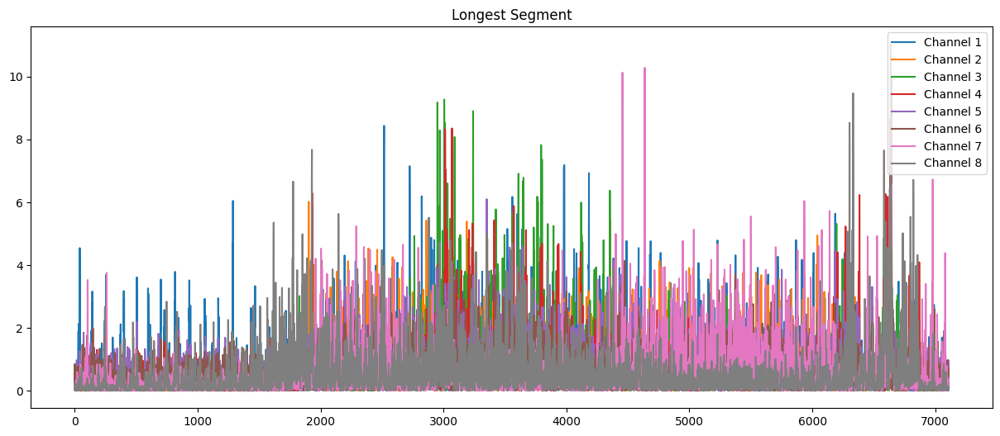

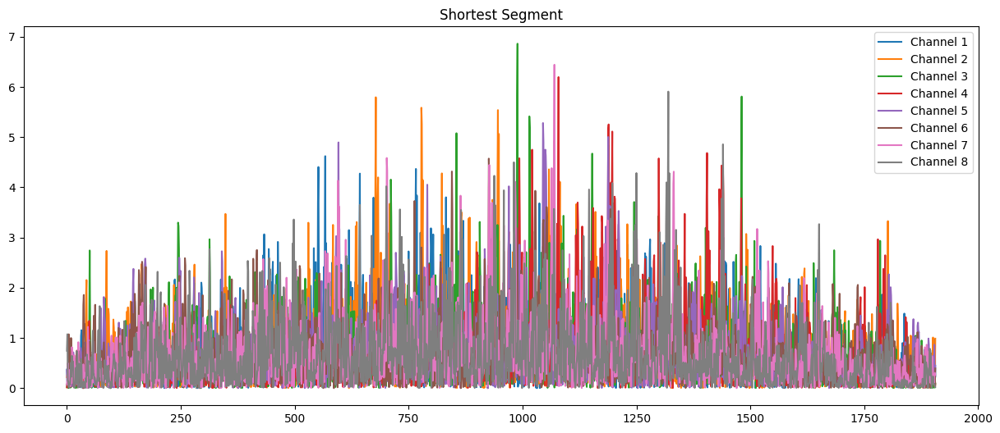


Please decide how to handle segment lengths before saving:
1. Pad all segments to match the longest length.
2. Truncate all segments to match the shortest length.
3. Keep original lengths and save variable-length data (if supported).


KeyboardInterrupt: Interrupted by user

In [ ]:
if __name__ == "__main__":
    main()

Creating dataset...
Longest segment length: 7110
Shortest segment length: 1907


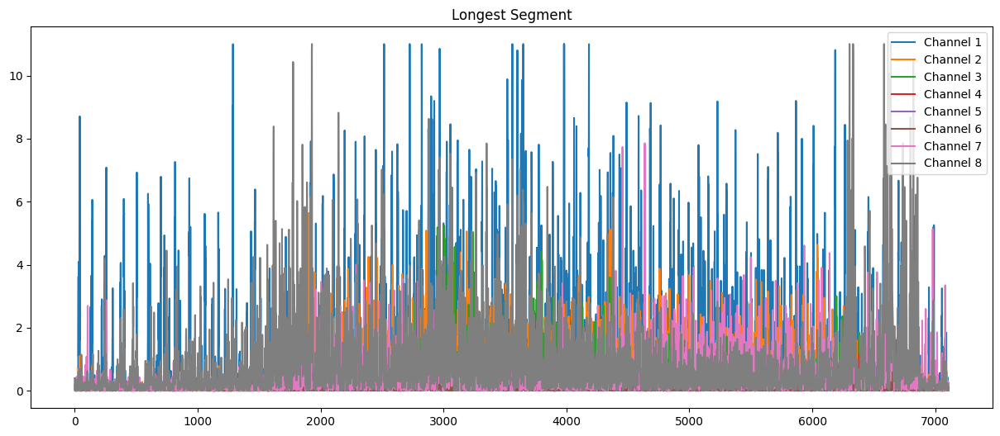

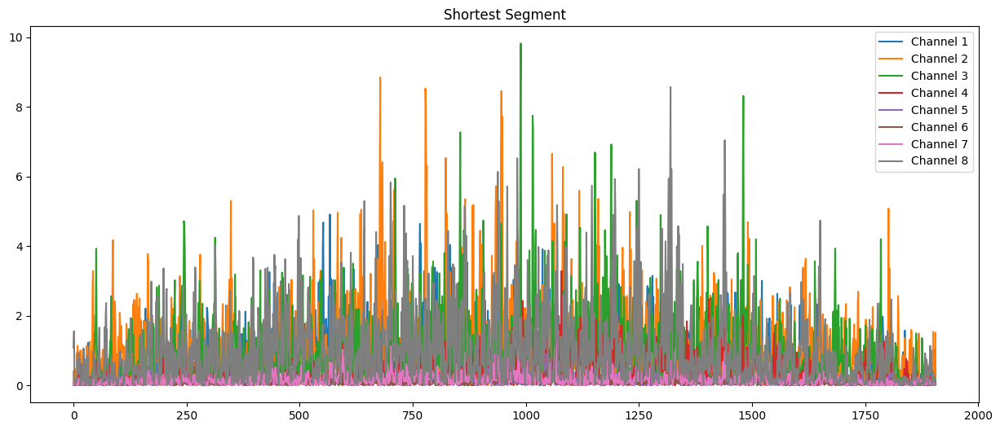


Please decide how to handle segment lengths before saving:
1. Pad all segments to match the longest length.
2. Truncate all segments to match the shortest length.
3. Keep original lengths and save variable-length data (if supported).
Enter your choice (1, 2, or 3): 1
Padding segments...
Shuffling dataset...
Splitting dataset...
Saving datasets...
Datasets saved successfully in /content/drive/MyDrive/CORSO PROGETTO/DB2


In [ ]:
if __name__ =='__main__':
  main()
#main with rms across all channels

In [ ]:
from sklearn.model_selection import train_test_split

DATA_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'
SAVE_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'

def create_dataset():
    """Create the dataset by processing all MATLAB files."""
    all_segments = []
    all_labels = []
    segment_lengths = []  # To store the lengths of all segments

    # Get a sorted list of all MATLAB files
    mat_files = sorted([f for f in os.listdir(DATA_DIR) if f.endswith('.mat')])

    for filename in mat_files:
        file_path = os.path.join(DATA_DIR, filename)
        emg, restimulus, rerepetition = load_mat_file(file_path)

        # Extract subject and exercise numbers from filename
        parts = filename.replace('.mat', '').split('_')
        subject_id = int(parts[0][1:])
        exercise_id = int(parts[1][1:])

        # Filter EMG data (bandpass + notch)
        emg_filtered = filter_emg(emg, ORIGINAL_SAMPLING_RATE)

        unique_movements = np.unique(restimulus[restimulus > 0])  # Exclude pauses (restimulus == 0)

        for movement in unique_movements:
            movement_indices = np.where(restimulus == movement)[0]
            movement_rerepetition = rerepetition[movement_indices]
            unique_reps = np.unique(movement_rerepetition)

            for repetition in unique_reps:
                repetition_indices = np.where((restimulus == movement) & (rerepetition == repetition))[0]
                segment_emg = emg_filtered[repetition_indices, :]

                # Resample the EMG data
                segment_emg_resampled = resample_emg(segment_emg)

                # Record the segment length
                segment_lengths.append(segment_emg_resampled.shape[0])

                # Normalize and rectify each channel
                normalized_channels = []
                for channel in range(segment_emg_resampled.shape[1]):
                    channel_data = segment_emg_resampled[:, channel]

                    # RMS normalization for the channel
                    channel_rms = np.sqrt(np.mean(channel_data ** 2))
                    if channel_rms != 0:
                        channel_data = channel_data / channel_rms

                    normalized_channels.append(channel_data)

                # Stack normalized channels back into the segment
                segment_emg_normalized = np.column_stack(normalized_channels)

                # Rectify the segment
                segment_emg_rectified = center_and_rectify(segment_emg_normalized)

                # Append the rectified segment and its label
                all_segments.append(segment_emg_rectified)
                all_labels.append(movement)

    # Print statistics on segment lengths
    longest_segment = max(segment_lengths)
    shortest_segment = min(segment_lengths)
    print(f"Longest segment length: {longest_segment}")
    print(f"Shortest segment length: {shortest_segment}")

    # Plot longest and shortest segments
    longest_index = segment_lengths.index(longest_segment)
    shortest_index = segment_lengths.index(shortest_segment)

    plt.figure(figsize=(15, 6))
    for channel in range(all_segments[longest_index].shape[1]):
        plt.plot(all_segments[longest_index][:, channel], label=f'Channel {channel + 1}')
    plt.title("Longest Segment")
    plt.legend(loc='upper right')
    plt.show()

    plt.figure(figsize=(15, 6))
    for channel in range(all_segments[shortest_index].shape[1]):
        plt.plot(all_segments[shortest_index][:, channel], label=f'Channel {channel + 1}')
    plt.title("Shortest Segment")
    plt.legend(loc='upper right')
    plt.show()

    return all_segments, all_labels, longest_segment, shortest_segment


def main():
    print("Creating dataset...")
    all_segments, all_labels, longest_segment, shortest_segment = create_dataset()

    # Ask the user how to handle variable segment lengths
    print("\nPlease decide how to handle segment lengths before saving:")
    print("1. Pad all segments to match the longest length.")
    print("2. Truncate all segments to match the shortest length.")
    print("3. Keep original lengths and save variable-length data (if supported).")
    user_choice = input("Enter your choice (1, 2, or 3): ")

    if user_choice == "1":
        print("Padding segments...")
        padded_segments = []
        for segment in all_segments:
            padding = np.zeros((longest_segment - segment.shape[0], NUM_CHANNELS))
            padded_segment = np.vstack((segment, padding))
            padded_segments.append(padded_segment)
        all_segments = padded_segments  # list of np arrays

    elif user_choice == "2":
        print("Truncating segments...")
        truncated_segments = []
        for segment in all_segments:
            truncated_segment = segment[:shortest_segment, :]
            truncated_segments.append(truncated_segment)
        all_segments = truncated_segments  # list of np arrays

    elif user_choice == "3":
        print("Keeping original segment lengths. Note: Not all frameworks support variable-length input.")
    else:
        print("Invalid choice. Exiting without saving.")
        return

    # Flatten each segment into 1D for saving
    all_segments_reshaped = [segment.flatten() for segment in all_segments]
    all_segments_reshaped = np.array(all_segments_reshaped)
    labels_array = np.array(all_labels).reshape(-1, 1)

    # Combine data and labels
    dataset = np.hstack((all_segments_reshaped, labels_array))

    print("Shuffling dataset...")
    np.random.seed(42)
    np.random.shuffle(dataset)

    # Split features and labels
    X = dataset[:, :-1]
    y = dataset[:, -1]

    # Ensure y is numeric (if not already)
    y = y.astype(int)

    # Maintain 70–15–15 ratio with class consistency (stratify)
    train_ratio = 0.70
    val_ratio = 0.15
    test_ratio = 0.15

    # First split: train vs (val+test)
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=(1 - train_ratio), random_state=42, stratify=y
    )

    # Second split: val vs test from temp
    # val_ratio / (val_ratio + test_ratio) = 0.15 / (0.15 + 0.15) = 0.5
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp,
        test_size=test_ratio / (val_ratio + test_ratio),
        random_state=42, stratify=y_temp
    )

    # Check final distributions
    print("\nTraining Set Class Distribution:")
    print(pd.Series(y_train).value_counts(normalize=True))

    print("\nValidation Set Class Distribution:")
    print(pd.Series(y_val).value_counts(normalize=True))

    print("\nTest Set Class Distribution:")
    print(pd.Series(y_test).value_counts(normalize=True))

    # Save the splits
    save_datasets(X_train, y_train, X_val, y_val, X_test, y_test)


def save_datasets(X_train, y_train, X_val, y_val, X_test, y_test):
    """Save the datasets into CSV files."""
    print("Saving datasets...")

    SAVE_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'
    if not os.path.exists(SAVE_DIR):
        os.makedirs(SAVE_DIR)

    # Training set
    train_df = pd.DataFrame(X_train)
    train_df['label'] = y_train
    train_df.to_csv(os.path.join(SAVE_DIR, 'training_set_rms.csv'), index=False)

    # Validation set
    val_df = pd.DataFrame(X_val)
    val_df['label'] = y_val
    val_df.to_csv(os.path.join(SAVE_DIR, 'validation_set_rms.csv'), index=False)

    # Test set
    test_df = pd.DataFrame(X_test)
    test_df['label'] = y_test
    test_df.to_csv(os.path.join(SAVE_DIR, 'test_set_rms.csv'), index=False)

    print("Datasets saved successfully in", SAVE_DIR)


Creating dataset...
Longest segment length: 7110
Shortest segment length: 1907


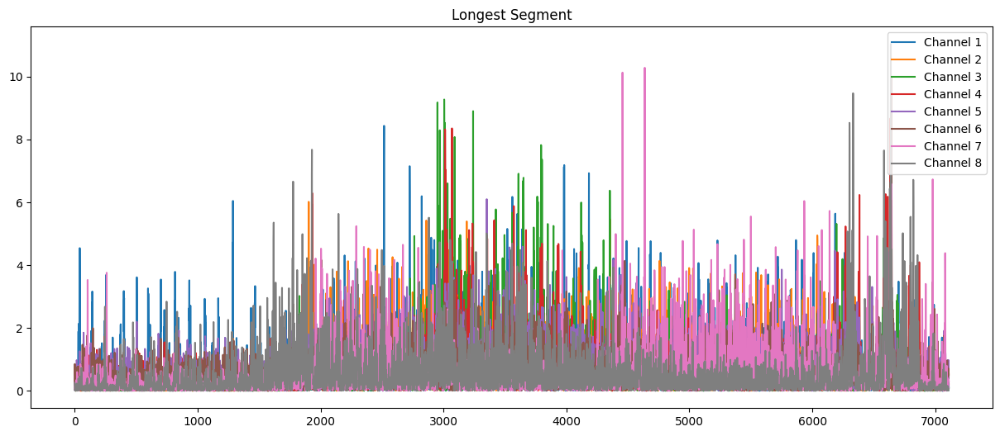

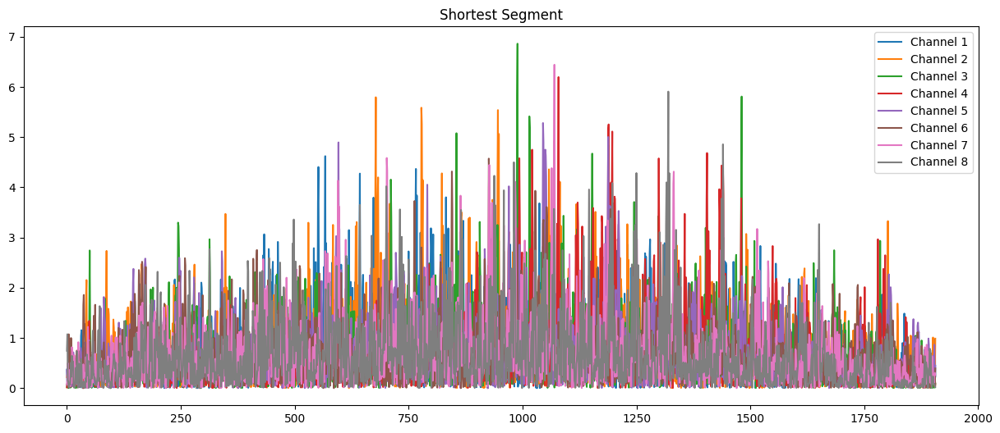


Please decide how to handle segment lengths before saving:
1. Pad all segments to match the longest length.
2. Truncate all segments to match the shortest length.
3. Keep original lengths and save variable-length data (if supported).
Enter your choice (1, 2, or 3): 1
Padding segments...
Shuffling dataset...

Training Set Class Distribution:
6    0.125093
4    0.125093
8    0.125093
2    0.125093
1    0.125093
3    0.125093
5    0.125093
7    0.124348
Name: proportion, dtype: float64

Validation Set Class Distribution:
1    0.125
8    0.125
4    0.125
6    0.125
7    0.125
3    0.125
5    0.125
2    0.125
Name: proportion, dtype: float64

Test Set Class Distribution:
7    0.128028
5    0.124567
8    0.124567
6    0.124567
1    0.124567
3    0.124567
2    0.124567
4    0.124567
Name: proportion, dtype: float64
Saving datasets...
Datasets saved successfully in /content/drive/MyDrive/CORSO PROGETTO/DB2


In [ ]:
if __name__ == "__main__":
    main()

# CSV checking

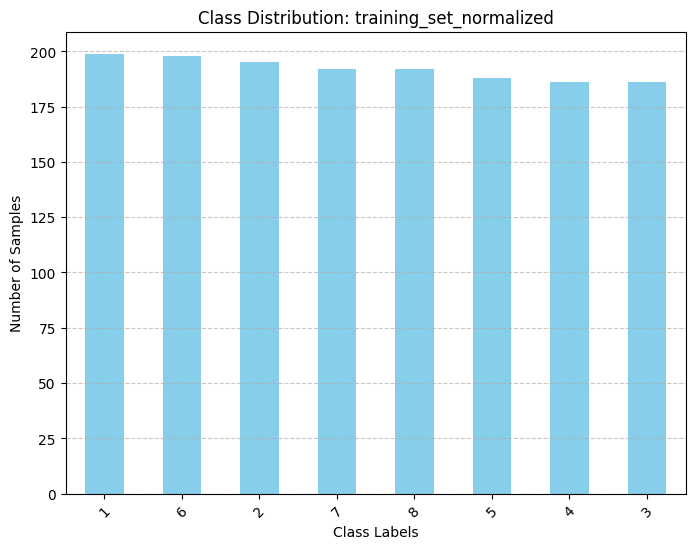

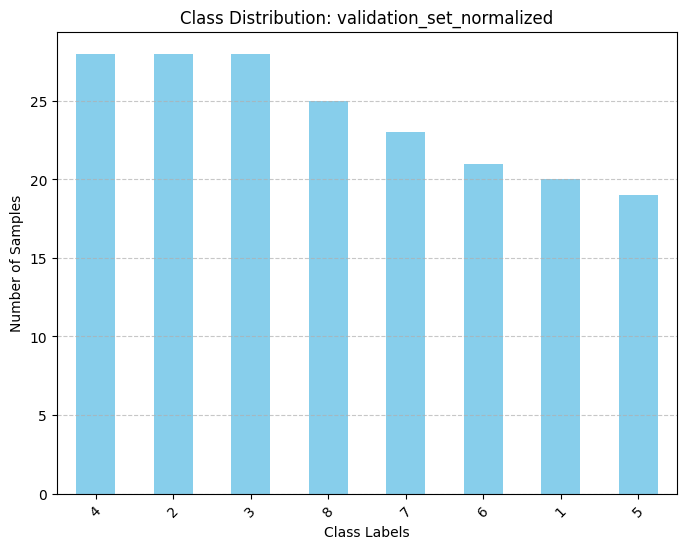

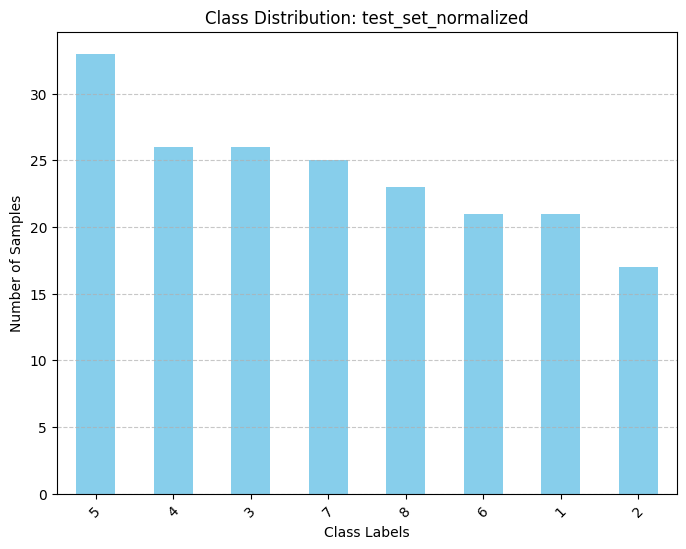

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Directory where the CSV files are stored
DATA_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'

# List of CSV files to analyze
csv_files = ['training_set_normalized.csv', 'validation_set_normalized.csv', 'test_set_normalized.csv']

# Function to check and plot class distribution
def plot_class_distribution(file_path, title):
    # Read the CSV file
    df = pd.read_csv(file_path)

    # Calculate class distribution
    label_counts = df['label'].value_counts()

    # Plot the distribution
    plt.figure(figsize=(8, 6))
    label_counts.plot(kind='bar', color='skyblue')
    plt.title(f'Class Distribution: {title}')
    plt.xlabel('Class Labels')
    plt.ylabel('Number of Samples')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# Loop through each file and plot its class distribution
for csv_file in csv_files:
    file_path = os.path.join(DATA_DIR, csv_file)
    title = csv_file.split('.')[0]  # Use file name (without extension) as the title
    plot_class_distribution(file_path, title)


In [ ]:
DATA_DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'

csv_files = ['training_set_normalized.csv', 'validation_set_normalized.csv', 'test_set_normalized.csv']

for csv_file in csv_files:
    file_path = os.path.join(DATA_DIR, csv_file)
    print(f"\nReading {csv_file}...")

    # Read the CSV
    df = pd.read_csv(file_path)

    # first few rows
    print("\nFirst 5 rows:")
    print(df.head())

    # Print summary
    print("\nDataFrame Info:")
    print(df.info())

    # Check for missing values
    print("\nMissing values in each column:")
    print(df.isnull().sum())

    # Check the distribution of labels
    print("\nLabel distribution:")
    print(df['label'].value_counts())



Reading training_set_normalized.csv...

First 5 rows:
          0         1         2         3         4         5         6  \
0  0.368849  0.198468  0.074145  0.004100  0.093610  0.121267  0.281093   
1  0.354500  0.084949  0.225390  0.028041  0.113487  0.648939  0.354234   
2  0.589769  0.030124  0.054570  0.041233  0.006790  0.000347  1.230581   
3  0.558218  0.119601  0.044651  0.073392  0.027946  0.039900  0.078616   
4  0.066429  0.047852  0.187209  0.304087  0.042127  0.069654  0.175663   

          7         8         9  ...  56871  56872  56873  56874  56875  \
0  0.095335  0.036351  0.136232  ...    0.0    0.0    0.0    0.0    0.0   
1  0.168229  0.116108  0.165249  ...    0.0    0.0    0.0    0.0    0.0   
2  0.124875  0.216292  0.058522  ...    0.0    0.0    0.0    0.0    0.0   
3  0.353193  0.293222  0.058627  ...    0.0    0.0    0.0    0.0    0.0   
4  0.008481  0.050414  0.016116  ...    0.0    0.0    0.0    0.0    0.0   

   56876  56877  56878  56879  label  
0   

In [ ]:
for csv_file in csv_files:
    file_path = os.path.join(DATA_DIR, csv_file)
    df = pd.read_csv(file_path)

    data_shape = df.drop('label', axis=1).shape
    labels_shape = df['label'].shape
    print(f"\n{csv_file} - Data shape: {data_shape}, Labels shape: {labels_shape}")

    # Check data types
    print("\nData types:")
    print(df.dtypes)


KeyboardInterrupt: 

In [ ]:
for csv_file in csv_files:
    file_path = os.path.join(DATA_DIR, csv_file)
    df = pd.read_csv(file_path)

    plt.figure(figsize=(8,6))
    df['label'].value_counts().sort_index().plot(kind='bar')
    plt.title(f"Label Distribution in {csv_file}")
    plt.xlabel("Label")
    plt.ylabel("Count")
    plt.show()

In [ ]:

for csv_file in csv_files:
    file_path = os.path.join(DATA_DIR, csv_file)
    df = pd.read_csv(file_path)
    features = df.drop('label', axis=1)

    print(f"\nStatistics for {csv_file}:")
    print("\nMean of features:")
    print(features.mean())
    print("\nStandard Deviation of features:")
    print(features.std())
    print("\nMinimum values of features:")
    print(features.min())
    print("\nMaximum values of features:")
    print(features.max())



Statistics for training_set_1200.csv:

Mean of features:
0        0.338404
1        0.291648
2        0.217918
3        0.326986
4        0.471430
           ...   
63995    0.012691
63996    0.011347
63997    0.011312
63998    0.015947
63999    0.008744
Length: 64000, dtype: float64

Standard Deviation of features:
0        0.397571
1        0.367856
2        0.273625
3        0.329129
4        0.422890
           ...   
63995    0.080331
63996    0.082251
63997    0.072135
63998    0.094278
63999    0.059719
Length: 64000, dtype: float64

Minimum values of features:
0        3.208543e-05
1        5.266265e-05
2        2.303322e-04
3        1.077911e-04
4        7.087827e-05
             ...     
63995    1.070059e-06
63996    3.315249e-06
63997    6.707792e-07
63998    3.293088e-06
63999    2.632062e-06
Length: 64000, dtype: float64

Maximum values of features:
0        4.135148
1        3.616951
2        2.695397
3        2.400311
4        3.097579
           ...   
63995    1.6490

In [ ]:
print(features.describe(percentiles=[0.01, 0.99]))

                0           1           2           3           4           5  \
count  192.000000  192.000000  192.000000  192.000000  192.000000  192.000000   
mean     0.346141    0.327777    0.224871    0.310602    0.522669    0.446602   
std      0.418060    0.402881    0.263816    0.303658    0.476662    0.407192   
min      0.001419    0.000105    0.000266    0.003472    0.001984    0.002292   
1%       0.006610    0.004778    0.001968    0.005865    0.009241    0.006305   
50%      0.207972    0.205451    0.138334    0.210853    0.390691    0.321591   
99%      1.839645    2.184281    1.157617    1.418178    2.245735    1.789711   
max      2.920823    2.536624    1.933824    2.010951    2.727667    2.071009   

                6           7           8           9  ...       63990  \
count  192.000000  192.000000  192.000000  192.000000  ...  192.000000   
mean     0.330569    0.266039    0.453010    0.445432  ...    0.016504   
std      0.348992    0.295979    0.722835    0.7

In [ ]:

train_df = pd.read_csv(os.path.join(DATA_DIR, 'training_set.csv'))

sample_index = 0  # Change this index to inspect different samples
sample = train_df.iloc[sample_index]
sample_features = sample.drop('label')
sample_label = sample['label']

print(f"\nSample index: {sample_index}")
print("Sample features:")
print(sample_features)
print("Sample label:")
print(sample_label)


In [ ]:
def visualize_segments_from_csv(file_path, num_channels=8, segment_indices=None):
    """
    Visualize EMG segments from a CSV file with all channels plotted on the same plot for each segment.

    Args:
        file_path (str): Path to the CSV file containing the preprocessed dataset.
        num_channels (int): Number of channels in the EMG data.
        segment_indices (list of int): Indices of the segments to visualize. If None, visualizes the first 5 segments.
    """
    # Load the CSV file
    print(f"Loading dataset from {file_path}...")
    df = pd.read_csv(file_path)

    # Separate features and labels
    features = df.drop('label', axis=1).values  # All columns except 'label'
    labels = df['label'].values  # 'label' column

    # Reshape features back into segments with shape (num_samples, num_channels)
    num_samples = features.shape[1] // num_channels
    segments = features.reshape(-1, num_samples, num_channels)

    # Default to the first 5 segments if no specific indices are provided
    if segment_indices is None:
        segment_indices = list(range(min(5, len(segments))))

    for idx in segment_indices:
        if idx >= len(segments):
            print(f"Segment index {idx} is out of range. Skipping.")
            continue

        segment = segments[idx]
        label = labels[idx]

        # Plot the segment
        plt.figure(figsize=(15, 6))
        for channel in range(num_channels):
            plt.plot(segment[:, channel], label=f'Channel {channel + 1}')
        plt.title(f"Segment {idx} (Label: {label}) - All Channels")
        plt.xlabel("Samples")
        plt.ylabel("Amplitude")
        plt.legend(loc='upper right')
        plt.tight_layout()
        plt.show()


Loading dataset from /content/drive/MyDrive/CORSO PROGETTO/DB2/training_set_normalized.csv...


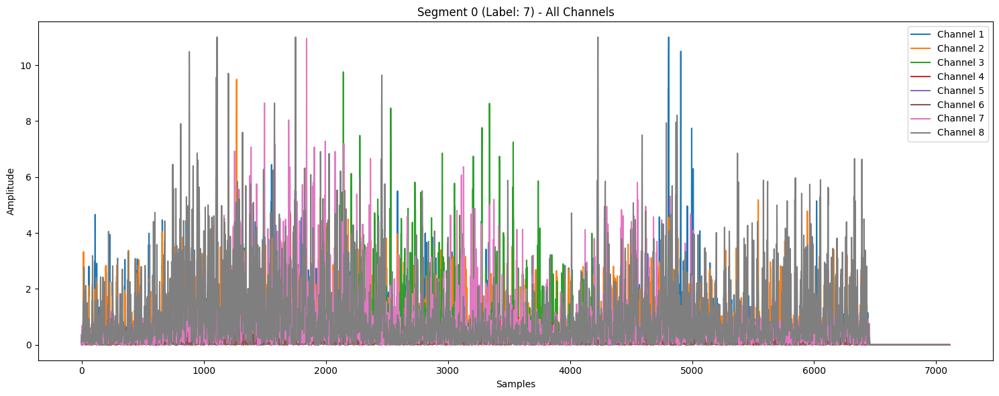

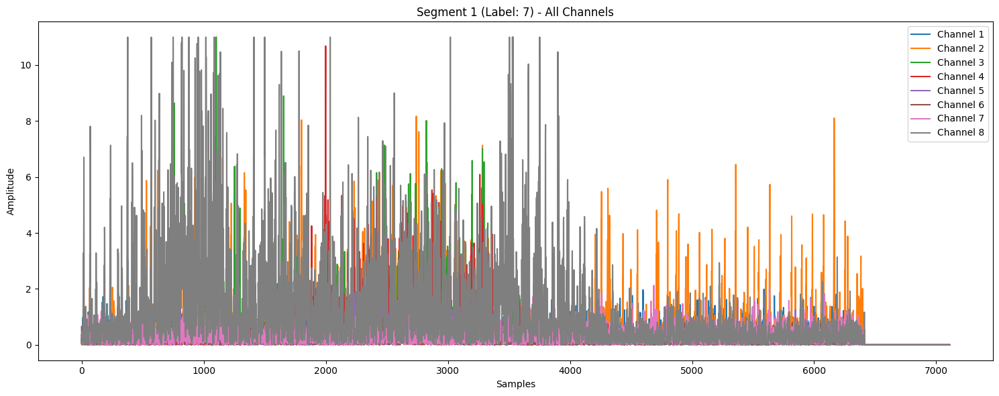

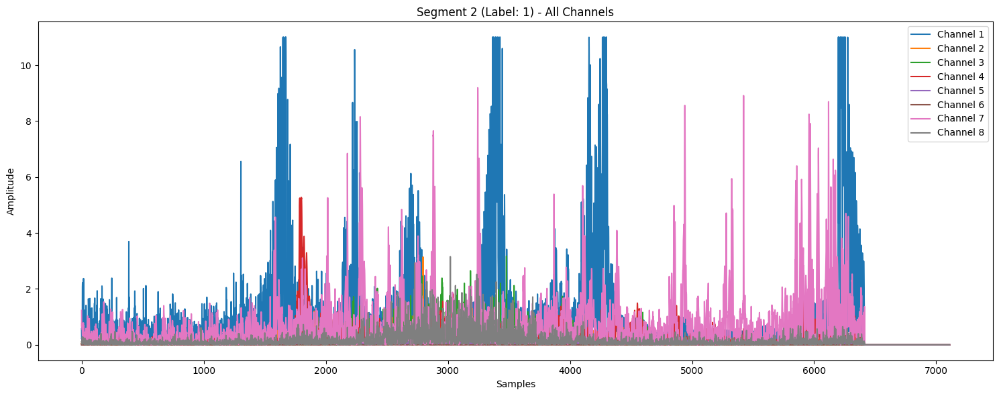

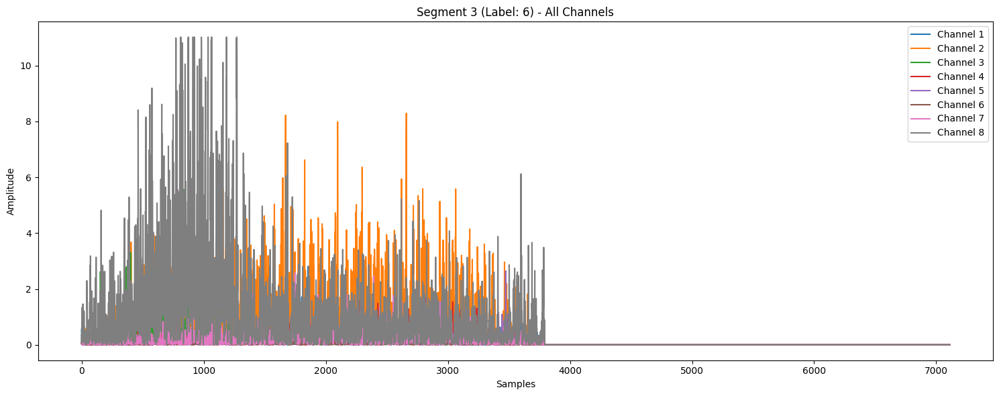

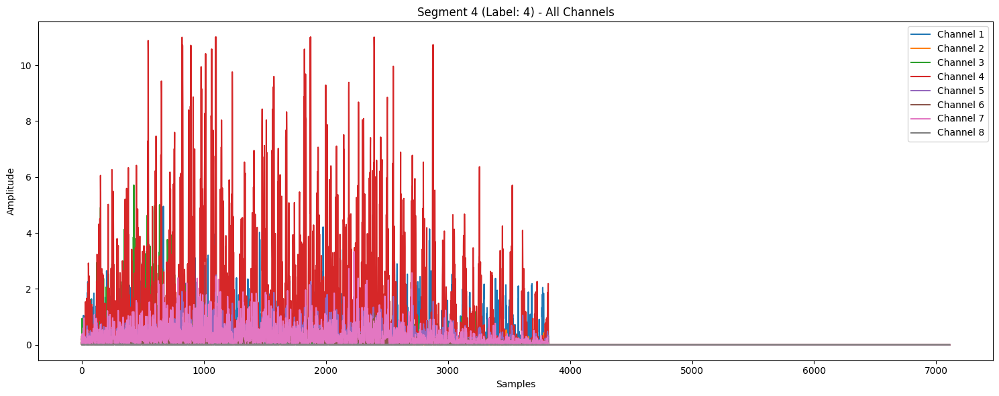

Loading dataset from /content/drive/MyDrive/CORSO PROGETTO/DB2/training_set_normalized.csv...


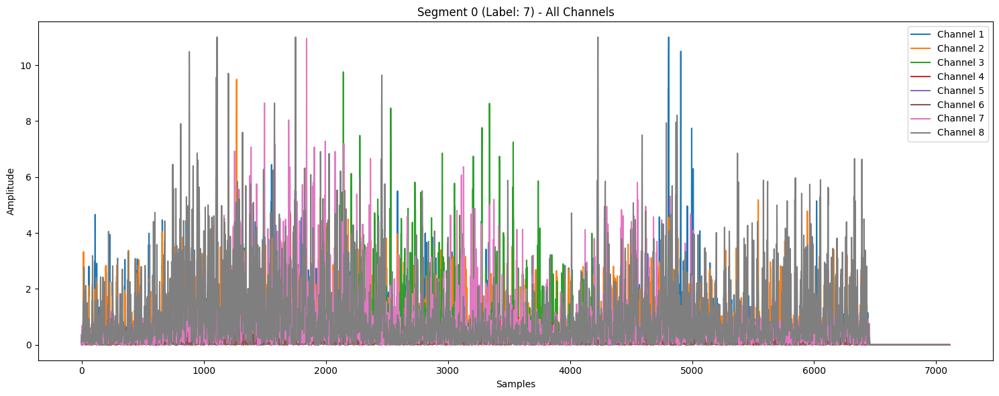

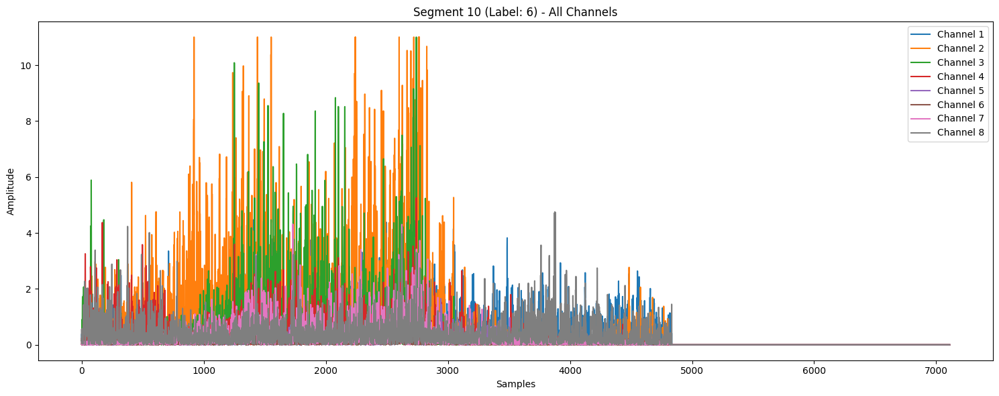

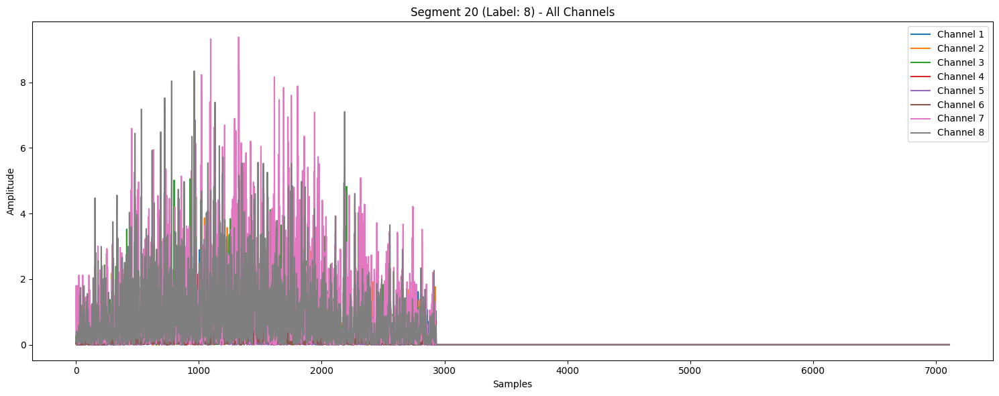

In [ ]:
training_dataset_path = '/content/drive/MyDrive/CORSO PROGETTO/DB2/training_set_normalized.csv'

# Visualize the first 5 segments
visualize_segments_from_csv(training_dataset_path, num_channels=8)

# Optionally, visualize specific segments (e.g., segment 0, 10, and 20)
specific_indices = [0, 10, 20]
visualize_segments_from_csv(training_dataset_path, num_channels=8, segment_indices=specific_indices)



# Dataloader

In [ ]:
import os
import pandas as pd
import numpy as np

def DatasetLoader(DIR, shuffle_train=True):
    # Construct full paths to the CSV files
    training_set_path = os.path.join(DIR, 'training_set_1200.csv')
    validation_set_path = os.path.join(DIR, 'validation_set_1200.csv')
    test_set_path = os.path.join(DIR, 'test_set_1200.csv')

    # Load datasets
    train_df = pd.read_csv(training_set_path)
    val_df = pd.read_csv(validation_set_path)
    test_df = pd.read_csv(test_set_path)

    # Separate features and labels
    train_data = train_df.drop('label', axis=1).values
    train_labels = train_df['label'].values.astype(int)

    val_data = val_df.drop('label', axis=1).values
    val_labels = val_df['label'].values.astype(int)

    test_data = test_df.drop('label', axis=1).values
    test_labels = test_df['label'].values.astype(int)

    # Shuffle training data if requested
    if shuffle_train:
        indices = np.arange(len(train_data))
        np.random.shuffle(indices)
        train_data = train_data[indices]
        train_labels = train_labels[indices]

    return train_data, train_labels, val_data, val_labels, test_data, test_labels


#Model GRU

In [ ]:
Model = 'Gated_Recurrent_Unit'
DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'
SAVE = 'Saved_Files/' + Model + '/'
if not os.path.exists(SAVE):
    os.makedirs(SAVE)

# Load the dataset
train_data, train_labels, val_data, val_labels, test_data, test_labels = DatasetLoader(DIR=DIR)

train_labels = train_labels - 1
test_labels = test_labels - 1
val_labels = val_labels - 1

# Step 2: Convert labels to one-hot encoding with 8 classes
num_classes = 8
train_labels_onehot = tf.keras.utils.to_categorical(train_labels, num_classes=num_classes)
test_labels_onehot = tf.keras.utils.to_categorical(test_labels, num_classes=num_classes)
val_labels_onehot = tf.keras.utils.to_categorical(val_labels, num_classes=num_classes)

print("Adjusted train labels (one-hot):", train_labels_onehot)
print("Adjusted test labels (one-hot):", test_labels_onehot)
print("Adjusted train labels (one-hot):", val_labels_onehot)

Adjusted train labels (one-hot): [[0. 0. 0. ... 0. 0. 1.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 1. 0.]]
Adjusted test labels (one-hot): [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
Adjusted train labels (one-hot): [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
print("Shape of train_labels_onehot:", train_labels_onehot.shape)
print("Shape of test_labels_onehot:", test_labels_onehot.shape)
print("Shape of val_labels_onehot:", val_labels_onehot.shape)

Shape of train_labels_onehot: (3072, 8)
Shape of test_labels_onehot: (384, 8)
Shape of val_labels_onehot: (384, 8)


In [ ]:
# Model hyperparameters
n_input = 64
max_time = 64
gru_size_1 = 32
gru_size_2 = 16
n_class = 8
n_hidden = 32
num_epoch = 50
keep_rate = 0.5
batch_size = 16
learning_rate = 1e-3
lr_decay_epoch = 50
lr_decay = 0.50
gru_size = 128

inputs = tf.keras.Input(shape=(36000,))
reshaped_inputs = tf.keras.layers.Reshape((8000, 8))(inputs)  # Reshape to (4500, 8) for 4500 time steps and 8 channels

# Proceed with GRU and other layers
gru_output = tf.keras.layers.GRU(units=gru_size, return_sequences=True)(reshaped_inputs)
'''

gru_output_1 = tf.keras.layers.GRU(units=gru_size_1, return_sequences=True,kernel_regularizer=tf.keras.regularizers.L2(1e-3))(reshaped_inputs)
gru_output_1 = tf.keras.layers.BatchNormalization()(gru_output_1)

gru_output_2 = tf.keras.layers.GRU(units=gru_size_2, return_sequences=True,kernel_regularizer=tf.keras.regularizers.L2(1e-3))(gru_output_1)
gru_output_2 = tf.keras.layers.BatchNormalization()(gru_output_2)
'''
# Implement a simple attention mechanism
attention_vector = tf.keras.layers.Dense(1, activation='tanh')(gru_output_2)
attention_vector = tf.keras.layers.Flatten()(attention_vector)
attention_weights = tf.keras.layers.Activation('softmax')(attention_vector)
context_vector = tf.keras.layers.Dot(axes=1)([gru_output_2, attention_weights])

# Fully connected layers
fc1 = tf.keras.layers.Dense(n_hidden, activation='relu')(context_vector)
fc1 = tf.keras.layers.Dropout(1 - keep_rate)(fc1)
outputs = tf.keras.layers.Dense(n_class, activation='softmax')(fc1)

# Create the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Set up learning rate scheduler
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: learning_rate * (lr_decay ** (epoch // lr_decay_epoch))
)

In [ ]:
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 36000)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 4500, 8)        │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru (GRU)                 │ (None, 4500, 32)       │          4,032 │ reshape[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 4500, 32)       │            128 │ gru[0][0]              │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru_1 (GRU)               │ (None, 4500, 16)       │          2,400 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 4500, 16)       │             64 │ gru_1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_12 (Dense)          │ (None, 4500, 1)        │             17 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_4 (Flatten)       │ (None, 4500)           │              0 │ dense_12[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_4 (Activation) │ (None, 4500)           │              0 │ flatten_4[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dot_4 (Dot)               │ (None, 16)             │              0 │ batch_normalization_1… │
│                           │                        │                │ activation_4[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_13 (Dense)          │ (None, 32)             │            544 │ dot_4[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_4 (Dropout)       │ (None, 32)             │              0 │ dense_13[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_4             │ (None, 36000)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_14 (Dense)          │ (None, 8)              │            264 │ dropout_4[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 7,449 (29.10 KB)

 Trainable params: 7,353 (28.72 KB)

 Non-trainable params: 96 (384.00 B)

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=10,
    verbose=1,
    restore_best_weights=True
)

# ModelCheckpoint callback
checkpointer = tf.keras.callbacks.ModelCheckpoint(
    filepath='fullsegwith_32units_16batch.keras',  # adjust file path as needed
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min'
)

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=10,
    verbose=1,
    restore_best_weights=True
)

# ModelCheckpoint callback
checkpointer = tf.keras.callbacks.ModelCheckpoint(
    filepath='fullsegwith_64_32_step.keras',  # adjust file path as needed
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min'
)

In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=10,
    verbose=1,
    restore_best_weights=True
)

# ModelCheckpoint callback
checkpointer = tf.keras.callbacks.ModelCheckpoint(
    filepath='fullsegwith_32units_16batch.keras',  # adjust file path as needed
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min'
)

In [ ]:
# Train the model with callbacks
history = model.fit(
    train_data, train_labels_onehot,
    epochs=num_epoch,
    batch_size=batch_size,
    validation_data=(val_data, val_labels_onehot),
    callbacks=[lr_schedule, earlystop, checkpointer]
)

Epoch 1/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.1189 - loss: 2.0792
Epoch 1: val_loss improved from inf to 2.07509, saving model to best_model_again.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - accuracy: 0.1191 - loss: 2.0792 - val_accuracy: 0.1488 - val_loss: 2.0751 - learning_rate: 0.0010
Epoch 2/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.1414 - loss: 2.0758
Epoch 2: val_loss improved from 2.07509 to 2.06623, saving model to best_model_again.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 5s 121ms/step - accuracy: 0.1415 - loss: 2.0758 - val_accuracy: 0.2262 - val_loss: 2.0662 - learning_rate: 0.0010
Epoch 3/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - accuracy: 0.1917 - loss: 2.0583
Epoch 3: val_loss improved from 2.06623 to 2.02503, saving model to best_model_again.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - accuracy: 0.1916 - loss: 2.0581 - val_accuracy: 0.1607 - val_loss: 2.0250 - learning_rate: 0.0010
Epoch 4/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms

In [ ]:
def step_decay(epoch, lr):
    if epoch == 35:
        return lr * 0.5
    return lr
lr_scheduler = tf.keras.callbacks.LearningRateScheduler(step_decay, verbose=1)

In [ ]:
# Train the model with callbacks
history = model.fit(
    train_data, train_labels_onehot,
    epochs=num_epoch,
    batch_size=batch_size,
    validation_data=(val_data, val_labels_onehot),
    callbacks=[lr_scheduler, earlystop, checkpointer]
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - accuracy: 0.1450 - loss: 2.0790
Epoch 1: val_loss improved from inf to 2.07760, saving model to fullsegwith_lr_half_after35_real.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - accuracy: 0.1453 - loss: 2.0790 - val_accuracy: 0.1607 - val_loss: 2.0776 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.1496 - loss: 2.0704
Epoch 2: val_loss improved from 2.07760 to 2.06385, saving model to fullsegwith_lr_half_after35_real.keras
42/42 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.1497 - loss: 2.0704 - val_accuracy: 0.1250 - val_loss: 2.0639 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/100
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.1994 - loss: 2.0511
Epoch 3

KeyboardInterrupt: 

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',  # Monitor validation loss
    factor=0.6,          # Reduce the learning rate by multiplying by 0.2
    patience=3,          # Number of epochs with no improvement before reducing LR
    min_lr=1e-5,         # Lower bound on the learning rate
    verbose=1            # Print messages when the learning rate changes
)

In [ ]:
# Train the model with callbacks
history = model.fit(
    train_data, train_labels_onehot,
    epochs=num_epoch,
    batch_size=batch_size,
    validation_data=(val_data, val_labels_onehot),
    shuffle= True,
    callbacks=[reduce_lr, earlystop, checkpointer]
)

NameError: name 'model' is not defined

# Model with stepwise learning rate

In [ ]:
Model = 'Gated_Recurrent_Unit'
DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'
SAVE = 'Saved_Files/' + Model + '/'
if not os.path.exists(SAVE):
    os.makedirs(SAVE)

# Load the dataset
train_data, train_labels, val_data, val_labels, test_data, test_labels = DatasetLoader(DIR=DIR)

train_labels = train_labels - 1
test_labels = test_labels - 1
val_labels = val_labels - 1

# Step 2: Convert labels to one-hot encoding with 8 classes
num_classes = 8
train_labels_onehot = tf.keras.utils.to_categorical(train_labels, num_classes=num_classes)
test_labels_onehot = tf.keras.utils.to_categorical(test_labels, num_classes=num_classes)
val_labels_onehot = tf.keras.utils.to_categorical(val_labels, num_classes=num_classes)

print("Adjusted train labels (one-hot):", train_labels_onehot)
print("Adjusted test labels (one-hot):", test_labels_onehot)
print("Adjusted train labels (one-hot):", val_labels_onehot)

Adjusted train labels (one-hot): [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
Adjusted test labels (one-hot): [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
Adjusted train labels (one-hot): [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 ...
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
n_input = 64
gru_size_0 = 128
gru_size_1 = 64
gru_size_2 = 32
n_class = 8
n_hidden = 64
num_epoch = 100
keep_rate = 0.75
batch_size = 32
learning_rate = 1e-2
lr_decay_epoch = 1000
lr_decay = 0.50

# Input Layer
inputs = tf.keras.Input(shape=(64000,))
reshaped_inputs = tf.keras.layers.Reshape((8000, 8))(inputs)  # Reshape to (4500, 8) for 4500 time steps and 8 channels

gru_output_0 = tf.keras.layers.GRU(units=gru_size_0, return_sequences=True, dropout = 0.2,
                                   kernel_regularizer=tf.keras.regularizers.L2(1e-4))(reshaped_inputs)
gru_output_0 = tf.keras.layers.BatchNormalization()(gru_output_0)
'''
gru_output_1 = tf.keras.layers.GRU(units=gru_size_1, return_sequences=True,
                                   kernel_regularizer=tf.keras.regularizers.L2(1e-3))(gru_output_0)
gru_output_1 = tf.keras.layers.BatchNormalization()(gru_output_1)

gru_output_2 = tf.keras.layers.GRU(units=gru_size_2, return_sequences=True,
                                   kernel_regularizer=tf.keras.regularizers.L2(1e-3))(reshaped_inputs)
gru_output_2 = tf.keras.layers.BatchNormalization()(gru_output_2)
'''
# Dense layer with softmax activation after batch normalization
dense_softmax_after_bn = tf.keras.layers.Dense(n_class, activation='softmax')(gru_output_0)

# Implement attention mechanism
attention_vector = tf.keras.layers.Dense(1, activation='tanh')(gru_output_0)
attention_vector = tf.keras.layers.Flatten()(attention_vector)
attention_weights = tf.keras.layers.Activation('softmax')(attention_vector)
context_vector = tf.keras.layers.Dot(axes=1)([gru_output_0, attention_weights])

# Fully connected layers
fc1 = tf.keras.layers.Dense(n_hidden, activation='relu')(context_vector)
fc1 = tf.keras.layers.Dropout(1 - keep_rate)(fc1)
outputs = tf.keras.layers.Dense(n_class, activation='softmax')(fc1)

# Create the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])



# Summary of the model
model.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7             │ (None, 64000)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape_7 (Reshape)       │ (None, 8000, 8)        │              0 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru_7 (GRU)               │ (None, 8000, 128)      │         52,992 │ reshape_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_7     │ (None, 8000, 128)      │            512 │ gru_7[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_27 (Dense)          │ (None, 8000, 1)        │            129 │ batch_normalization_7… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_7 (Flatten)       │ (None, 8000)           │              0 │ dense_27[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_7 (Activation) │ (None, 8000)           │              0 │ flatten_7[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dot_7 (Dot)               │ (None, 128)            │              0 │ batch_normalization_7… │
│                           │                        │                │ activation_7[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_28 (Dense)          │ (None, 64)             │          8,256 │ dot_7[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_6 (Dropout)       │ (None, 64)             │              0 │ dense_28[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_29 (Dense)          │ (None, 8)              │            520 │ dropout_6[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 62,409 (243.79 KB)

 Trainable params: 62,153 (242.79 KB)

 Non-trainable params: 256 (1.00 KB)

In [ ]:
def stepwise_learning_rate(epoch, lr):
    if epoch < 30:
        return 0.01  # Learning rate for epochs 0-29
    elif epoch < 50:
        return 0.005  # Learning rate for epochs 30-59
    else:
        return 0.001  # Learning rate for epochs 60 and beyond

# Create the LearningRateScheduler callback
stepwise_lr_scheduler = tf.keras.callbacks.LearningRateScheduler(stepwise_learning_rate, verbose=1)


In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=10,
    verbose=1,
    restore_best_weights=True
)

# ModelCheckpoint callback
checkpointer = tf.keras.callbacks.ModelCheckpoint(
    filepath='fullseg_1200.keras',  # adjust file path as needed
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min'
)

In [ ]:
history = model.fit(
    train_data, train_labels_onehot,
    epochs=num_epoch,
    batch_size=batch_size,
    validation_data=(val_data, val_labels_onehot),
    shuffle = True,
    callbacks=[stepwise_lr_scheduler, earlystop, checkpointer]
)


Epoch 1: LearningRateScheduler setting learning rate to 0.005.
Epoch 1/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.1355 - loss: 2.1604
Epoch 1: val_loss did not improve from 1.75792
48/48 ━━━━━━━━━━━━━━━━━━━━ 15s 272ms/step - accuracy: 0.1357 - loss: 2.1595 - val_accuracy: 0.1797 - val_loss: 2.0750 - learning_rate: 0.0050

Epoch 2: LearningRateScheduler setting learning rate to 0.005.
Epoch 2/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.1906 - loss: 2.0278
Epoch 2: val_loss did not improve from 1.75792
48/48 ━━━━━━━━━━━━━━━━━━━━ 20s 264ms/step - accuracy: 0.1907 - loss: 2.0276 - val_accuracy: 0.1641 - val_loss: 2.0442 - learning_rate: 0.0050

Epoch 3: LearningRateScheduler setting learning rate to 0.005.
Epoch 3/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.1993 - loss: 1.9905
Epoch 3: val_loss did not improve from 1.75792
48/48 ━━━━━━━━━━━━━━━━━━━━ 20s 259ms/step - accuracy: 0.1994 - loss: 1.9903 - val_accuracy: 0.2344 - val_loss: 1.9754 - le

# Dataloader with masking

In [ ]:
DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'

In [ ]:
def DatasetLoader(DIR, shuffle_train=True):
    # Construct full paths to the CSV files
    training_set_path = os.path.join(DIR, 'training_set_normalized.csv')
    validation_set_path = os.path.join(DIR, 'validation_set_normalized.csv')
    test_set_path = os.path.join(DIR, 'test_set_normalized.csv')

    # Load datasets
    train_df = pd.read_csv(training_set_path)
    val_df = pd.read_csv(validation_set_path)
    test_df = pd.read_csv(test_set_path)

    # Separate features and labels
    train_data = train_df.drop('label', axis=1).values.astype(np.float64)  # Ensure correct data type
    train_labels = train_df['label'].values.astype(int)

    val_data = val_df.drop('label', axis=1).values.astype(np.float64)
    val_labels = val_df['label'].values.astype(int)

    test_data = test_df.drop('label', axis=1).values.astype(np.float64)
    test_labels = test_df['label'].values.astype(int)

    # Reshape features to (time_steps, num_channels)
    num_channels = 8  # Adjust this based on your dataset
    train_data = train_data.reshape((-1, train_data.shape[1] // num_channels, num_channels))
    val_data = val_data.reshape((-1, val_data.shape[1] // num_channels, num_channels))
    test_data = test_data.reshape((-1, test_data.shape[1] // num_channels, num_channels))

    # Shuffle training data if requested
    if shuffle_train:
        indices = np.arange(len(train_data))
        np.random.shuffle(indices)
        train_data = train_data[indices]
        train_labels = train_labels[indices]

    return train_data, train_labels, val_data, val_labels, test_data, test_labels



In [ ]:
train_data, train_labels, val_data, val_labels, test_data, test_labels = DatasetLoader(DIR)
print("Train data shape:", train_data.shape)  # Should be (num_samples, 7110, 8)
print("Train labels shape:", train_labels.shape)
print("Val data shape:", val_data.shape)  # Should be (num_samples, 7110, 8)
print("Val labels shape:", val_labels.shape)
print("Test data shape:", test_data.shape)  # Should be (num_samples, 7110, 8)
print("Test labels shape:", test_labels.shape)

Train data shape: (1536, 7110, 8)
Train labels shape: (1536,)
Val data shape: (192, 7110, 8)
Val labels shape: (192,)
Test data shape: (192, 7110, 8)
Test labels shape: (192,)


# Model with lr_stepwise and variable input

In [ ]:
Model = 'Gated_Recurrent_Unit'
DIR = '/content/drive/MyDrive/CORSO PROGETTO/DB2'
SAVE = 'Saved_Files/' + Model + '/'
if not os.path.exists(SAVE):
    os.makedirs(SAVE)

# Load the dataset
train_data, train_labels, val_data, val_labels, test_data, test_labels = DatasetLoader(DIR=DIR)

train_labels = train_labels - 1
test_labels = test_labels - 1
val_labels = val_labels - 1

# Step 2: Convert labels to one-hot encoding with 8 classes
num_classes = 8
train_labels_onehot = tf.keras.utils.to_categorical(train_labels, num_classes=num_classes)
test_labels_onehot = tf.keras.utils.to_categorical(test_labels, num_classes=num_classes)
val_labels_onehot = tf.keras.utils.to_categorical(val_labels, num_classes=num_classes)

print("Adjusted train labels (one-hot):", train_labels_onehot)
print("Adjusted test labels (one-hot):", test_labels_onehot)
print("Adjusted train labels (one-hot):", val_labels_onehot)

Adjusted train labels (one-hot): [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Adjusted test labels (one-hot): [[0. 0. 0. ... 1. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 1.]
 [0. 0. 0. ... 0. 0. 0.]]
Adjusted train labels (one-hot): [[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 ...
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]]


In [ ]:
n_input = 64
gru_size_1 = 128
gru_size_2 = 64
gru_size_3 = 32
n_class = 8
n_hidden = 64
num_epoch = 100
keep_rate = 0.75
batch_size = 32
learning_rate = 1e-3
lr_decay_epoch = 1000
lr_decay = 0.50

inputs = tf.keras.Input(shape=(7110, 8))  # Maximum length: 7110, Number of channels: 8

# Masking Layer
masked_inputs = tf.keras.layers.Masking(mask_value=0.0)(inputs)

gru_output_1 = tf.keras.layers.GRU(units=gru_size_1, return_sequences=True, kernel_regularizer=tf.keras.regularizers.L2(1e-3))(masked_inputs)
gru_output_1 = tf.keras.layers.BatchNormalization()(gru_output_1)

# Add Dense Layer after BatchNormalization
gru_output_dense = tf.keras.layers.Dense(64, activation='relu')(gru_output_1)

'''
# Second GRU layer
gru_output_2 = tf.keras.layers.GRU(units=gru_size_2, return_sequences=True, dropout=0.3,
                                   kernel_regularizer=tf.keras.regularizers.L2(1e-3))(gru_output_1)
gru_output_2 = tf.keras.layers.BatchNormalization()(gru_output_2)

gru_output_3 = tf.keras.layers.GRU(units=gru_size_3, return_sequences=True, dropout=0.3,
                                   kernel_regularizer=tf.keras.regularizers.L2(1e-3))(gru_output_2)
gru_output_3 = tf.keras.layers.BatchNormalization()(gru_output_3)
'''

# Attention Mechanism
attention_vector = tf.keras.layers.Dense(1, activation='tanh')(gru_output_dense)
attention_vector = tf.keras.layers.Flatten()(attention_vector)
attention_weights = tf.keras.layers.Activation('softmax')(attention_vector)
context_vector = tf.keras.layers.Dot(axes=1)([gru_output_dense, attention_weights])

# Fully connected layers
fc1 = tf.keras.layers.Dense(n_hidden, activation='relu')(context_vector)
fc1 = tf.keras.layers.Dropout(1 - keep_rate)(fc1)
outputs = tf.keras.layers.Dense(n_class, activation='softmax')(fc1)

# Create the model
model = tf.keras.Model(inputs=inputs, outputs=outputs)
# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])



# Summary of the model
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/layer.py:934: UserWarning: Layer 'flatten' (of type Flatten) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 7110, 8)        │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ not_equal (NotEqual)      │ (None, 7110, 8)        │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ masking (Masking)         │ (None, 7110, 8)        │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ any (Any)                 │ (None, 7110)           │              0 │ not_equal[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru (GRU)                 │ (None, 7110, 128)      │         52,992 │ masking[0][0],         │
│                           │                        │                │ any[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 7110, 128)      │            512 │ gru[0][0], any[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 7110, 64)       │          8,256 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 7110, 1)        │             65 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 7110)           │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 7110)           │              0 │ flatten[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dot (Dot)                 │ (None, 64)             │              0 │ dense[0][0],           │
│                           │                        │                │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 64)             │          4,160 │ dot[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 64)             │              0 │ dense_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 8)              │            520 │ dropout[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 66,505 (259.79 KB)

 Trainable params: 66,249 (258.79 KB)

 Non-trainable params: 256 (1.00 KB)

In [ ]:
def stepwise_learning_rate(epoch, lr):
    if epoch < 40:
        return 0.001
    elif epoch < 60:
        return 0.0005
    else:
        return 0.0001

stepwise_lr_scheduler = tf.keras.callbacks.LearningRateScheduler(stepwise_learning_rate, verbose=1)


In [ ]:
earlystop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=20,
    verbose=1,
    restore_best_weights=True
)

# ModelCheckpoint callback
checkpointer = tf.keras.callbacks.ModelCheckpoint(
    filepath='masking_rms5.keras',  # adjust file path as needed
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    mode='min'
)

In [ ]:
history = model.fit(
    train_data, train_labels_onehot,
    epochs=num_epoch,
    batch_size=batch_size,
    validation_data=(val_data, val_labels_onehot),
    shuffle = True,
    callbacks=[stepwise_lr_scheduler, earlystop, checkpointer]
)


Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step - accuracy: 0.1855 - loss: 2.0674
Epoch 1: val_loss improved from inf to 2.00812, saving model to masking_rms5.keras
48/48 ━━━━━━━━━━━━━━━━━━━━ 18s 253ms/step - accuracy: 0.1868 - loss: 2.0647 - val_accuracy: 0.2812 - val_loss: 2.0081 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step - accuracy: 0.3448 - loss: 1.7191
Epoch 2: val_loss improved from 2.00812 to 1.94849, saving model to masking_rms5.keras
48/48 ━━━━━━━━━━━━━━━━━━━━ 16s 222ms/step - accuracy: 0.3447 - loss: 1.7189 - val_accuracy: 0.3177 - val_loss: 1.9485 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/100
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.3702 - loss: 1.6429
Epoch 3: val_loss improved from 1.94849 to 1.88625, saving model to masking_rms5.keras
48/48 

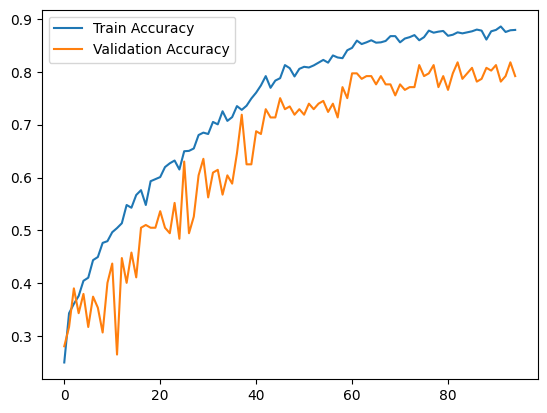

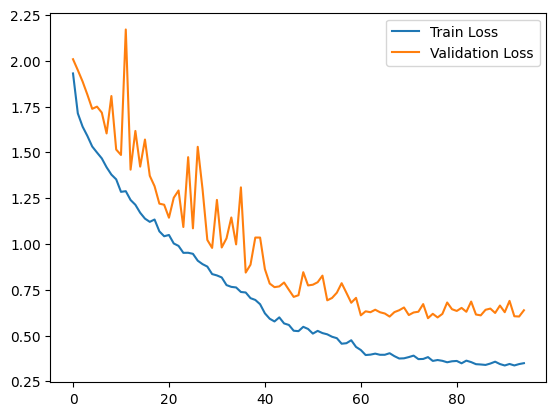

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.show()


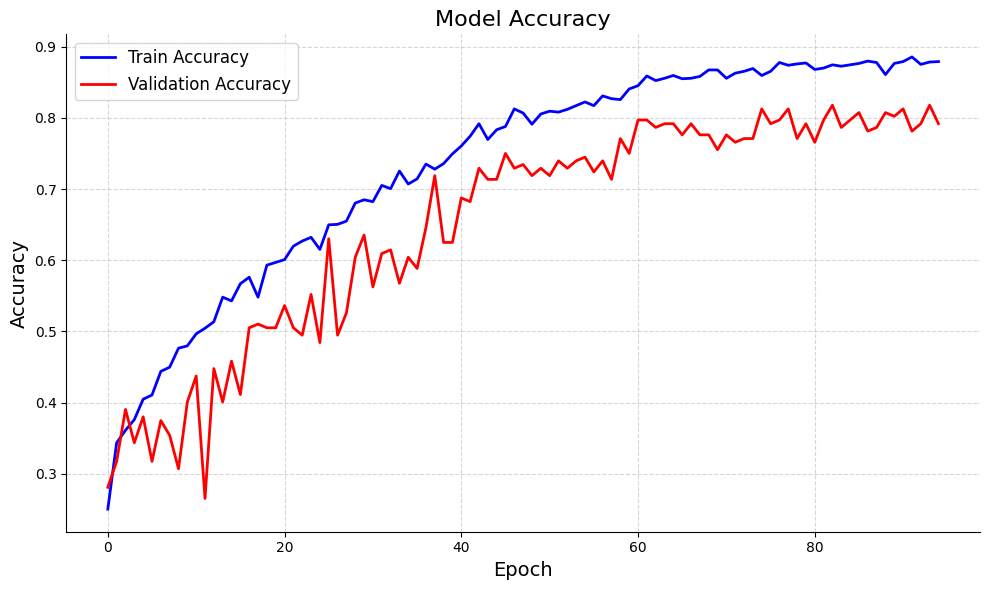

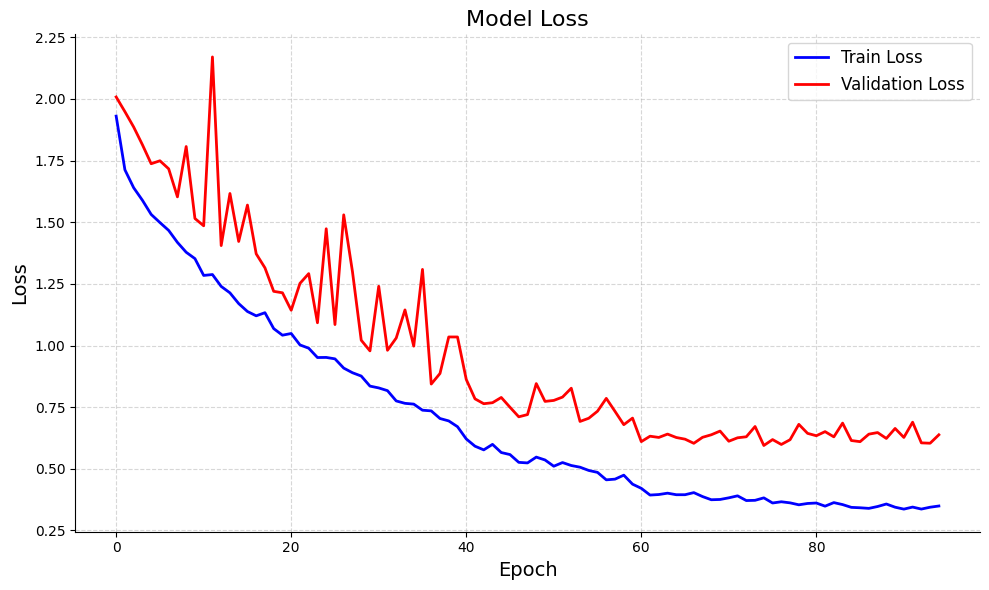

In [ ]:
# Plot Accuracy
plt.figure(figsize=(10, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy', color='blue', linewidth=2)
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', color='red', linewidth=2)
plt.title('Model Accuracy', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.legend(loc='best', fontsize=12)
plt.grid(alpha=0.5, linestyle='--')  # Semi-transparent grid
plt.gca().spines['top'].set_visible(False)  # Hide the top border
plt.gca().spines['right'].set_visible(False)  # Hide the right border
plt.tight_layout()
plt.show()

# Plot Loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss', color='blue', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', color='red', linewidth=2)
plt.title('Model Loss', fontsize=16)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.legend(loc='best', fontsize=12)
plt.grid(alpha=0.5, linestyle='--')  # Semi-transparent grid
plt.gca().spines['top'].set_visible(False)  # Hide the top border
plt.gca().spines['right'].set_visible(False)  # Hide the right border
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
val_predictions = np.argmax(model.predict(val_data), axis=1)
print(confusion_matrix(val_labels, val_predictions))
print(classification_report(val_labels, val_predictions))


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step
[[16  1  1  0  0  1  1  0]
 [ 0 21  2  3  0  0  1  1]
 [ 0  0 24  1  1  0  1  1]
 [ 0  2  2 21  0  0  0  3]
 [ 0  0  0  1 15  0  0  3]
 [ 1  0  0  0  0 19  1  0]
 [ 1  0  1  0  0  0 21  0]
 [ 0  0  0  1  5  0  0 19]]
              precision    recall  f1-score   support

           0       0.89      0.80      0.84        20
           1       0.88      0.75      0.81        28
           2       0.80      0.86      0.83        28
           3       0.78      0.75      0.76        28
           4       0.71      0.79      0.75        19
           5       0.95      0.90      0.93        21
           6       0.84      0.91      0.88        23
           7       0.70      0.76      0.73        25

    accuracy                           0.81       192
   macro avg       0.82      0.82      0.82       192
weighted avg       0.82      0.81      0.81       192



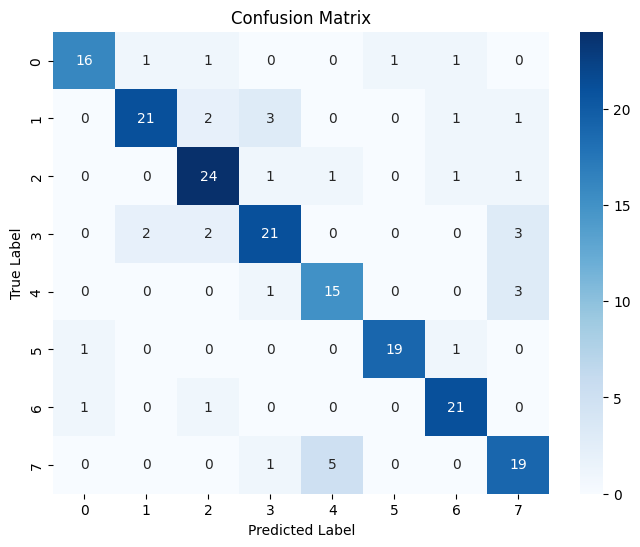

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(val_labels, val_predictions), annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


Evaluating the model on the test set...
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 172ms/step - accuracy: 0.7443 - loss: 0.7968
Test Loss: 0.6588
Test Accuracy: 0.7812

Generating predictions on the test set...
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step

Sample Predictions:
True Label: 5, Predicted Label: 5
True Label: 0, Predicted Label: 0
True Label: 3, Predicted Label: 3
True Label: 5, Predicted Label: 0
True Label: 2, Predicted Label: 7
True Label: 2, Predicted Label: 1
True Label: 6, Predicted Label: 6
True Label: 7, Predicted Label: 7
True Label: 1, Predicted Label: 1
True Label: 1, Predicted Label: 1


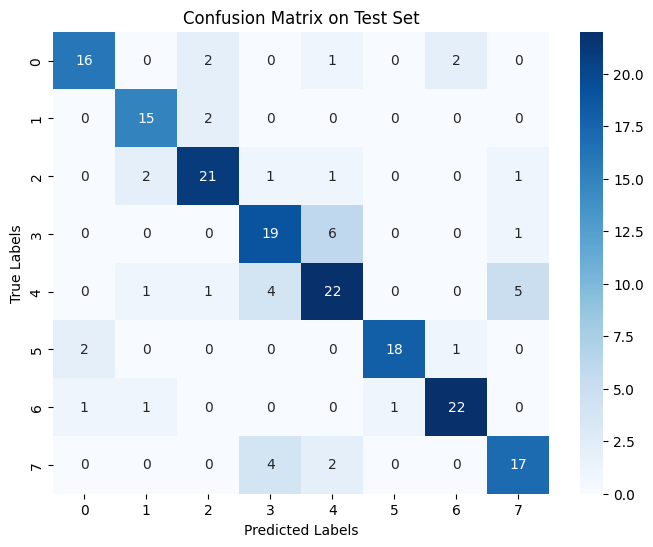


Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.76      0.80        21
           1       0.79      0.88      0.83        17
           2       0.81      0.81      0.81        26
           3       0.68      0.73      0.70        26
           4       0.69      0.67      0.68        33
           5       0.95      0.86      0.90        21
           6       0.88      0.88      0.88        25
           7       0.71      0.74      0.72        23

    accuracy                           0.78       192
   macro avg       0.79      0.79      0.79       192
weighted avg       0.78      0.78      0.78       192



In [ ]:
# 3. Evaluate the model on the test data
print("\nEvaluating the model on the test set...")
test_loss, test_accuracy = model.evaluate(test_data, test_labels_onehot, batch_size=batch_size, verbose=1)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# 4. Generate predictions on the test set
print("\nGenerating predictions on the test set...")
predictions = model.predict(test_data)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_labels_onehot, axis=1)

# 5. Print sample predictions
print("\nSample Predictions:")
for i in range(10):  # Adjust the range if you want to see more examples
    print(f"True Label: {true_classes[i]}, Predicted Label: {predicted_classes[i]}")

# 6. Compute and plot a confusion matrix
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

conf_matrix = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=range(8),
            yticklabels=range(8))
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix on Test Set")
plt.show()

# 7. Print the classification report
print("\nClassification Report:")
print(classification_report(true_classes, predicted_classes))